In [1]:
import sys
import os
sys.path.append('/home/aklantbhowmick/anaconda3/lib/python3.7/site-packages')
sys.path.append('/home/aklantbhowmick/anaconda3/lib/python3.7/site-packages/scalpy/')
sys.path.append('/home/aklantbhowmick/anaconda3/envs/nbodykit-env/lib/python3.6/site-packages/')
import mdot_to_Lbol
import arepo_package
import scipy.interpolate
radiative_efficiency=0.2
total_conv=mdot_to_Lbol.get_conversion_factor_arepo(radiative_efficiency)
import h5py
hubble=0.6771
import scipy.interpolate
from cosmology import *
%pylab inline



def periodic_distance(boxsize,position1,position2):

    diff=position1-position2
    #print(position1,position2)
    if(diff > boxsize/2):
        diff = -(boxsize-diff)
    elif(-diff > boxsize/2):
        diff = (boxsize + diff)
            
    return diff

def get_distances(basePath,desired_redshift):
    GroupPos,output_redshift=arepo_package.get_group_property(basePath,'GroupPos',desired_redshift)
    GroupBHMass,output_redshift=arepo_package.get_group_property(basePath,'GroupBHMass',desired_redshift)
    GroupMass,output_redshift=arepo_package.get_group_property(basePath,'GroupMass',desired_redshift)
    GroupIndices=numpy.arange(0,len(GroupPos))
    GroupWithBHIndices=GroupIndices[GroupBHMass>0]
    distances=[]
    store=0
    Nt=numpy.amin([Nmax,len(GroupWithBHIndices)])
    for current_index in GroupWithBHIndices[0:Nt]:
        BH_Position_group,output_redshift=arepo_package.get_particle_property_within_groups(basePath,'Coordinates',5,desired_redshift,current_index,store_all_offsets=store)
        #DM_Position_group,output_redshift=arepo_package.get_particle_property_within_groups(basePath,'Coordinates',1,desired_redshift,current_index)
        BH_Mass_group,output_redshift=arepo_package.get_particle_property_within_groups(basePath,'BH_Mass',5,desired_redshift,current_index)
        BH_most_massive_position=BH_Position_group[BH_Mass_group==numpy.amax(BH_Mass_group)][0]
        dist_x=arepo_package.periodic_distance(basePath,BH_most_massive_position[0],GroupPos[current_index][0])
        dist_y=arepo_package.periodic_distance(basePath,BH_most_massive_position[1],GroupPos[current_index][1])
        dist_z=arepo_package.periodic_distance(basePath,BH_most_massive_position[2],GroupPos[current_index][2])
        
        distances.append(numpy.sqrt(dist_x*dist_x + dist_y*dist_y + dist_z*dist_z ))
        print(current_index," out of ",len(GroupWithBHIndices)," groups completed")
        #store=0
    distances=numpy.array(distances)
    return distances, (GroupBHMass[GroupBHMass>0])[0:Nt], (GroupMass[GroupBHMass>0])[0:Nt]


def min_dis(box_size,median_position, position):
        pos_1=position-median_position
        pos_2=position-median_position+box_size
        pos_3=position-median_position-box_size

        new_position_options=numpy.array([pos_1,pos_2,pos_3])
        get_minimum_distance=numpy.argmin(numpy.abs(new_position_options))
        #print(new_position_options)

        #print(get_minimum_distance)
        return new_position_options[get_minimum_distance]

vectorized_min_dis = numpy.vectorize(min_dis)



def get_distances2(basePath,desired_redshift,with_bhs=0):
    GroupPos,output_redshift=arepo_package.get_group_property(basePath,'GroupPos',desired_redshift)
    GroupBHMass,output_redshift=arepo_package.get_group_property(basePath,'GroupBHMass',desired_redshift)
    GroupMass,output_redshift=arepo_package.get_group_property(basePath,'GroupMass',desired_redshift)
    GroupIndices=numpy.arange(0,len(GroupPos))
    if(with_bhs):
        GroupWithBHIndices=GroupIndices[GroupBHMass>0]    
    else:
        GroupWithBHIndices=GroupIndices[GroupBHMass==0]
    
    BH_Positions,output_redshift=arepo_package.get_particle_property(basePath,'Coordinates',5,desired_redshift)

    distances=[]
    store=0
    Nt=numpy.amin([Nmax,len(GroupIndices[GroupBHMass>0])])
    ii=0
    for current_index in GroupWithBHIndices[0:Nt]:
        dist_x = vectorized_min_dis(GroupPos[current_index][0],BH_Positions[:,0],arepo_package.get_box_size(basePath))
        dist_y = vectorized_min_dis(GroupPos[current_index][1],BH_Positions[:,1],arepo_package.get_box_size(basePath))
        dist_z = vectorized_min_dis(GroupPos[current_index][2],BH_Positions[:,2],arepo_package.get_box_size(basePath))
        dist = numpy.sqrt(dist_x * dist_x + dist_z * dist_z + dist_y * dist_y)
        distances.append(numpy.amin(dist))
        if(ii%100 == 0):
            print(ii,Nt)
        ii+=1
        
        
        
        
        #store=0
    distances=numpy.array(distances)
    return distances, (GroupBHMass[GroupBHMass>0])[0:Nt], (GroupMass[GroupBHMass>0])[0:Nt]


    
    




Populating the interactive namespace from numpy and matplotlib


In [2]:
redshift_space=numpy.arange(5, 25)
total=[]
total_fof=[]
total_bfof=[]
final_redshift_space=[]

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' 
output = '/output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM4.10_strict_velocity/'
basePath=path_to_output+run+output


for desired_redshift in redshift_space:
    try:
        BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5, desired_redshift)

        GroupLenType,o=arepo_package.get_group_property(basePath,'GroupLenType', desired_redshift,file_format='fof_subfind')
        Group5Type=GroupLenType[:,5]



        total.append(len(BH_Mass))
        total_fof.append(sum(Group5Type))

        final_redshift_space.append(o)
    except:
        aaa=1
total=numpy.array(total)

total_fof=numpy.array(total_fof)
final_redshift_space=numpy.array(final_redshift_space)
    
numpy.save(basePath + 'wandering_BH_statistics.npy',[final_redshift_space,total,total_fof])




Desired redshift:  5
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  6
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  8
Output redshift:  8.012172948865935
Output snapshot:  17
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  10
Output redshift:  9.996590466186332
Output snapshot:  15
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14
Desired redshift:  12
Output redshift:  11.980213315300293
Output snapshot:  13
Desired redshift:  13
Output redshift:  13.002545271070936
Output snapshot:  12
Desired redshift:  14
Output redshift:  14.033992144452485
Output snapshot:  11
Desired redshift:  15
Output redshift:  14.989173240042412
Output snapshot:  10
Desired redshift:  16
Output redshift:  16.005041538113627
Output snapshot:  9
Desired redshift:  17
Output redshift:  16.9999609925

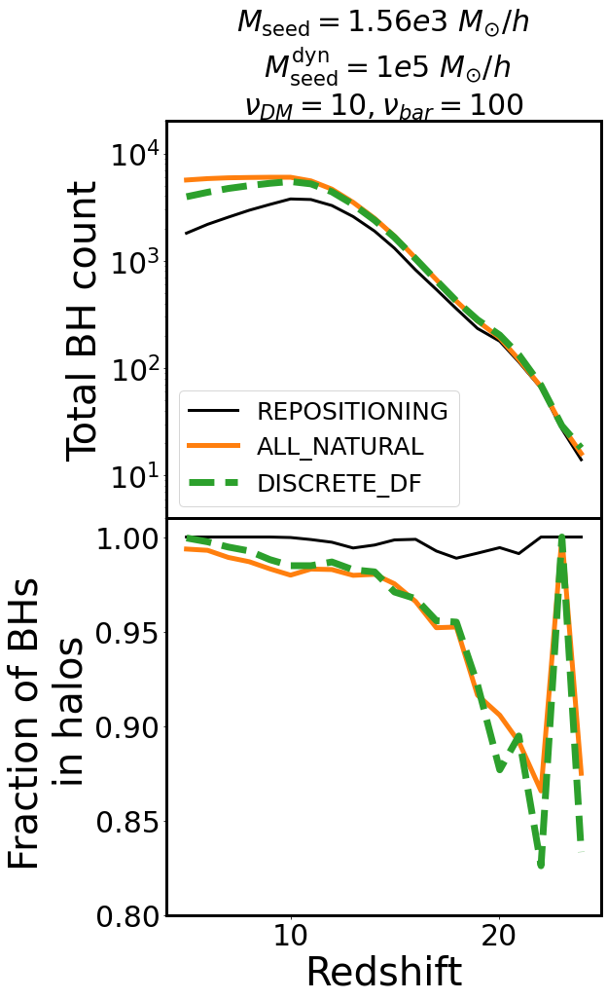

In [53]:

f,ax=plt.subplots(2,1,figsize=(8,15),sharex=True)

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' 
output='/output_ratio1000_SFMFGM5_seed3.19_repositioning/' 
basePath=path_to_output+run+output
cols=['black','C1','C2']
styles=['solid','solid','dashed']
labls = ['REPOSITIONING','ALL_NATURAL','DISCRETE_DF']
widths=[3,5,7]
i=0
for output in ['/output_ratio1000_SFMFGM5_seed3.19_repositioning/','/output_ratio1000_SFMFGM5_seed3.19_HDM5.00_strict_velocity/','/output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM5.00_strict_velocity/']:  
    col=cols[i]
    style=styles[i]
    width=widths[i]
    labl=labls[i]
    
    basePath=path_to_output+run+output
    redshift_space,total,total_fof=numpy.load(basePath + 'wandering_BH_statistics.npy',allow_pickle=True)
    ax[0].errorbar(redshift_space,total,label=labl,color=col,linestyle=style,linewidth=width)
    ax[0].set_yscale('log')
    
    
    ax[1].errorbar(redshift_space,total_fof/total,color=col,linestyle=style,linewidth=width)
    

    
    ax[0].tick_params(labelsize=30)
    ax[1].tick_params(labelsize=30)
    ax[0].set_ylim(4,2e4)
    ax[1].set_ylim(0.80,1.01)
    
    i+=1

    
ax[0].legend(loc='lower left',fontsize=25)

ax[1].set_xlabel('Redshift',fontsize=40)


ax[0].set_ylabel('Total BH count',fontsize=40)
ax[1].set_ylabel('Fraction of BHs \n in halos',fontsize=40)

ax[0].set_title('$M_{\mathrm{seed}}=1.56e3 \ M_{\odot}/h$ \n $M_{\mathrm{seed}}^{\mathrm{dyn}}=1e5 \ M_{\odot}/h$ \n'+r'$\nu_{DM}=10,\nu_{bar} = 100$',fontsize=30)

#ax[0].set_title('$M_{\mathrm{seed}}=1.56e3 \ M_{\odot}/h$',fontsize=30)


plt.subplots_adjust(hspace=0)
    
    
    #ax[1].set_yscale('log')
    
    
for a in ax.flatten():
        a.spines['top'].set_linewidth(3)    # Top axis
        a.spines['bottom'].set_linewidth(3) # Bottom axis
        a.spines['left'].set_linewidth(3)   # Left axis
        a.spines['right'].set_linewidth(3) 
    
    
plt.savefig('./Paper8_figures/wandering_BHs_seed1e5.png',bbox_inches='tight')




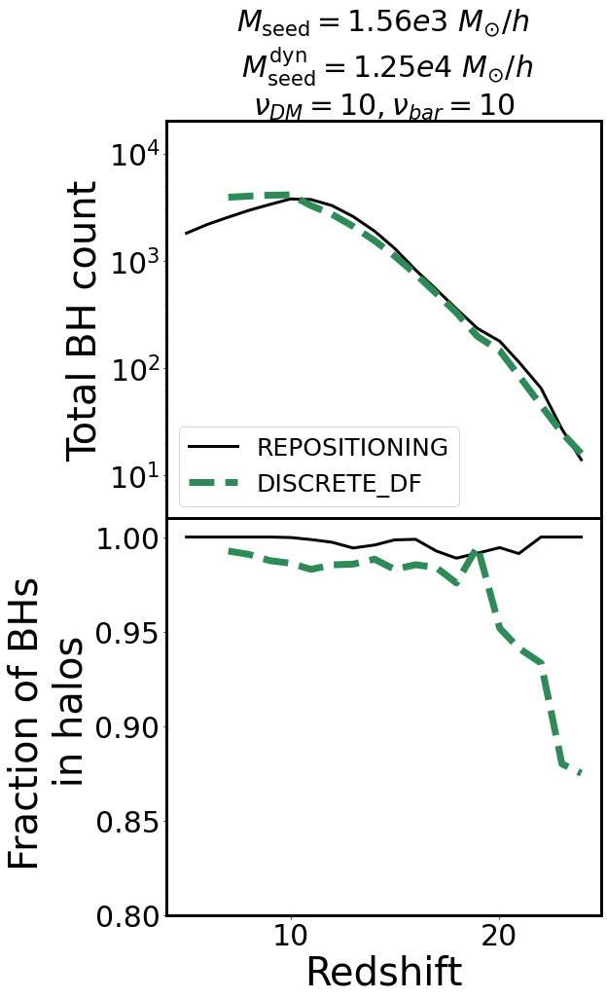

In [54]:

f,ax=plt.subplots(2,1,figsize=(8,15),sharex=True)

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' 
output='/output_ratio1000_SFMFGM5_seed3.19_repositioning/' 
basePath=path_to_output+run+output
cols=['black','C1','C2']
styles=['solid','solid','dashed']
labls = ['REPOSITIONING','ALL_NATURAL','DISCRETE_DF']
widths=[3,5,7]
i=0
for output in ['/output_ratio1000_SFMFGM5_seed3.19_repositioning/','/output_ratio1000_SFMFGM5_seed3.19_HDM5.00_strict_velocity/','/output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM5.00_strict_velocity/'][0:1]:  
    col=cols[i]
    style=styles[i]
    width=widths[i]
    labl=labls[i]
    
    basePath=path_to_output+run+output
    redshift_space,total,total_fof=numpy.load(basePath + 'wandering_BH_statistics.npy',allow_pickle=True)
    ax[0].errorbar(redshift_space,total,label=labl,color=col,linestyle=style,linewidth=width)
    ax[0].set_yscale('log')
    
    
    ax[1].errorbar(redshift_space,total_fof/total,color=col,linestyle=style,linewidth=width)
    

    ax[0].set_ylim(4,2e4)
    ax[1].set_ylim(0.80,1.01)
    
    ax[0].tick_params(labelsize=30)
    ax[1].tick_params(labelsize=30)
    i+=1

    
cols=['seagreen']
labls = ['DISCRETE_DF']

styles=['dashed']

widths=[7]
    
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n1024/AREPO/'    
i=0   
for output in ['/output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM4.10_strict_velocity_gas_res/']:  
    col=cols[i]
    style=styles[i]
    width=widths[i]
    labl=labls[i]
    
    basePath=path_to_output+run+output
    redshift_space,total,total_fof=numpy.load(basePath + 'wandering_BH_statistics.npy',allow_pickle=True)
    ax[0].errorbar(redshift_space[redshift_space>=7],total[redshift_space>=7],label=labl,color=col,linestyle=style,linewidth=width)
    ax[0].set_yscale('log')
    
    
    ax[1].errorbar(redshift_space[redshift_space>=7],(total_fof/total)[redshift_space>=7],color=col,linestyle=style,linewidth=width)
    

    
    ax[0].tick_params(labelsize=30)
    ax[1].tick_params(labelsize=30)
    i+=1
    
'''
cols=['C1'] 
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/'    
i=0   
for output in ['/output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM4.10_strict_velocity/']:  
    col=cols[i]
    style=styles[i]
    width=widths[i]
    labl=labls[i]
    
    basePath=path_to_output+run+output
    redshift_space,total,total_fof=numpy.load(basePath + 'wandering_BH_statistics.npy',allow_pickle=True)
    ax[0].errorbar(redshift_space[redshift_space>=7],total[redshift_space>=7],label=labl,color=col,linestyle=style,linewidth=width)
    ax[0].set_yscale('log')
    
    
    ax[1].errorbar(redshift_space[redshift_space>=7],(total_fof/total)[redshift_space>=7],color=col,linestyle=style,linewidth=width)
    

    
    ax[0].tick_params(labelsize=30)
    ax[1].tick_params(labelsize=30)
    i+=1
'''
    


    
ax[0].legend(loc='lower left',fontsize=25)

ax[1].set_xlabel('Redshift',fontsize=40)


ax[0].set_ylabel('Total BH count',fontsize=40)
ax[1].set_ylabel('Fraction of BHs \n in halos',fontsize=40)

ax[0].set_title('$M_{\mathrm{seed}}=1.56e3 \ M_{\odot}/h$ \n $M_{\mathrm{seed}}^{\mathrm{dyn}}=1.25e4 \ M_{\odot}/h$ \n'+r'$\nu_{DM}=10,\nu_{bar} = 10$',fontsize=30)

#ax[0].set_title('$M_{\mathrm{seed}}=1.56e3 \ M_{\odot}/h$',fontsize=30)


plt.subplots_adjust(hspace=0)
    
    
    #ax[1].set_yscale('log')
    
    
for a in ax.flatten():
        a.spines['top'].set_linewidth(3)    # Top axis
        a.spines['bottom'].set_linewidth(3) # Bottom axis
        a.spines['left'].set_linewidth(3)   # Left axis
        a.spines['right'].set_linewidth(3) 
        
        
plt.savefig('./Paper8_figures/wandering_BHs_seed1.25e4.png',bbox_inches='tight')
    




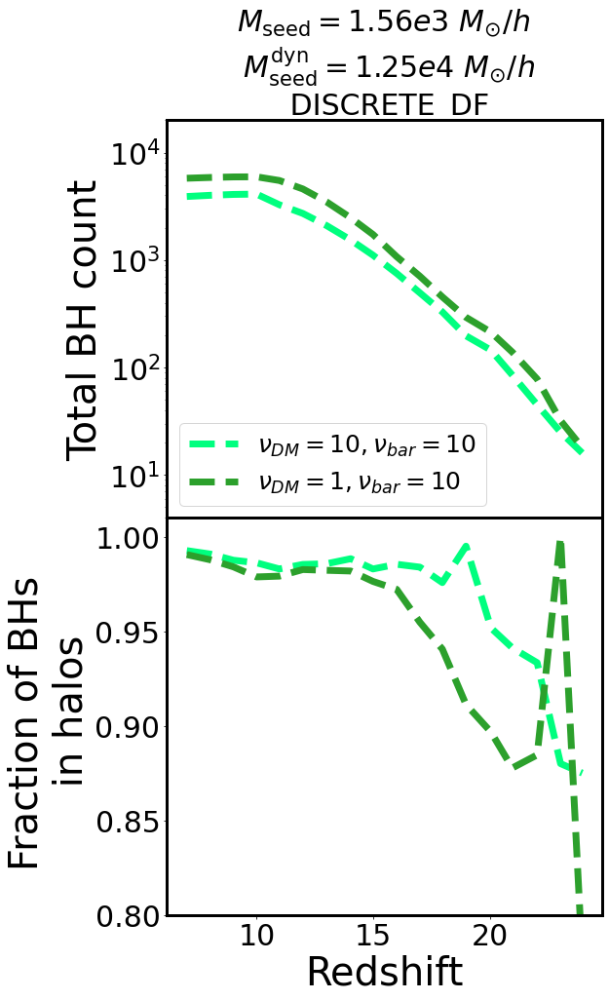

In [55]:

f,ax=plt.subplots(2,1,figsize=(8,15),sharex=True)

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' 
output='/output_ratio1000_SFMFGM5_seed3.19_repositioning/' 
basePath=path_to_output+run+output
cols=['black','C1','C2']
styles=['solid','solid','dashed']
labls = ['REPOSITIONING','ALL_NATURAL','DISCRETE_DF']
widths=[3,5,7]
i=0

'''
for output in ['/output_ratio1000_SFMFGM5_seed3.19_repositioning/','/output_ratio1000_SFMFGM5_seed3.19_HDM5.00_strict_velocity/','/output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM5.00_strict_velocity/'][0:1]:  
    col=cols[i]
    style=styles[i]
    width=widths[i]
    labl=labls[i]
    
    basePath=path_to_output+run+output
    redshift_space,total,total_fof=numpy.load(basePath + 'wandering_BH_statistics.npy',allow_pickle=True)
    ax[0].errorbar(redshift_space,total,label=labl,color=col,linestyle=style,linewidth=width)
    ax[0].set_yscale('log')
    
    
    ax[1].errorbar(redshift_space,total_fof/total,color=col,linestyle=style,linewidth=width)
    

    ax[0].set_ylim(4,2e4)
    ax[1].set_ylim(0.80,1.01)
    
    ax[0].tick_params(labelsize=30)
    ax[1].tick_params(labelsize=30)
    i+=1
'''
    
cols=['springgreen']
labls = [r'$\nu_{DM}=10,\nu_{bar} = 10$']

styles=['dashed']

widths=[7]
    
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n1024/AREPO/'    
i=0   
for output in ['/output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM4.10_strict_velocity_gas_res/']:  
    col=cols[i]
    style=styles[i]
    width=widths[i]
    labl=labls[i]
    
    basePath=path_to_output+run+output
    redshift_space,total,total_fof=numpy.load(basePath + 'wandering_BH_statistics.npy',allow_pickle=True)
    ax[0].errorbar(redshift_space[redshift_space>=7],total[redshift_space>=7],label=labl,color=col,linestyle=style,linewidth=width)
    ax[0].set_yscale('log')
    
    
    ax[1].errorbar(redshift_space[redshift_space>=7],(total_fof/total)[redshift_space>=7],color=col,linestyle=style,linewidth=width)
    

    
    ax[0].tick_params(labelsize=30)
    ax[1].tick_params(labelsize=30)
    

    ax[0].set_ylim(4,2e4)
    ax[1].set_ylim(0.80,1.01)
    i+=1
    

cols=['C2'] 
labls = [r'$\nu_{DM}=1,\nu_{bar} = 10$']
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/'    
i=0   
for output in ['/output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM4.10_strict_velocity/']:  
    col=cols[i]
    style=styles[i]
    width=widths[i]
    labl=labls[i]
    
    basePath=path_to_output+run+output
    redshift_space,total,total_fof=numpy.load(basePath + 'wandering_BH_statistics.npy',allow_pickle=True)
    ax[0].errorbar(redshift_space[redshift_space>=7],total[redshift_space>=7],label=labl,color=col,linestyle=style,linewidth=width)
    ax[0].set_yscale('log')
    
    
    ax[1].errorbar(redshift_space[redshift_space>=7],(total_fof/total)[redshift_space>=7],color=col,linestyle=style,linewidth=width)
    

    
    ax[0].tick_params(labelsize=30)
    ax[1].tick_params(labelsize=30)
    i+=1

    


    
ax[0].legend(loc='lower left',fontsize=25)

ax[1].set_xlabel('Redshift',fontsize=40)


ax[0].set_ylabel('Total BH count',fontsize=40)
ax[1].set_ylabel('Fraction of BHs \n in halos',fontsize=40)

ax[0].set_title('$M_{\mathrm{seed}}=1.56e3 \ M_{\odot}/h$ \n $M_{\mathrm{seed}}^{\mathrm{dyn}}=1.25e4 \ M_{\odot}/h$'+ '\n DISCRETE_DF',fontsize=30)

#ax[0].set_title('$M_{\mathrm{seed}}=1.56e3 \ M_{\odot}/h$',fontsize=30)


plt.subplots_adjust(hspace=0)
    
    
    #ax[1].set_yscale('log')
    
    
for a in ax.flatten():
        a.spines['top'].set_linewidth(3)    # Top axis
        a.spines['bottom'].set_linewidth(3) # Bottom axis
        a.spines['left'].set_linewidth(3)   # Left axis
        a.spines['right'].set_linewidth(3) 
        
        
plt.savefig('./Paper8_figures/wandering_BHs_mass_ratio.png',bbox_inches='tight')
    




In [89]:


def make_plot(labl='',col='blue',softening=1,style='solid',width=4):
    #hubble=0.6771
    velocities1_space=numpy.array([])
    velocities1_DM_only_space=numpy.array([])
    GroupMass1_space=numpy.array([])
    distances1_Min_Pot_space=numpy.array([])
    distances1_Min_Pot_without_BH_space=numpy.array([])
    Nblocks=40

    folder=basePath+'/new_BH_distances_velocities_from_center_mpi_%d/'%desired_redshift
    files = os.listdir(folder)

    # Iterate over each file and load it using numpy.load
    for file_name in files:
        #file_name = 'new_BH_distances_from_center_mpi_%d/block_%d.npy'%(desired_redshift,block)
        distances1, distances1_Min_Pot, distances1_Min_Pot_without_BH, GroupBHMass1,GroupMass1,velocities1, velocities1_DM_only = numpy.load(folder+file_name,allow_pickle=True)
        distances1_Min_Pot_space=numpy.append(distances1_Min_Pot_space,distances1_Min_Pot)
        distances1_Min_Pot_without_BH_space=numpy.append(distances1_Min_Pot_without_BH_space,distances1_Min_Pot_without_BH)
        #print(GroupMass1)
        GroupMass1_space=numpy.append(GroupMass1_space,GroupMass1)
        velocities1_space = numpy.append(velocities1_space,velocities1)
        velocities1_DM_only_space = numpy.append(velocities1_DM_only_space,velocities1_DM_only)
        #GroupMass1_space=numpy.append(GroupMass1_space,GroupMass1)
    centers,HMF,dHMF,norm,counts_sum = arepo_package.get_probability_density(numpy.log10(distances1_Min_Pot_without_BH_space),Nbin,vmax,vmin,linear=1)

    ax[1,i].errorbar(centers,HMF*counts_sum,dHMF*counts_sum,color=col,linewidth=width,linestyle=style)
    #ax[1,1].errorbar(centers-numpy.log10(softening),HMF*counts_sum,dHMF*counts_sum,label=labl,color=col,linewidth=width,linestyle=style)

    centers,HMF,dHMF,norm,counts_sum = arepo_package.get_probability_density(numpy.log10(distances1_Min_Pot_space),Nbin,vmax,vmin,linear=1)

    ax[0,i].errorbar(centers,HMF*counts_sum,dHMF*counts_sum,label=labl,color=col,linewidth=width,linestyle=style)
    #ax[0,1].errorbar(centers-numpy.log10(softening),HMF*counts_sum,dHMF*counts_sum,label=labl,color=col,linewidth=width,linestyle=style)


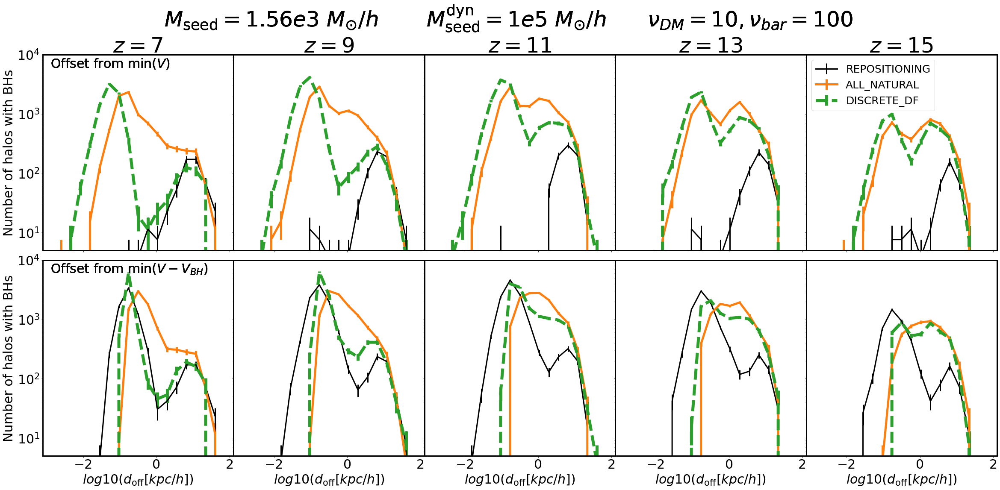

In [87]:
f,ax=plt.subplots(2,5,figsize=(40,16),sharex=True,sharey=True)
i=0
for desired_redshift in [7,9,11,13,15]:
    ax[0,i].set_title('$z=%d$'%desired_redshift,fontsize=50)

    Nbin,vmax,vmin=20,-3,2




    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
    run='/L3p125n512/AREPO/' 
    output='/output_ratio1000_SFMFGM5_seed3.19_repositioning/' 
    basePath=path_to_output+run+output


    make_plot(labl=r'REPOSITIONING',col='black',softening=0.125,width=3)

    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
    run='/L3p125n512/AREPO/' 
    output='/output_ratio1000_SFMFGM5_seed3.19_HDM5.00_strict_velocity/' 
    basePath=path_to_output+run+output

    make_plot(labl=r'ALL_NATURAL',col='C1',softening=0.125,width=5)


    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
    run='/L3p125n512/AREPO/' 
    output='/output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM5.00_strict_velocity/' 
    basePath=path_to_output+run+output


    make_plot(labl=r'DISCRETE_DF',col='C2',softening=0.125,width=7,style='dashed')




    #ax[0].legend(fontsize=30,loc=(0.2,1.01))



    #f.suptitle('$M_{\mathrm{seed}}=1e5 M_{\odot}/h$, $M^{\mathrm{FOF}}_{\mathrm{seed}}=1e7 M_{\odot}/h$',fontsize=40)

    #ax.set_xlim(-10,1.2)
    #ax[0,0].set_yscale('log')
    ax[0,i].set_yscale('log')
    ax[1,i].set_yscale('log')
    #ax[1,1].set_yscale('log')

    ax[0,i].set_ylim(5,10000)
        #ax.set_xscale('log')




    ax[1,i].set_xlabel('$log10(d_{\mathrm{off}}[kpc/h])$',fontsize=30)
    
    


    ax[0,i].tick_params(labelsize=30)
    ax[1,i].tick_params(labelsize=30)


    ax[0,0].text(-2.9,6000,'Offset from $\mathrm{min}(V)$',fontsize=30)
    ax[1,0].text(-2.9,6000,'Offset from $\mathrm{min}(V-V_{BH})$',fontsize=30)
    
    #ax[0,0].text(-2.9,6000,'Offset from $\mathrm{min}(V)$',fontsize=30)    
    tt='$M_{\mathrm{seed}}=1.56e3 \ M_{\odot}/h$       $M_{\mathrm{seed}}^{\mathrm{dyn}}=1e5 \ M_{\odot}/h$      '+r'$\nu_{DM}=10,\nu_{bar} = 100$'   
    ax[0,1].text(-5,30000,tt,fontsize=50) 
    
    #ax[1].legend(loc='lower left',fontsize=22,frameon=False)
    #ax[1].legend(loc='upper left',fontsize=22,frameon=False)
    plt.subplots_adjust(wspace=0,hspace=0.2)

    plt.subplots_adjust(wspace=0,hspace=0.05,top=0.94)


    for a in ax.flatten():
        a.spines['top'].set_linewidth(3)    # Top axis
        a.spines['bottom'].set_linewidth(3) # Bottom axis
        a.spines['left'].set_linewidth(3)   # Left axis
        a.spines['right'].set_linewidth(3) 
    i+=1
ax[0,4].legend(loc='upper left',fontsize=25)
    #plt.savefig('./Paper8_figures/FOF_seed_spatial_distributions_noDF.png',bbox_inches='tight')
ax[0,0].set_ylabel('Number of halos with BHs',fontsize=30)
ax[1,0].set_ylabel('Number of halos with BHs',fontsize=30)


        
plt.savefig('./Paper8_figures/spatial_offsets_seed1e5.png',bbox_inches='tight')

In [189]:


def make_plot(labl='',col='blue',softening=1,style='solid',width=4):
    #hubble=0.6771
    velocities1_space=numpy.array([])
    velocities1_DM_only_space=numpy.array([])
    GroupMass1_space=numpy.array([])
    distances1_Min_Pot_space=numpy.array([])
    distances1_Min_Pot_without_BH_space=numpy.array([])
    Nblocks=40

    folder=basePath+'/new_BH_distances_velocities_from_center_mpi_%d/'%desired_redshift
    files = os.listdir(folder)

    # Iterate over each file and load it using numpy.load
    for file_name in files:
        #file_name = 'new_BH_distances_from_center_mpi_%d/block_%d.npy'%(desired_redshift,block)
        distances1, distances1_Min_Pot, distances1_Min_Pot_without_BH, GroupBHMass1,GroupMass1,velocities1, velocities1_DM_only = numpy.load(folder+file_name,allow_pickle=True)
        distances1_Min_Pot_space=numpy.append(distances1_Min_Pot_space,distances1_Min_Pot)
        distances1_Min_Pot_without_BH_space=numpy.append(distances1_Min_Pot_without_BH_space,distances1_Min_Pot_without_BH)
        #print(GroupMass1)
        GroupMass1_space=numpy.append(GroupMass1_space,GroupMass1)
        velocities1_space = numpy.append(velocities1_space,velocities1)
        velocities1_DM_only_space = numpy.append(velocities1_DM_only_space,velocities1_DM_only)
        #GroupMass1_space=numpy.append(GroupMass1_space,GroupMass1)
    centers,HMF,dHMF,norm,counts_sum = arepo_package.get_probability_density(numpy.log10(distances1_Min_Pot_without_BH_space),Nbin,vmax,vmin,linear=1)

    ax[1].errorbar(centers-numpy.log10(softening),HMF*counts_sum,dHMF*counts_sum,color=col,linewidth=width,linestyle=style)
    #ax[1,1].errorbar(centers-numpy.log10(softening),HMF*counts_sum,dHMF*counts_sum,label=labl,color=col,linewidth=width,linestyle=style)

    centers,HMF,dHMF,norm,counts_sum = arepo_package.get_probability_density(numpy.log10(distances1_Min_Pot_space),Nbin,vmax,vmin,linear=1)

    ax[0].errorbar(centers-numpy.log10(softening),HMF*counts_sum,dHMF*counts_sum,label=labl,color=col,linewidth=width,linestyle=style)
    #ax[0,1].errorbar(centers-numpy.log10(softening),HMF*counts_sum,dHMF*counts_sum,label=labl,color=col,linewidth=width,linestyle=style)


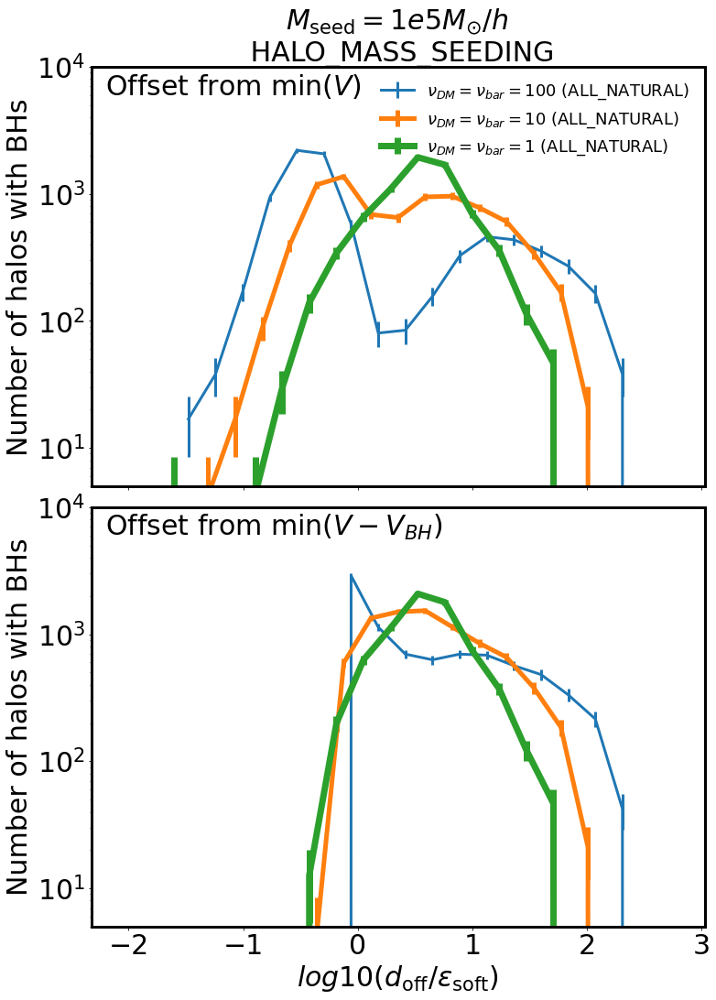

In [196]:
f,ax=plt.subplots(2,1,figsize=(12,16),sharex=True,sharey=True)
i=0
for desired_redshift in [11]:
    #ax[0].set_title('$z=%d$'%desired_redshift,fontsize=0)

    Nbin,vmax,vmin=20,-2.5,2




    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
    run='/L3p125n1024/AREPO/' 
    output='/output_FOF_7_5.00_strict_velocity_gas_res' 
    basePath=path_to_output+run+output


    make_plot(labl=r'$\nu_{DM}=\nu_{bar}= 100$ (ALL_NATURAL)',col='C0',softening=0.125,width=3)

    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
    run='/L3p125n512/AREPO/' 
    output='/output_FOF_7_5.00_strict_velocity_gas_res' 
    basePath=path_to_output+run+output

    make_plot(labl=r'$\nu_{DM}=\nu_{bar}= 10$ (ALL_NATURAL)',col='C1',softening=0.25,width=5)


    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
    run='/L3p125n256/AREPO/' 
    output='/output_FOF_7_5.00_strict_velocity_gas_res' 
    basePath=path_to_output+run+output


    make_plot(labl=r'$\nu_{DM}=\nu_{bar}= 1$ (ALL_NATURAL)',col='C2',softening=0.5,width=7)




    #ax[0].legend(fontsize=30,loc=(0.2,1.01))



    #f.suptitle('$M_{\mathrm{seed}}=1e5 M_{\odot}/h$, $M^{\mathrm{FOF}}_{\mathrm{seed}}=1e7 M_{\odot}/h$',fontsize=40)

    #ax.set_xlim(-10,1.2)
    #ax[0,0].set_yscale('log')
    ax[0].set_yscale('log')
    ax[1].set_yscale('log')
    #ax[1,1].set_yscale('log')

    ax[0].set_ylim(5,10000)
        #ax.set_xscale('log')




    ax[1].set_xlabel('$log10(d_{\mathrm{off}}/\epsilon_{\mathrm{soft}})$',fontsize=30)
    
    


    ax[0].tick_params(labelsize=30)
    ax[1].tick_params(labelsize=30)


    ax[0].text(-2.2,6000,'Offset from $\mathrm{min}(V)$',fontsize=30)
    ax[1].text(-2.2,6000,'Offset from $\mathrm{min}(V-V_{BH})$',fontsize=30)
    
    #ax[0,0].text(-2.9,6000,'Offset from $\mathrm{min}(V)$',fontsize=30)    
    tt='$M_{\mathrm{seed}}=1e5 M_{\odot}/h$ \n HALO_MASS_SEEDING'   
    ax[0].set_title(tt,fontsize=30) 
    
    #ax[1].legend(loc='lower left',fontsize=22,frameon=False)
    #ax[1].legend(loc='upper left',fontsize=22,frameon=False)
    plt.subplots_adjust(wspace=0,hspace=0.2)

    plt.subplots_adjust(wspace=0,hspace=0.05,top=0.94)


    for a in ax.flatten():
        a.spines['top'].set_linewidth(3)    # Top axis
        a.spines['bottom'].set_linewidth(3) # Bottom axis
        a.spines['left'].set_linewidth(3)   # Left axis
        a.spines['right'].set_linewidth(3) 
    i+=1
ax[0].legend(loc='upper right',fontsize=18,frameon=False)
    #plt.savefig('./Paper8_figures/FOF_seed_spatial_distributions_noDF.png',bbox_inches='tight')
ax[0].set_ylabel('Number of halos with BHs',fontsize=30)
ax[1].set_ylabel('Number of halos with BHs',fontsize=30)


        
plt.savefig('./Paper8_figures/spatial_offsets_seed1e5_FOF.png',bbox_inches='tight')

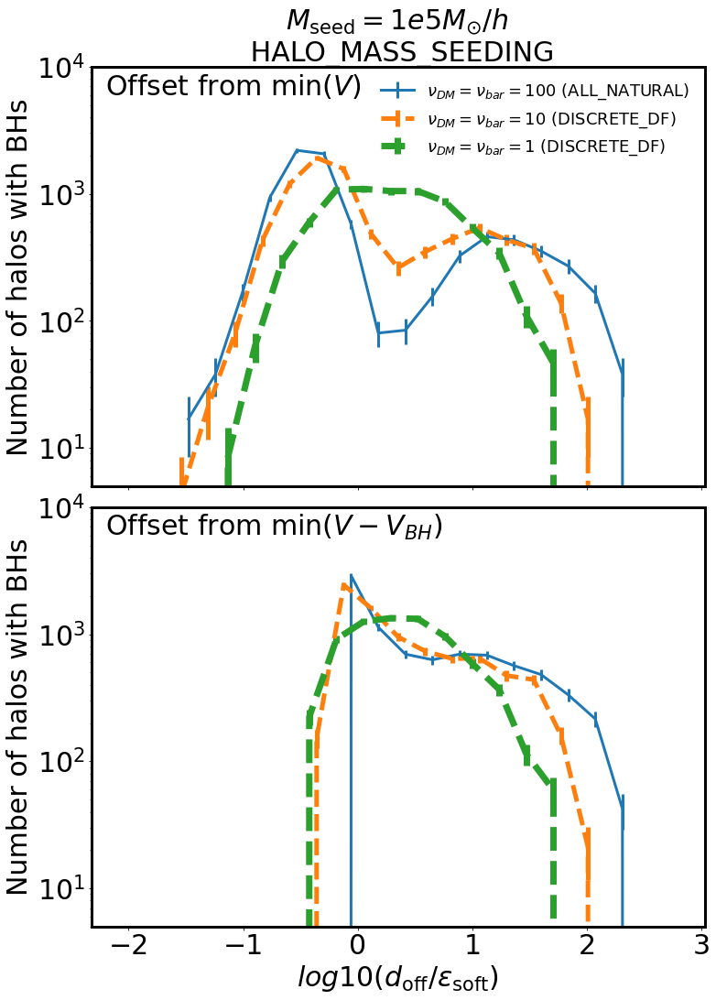

In [192]:
f,ax=plt.subplots(2,1,figsize=(12,16),sharex=True,sharey=True)
i=0
for desired_redshift in [11]:
    #ax[0].set_title('$z=%d$'%desired_redshift,fontsize=0)

    Nbin,vmax,vmin=20,-2.5,2




    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
    run='/L3p125n1024/AREPO/' 
    output='/output_FOF_7_5.00_strict_velocity_gas_res' 
    basePath=path_to_output+run+output


    make_plot(labl=r'$\nu_{DM}=\nu_{bar}= 100$ (ALL_NATURAL)',col='C0',softening=0.125,width=3)

    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
    run='/L3p125n512/AREPO/' 
    output='/output_FOF_7_5.00_discreteDF_strict_velocity_gas_res' 
    basePath=path_to_output+run+output

    make_plot(labl=r'$\nu_{DM}=\nu_{bar}= 10$ (DISCRETE_DF)' ,col='C1',softening=0.25,width=5,style='dashed')


    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
    run='/L3p125n256/AREPO/' 
    output='/output_FOF_7_5.00_discreteDF_strict_velocity_gas_res' 
    basePath=path_to_output+run+output


    make_plot(labl=r'$\nu_{DM}=\nu_{bar}= 1$ (DISCRETE_DF)',col='C2',softening=0.5,width=7,style='dashed')




    #ax[0].legend(fontsize=30,loc=(0.2,1.01))



    #f.suptitle('$M_{\mathrm{seed}}=1e5 M_{\odot}/h$, $M^{\mathrm{FOF}}_{\mathrm{seed}}=1e7 M_{\odot}/h$',fontsize=40)

    #ax.set_xlim(-10,1.2)
    #ax[0,0].set_yscale('log')
    ax[0].set_yscale('log')
    ax[1].set_yscale('log')
    #ax[1,1].set_yscale('log')

    ax[0].set_ylim(5,10000)
        #ax.set_xscale('log')




    ax[1].set_xlabel('$log10(d_{\mathrm{off}}/\epsilon_{\mathrm{soft}})$',fontsize=30)
    
    


    ax[0].tick_params(labelsize=30)
    ax[1].tick_params(labelsize=30)


    ax[0].text(-2.2,6000,'Offset from $\mathrm{min}(V)$',fontsize=30)
    ax[1].text(-2.2,6000,'Offset from $\mathrm{min}(V-V_{BH})$',fontsize=30)
    
    #ax[0,0].text(-2.9,6000,'Offset from $\mathrm{min}(V)$',fontsize=30)    
    tt='$M_{\mathrm{seed}}=1e5 M_{\odot}/h$ \n HALO_MASS_SEEDING'   
    ax[0].set_title(tt,fontsize=30) 
    
    #ax[1].legend(loc='lower left',fontsize=22,frameon=False)
    #ax[1].legend(loc='upper left',fontsize=22,frameon=False)
    plt.subplots_adjust(wspace=0,hspace=0.2)

    plt.subplots_adjust(wspace=0,hspace=0.05,top=0.94)


    for a in ax.flatten():
        a.spines['top'].set_linewidth(3)    # Top axis
        a.spines['bottom'].set_linewidth(3) # Bottom axis
        a.spines['left'].set_linewidth(3)   # Left axis
        a.spines['right'].set_linewidth(3) 
    i+=1
ax[0].legend(loc='upper right',fontsize=18,frameon=False)
    #plt.savefig('./Paper8_figures/FOF_seed_spatial_distributions_noDF.png',bbox_inches='tight')
ax[0].set_ylabel('Number of halos with BHs',fontsize=30)
ax[1].set_ylabel('Number of halos with BHs',fontsize=30)


        
plt.savefig('./Paper8_figures/spatial_offsets_seed1e5_FOF_DF.png',bbox_inches='tight')

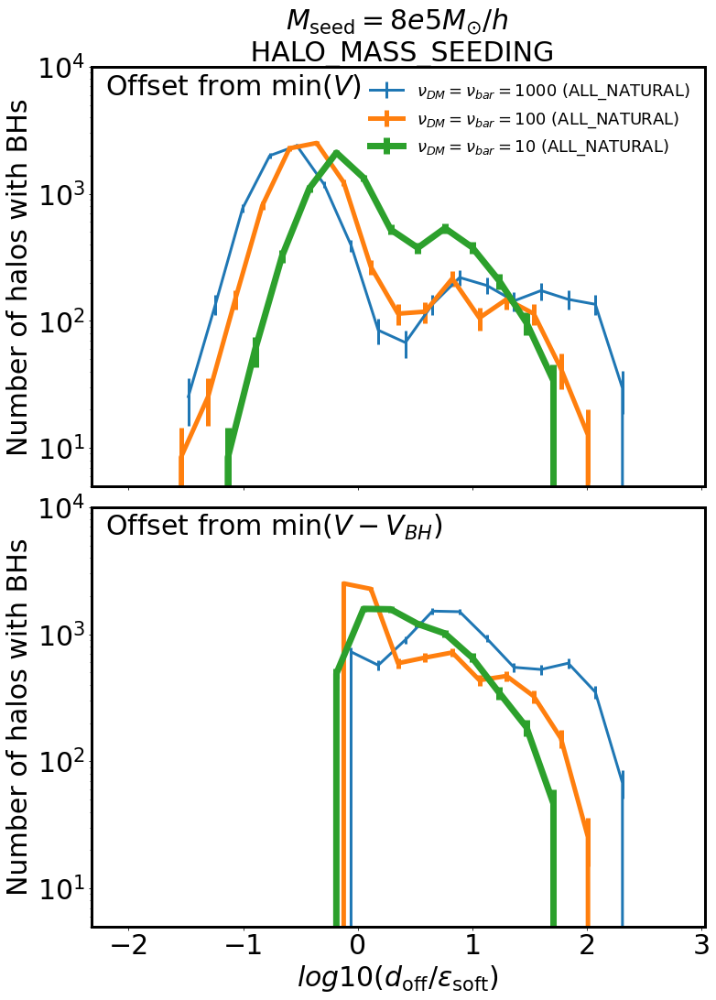

In [193]:
f,ax=plt.subplots(2,1,figsize=(12,16),sharex=True,sharey=True)
i=0
for desired_redshift in [11]:
    #ax[0].set_title('$z=%d$'%desired_redshift,fontsize=0)

    Nbin,vmax,vmin=20,-2.5,2




    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
    run='/L3p125n1024/AREPO/' 
    output='/output_FOF_7_5.90_strict_velocity_gas_res' 
    basePath=path_to_output+run+output


    make_plot(labl=r'$\nu_{DM}=\nu_{bar}= 1000$ (ALL_NATURAL)',col='C0',softening=0.125,width=3)

    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
    run='/L3p125n512/AREPO/' 
    output='/output_FOF_7_5.90_strict_velocity_gas_res' 
    basePath=path_to_output+run+output

    make_plot(labl=r'$\nu_{DM}=\nu_{bar}= 100$ (ALL_NATURAL)',col='C1',softening=0.25,width=5)


    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
    run='/L3p125n256/AREPO/' 
    output='/output_FOF_7_5.90_strict_velocity_gas_res' 
    basePath=path_to_output+run+output


    make_plot(labl=r'$\nu_{DM}=\nu_{bar}= 10$ (ALL_NATURAL)',col='C2',softening=0.5,width=7)




    #ax[0].legend(fontsize=30,loc=(0.2,1.01))



    #f.suptitle('$M_{\mathrm{seed}}=1e5 M_{\odot}/h$, $M^{\mathrm{FOF}}_{\mathrm{seed}}=1e7 M_{\odot}/h$',fontsize=40)

    #ax.set_xlim(-10,1.2)
    #ax[0,0].set_yscale('log')
    ax[0].set_yscale('log')
    ax[1].set_yscale('log')
    #ax[1,1].set_yscale('log')

    ax[0].set_ylim(5,10000)
        #ax.set_xscale('log')




    ax[1].set_xlabel('$log10(d_{\mathrm{off}}/\epsilon_{\mathrm{soft}})$',fontsize=30)
    
    


    ax[0].tick_params(labelsize=30)
    ax[1].tick_params(labelsize=30)


    ax[0].text(-2.2,6000,'Offset from $\mathrm{min}(V)$',fontsize=30)
    ax[1].text(-2.2,6000,'Offset from $\mathrm{min}(V-V_{BH})$',fontsize=30)
    
    #ax[0,0].text(-2.9,6000,'Offset from $\mathrm{min}(V)$',fontsize=30)    
    tt='$M_{\mathrm{seed}}=8e5 M_{\odot}/h$ \n HALO_MASS_SEEDING'   
    ax[0].set_title(tt,fontsize=30) 
    
    #ax[1].legend(loc='lower left',fontsize=22,frameon=False)
    #ax[1].legend(loc='upper left',fontsize=22,frameon=False)
    plt.subplots_adjust(wspace=0,hspace=0.2)

    plt.subplots_adjust(wspace=0,hspace=0.05,top=0.94)


    for a in ax.flatten():
        a.spines['top'].set_linewidth(3)    # Top axis
        a.spines['bottom'].set_linewidth(3) # Bottom axis
        a.spines['left'].set_linewidth(3)   # Left axis
        a.spines['right'].set_linewidth(3) 
    i+=1
ax[0].legend(loc='upper right',fontsize=18,frameon=False)
    #plt.savefig('./Paper8_figures/FOF_seed_spatial_distributions_noDF.png',bbox_inches='tight')
ax[0].set_ylabel('Number of halos with BHs',fontsize=30)
ax[1].set_ylabel('Number of halos with BHs',fontsize=30)


        
plt.savefig('./Paper8_figures/spatial_offsets_seed8e5_FOF.png',bbox_inches='tight')

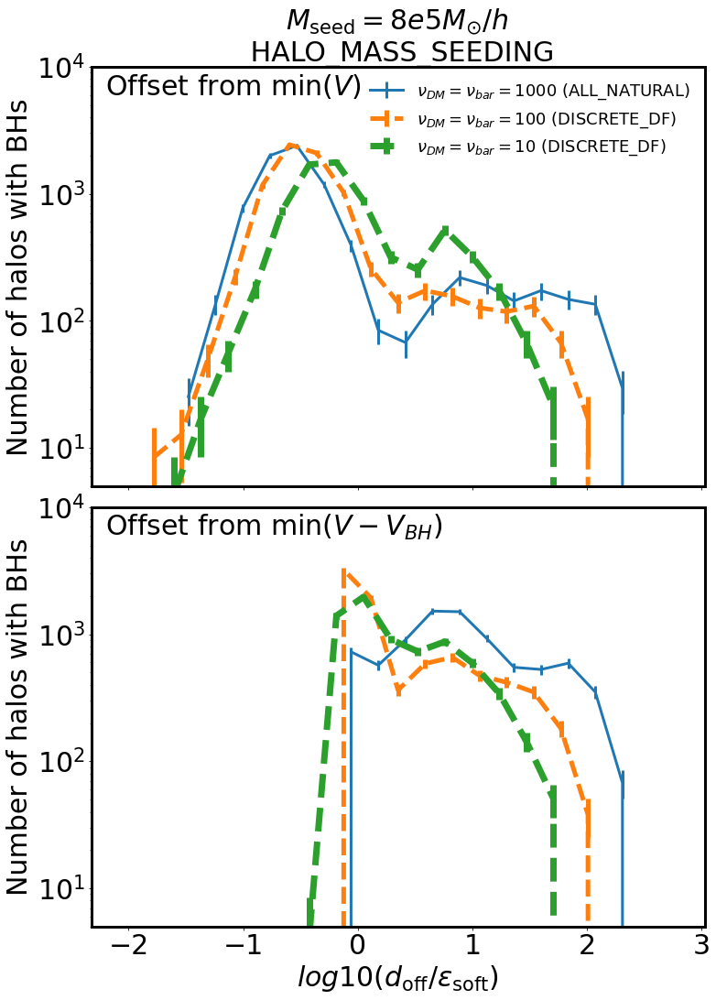

In [195]:
f,ax=plt.subplots(2,1,figsize=(12,16),sharex=True,sharey=True)
i=0
for desired_redshift in [11]:
    #ax[0].set_title('$z=%d$'%desired_redshift,fontsize=0)

    Nbin,vmax,vmin=20,-2.5,2




    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
    run='/L3p125n1024/AREPO/' 
    output='/output_FOF_7_5.90_strict_velocity_gas_res' 
    basePath=path_to_output+run+output


    make_plot(labl=r'$\nu_{DM}=\nu_{bar}= 1000$ (ALL_NATURAL)',col='C0',softening=0.125,width=3)

    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
    run='/L3p125n512/AREPO/' 
    output='/output_FOF_7_5.90_discreteDF_strict_velocity_gas_res' 
    basePath=path_to_output+run+output

    make_plot(labl=r'$\nu_{DM}=\nu_{bar}= 100$ (DISCRETE_DF)',col='C1',softening=0.25,width=5,style='dashed')


    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
    run='/L3p125n256/AREPO/' 
    output='/output_FOF_7_5.90_discreteDF_strict_velocity_gas_res' 
    basePath=path_to_output+run+output


    make_plot(labl=r'$\nu_{DM}=\nu_{bar}= 10$ (DISCRETE_DF)',col='C2',softening=0.5,width=7,style='dashed')




    #ax[0].legend(fontsize=30,loc=(0.2,1.01))



    #f.suptitle('$M_{\mathrm{seed}}=1e5 M_{\odot}/h$, $M^{\mathrm{FOF}}_{\mathrm{seed}}=1e7 M_{\odot}/h$',fontsize=40)

    #ax.set_xlim(-10,1.2)
    #ax[0,0].set_yscale('log')
    ax[0].set_yscale('log')
    ax[1].set_yscale('log')
    #ax[1,1].set_yscale('log')

    ax[0].set_ylim(5,10000)
        #ax.set_xscale('log')




    ax[1].set_xlabel('$log10(d_{\mathrm{off}}/\epsilon_{\mathrm{soft}})$',fontsize=30)
    
    


    ax[0].tick_params(labelsize=30)
    ax[1].tick_params(labelsize=30)


    ax[0].text(-2.2,6000,'Offset from $\mathrm{min}(V)$',fontsize=30)
    ax[1].text(-2.2,6000,'Offset from $\mathrm{min}(V-V_{BH})$',fontsize=30)
    
    #ax[0,0].text(-2.9,6000,'Offset from $\mathrm{min}(V)$',fontsize=30)    
    tt='$M_{\mathrm{seed}}=8e5 M_{\odot}/h$ \n HALO_MASS_SEEDING'   
    ax[0].set_title(tt,fontsize=30) 
    
    #ax[1].legend(loc='lower left',fontsize=22,frameon=False)
    #ax[1].legend(loc='upper left',fontsize=22,frameon=False)
    plt.subplots_adjust(wspace=0,hspace=0.2)

    plt.subplots_adjust(wspace=0,hspace=0.05,top=0.94)


    for a in ax.flatten():
        a.spines['top'].set_linewidth(3)    # Top axis
        a.spines['bottom'].set_linewidth(3) # Bottom axis
        a.spines['left'].set_linewidth(3)   # Left axis
        a.spines['right'].set_linewidth(3) 
    i+=1
ax[0].legend(loc='upper right',fontsize=18,frameon=False)
    #plt.savefig('./Paper8_figures/FOF_seed_spatial_distributions_noDF.png',bbox_inches='tight')
ax[0].set_ylabel('Number of halos with BHs',fontsize=30)
ax[1].set_ylabel('Number of halos with BHs',fontsize=30)


        
plt.savefig('./Paper8_figures/spatial_offsets_seed8e5_FOF_DF.png',bbox_inches='tight')

In [164]:


def make_plot(labl='',col='blue',softening=1,style='solid',width=4):
    #hubble=0.6771
    velocities1_space=numpy.array([])
    velocities1_DM_only_space=numpy.array([])
    GroupMass1_space=numpy.array([])
    distances1_Min_Pot_space=numpy.array([])
    distances1_Min_Pot_without_BH_space=numpy.array([])
    Nblocks=40

    folder=basePath+'/new_BH_distances_velocities_from_center_mpi_%d/'%desired_redshift
    files = os.listdir(folder)

    # Iterate over each file and load it using numpy.load
    for file_name in files:
        #file_name = 'new_BH_distances_from_center_mpi_%d/block_%d.npy'%(desired_redshift,block)
        distances1, distances1_Min_Pot, distances1_Min_Pot_without_BH, GroupBHMass1,GroupMass1,velocities1, velocities1_DM_only = numpy.load(folder+file_name,allow_pickle=True)
        distances1_Min_Pot_space=numpy.append(distances1_Min_Pot_space,distances1_Min_Pot)
        distances1_Min_Pot_without_BH_space=numpy.append(distances1_Min_Pot_without_BH_space,distances1_Min_Pot_without_BH)
        #print(GroupMass1)
        GroupMass1_space=numpy.append(GroupMass1_space,GroupMass1)
        velocities1_space = numpy.append(velocities1_space,velocities1)
        velocities1_DM_only_space = numpy.append(velocities1_DM_only_space,velocities1_DM_only)
        #GroupMass1_space=numpy.append(GroupMass1_space,GroupMass1)
    centers,HMF,dHMF,norm,counts_sum = arepo_package.get_probability_density(numpy.log10(velocities1_DM_only_space),Nbin,vmax,vmin,linear=1)

    ax.errorbar(centers,HMF*counts_sum,dHMF*counts_sum,color=col,linewidth=width,linestyle=style,label=labl)
    #ax[1,1].errorbar(centers-numpy.log10(softening),HMF*counts_sum,dHMF*counts_sum,label=labl,color=col,linewidth=width,linestyle=style)

   # centers,HMF,dHMF,norm,counts_sum = arepo_package.get_probability_density(numpy.log10(distances1_Min_Pot_space),Nbin,vmax,vmin,linear=1)

    #ax[0].errorbar(centers,HMF*counts_sum,dHMF*counts_sum,label=labl,color=col,linewidth=width,linestyle=style)
    #ax[0,1].errorbar(centers-numpy.log10(softening),HMF*counts_sum,dHMF*counts_sum,label=labl,color=col,linewidth=width,linestyle=style)


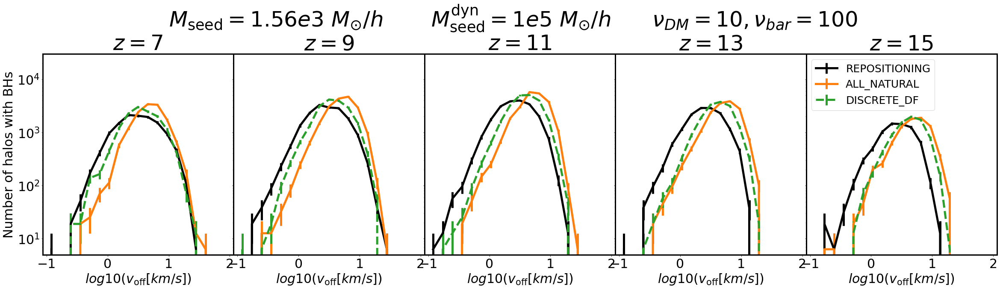

In [165]:



f,axx=plt.subplots(1,5,figsize=(40,8),sharex=True,sharey=True)
i=0
for desired_redshift in [7,9,11,13,15]:
    ax=axx[i]
    ax.set_title('$z=%d$'%desired_redshift,fontsize=50)
    Nbin,vmax,vmin=20,-1,2



    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
    run='/L3p125n512/AREPO/' 
    output='/output_ratio1000_SFMFGM5_seed3.19_repositioning/' 
    basePath=path_to_output+run+output


    make_plot(labl=r'REPOSITIONING',col='black',softening=0.125,width=5)

    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
    run='/L3p125n512/AREPO/' 
    output='/output_ratio1000_SFMFGM5_seed3.19_HDM5.00_strict_velocity/' 
    basePath=path_to_output+run+output

    make_plot(labl=r'ALL_NATURAL',col='C1',softening=0.125,width=5)


    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
    run='/L3p125n512/AREPO/' 
    output='/output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM5.00_strict_velocity/' 
    basePath=path_to_output+run+output


    make_plot(labl=r'DISCRETE_DF',col='C2',softening=0.125,width=5,style='dashed')








    #f.suptitle('$M_{\mathrm{seed}}=1e5 M_{\odot}/h$, $M^{\mathrm{FOF}}_{\mathrm{seed}}=1e7 M_{\odot}/h$',fontsize=40)

    #ax.set_xlim(-10,1.2)
    #ax[0,0].set_yscale('log')
    ax.set_yscale('log')
    ax.set_yscale('log')
    #ax[1,1].set_yscale('log')

    ax.set_ylim(5,30000)
        #ax.set_xscale('log')

    


    ax.set_xlabel('$log10(v_{\mathrm{off}}[km/s])$',fontsize=30)


    ax.tick_params(labelsize=30)



    plt.subplots_adjust(wspace=0,hspace=0.2)

    plt.subplots_adjust(wspace=0,hspace=0.05,top=0.94)


    for a in [ax]:
        a.spines['top'].set_linewidth(3)    # Top axis
        a.spines['bottom'].set_linewidth(3) # Bottom axis
        a.spines['left'].set_linewidth(3)   # Left axis
        a.spines['right'].set_linewidth(3) 
    i+=1
    #plt.savefig('./Paper8_figures/FOF_seed_spatial_distributions_noDF.png',bbox_inches='tight')

    
axx[4].legend(loc='upper left',fontsize=25)    
axx[0].set_ylabel('Number of halos with BHs',fontsize=30)
axx[3].legend(fontsize=30,loc=(1.01,0.3))

tt='$M_{\mathrm{seed}}=1.56e3 \ M_{\odot}/h$       $M_{\mathrm{seed}}^{\mathrm{dyn}}=1e5 \ M_{\odot}/h$      '+r'$\nu_{DM}=10,\nu_{bar} = 100$'   
axx[0].text(1,100000,tt,fontsize=50) 
 

        
plt.savefig('./Paper8_figures/velocity_offsets_seed1e5.png',bbox_inches='tight')

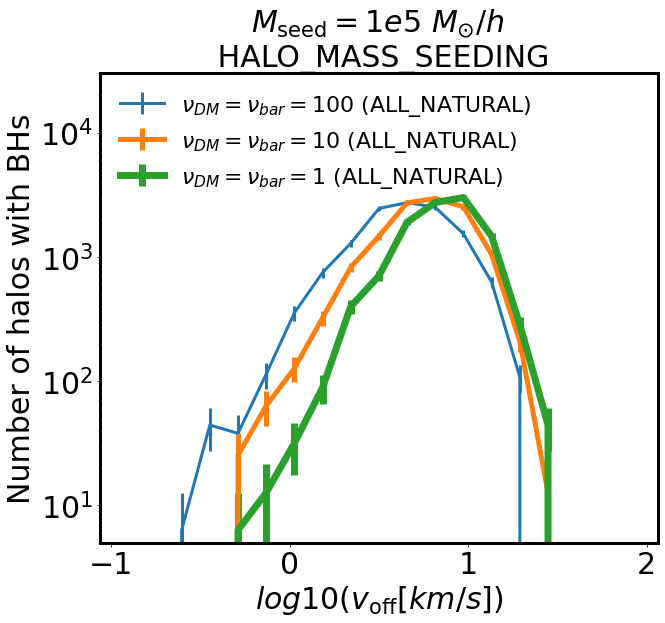

In [178]:



f,axx=plt.subplots(1,1,figsize=(10,8),sharex=True,sharey=True)
i=0
for desired_redshift in [11]:
    ax=axx
    ax.set_title('$z=%d$'%desired_redshift,fontsize=50)
    Nbin,vmax,vmin=20,-1,2


    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
    run='/L3p125n1024/AREPO/' 
    output='/output_FOF_7_5.00_strict_velocity_gas_res' 
    basePath=path_to_output+run+output


    make_plot(labl=r'$\nu_{DM}=\nu_{bar}= 100$ (ALL_NATURAL)',col='C0',softening=0.125,width=3)

    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
    run='/L3p125n512/AREPO/' 
    output='/output_FOF_7_5.00_strict_velocity_gas_res' 
    basePath=path_to_output+run+output

    make_plot(labl=r'$\nu_{DM}=\nu_{bar}= 10$ (ALL_NATURAL)',col='C1',softening=0.25,width=5)


    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
    run='/L3p125n256/AREPO/' 
    output='/output_FOF_7_5.00_strict_velocity_gas_res' 
    basePath=path_to_output+run+output


    make_plot(labl=r'$\nu_{DM}=\nu_{bar}= 1$ (ALL_NATURAL)',col='C2',softening=0.5,width=7)








    #f.suptitle('$M_{\mathrm{seed}}=1e5 M_{\odot}/h$, $M^{\mathrm{FOF}}_{\mathrm{seed}}=1e7 M_{\odot}/h$',fontsize=40)

    #ax.set_xlim(-10,1.2)
    #ax[0,0].set_yscale('log')
    ax.set_yscale('log')
    ax.set_yscale('log')
    #ax[1,1].set_yscale('log')

    ax.set_ylim(5,30000)
        #ax.set_xscale('log')

    


    ax.set_xlabel('$log10(v_{\mathrm{off}}[km/s])$',fontsize=30)


    ax.tick_params(labelsize=30)



    plt.subplots_adjust(wspace=0,hspace=0.2)

    plt.subplots_adjust(wspace=0,hspace=0.05,top=0.94)


    for a in [ax]:
        a.spines['top'].set_linewidth(3)    # Top axis
        a.spines['bottom'].set_linewidth(3) # Bottom axis
        a.spines['left'].set_linewidth(3)   # Left axis
        a.spines['right'].set_linewidth(3) 
    i+=1
    #plt.savefig('./Paper8_figures/FOF_seed_spatial_distributions_noDF.png',bbox_inches='tight')

    
 
axx.set_ylabel('Number of halos with BHs',fontsize=30)
axx.legend(fontsize=22,loc='upper left',frameon=False)

tt='$M_{\mathrm{seed}}=1e5 \ M_{\odot}/h$ \n HALO_MASS_SEEDING'   
axx.set_title(tt,fontsize=30) 

        
plt.savefig('./Paper8_figures/velocity_offsets_seed1e5_FOF.png',bbox_inches='tight')

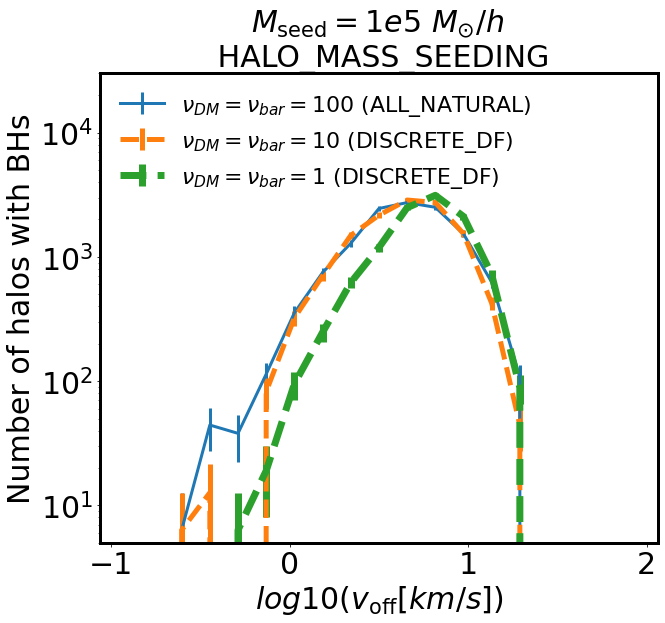

In [181]:



f,axx=plt.subplots(1,1,figsize=(10,8),sharex=True,sharey=True)
i=0
for desired_redshift in [11]:
    ax=axx
    ax.set_title('$z=%d$'%desired_redshift,fontsize=50)
    Nbin,vmax,vmin=20,-1,2


    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
    run='/L3p125n1024/AREPO/' 
    output='/output_FOF_7_5.00_strict_velocity_gas_res' 
    basePath=path_to_output+run+output


    make_plot(labl=r'$\nu_{DM}=\nu_{bar}= 100$ (ALL_NATURAL)',col='C0',softening=0.125,width=3)

    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
    run='/L3p125n512/AREPO/' 
    output='/output_FOF_7_5.00_discreteDF_strict_velocity_gas_res' 
    basePath=path_to_output+run+output

    make_plot(labl=r'$\nu_{DM}=\nu_{bar}= 10$ (DISCRETE_DF)',col='C1',softening=0.25,width=5,style='dashed')


    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
    run='/L3p125n256/AREPO/' 
    output='/output_FOF_7_5.00_discreteDF_strict_velocity_gas_res' 
    basePath=path_to_output+run+output


    make_plot(labl=r'$\nu_{DM}=\nu_{bar}= 1$ (DISCRETE_DF)',col='C2',softening=0.5,width=7,style='dashed')








    #f.suptitle('$M_{\mathrm{seed}}=1e5 M_{\odot}/h$, $M^{\mathrm{FOF}}_{\mathrm{seed}}=1e7 M_{\odot}/h$',fontsize=40)

    #ax.set_xlim(-10,1.2)
    #ax[0,0].set_yscale('log')
    ax.set_yscale('log')
    ax.set_yscale('log')
    #ax[1,1].set_yscale('log')

    ax.set_ylim(5,30000)
        #ax.set_xscale('log')

    


    ax.set_xlabel('$log10(v_{\mathrm{off}}[km/s])$',fontsize=30)


    ax.tick_params(labelsize=30)



    plt.subplots_adjust(wspace=0,hspace=0.2)

    plt.subplots_adjust(wspace=0,hspace=0.05,top=0.94)


    for a in [ax]:
        a.spines['top'].set_linewidth(3)    # Top axis
        a.spines['bottom'].set_linewidth(3) # Bottom axis
        a.spines['left'].set_linewidth(3)   # Left axis
        a.spines['right'].set_linewidth(3) 
    i+=1
    #plt.savefig('./Paper8_figures/FOF_seed_spatial_distributions_noDF.png',bbox_inches='tight')

    
axx.legend(loc='upper left',fontsize=25)    
axx.set_ylabel('Number of halos with BHs',fontsize=30)
axx.legend(fontsize=22,loc='upper left',frameon=False)

tt='$M_{\mathrm{seed}}=1e5 \ M_{\odot}/h$ \n HALO_MASS_SEEDING'   
axx.set_title(tt,fontsize=30) 

        
plt.savefig('./Paper8_figures/velocity_offsets_seed1e5_FOF_DF.png',bbox_inches='tight')

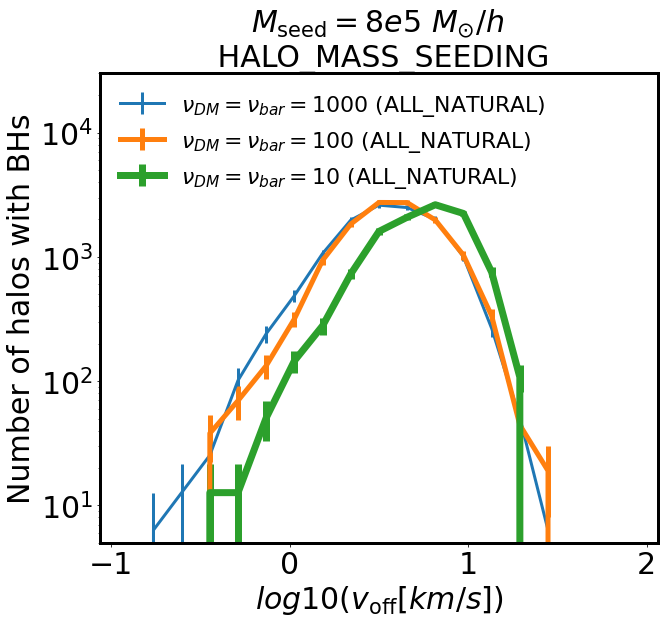

In [183]:



f,axx=plt.subplots(1,1,figsize=(10,8),sharex=True,sharey=True)
i=0
for desired_redshift in [11]:
    ax=axx
    ax.set_title('$z=%d$'%desired_redshift,fontsize=50)
    Nbin,vmax,vmin=20,-1,2


    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
    run='/L3p125n1024/AREPO/' 
    output='/output_FOF_7_5.90_strict_velocity_gas_res' 
    basePath=path_to_output+run+output


    make_plot(labl=r'$\nu_{DM}=\nu_{bar}= 1000$ (ALL_NATURAL)',col='C0',softening=0.125,width=3)

    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
    run='/L3p125n512/AREPO/' 
    output='/output_FOF_7_5.90_strict_velocity_gas_res' 
    basePath=path_to_output+run+output

    make_plot(labl=r'$\nu_{DM}=\nu_{bar}= 100$ (ALL_NATURAL)',col='C1',softening=0.25,width=5)


    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
    run='/L3p125n256/AREPO/' 
    output='/output_FOF_7_5.90_strict_velocity_gas_res' 
    basePath=path_to_output+run+output


    make_plot(labl=r'$\nu_{DM}=\nu_{bar}= 10$ (ALL_NATURAL)',col='C2',softening=0.5,width=7)








    #f.suptitle('$M_{\mathrm{seed}}=1e5 M_{\odot}/h$, $M^{\mathrm{FOF}}_{\mathrm{seed}}=1e7 M_{\odot}/h$',fontsize=40)

    #ax.set_xlim(-10,1.2)
    #ax[0,0].set_yscale('log')
    ax.set_yscale('log')
    ax.set_yscale('log')
    #ax[1,1].set_yscale('log')

    ax.set_ylim(5,30000)
        #ax.set_xscale('log')

    


    ax.set_xlabel('$log10(v_{\mathrm{off}}[km/s])$',fontsize=30)


    ax.tick_params(labelsize=30)



    plt.subplots_adjust(wspace=0,hspace=0.2)

    plt.subplots_adjust(wspace=0,hspace=0.05,top=0.94)


    for a in [ax]:
        a.spines['top'].set_linewidth(3)    # Top axis
        a.spines['bottom'].set_linewidth(3) # Bottom axis
        a.spines['left'].set_linewidth(3)   # Left axis
        a.spines['right'].set_linewidth(3) 
    i+=1
    #plt.savefig('./Paper8_figures/FOF_seed_spatial_distributions_noDF.png',bbox_inches='tight')

    
axx.legend(loc='upper left',fontsize=25)    
axx.set_ylabel('Number of halos with BHs',fontsize=30)
axx.legend(fontsize=22,loc='upper left',frameon=False)

tt='$M_{\mathrm{seed}}=8e5 \ M_{\odot}/h$ \n HALO_MASS_SEEDING'   
axx.set_title(tt,fontsize=30) 

        
plt.savefig('./Paper8_figures/velocity_offsets_seed8e5_FOF.png',bbox_inches='tight')

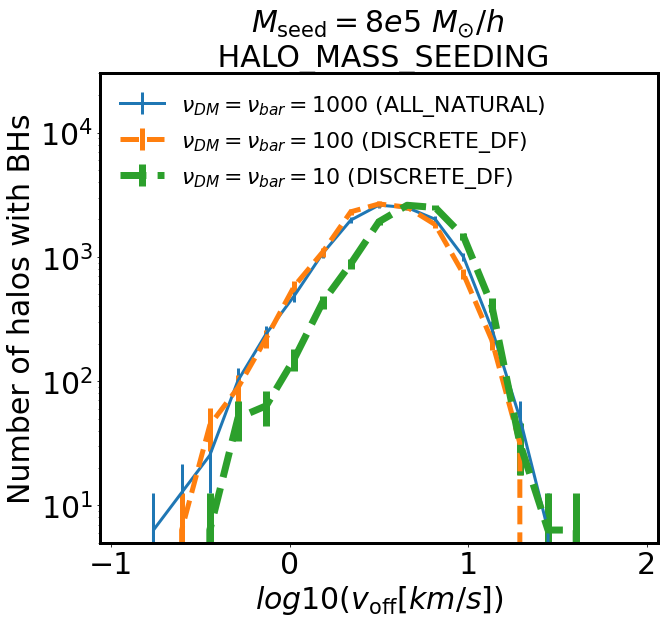

In [187]:



f,axx=plt.subplots(1,1,figsize=(10,8),sharex=True,sharey=True)
i=0
for desired_redshift in [11]:
    ax=axx
    ax.set_title('$z=%d$'%desired_redshift,fontsize=50)
    Nbin,vmax,vmin=20,-1,2


    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
    run='/L3p125n1024/AREPO/' 
    output='/output_FOF_7_5.90_strict_velocity_gas_res' 
    basePath=path_to_output+run+output


    make_plot(labl=r'$\nu_{DM}=\nu_{bar}= 1000$ (ALL_NATURAL)',col='C0',softening=0.125,width=3)

    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
    run='/L3p125n512/AREPO/' 
    output='/output_FOF_7_5.90_discreteDF_strict_velocity_gas_res' 
    basePath=path_to_output+run+output

    make_plot(labl=r'$\nu_{DM}=\nu_{bar}= 100$ (DISCRETE_DF)',col='C1',softening=0.25,width=5,style='dashed')


    path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
    run='/L3p125n256/AREPO/' 
    output='/output_FOF_7_5.90_discreteDF_strict_velocity_gas_res' 
    basePath=path_to_output+run+output


    make_plot(labl=r'$\nu_{DM}=\nu_{bar}= 10$ (DISCRETE_DF)',col='C2',softening=0.5,width=7,style='dashed')








    #f.suptitle('$M_{\mathrm{seed}}=1e5 M_{\odot}/h$, $M^{\mathrm{FOF}}_{\mathrm{seed}}=1e7 M_{\odot}/h$',fontsize=40)

    #ax.set_xlim(-10,1.2)
    #ax[0,0].set_yscale('log')
    ax.set_yscale('log')
    ax.set_yscale('log')
    #ax[1,1].set_yscale('log')

    ax.set_ylim(5,30000)
        #ax.set_xscale('log')

    


    ax.set_xlabel('$log10(v_{\mathrm{off}}[km/s])$',fontsize=30)


    ax.tick_params(labelsize=30)



    plt.subplots_adjust(wspace=0,hspace=0.2)

    plt.subplots_adjust(wspace=0,hspace=0.05,top=0.94)


    for a in [ax]:
        a.spines['top'].set_linewidth(3)    # Top axis
        a.spines['bottom'].set_linewidth(3) # Bottom axis
        a.spines['left'].set_linewidth(3)   # Left axis
        a.spines['right'].set_linewidth(3) 
    i+=1
    #plt.savefig('./Paper8_figures/FOF_seed_spatial_distributions_noDF.png',bbox_inches='tight')

    
axx.legend(loc='lower left',fontsize=25)    
axx.set_ylabel('Number of halos with BHs',fontsize=30)
axx.legend(fontsize=22,loc='upper left',frameon=False)

tt='$M_{\mathrm{seed}}=8e5 \ M_{\odot}/h$ \n HALO_MASS_SEEDING'   
axx.set_title(tt,fontsize=30) 

        
plt.savefig('./Paper8_figures/velocity_offsets_seed8e5_FOF_DF.png',bbox_inches='tight')

/apps/jupyterhub/1.0.0/lib/python3.7/site-packages/ipykernel_launcher.py:31: RuntimeWarning: divide by zero encountered in log10


FileNotFoundError: [Errno 2] No such file or directory: '/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS////L3p125n512/AREPO//output_ratio1000_SFMFGM5_seed4.10_discreteDF_HDM5.00_strict_velocity//new_BH_distances_velocities_from_center_mpi_11/'

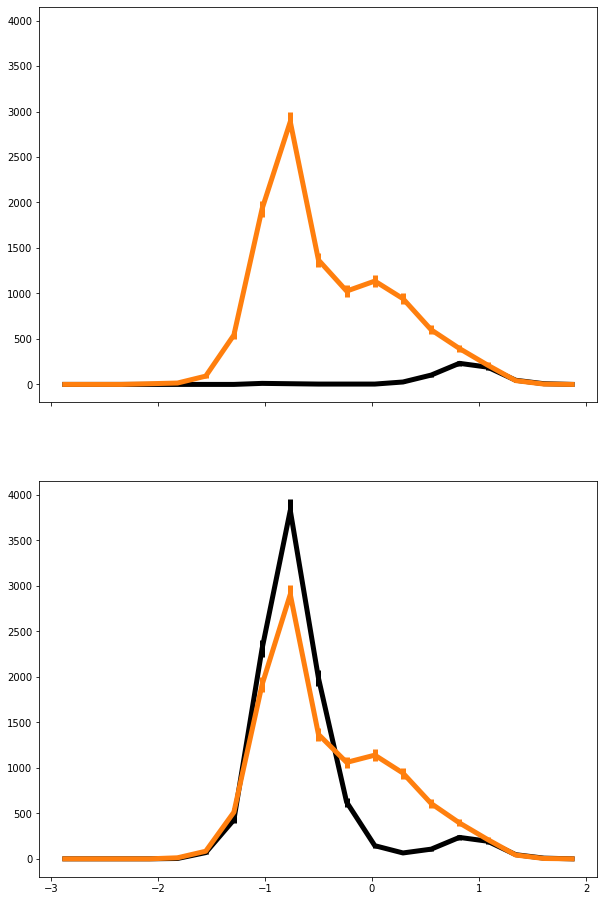

In [45]:



f,ax=plt.subplots(2,1,figsize=(10,16),sharex=True,sharey=True)
Nbin,vmax,vmin=20,-3,2




path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' 
output='/output_ratio1000_SFMFGM5_seed3.19_repositioning/' 
basePath=path_to_output+run+output
desired_redshift=9

make_plot(labl=r'$\nu=0.1$',col='black',softening=0.125,width=5)

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' 
output='/output_ratio1000_SFMFGM5_seed3.19_HDM5.00_strict_velocity/' 
basePath=path_to_output+run+output

make_plot(labl=r'$\nu=0.1$',col='C1',softening=0.125,width=5)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' 
output='/output_ratio1000_SFMFGM5_seed4.10_discreteDF_HDM5.00_strict_velocity/' 
basePath=path_to_output+run+output
desired_redshift=11

make_plot(labl=r'$\nu=0.1$',col='C2',softening=0.125,width=5,style='dashed')








#f.suptitle('$M_{\mathrm{seed}}=1e5 M_{\odot}/h$, $M^{\mathrm{FOF}}_{\mathrm{seed}}=1e7 M_{\odot}/h$',fontsize=40)

#ax.set_xlim(-10,1.2)
#ax[0,0].set_yscale('log')
ax[0].set_yscale('log')
ax[1].set_yscale('log')
#ax[1,1].set_yscale('log')

ax[0].set_ylim(5,10000)
    #ax.set_xscale('log')

ax[0].set_ylabel('Number of halos with BHs',fontsize=30)
ax[1].set_ylabel('Number of halos with BHs',fontsize=30)


ax[1].set_xlabel('$log10(d_{\mathrm{off}}[kpc/h])$',fontsize=50)


ax[0].tick_params(labelsize=30)
ax[1].tick_params(labelsize=30)


ax[0].text(-2.9,6000,'BH offset from DM particle with $\mathrm{min}(V)]$',fontsize=22)
ax[1].text(-2.9,6000,'BH offset from DM particle with $\mathrm{min}(V-V_{BH})$',fontsize=22)

ax[1].legend(loc='lower left',fontsize=22,frameon=False)
ax[1].legend(loc='upper left',fontsize=22,frameon=False)
plt.subplots_adjust(wspace=0,hspace=0.2)

plt.subplots_adjust(wspace=0,hspace=0.05,top=0.94)


for a in ax.flatten():
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 
#plt.savefig('./Paper8_figures/FOF_seed_spatial_distributions_noDF.png',bbox_inches='tight')


In [169]:
def sort_trajectories(properties):
    #print(properties[-1])
    indices = numpy.arange(0,len(properties[-1]))
    sorted_indices=arepo_package.sort_X_based_on_Y(indices,properties[-1])
    #print(properties[0])
    sorted_properties = [prop[sorted_indices] for prop in properties]
    return sorted_properties

def apply_mask(properties,initial_redshift_trajectory):
    mask = properties[-1] < initial_redshift_trajectory+0.1
    masked_properties = [prop[mask] for prop in properties]
    return masked_properties


def generate_interpolators(properties):
    return [scipy.interpolate.interp1d(properties[-1],prop,fill_value='extrapolate') for prop in properties]
 

def construct_redshift_to_time_grid(redshift_grid):
    return numpy.array([T(z,1100)/hubble/1e6 for z in redshift_grid])
        
    
def do(N,get_ecc=0):
    primary_properties=numpy.load(path_to_trajectories + '%d_primary.npy'%N)
    secondary_properties=numpy.load(path_to_trajectories + '%d_secondary.npy'%N)

    initial_redshift_trajectory = min([max(primary_properties[-1]),max(secondary_properties[-1])])

    #print(primary_properties)
    #print(secondary_properties)    

    primary_properties = apply_mask(primary_properties,initial_redshift_trajectory)
    secondary_properties = apply_mask(secondary_properties,initial_redshift_trajectory)
    


    sorted_primary_properties = sort_trajectories(primary_properties)
    sorted_secondary_properties = sort_trajectories(secondary_properties)

    xpos_trajectory_primary,ypos_trajectory_primary,zpos_trajectory_primary,xvel_trajectory_primary,yvel_trajectory_primary,zvel_trajectory_primary,Redshift_trajectory_primary=sorted_primary_properties
    xpos_trajectory_secondary,ypos_trajectory_secondary,zpos_trajectory_secondary,xvel_trajectory_secondary,yvel_trajectory_secondary,zvel_trajectory_secondary,Redshift_trajectory_secondary=sorted_secondary_properties

    interpolators_primary = generate_interpolators(sorted_primary_properties)
    interpolators_secondary = generate_interpolators(sorted_secondary_properties)

    redshift_grid = numpy.linspace(0,30,100)
    time_grid = construct_redshift_to_time_grid(redshift_grid)
    gen_time = scipy.interpolate.interp1d(redshift_grid,time_grid)

    redshift_space = numpy.linspace(merger_redshift[N],min([max(Redshift_trajectory_primary),max(Redshift_trajectory_secondary)]),1000)
    time_space = gen_time(redshift_space)

    time_space_zero = time_space - min(time_space)


    xpos_primary = (interpolators_primary[0])(redshift_space)
    xpos_secondary = (interpolators_secondary[0])(redshift_space)

    ypos_primary = (interpolators_primary[1])(redshift_space)
    ypos_secondary = (interpolators_secondary[1])(redshift_space)

    zpos_primary = (interpolators_primary[2])(redshift_space)
    zpos_secondary = (interpolators_secondary[2])(redshift_space)
    
    
    
    xvel_primary = (interpolators_primary[3])(redshift_space)
    xvel_secondary = (interpolators_secondary[3])(redshift_space)

    yvel_primary = (interpolators_primary[4])(redshift_space)
    yvel_secondary = (interpolators_secondary[4])(redshift_space)

    zvel_primary = (interpolators_primary[5])(redshift_space)
    zvel_secondary = (interpolators_secondary[5])(redshift_space)
    


    boxsize= arepo_package.get_box_size(basePath)

    d_xpos = numpy.array([min_dis(boxsize,a,b) for a,b in list(zip(xpos_primary,xpos_secondary))])
    d_ypos = numpy.array([min_dis(boxsize,a,b) for a,b in list(zip(ypos_primary,ypos_secondary))])
    d_zpos = numpy.array([min_dis(boxsize,a,b) for a,b in list(zip(zpos_primary,zpos_secondary))])

    d_rpos = numpy.sqrt(d_xpos**2 + d_ypos**2 + d_zpos**2)
    
    dr_vec= numpy.transpose([d_xpos,d_ypos,d_zpos]) 

    
    d_xvel = xvel_primary-xvel_secondary
    d_yvel = yvel_primary-yvel_secondary
    d_zvel = zvel_primary-zvel_secondary

    d_vel = numpy.sqrt(d_xvel**2 + d_yvel**2 + d_zvel**2)
    
    
    d_rpos_dvel = d_xpos * d_xvel + d_ypos * d_yvel + d_zpos * d_zvel
    d_vel_vec= numpy.transpose([d_xvel,d_yvel,d_zvel])    
    
    mu = Grav_const * (primary_mass_sorted+ secondary_mass_sorted) * 1e10 * Msunh_to_kg
    h_vec = numpy.array([numpy.cross(r,v) for r,v in list(zip(dr_vec,d_vel_vec))])*kpch_to_m/m_to_km  
    term_1 = numpy.array([numpy.cross(v,h)/mm for v,h,mm in list(zip(d_vel_vec,h_vec,mu))])/m_to_km  
    term_2 =numpy.array([nn/dd for nn,dd in list(zip(dr_vec,d_rpos))])    
    eccentrity_vec = term_1 - term_2 
    eccentrity  = numpy.sqrt(numpy.array([numpy.dot(e,e) for e in eccentrity_vec])) 
    
    
    if len(d_rpos[d_rpos>500]) > 0:
        print(N)
 
    diff_rpos=numpy.append([0],numpy.diff(d_rpos))
    mask=abs(diff_rpos)<1
    if (get_ecc==0):
        return d_rpos[mask],d_vel[mask],time_space[mask],time_space_zero[mask],d_rpos_dvel[mask]
    else:
        return d_rpos[mask],d_vel[mask],time_space[mask],time_space_zero[mask],d_rpos_dvel[mask],eccentrity[mask]




22 3.008131071630377
Total number of mergers 1060
4
0
2
4
5
14
5


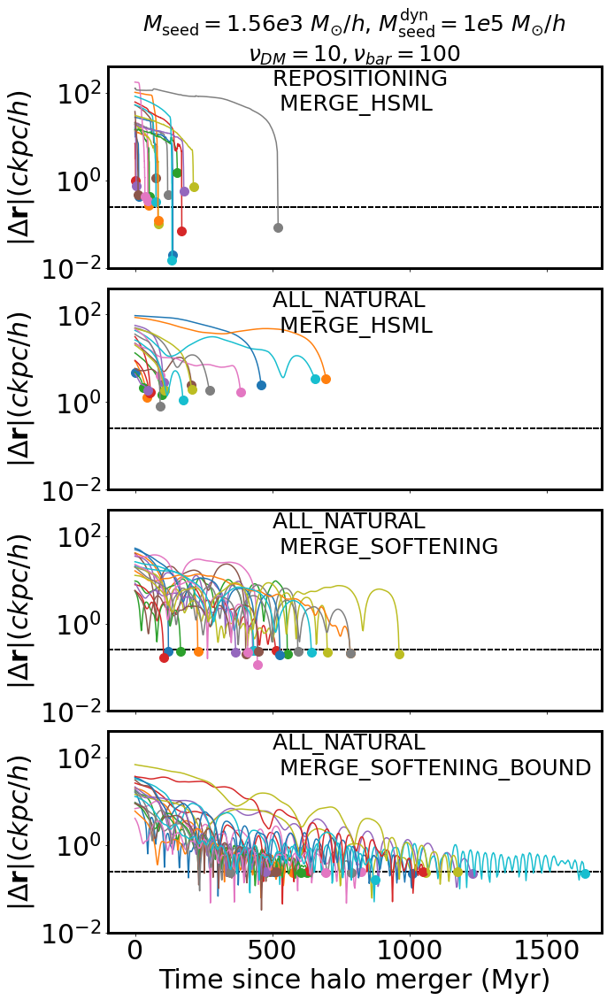

In [159]:
upto_redshift=0
scale_fac_complete_sorted,primary_mass_sorted,secondary_mass_sorted,primary_id_sorted,secondary_id_sorted,file_id_complete_sorted,N_empty=arepo_package.get_merger_events_from_snapshot(basePath,upto_redshift,HOSTS=0)


size=30
hubble=0.6771
kpch_to_m=3.086e+19/hubble
Msunh_to_kg = 2e30/hubble
Grav_const=6.6743e-11
m_to_km = 1e-3

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_ratio1000_SFMFGM5_seed3.19_repositioning/'
basePath=path_to_output+run+output
path_to_trajectories = basePath+'/merger_trajectories'

merger_properties,initial_trajectory_primary,initial_trajectory_secondary=numpy.load(basePath + '/merger_statistics.npy',allow_pickle=True)
merger_type=numpy.array(merger_properties['merger_type'])
merger_redshift = numpy.array(merger_properties['merger_redshift'])


f,ax=plt.subplots(4,1,figsize=(10,18),sharex=True,sharey=True)
ax[0].set_xlim(-100,1700)

ax[0].set_ylim(1e-2,400)

axx=ax[0]

for N in range(0,20):
    #print(N)
    
    d_rpos,d_vel,time_space,time_space_zero,d_rpos_dvel= do(N)
    #mask=d_rpos < 700
    axx.errorbar(time_space_zero,d_rpos,color='C%d'%N) 
    axx.errorbar([time_space_zero[0]],d_rpos[0],marker='o',ms=10,color='C%d'%N)
    axx.axhline(0.25,color='black',linestyle='dashed')      
    axx.set_yscale('log')



path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_ratio1000_SFMFGM5_seed3.19_HDM5.00/'
basePath=path_to_output+run+output
path_to_trajectories = basePath+'/merger_trajectories'

merger_properties,initial_trajectory_primary,initial_trajectory_secondary=numpy.load(basePath + '/merger_statistics.npy',allow_pickle=True)
merger_type=numpy.array(merger_properties['merger_type'])
merger_redshift = numpy.array(merger_properties['merger_redshift'])

axx=ax[1]

for N in range(0,20):
    #print(N)
    try:
        d_rpos,d_vel,time_space,time_space_zero,d_rpos_dvel= do(N)
        #mask=d_rpos < 700
        axx.errorbar(time_space_zero,d_rpos,color='C%d'%N) 
        axx.errorbar([time_space_zero[0]],d_rpos[0],marker='o',ms=10,color='C%d'%N)
        axx.axhline(0.25,color='black',linestyle='dashed')      
        axx.set_yscale('log')
    except:
        aaa=1

    
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_ratio1000_SFMFGM5_seed3.19_HDM5.00_strict/'
basePath=path_to_output+run+output
path_to_trajectories = basePath+'/merger_trajectories'

merger_properties,initial_trajectory_primary,initial_trajectory_secondary=numpy.load(basePath + '/merger_statistics.npy',allow_pickle=True)
merger_type=numpy.array(merger_properties['merger_type'])
merger_redshift = numpy.array(merger_properties['merger_redshift'])


axx=ax[2]

for N in range(0,20):
    #print(N)
    
    d_rpos,d_vel,time_space,time_space_zero,d_rpos_dvel= do(N)
    #mask=d_rpos < 700
    axx.errorbar(time_space_zero,d_rpos,color='C%d'%N) 
    axx.errorbar([time_space_zero[0]],d_rpos[0],marker='o',ms=10,color='C%d'%N)
    axx.axhline(0.25,color='black',linestyle='dashed')      
    axx.set_yscale('log')
       
    
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_ratio1000_SFMFGM5_seed3.19_HDM5.00_strict_velocity/'
basePath=path_to_output+run+output
path_to_trajectories = basePath+'/merger_trajectories'

merger_properties,initial_trajectory_primary,initial_trajectory_secondary=numpy.load(basePath + '/merger_statistics.npy',allow_pickle=True)
merger_type=numpy.array(merger_properties['merger_type'])
merger_redshift = numpy.array(merger_properties['merger_redshift'])


#f,ax=plt.subplots(2,2,figsize=(20,8))
#print(xpos_primary)
axx=ax[3]
for N in range(0,20):
    #print(N)
    
    d_rpos,d_vel,time_space,time_space_zero,d_rpos_dvel= do(N)
    #mask=d_rpos < 700
    axx.errorbar(time_space_zero,d_rpos,color='C%d'%N) 
    axx.errorbar([time_space_zero[0]],d_rpos[0],marker='o',ms=10,color='C%d'%N)
    axx.axhline(0.25,color='black',linestyle='dashed')      
    axx.set_yscale('log')
    
    
for i in range(0,4):
    ax[i].tick_params(labelsize=30)
    ax[i].set_ylabel(r'$|\Delta \mathbf{r}| (ckpc/h)$',fontsize=30)
    
    
ax[3].set_xlabel('Time since halo merger (Myr)',fontsize=30)

ax[0].text(500,40,'REPOSITIONING \n MERGE_HSML',fontsize=25)

ax[1].text(500,40,'ALL_NATURAL \n MERGE_HSML',fontsize=25)

ax[2].text(500,40,'ALL_NATURAL \n MERGE_SOFTENING',fontsize=25)

ax[3].text(500,40,'ALL_NATURAL \n MERGE_SOFTENING_BOUND',fontsize=25)


for a in ax.flatten():
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 

plt.subplots_adjust(wspace=0,hspace=0.1)
tt='$M_{\mathrm{seed}}=1.56e3 \ M_{\odot}/h$, $M_{\mathrm{seed}}^{\mathrm{dyn}}=1e5 \ M_{\odot}/h$\n'+r'$\nu_{DM}=10,\nu_{bar} = 100$'   
ax[0].set_title(tt,fontsize=25) 
    
plt.savefig('./Paper8_figures/time_evolution_pos_noDF.png',bbox_inches='tight')
#for N in range(0,20): 
#    d_rpos,d_vel,time_space,time_space_zero= do(N)
#    axx.errorbar([time_space_zero[0]],d_rpos[0],marker='o',ms=10)




4
0
2
4
5
14
5


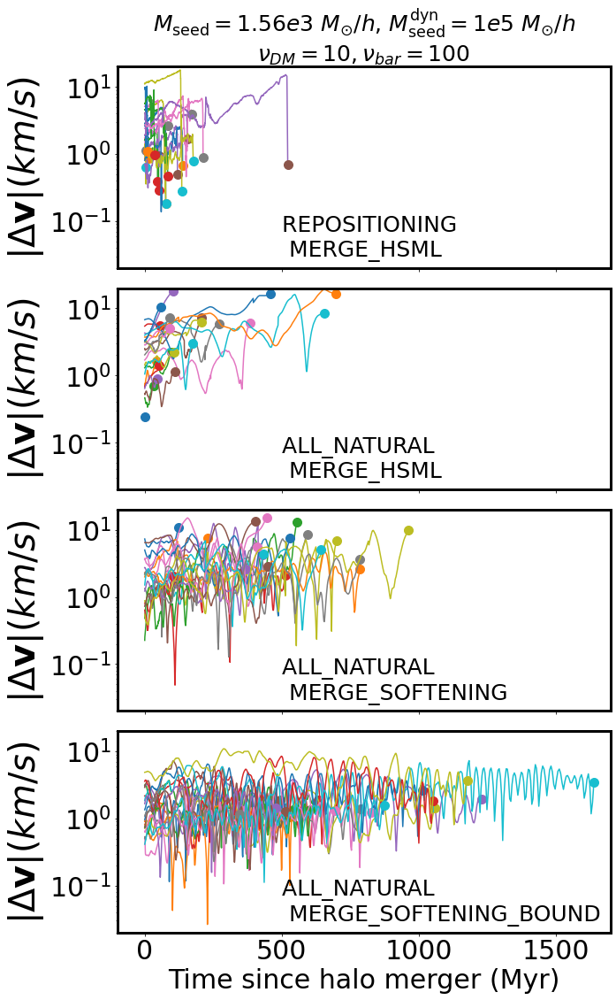

In [105]:


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_ratio1000_SFMFGM5_seed3.19_repositioning/'
basePath=path_to_output+run+output
path_to_trajectories = basePath+'/merger_trajectories'

merger_properties,initial_trajectory_primary,initial_trajectory_secondary=numpy.load(basePath + '/merger_statistics.npy',allow_pickle=True)
merger_type=numpy.array(merger_properties['merger_type'])
merger_redshift = numpy.array(merger_properties['merger_redshift'])


f,ax=plt.subplots(4,1,figsize=(10,18),sharex=True,sharey=True)

ax[0].set_xlim(-100,1700)
ax[0].set_ylim(0.02,20)
#print(xpos_primary)

axx=ax[0]

for N in range(0,20):
    #print(N)
    
    d_rpos,d_vel,time_space,time_space_zero,d_rpos_dvel= do(N)
    #mask=d_rpos < 700
    axx.errorbar(time_space_zero,d_vel) 
    axx.errorbar([time_space_zero[0]],d_vel[0],marker='o',ms=10)
    #axx.axhline(0.25,color='black',linestyle='dashed')      
    axx.set_yscale('log')



path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_ratio1000_SFMFGM5_seed3.19_HDM5.00/'
basePath=path_to_output+run+output
path_to_trajectories = basePath+'/merger_trajectories'

merger_properties,initial_trajectory_primary,initial_trajectory_secondary=numpy.load(basePath + '/merger_statistics.npy',allow_pickle=True)
merger_type=numpy.array(merger_properties['merger_type'])
merger_redshift = numpy.array(merger_properties['merger_redshift'])

axx=ax[1]

for N in range(0,21):
    #print(N)
    
    d_rpos,d_vel,time_space,time_space_zero,d_rpos_dvel= do(N)
    #mask=d_rpos < 700
    axx.errorbar(time_space_zero,d_vel,color='C%d'%N) 
    axx.errorbar([time_space_zero[0]],d_vel[0],marker='o',ms=10,color='C%d'%N)
    #axx.axhline(0.25,color='black',linestyle='dashed')      
    axx.set_yscale('log')
       
    
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_ratio1000_SFMFGM5_seed3.19_HDM5.00_strict/'
basePath=path_to_output+run+output
path_to_trajectories = basePath+'/merger_trajectories'

merger_properties,initial_trajectory_primary,initial_trajectory_secondary=numpy.load(basePath + '/merger_statistics.npy',allow_pickle=True)
merger_type=numpy.array(merger_properties['merger_type'])
merger_redshift = numpy.array(merger_properties['merger_redshift'])


axx=ax[2]

for N in range(0,20):
    #print(N)
    
    d_rpos,d_vel,time_space,time_space_zero,d_rpos_dvel= do(N)
    #mask=d_rpos < 700
    axx.errorbar(time_space_zero,d_vel,color='C%d'%N) 
    axx.errorbar([time_space_zero[0]],d_vel[0],marker='o',ms=10,color='C%d'%N)
    #axx.axhline(0.25,color='black',linestyle='dashed')      
    axx.set_yscale('log')
       
    
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_ratio1000_SFMFGM5_seed3.19_HDM5.00_strict_velocity/'
basePath=path_to_output+run+output
path_to_trajectories = basePath+'/merger_trajectories'

merger_properties,initial_trajectory_primary,initial_trajectory_secondary=numpy.load(basePath + '/merger_statistics.npy',allow_pickle=True)
merger_type=numpy.array(merger_properties['merger_type'])
merger_redshift = numpy.array(merger_properties['merger_redshift'])


#f,ax=plt.subplots(2,2,figsize=(20,8))
#print(xpos_primary)
axx=ax[3]
for N in range(0,20):
    #print(N)
    
    d_rpos,d_vel,time_space,time_space_zero,d_rpos_dvel= do(N)
    #mask=d_rpos < 700
    axx.errorbar(time_space_zero,d_vel,color='C%d'%N) 
    axx.errorbar([time_space_zero[0]],d_vel[0],marker='o',ms=10,color='C%d'%N)
    #axx.axhline(0.25,color='black',linestyle='dashed')      
    axx.set_yscale('log')
    
    
for i in range(0,4):
    ax[i].tick_params(labelsize=30)
    ax[i].set_ylabel(r'$|\Delta \mathbf{v}| (km/s)$',fontsize=40)
    
    
ax[3].set_xlabel('Time since halo merger (Myr)',fontsize=30)

ax[0].text(500,0.03,'REPOSITIONING \n MERGE_HSML',fontsize=25)

ax[1].text(500,0.03,'ALL_NATURAL \n MERGE_HSML',fontsize=25)

ax[2].text(500,0.03,'ALL_NATURAL \n MERGE_SOFTENING',fontsize=25)

ax[3].text(500,0.03,'ALL_NATURAL \n MERGE_SOFTENING_BOUND',fontsize=25)


for a in ax.flatten():
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 

plt.subplots_adjust(wspace=0,hspace=0.1)

tt='$M_{\mathrm{seed}}=1.56e3 \ M_{\odot}/h$, $M_{\mathrm{seed}}^{\mathrm{dyn}}=1e5 \ M_{\odot}/h$\n'+r'$\nu_{DM}=10,\nu_{bar} = 100$'   
ax[0].set_title(tt,fontsize=25) 

plt.savefig('./Paper8_figures/time_evolution_vel_noDF.png',bbox_inches='tight')
    
#for N in range(0,20): 
#    d_rpos,d_vel,time_space,time_space_zero= do(N)
#    axx.errorbar([time_space_zero[0]],d_rpos[0],marker='o',ms=10)





9
6
8


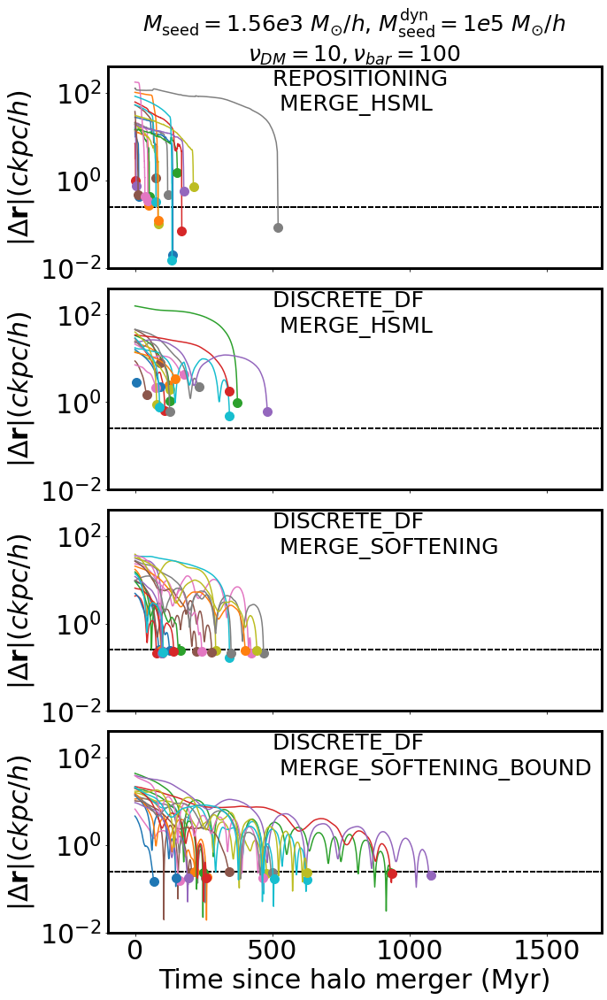

In [106]:


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_ratio1000_SFMFGM5_seed3.19_repositioning/'
basePath=path_to_output+run+output
path_to_trajectories = basePath+'/merger_trajectories'

merger_properties,initial_trajectory_primary,initial_trajectory_secondary=numpy.load(basePath + '/merger_statistics.npy',allow_pickle=True)
merger_type=numpy.array(merger_properties['merger_type'])
merger_redshift = numpy.array(merger_properties['merger_redshift'])


f,ax=plt.subplots(4,1,figsize=(10,18),sharex=True,sharey=True)
ax[0].set_xlim(-100,1700)

ax[0].set_ylim(1e-2,400)

axx=ax[0]

for N in range(0,20):
    #print(N)
    
    d_rpos,d_vel,time_space,time_space_zero,d_rpos_dvel= do(N)
    #mask=d_rpos < 700
    axx.errorbar(time_space_zero,d_rpos,color='C%d'%N) 
    axx.errorbar([time_space_zero[0]],d_rpos[0],marker='o',ms=10,color='C%d'%N)
    axx.axhline(0.25,color='black',linestyle='dashed')      
    axx.set_yscale('log')



path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM5.00/'
basePath=path_to_output+run+output
path_to_trajectories = basePath+'/merger_trajectories'

merger_properties,initial_trajectory_primary,initial_trajectory_secondary=numpy.load(basePath + '/merger_statistics.npy',allow_pickle=True)
merger_type=numpy.array(merger_properties['merger_type'])
merger_redshift = numpy.array(merger_properties['merger_redshift'])

axx=ax[1]

for N in range(0,20):
    #print(N)
    try:
        d_rpos,d_vel,time_space,time_space_zero,d_rpos_dvel= do(N)
        #mask=d_rpos < 700
        axx.errorbar(time_space_zero,d_rpos,color='C%d'%N) 
        axx.errorbar([time_space_zero[0]],d_rpos[0],marker='o',ms=10,color='C%d'%N)
        axx.axhline(0.25,color='black',linestyle='dashed')      
        axx.set_yscale('log')
    except:
        aaa=1

    
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM5.00_strict/'
basePath=path_to_output+run+output
path_to_trajectories = basePath+'/merger_trajectories'

merger_properties,initial_trajectory_primary,initial_trajectory_secondary=numpy.load(basePath + '/merger_statistics.npy',allow_pickle=True)
merger_type=numpy.array(merger_properties['merger_type'])
merger_redshift = numpy.array(merger_properties['merger_redshift'])


axx=ax[2]

for N in range(0,20):
    #print(N)
    
    d_rpos,d_vel,time_space,time_space_zero,d_rpos_dvel= do(N)
    #mask=d_rpos < 700
    axx.errorbar(time_space_zero,d_rpos,color='C%d'%N) 
    axx.errorbar([time_space_zero[0]],d_rpos[0],marker='o',ms=10,color='C%d'%N)
    axx.axhline(0.25,color='black',linestyle='dashed')      
    axx.set_yscale('log')
       
    
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM5.00_strict_velocity/'
basePath=path_to_output+run+output
path_to_trajectories = basePath+'/merger_trajectories'

merger_properties,initial_trajectory_primary,initial_trajectory_secondary=numpy.load(basePath + '/merger_statistics.npy',allow_pickle=True)
merger_type=numpy.array(merger_properties['merger_type'])
merger_redshift = numpy.array(merger_properties['merger_redshift'])


#f,ax=plt.subplots(2,2,figsize=(20,8))
#print(xpos_primary)
axx=ax[3]
for N in range(0,20):
    #print(N)
    
    d_rpos,d_vel,time_space,time_space_zero,d_rpos_dvel= do(N)
    #mask=d_rpos < 700
    axx.errorbar(time_space_zero,d_rpos,color='C%d'%N) 
    axx.errorbar([time_space_zero[0]],d_rpos[0],marker='o',ms=10,color='C%d'%N)
    axx.axhline(0.25,color='black',linestyle='dashed')      
    axx.set_yscale('log')
    
    
for i in range(0,4):
    ax[i].tick_params(labelsize=30)
    ax[i].set_ylabel(r'$|\Delta \mathbf{r}| (ckpc/h)$',fontsize=30)
    
    
ax[3].set_xlabel('Time since halo merger (Myr)',fontsize=30)

ax[0].text(500,40,'REPOSITIONING \n MERGE_HSML',fontsize=25)

ax[1].text(500,40,'DISCRETE_DF \n MERGE_HSML',fontsize=25)

ax[2].text(500,40,'DISCRETE_DF \n MERGE_SOFTENING',fontsize=25)

ax[3].text(500,40,'DISCRETE_DF \n MERGE_SOFTENING_BOUND',fontsize=25)


for a in ax.flatten():
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 

plt.subplots_adjust(wspace=0,hspace=0.1)
tt='$M_{\mathrm{seed}}=1.56e3 \ M_{\odot}/h$, $M_{\mathrm{seed}}^{\mathrm{dyn}}=1e5 \ M_{\odot}/h$\n'+r'$\nu_{DM}=10,\nu_{bar} = 100$'   
ax[0].set_title(tt,fontsize=25)    
    
plt.savefig('./Paper8_figures/time_evolution_pos_DF.png',bbox_inches='tight')
#for N in range(0,20): 
#    d_rpos,d_vel,time_space,time_space_zero= do(N)
#    axx.errorbar([time_space_zero[0]],d_rpos[0],marker='o',ms=10)




9
6
8


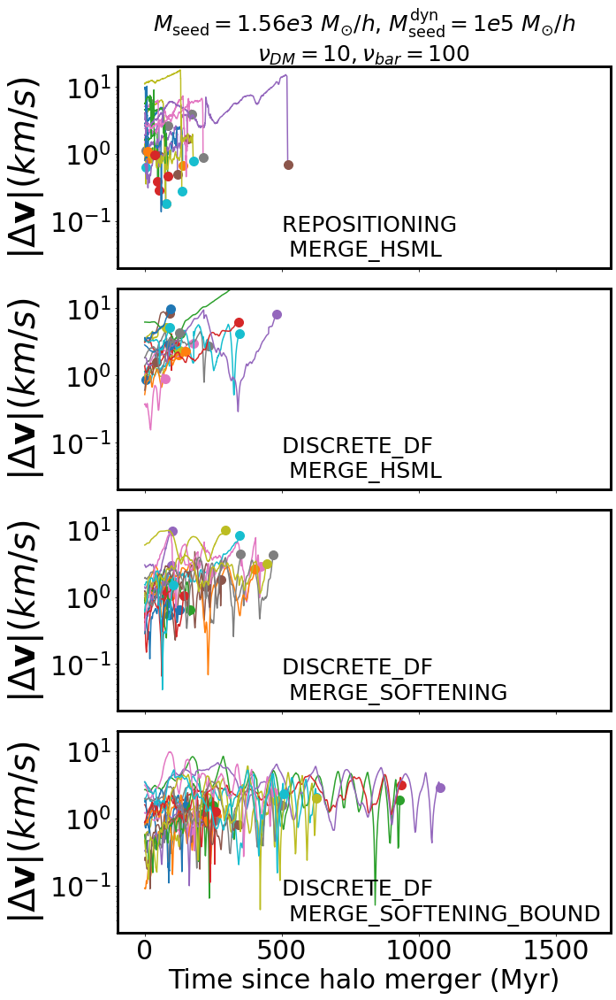

In [107]:


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_ratio1000_SFMFGM5_seed3.19_repositioning/'
basePath=path_to_output+run+output
path_to_trajectories = basePath+'/merger_trajectories'

merger_properties,initial_trajectory_primary,initial_trajectory_secondary=numpy.load(basePath + '/merger_statistics.npy',allow_pickle=True)
merger_type=numpy.array(merger_properties['merger_type'])
merger_redshift = numpy.array(merger_properties['merger_redshift'])


f,ax=plt.subplots(4,1,figsize=(10,18),sharex=True,sharey=True)

ax[0].set_xlim(-100,1700)
ax[0].set_ylim(0.02,20)
#print(xpos_primary)

axx=ax[0]

for N in range(0,20):
    #print(N)
    
    d_rpos,d_vel,time_space,time_space_zero,d_rpos_dvel= do(N)
    #mask=d_rpos < 700
    axx.errorbar(time_space_zero,d_vel) 
    axx.errorbar([time_space_zero[0]],d_vel[0],marker='o',ms=10)
    #axx.axhline(0.25,color='black',linestyle='dashed')      
    axx.set_yscale('log')



path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM5.00/'
basePath=path_to_output+run+output
path_to_trajectories = basePath+'/merger_trajectories'

merger_properties,initial_trajectory_primary,initial_trajectory_secondary=numpy.load(basePath + '/merger_statistics.npy',allow_pickle=True)
merger_type=numpy.array(merger_properties['merger_type'])
merger_redshift = numpy.array(merger_properties['merger_redshift'])

axx=ax[1]

for N in range(0,21):
    #print(N)
    try:
        d_rpos,d_vel,time_space,time_space_zero,d_rpos_dvel= do(N)
        #mask=d_rpos < 700
        axx.errorbar(time_space_zero,d_vel,color='C%d'%N) 
        axx.errorbar([time_space_zero[0]],d_vel[0],marker='o',ms=10,color='C%d'%N)
        #axx.axhline(0.25,color='black',linestyle='dashed')      
        axx.set_yscale('log')
    except:
        aaa=1
       
    
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM5.00_strict/'
basePath=path_to_output+run+output
path_to_trajectories = basePath+'/merger_trajectories'

merger_properties,initial_trajectory_primary,initial_trajectory_secondary=numpy.load(basePath + '/merger_statistics.npy',allow_pickle=True)
merger_type=numpy.array(merger_properties['merger_type'])
merger_redshift = numpy.array(merger_properties['merger_redshift'])


axx=ax[2]

for N in range(0,20):
    #print(N)
    
    d_rpos,d_vel,time_space,time_space_zero,d_rpos_dvel= do(N)
    #mask=d_rpos < 700
    axx.errorbar(time_space_zero,d_vel,color='C%d'%N) 
    axx.errorbar([time_space_zero[0]],d_vel[0],marker='o',ms=10,color='C%d'%N)
    #axx.axhline(0.25,color='black',linestyle='dashed')      
    axx.set_yscale('log')
       
    
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM5.00_strict_velocity/'
basePath=path_to_output+run+output
path_to_trajectories = basePath+'/merger_trajectories'

merger_properties,initial_trajectory_primary,initial_trajectory_secondary=numpy.load(basePath + '/merger_statistics.npy',allow_pickle=True)
merger_type=numpy.array(merger_properties['merger_type'])
merger_redshift = numpy.array(merger_properties['merger_redshift'])


#f,ax=plt.subplots(2,2,figsize=(20,8))
#print(xpos_primary)
axx=ax[3]
for N in range(0,20):
    #print(N)
    
    d_rpos,d_vel,time_space,time_space_zero,d_rpos_dvel= do(N)
    #mask=d_rpos < 700
    axx.errorbar(time_space_zero,d_vel,color='C%d'%N) 
    axx.errorbar([time_space_zero[0]],d_vel[0],marker='o',ms=10,color='C%d'%N)
    #axx.axhline(0.25,color='black',linestyle='dashed')      
    axx.set_yscale('log')
    
    
for i in range(0,4):
    ax[i].tick_params(labelsize=30)
    ax[i].set_ylabel(r'$|\Delta \mathbf{v}| (km/s)$',fontsize=40)
    
    
ax[3].set_xlabel('Time since halo merger (Myr)',fontsize=30)

ax[0].text(500,0.03,'REPOSITIONING \n MERGE_HSML',fontsize=25)

ax[1].text(500,0.03,'DISCRETE_DF \n MERGE_HSML',fontsize=25)

ax[2].text(500,0.03,'DISCRETE_DF \n MERGE_SOFTENING',fontsize=25)

ax[3].text(500,0.03,'DISCRETE_DF \n MERGE_SOFTENING_BOUND',fontsize=25)


for a in ax.flatten():
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 

plt.subplots_adjust(wspace=0,hspace=0.1)
    
#for N in range(0,20): 
#    d_rpos,d_vel,time_space,time_space_zero= do(N)
#    axx.errorbar([time_space_zero[0]],d_rpos[0],marker='o',ms=10)
tt='$M_{\mathrm{seed}}=1.56e3 \ M_{\odot}/h$, $M_{\mathrm{seed}}^{\mathrm{dyn}}=1e5 \ M_{\odot}/h$\n'+r'$\nu_{DM}=10,\nu_{bar} = 100$'   
ax[0].set_title(tt,fontsize=25) 

plt.savefig('./Paper8_figures/time_evolution_vel_DF.png',bbox_inches='tight')


1


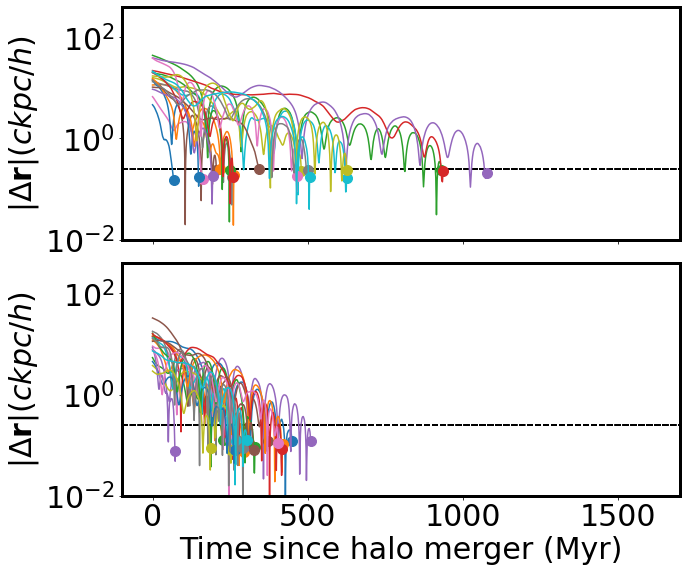

In [123]:



path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM5.00_strict_velocity/'
basePath=path_to_output+run+output
path_to_trajectories = basePath+'/merger_trajectories'

merger_properties,initial_trajectory_primary,initial_trajectory_secondary=numpy.load(basePath + '/merger_statistics.npy',allow_pickle=True)
merger_type=numpy.array(merger_properties['merger_type'])
merger_redshift = numpy.array(merger_properties['merger_redshift'])


f,ax=plt.subplots(2,1,figsize=(10,9),sharex=True,sharey=True)
ax[0].set_xlim(-100,1700)

ax[0].set_ylim(1e-2,400)

axx=ax[0]

for N in range(0,20):
    #print(N)
    
    d_rpos,d_vel,time_space,time_space_zero,d_rpos_dvel= do(N)
    #mask=d_rpos < 700
    axx.errorbar(time_space_zero,d_rpos,color='C%d'%N) 
    axx.errorbar([time_space_zero[0]],d_rpos[0],marker='o',ms=10,color='C%d'%N)
    axx.axhline(0.25,color='black',linestyle='dashed')      
    axx.set_yscale('log')



path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM4.10_strict_velocity_gas_res/'
basePath=path_to_output+run+output
path_to_trajectories = basePath+'/merger_trajectories'

merger_properties,initial_trajectory_primary,initial_trajectory_secondary=numpy.load(basePath + '/merger_statistics.npy',allow_pickle=True)
merger_type=numpy.array(merger_properties['merger_type'])
merger_redshift = numpy.array(merger_properties['merger_redshift'])

axx=ax[1]

for N in range(0,20):
    #print(N)
    try:
        d_rpos,d_vel,time_space,time_space_zero,d_rpos_dvel= do(N)
        #mask=d_rpos < 700
        axx.errorbar(time_space_zero,d_rpos,color='C%d'%N) 
        axx.errorbar([time_space_zero[0]],d_rpos[0],marker='o',ms=10,color='C%d'%N)
        axx.axhline(0.25,color='black',linestyle='dashed')      
        axx.set_yscale('log')
    except:
        aaa=1

    
    
for i in range(0,2):
    ax[i].tick_params(labelsize=30)
    ax[i].set_ylabel(r'$|\Delta \mathbf{r}| (ckpc/h)$',fontsize=30)
    
    
ax[1].set_xlabel('Time since halo merger (Myr)',fontsize=30)



for a in ax.flatten():
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 

plt.subplots_adjust(wspace=0,hspace=0.1)
    
    
plt.savefig('./Paper8_figures/time_evolution_pos_DF.png',bbox_inches='tight')
#for N in range(0,20): 
#    d_rpos,d_vel,time_space,time_space_zero= do(N)
#    axx.errorbar([time_space_zero[0]],d_rpos[0],marker='o',ms=10)







#make_plot(col='C0',s=15)

41
1
7


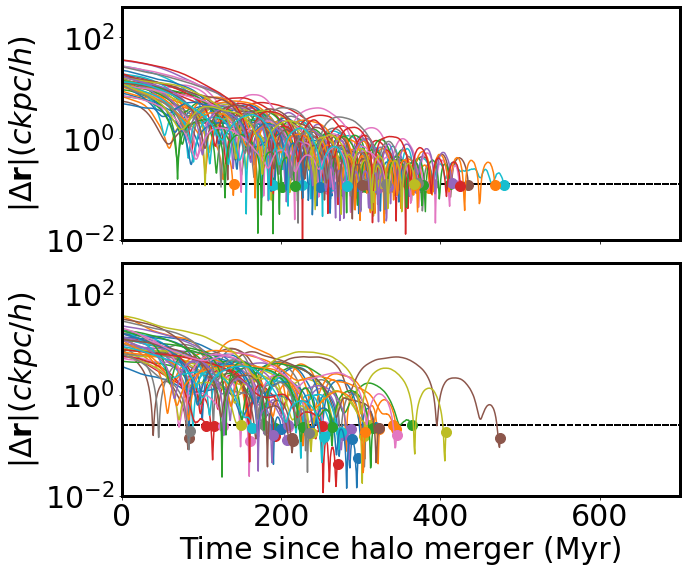

In [170]:



path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_FOF_7_5.00_strict_velocity_gas_res/'
basePath=path_to_output+run+output
path_to_trajectories = basePath+'/merger_trajectories'

merger_properties,initial_trajectory_primary,initial_trajectory_secondary=numpy.load(basePath + '/merger_statistics.npy',allow_pickle=True)
merger_type=numpy.array(merger_properties['merger_type'])
merger_redshift = numpy.array(merger_properties['merger_redshift'])


f,ax=plt.subplots(2,1,figsize=(10,9),sharex=True,sharey=True)
ax[0].set_xlim(-100,1700)

ax[0].set_ylim(1e-2,400)

axx=ax[0]

for N in range(0,50):
    #print(N)
    
    d_rpos,d_vel,time_space,time_space_zero,d_rpos_dvel= do(N)
    #mask=d_rpos < 700
    axx.errorbar(time_space_zero,d_rpos,color='C%d'%N) 
    axx.errorbar([time_space_zero[0]],d_rpos[0],marker='o',ms=10,color='C%d'%N)
    axx.axhline(0.125,color='black',linestyle='dashed')      
    axx.set_yscale('log')


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_FOF_7_5.00_discreteDF_strict_velocity_gas_res/'
basePath=path_to_output+run+output
path_to_trajectories = basePath+'/merger_trajectories'

merger_properties,initial_trajectory_primary,initial_trajectory_secondary=numpy.load(basePath + '/merger_statistics.npy',allow_pickle=True)
merger_type=numpy.array(merger_properties['merger_type'])
merger_redshift = numpy.array(merger_properties['merger_redshift'])

axx=ax[1]

for N in range(0,50):
    #print(N)
    try:
        d_rpos,d_vel,time_space,time_space_zero,d_rpos_dvel= do(N)
        #mask=d_rpos < 700
        axx.errorbar(time_space_zero,d_rpos,color='C%d'%N) 
        axx.errorbar([time_space_zero[0]],d_rpos[0],marker='o',ms=10,color='C%d'%N)
        axx.axhline(0.25,color='black',linestyle='dashed')      
        axx.set_yscale('log')
    except:
        aaa=1

    
    
for i in range(0,2):
    ax[i].tick_params(labelsize=30)
    ax[i].set_ylabel(r'$|\Delta \mathbf{r}| (ckpc/h)$',fontsize=30)
    
    
ax[1].set_xlabel('Time since halo merger (Myr)',fontsize=30)

ax[1].set_xlim(0,700)



for a in ax.flatten():
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 

plt.subplots_adjust(wspace=0,hspace=0.1)
    
    
plt.savefig('./Paper8_figures/time_evolution_pos_DF.png',bbox_inches='tight')
#for N in range(0,20): 
#    d_rpos,d_vel,time_space,time_space_zero= do(N)
#    axx.errorbar([time_space_zero[0]],d_rpos[0],marker='o',ms=10)







#make_plot(col='C0',s=15)

41
1
7


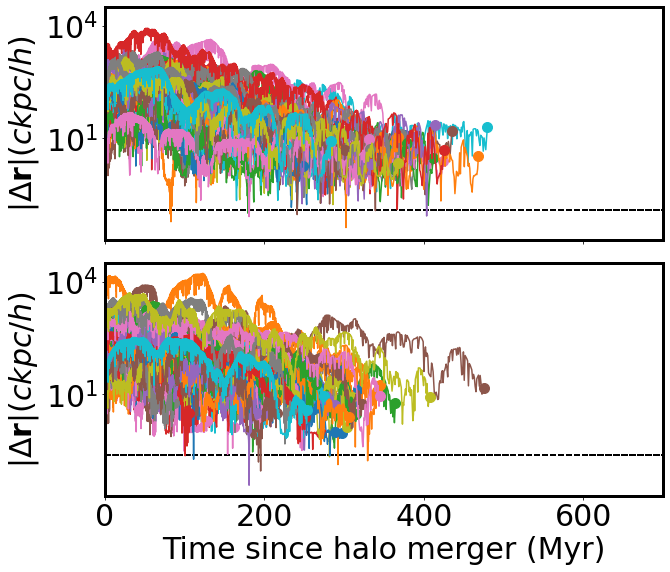

In [171]:



path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_FOF_7_5.00_strict_velocity_gas_res/'
basePath=path_to_output+run+output
path_to_trajectories = basePath+'/merger_trajectories'

merger_properties,initial_trajectory_primary,initial_trajectory_secondary=numpy.load(basePath + '/merger_statistics.npy',allow_pickle=True)
merger_type=numpy.array(merger_properties['merger_type'])
merger_redshift = numpy.array(merger_properties['merger_redshift'])


f,ax=plt.subplots(2,1,figsize=(10,9),sharex=True,sharey=True)
ax[0].set_xlim(-100,1700)

#ax[0].set_ylim(1e-2,400)

axx=ax[0]

for N in range(0,50):
    #print(N)
    
    d_rpos,d_vel,time_space,time_space_zero,d_rpos_dvel,eccentricity= do(N,get_ecc=1)
    #mask=d_rpos < 700
    axx.errorbar(time_space_zero,eccentricity,color='C%d'%N) 
    axx.errorbar([time_space_zero[0]],eccentricity[0],marker='o',ms=10,color='C%d'%N)
    axx.axhline(0.125,color='black',linestyle='dashed')      
    axx.set_yscale('log')


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_FOF_7_5.00_discreteDF_strict_velocity_gas_res/'
basePath=path_to_output+run+output
path_to_trajectories = basePath+'/merger_trajectories'

merger_properties,initial_trajectory_primary,initial_trajectory_secondary=numpy.load(basePath + '/merger_statistics.npy',allow_pickle=True)
merger_type=numpy.array(merger_properties['merger_type'])
merger_redshift = numpy.array(merger_properties['merger_redshift'])

axx=ax[1]

for N in range(0,50):
    #print(N)
    try:
        d_rpos,d_vel,time_space,time_space_zero,d_rpos_dvel,eccentricity= do(N,get_ecc=1)
        #mask=d_rpos < 700
        axx.errorbar(time_space_zero,eccentricity,color='C%d'%N) 
        axx.errorbar([time_space_zero[0]],eccentricity[0],marker='o',ms=10,color='C%d'%N)
        axx.axhline(0.25,color='black',linestyle='dashed')      
        axx.set_yscale('log')
    except:
        aaa=1

    
    
for i in range(0,2):
    ax[i].tick_params(labelsize=30)
    ax[i].set_ylabel(r'$|\Delta \mathbf{r}| (ckpc/h)$',fontsize=30)
    
    
ax[1].set_xlabel('Time since halo merger (Myr)',fontsize=30)

ax[1].set_xlim(0,700)



for a in ax.flatten():
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 

plt.subplots_adjust(wspace=0,hspace=0.1)
    
    
plt.savefig('./Paper8_figures/time_evolution_pos_DF.png',bbox_inches='tight')
#for N in range(0,20): 
#    d_rpos,d_vel,time_space,time_space_zero= do(N)
#    axx.errorbar([time_space_zero[0]],d_rpos[0],marker='o',ms=10)







#make_plot(col='C0',s=15)

[295.06683449 286.45049399 273.04021079 256.68872624 255.12696354
 245.04038465 195.76198629 157.81684692  38.61348846  36.73224414
  34.47475095  31.05281683]
1
[321.94382987 305.30570713 281.46093651 250.42658219 206.76895932
 143.38046908 112.47164889]
[359.2662216  349.27163111 311.1315034  310.04651145 308.41902351
 279.2126085  226.28441932 222.61413126 181.16907821 135.82763685
  95.14547066  49.79912318  46.96928089  45.27638276  43.82532722
  32.70056807  29.67076075  27.39773119  26.26121641  22.62436912
  15.64981511]
[269.01758596 264.62716189 260.67578023 252.77301691 247.19635014
 243.94533962 228.90941598 226.87753441 225.65840546 200.6230774
 173.91606483 159.21974791 121.06840052  97.24854418  79.08834529]
[275.76792581 228.35572975 136.36141951]
[83.9232649  83.39115616 57.17352977 55.53809614 54.63962088 39.79181796]
[199.64928487 190.70778918 182.11048432 181.27913449 131.00084572
  96.2023115   95.56881769]
7
[304.72600855 275.00193821 230.90830391 168.88479262 115

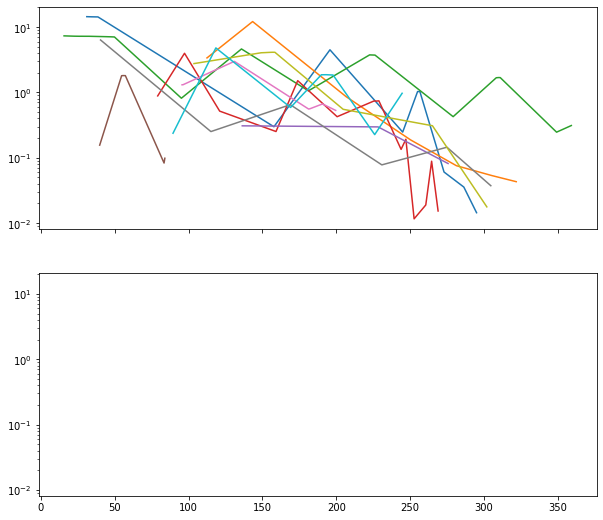

In [175]:
from scipy.signal import argrelextrema
from scipy.stats import linregress
def find_orbital_period(separation, time):
    # Find local minima indices
    minima_indices = argrelextrema(separation, np.less)[0]
    
    # Calculate time intervals between consecutive minima
    orbital_periods = abs(np.diff(time[minima_indices]))
    
    
    # Calculate average orbital period
    average_period = np.mean(orbital_periods)
    
    slope, intercept, r_value, p_value, std_err = linregress(time, separation)
    
    return average_period,minima_indices,orbital_periods,slope

f,ax=plt.subplots(2,1,figsize=(10,9),sharex=True,sharey=True)

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_FOF_7_5.00_discreteDF_strict_velocity_gas_res/'
basePath=path_to_output+run+output
path_to_trajectories = basePath+'/merger_trajectories'

merger_properties,initial_trajectory_primary,initial_trajectory_secondary=numpy.load(basePath + '/merger_statistics.npy',allow_pickle=True)
merger_type=numpy.array(merger_properties['merger_type'])
merger_redshift = numpy.array(merger_properties['merger_redshift'])

orbital_period_space=[]
number_of_orbits_to_merger_space=[]
last_period_before_merger = []
decay_rate_space=[]
for N in range(0,len(merger_type))[0:10]:
    #print(N)
    
    d_rpos,d_vel,time_space,time_space_zero,d_rpos_dvel= do(N)
    separation = d_rpos
    time = time_space_zero
    #print(time[minima_indices])
    orbital_period,minima_indices,orbital_periods,decay_rate = find_orbital_period(separation, time)
    
    ax[0].errorbar(time[minima_indices],d_rpos[minima_indices])
    
    print(d_rp[minima_indices])
    
    if(len(orbital_periods)>0):
        orbital_period_space.append(numpy.average(orbital_periods[:-3]))
        number_of_orbits_to_merger_space.append(len(orbital_periods))
        decay_rate_space.append(decay_rate)
        last_period_before_merger.append(orbital_periods[0])    
last_period_before_merger = numpy.array(last_period_before_merger)
orbital_period_space=numpy.array(orbital_period_space)
number_of_orbits_to_merger_space=numpy.array(number_of_orbits_to_merger_space)
decay_rate_space=numpy.array(decay_rate_space)


ax[0].set_yscale('log')

numpy.save(path_to_trajectories + '/orbit_info.npy',[orbital_period_space,number_of_orbits_to_merger_space,decay_rate_space,last_period_before_merger] )


    


[32.05666825 23.83908256 19.52167591  9.98162164         nan 13.37486756
  6.12338346 36.90885232 24.76394626 13.68233465 30.01647953 44.76523029
 14.96897643         nan 29.93750218 62.87409608         nan  6.52256358
 26.20734503 19.00240126 10.17757873 26.7620631  28.84952622  7.28030912
  8.00245338  4.98830016  3.13095089         nan  4.12022451 23.0251107
 14.78353709 23.09529414         nan  1.00820596 11.08471811  6.51951891
 20.73296245 18.25710784         nan 20.55392388         nan  8.78445125
  5.49865364 12.05615177 19.29235115 29.57826534 12.46397838 35.0320447
         nan         nan  7.21546426         nan 16.22421445 29.77901948
         nan 13.21793486 38.62322354 17.66913865 10.66943979 23.08886433
 52.43956485 22.16985558 40.70236351 30.8464728  22.16198368 18.10615391
 44.34316566  5.41458112 33.30506855  9.26357937 27.32814846 24.54550971
 41.79964418 31.51157266         nan         nan 15.40045367         nan
  9.82414803 43.87512751 48.2558734  16.21467458 23.5

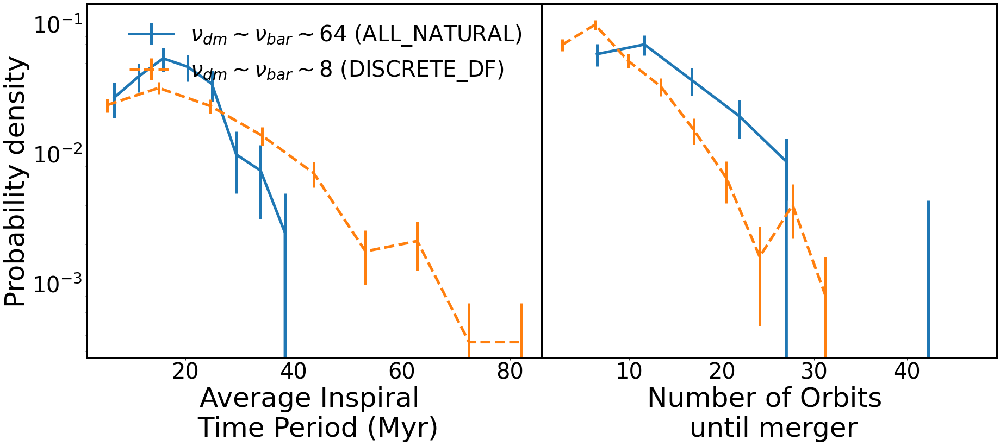

In [153]:

f,ax=plt.subplots(1,2,figsize=(30,12),sharey=True)
#ax[0].set_xlim(-100,500)

#ax[0].set_ylim(1e-2,400)

Nbins=10

axx=ax[0]


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_FOF_7_5.00_strict_velocity_gas_res/'
basePath=path_to_output+run+output
path_to_trajectories = basePath+'/merger_trajectories'
orbital_period_space,number_of_orbits_to_merger_space,decay_rate_space,last_period_before_merger=numpy.load(path_to_trajectories + '/orbit_info.npy')
decay_rate_space=-decay_rate_space

centers,b,c,norm,counts_sum=arepo_package.get_probability_density(orbital_period_space,Nbins, min(orbital_period_space),max(orbital_period_space),linear=1)
ax[0].errorbar(centers,b,c,color='C0',linewidth=5,label=r'$\nu_{dm} \sim \nu_{bar} \sim 64$ (ALL_NATURAL)')
centers,b,c,norm,counts_sum=arepo_package.get_probability_density(number_of_orbits_to_merger_space,Nbins, min(number_of_orbits_to_merger_space),max(number_of_orbits_to_merger_space),linear=1)
ax[1].errorbar(centers,b,c,color='C0',linewidth=5)

centers,b,c,norm,counts_sum=arepo_package.get_probability_density(decay_rate_space,Nbins, min(decay_rate_space),max(decay_rate_space),linear=1)
#ax[2].errorbar(centers,b,c)



path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_FOF_7_5.00_discreteDF_strict_velocity_gas_res/'
basePath=path_to_output+run+output
path_to_trajectories = basePath+'/merger_trajectories'
orbital_period_space,number_of_orbits_to_merger_space,decay_rate_space,last_period_before_merger=numpy.load(path_to_trajectories + '/orbit_info.npy')
decay_rate_space=-decay_rate_space

print(orbital_period_space)

centers,b,c,norm,counts_sum=arepo_package.get_probability_density(orbital_period_space,Nbins, min(orbital_period_space),max(orbital_period_space),linear=1)
ax[0].errorbar(centers,b,c,color='C1',linewidth=5,linestyle='dashed',label=r'$\nu_{dm} \sim \nu_{bar} \sim 8$ (DISCRETE_DF)')
centers,b,c,norm,counts_sum=arepo_package.get_probability_density(number_of_orbits_to_merger_space,Nbins, min(number_of_orbits_to_merger_space),max(number_of_orbits_to_merger_space),linear=1)
ax[1].errorbar(centers,b,c,color='C1',linewidth=5,linestyle='dashed')


centers,b,c,norm,counts_sum=arepo_package.get_probability_density(decay_rate_space,Nbins, min(decay_rate_space),max(decay_rate_space),linear=1)
#ax[2].errorbar(centers,b,c)

ax[0].set_yscale('log')


ax[0].tick_params(labelsize=40)


ax[1].tick_params(labelsize=40)


plt.subplots_adjust(wspace=0)

ax[0].set_ylabel('Probability density',fontsize=50)


ax[0].set_xlabel('Average Inspiral \n Time Period (Myr)',fontsize=50)

ax[1].set_xlabel('Number of Orbits \n until merger',fontsize=50)

#ax[2].tick_params(labelsize=40)

#ax[0].

for a in ax.flatten():
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 
    
ax[0].legend(loc='upper right',fontsize=40,frameon=False)



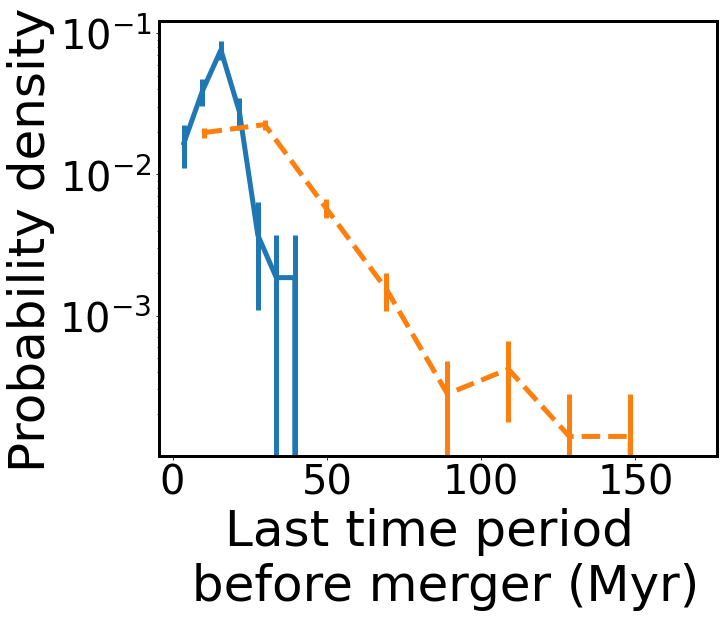

In [152]:

f,ax=plt.subplots(1,1,figsize=(10,8),sharey=True)
#ax[0].set_xlim(-100,500)

#ax[0].set_ylim(1e-2,400)

Nbins=10

axx=ax


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_FOF_7_5.00_strict_velocity_gas_res/'
basePath=path_to_output+run+output
path_to_trajectories = basePath+'/merger_trajectories'
orbital_period_space,number_of_orbits_to_merger_space,decay_rate_space,last_period_before_merger=numpy.load(path_to_trajectories + '/orbit_info.npy')
decay_rate_space=-decay_rate_space

centers,b,c,norm,counts_sum=arepo_package.get_probability_density(last_period_before_merger,Nbins, min(last_period_before_merger),max(last_period_before_merger),linear=1)
ax.errorbar(centers,b,c,color='C0',linewidth=5)



path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_FOF_7_5.00_discreteDF_strict_velocity_gas_res/'
basePath=path_to_output+run+output
path_to_trajectories = basePath+'/merger_trajectories'
orbital_period_space,number_of_orbits_to_merger_space,decay_rate_space,last_period_before_merger=numpy.load(path_to_trajectories + '/orbit_info.npy')
decay_rate_space=-decay_rate_space


centers,b,c,norm,counts_sum=arepo_package.get_probability_density(last_period_before_merger,Nbins, min(last_period_before_merger),max(last_period_before_merger),linear=1)
ax.errorbar(centers,b,c,color='C1',linewidth=5,linestyle='dashed')


ax.set_yscale('log')


ax.tick_params(labelsize=40)




plt.subplots_adjust(wspace=0)

ax.set_ylabel('Probability density',fontsize=50)


ax.set_xlabel('Last time period \n before merger (Myr)',fontsize=50)


#ax[2].tick_params(labelsize=40)

#ax[0].

for a in [ax]:
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 



1
7


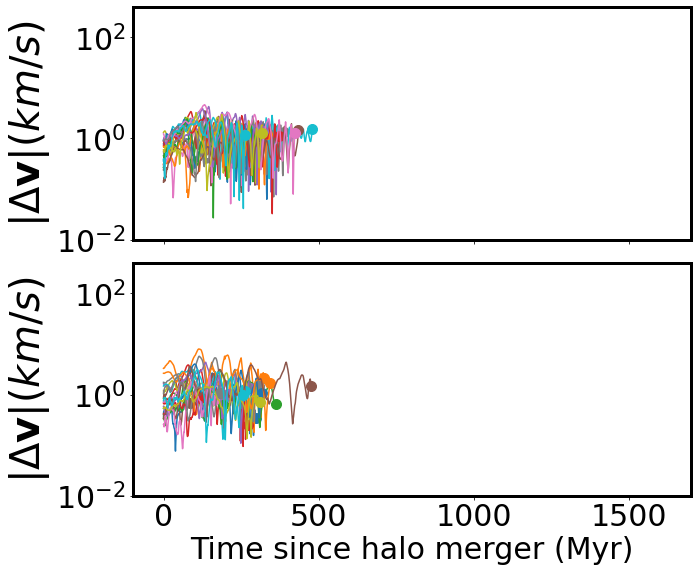

In [23]:



path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_FOF_7_5.00_strict_velocity_gas_res/'
basePath=path_to_output+run+output
path_to_trajectories = basePath+'/merger_trajectories'

merger_properties,initial_trajectory_primary,initial_trajectory_secondary=numpy.load(basePath + '/merger_statistics.npy',allow_pickle=True)
merger_type=numpy.array(merger_properties['merger_type'])
merger_redshift = numpy.array(merger_properties['merger_redshift'])


f,ax=plt.subplots(2,1,figsize=(10,9),sharex=True,sharey=True)
ax[0].set_xlim(-100,1700)

ax[0].set_ylim(1e-2,400)

axx=ax[0]

for N in range(0,20):
    #print(N)
    
    d_rpos,d_vel,time_space,time_space_zero,d_rpos_dvel= do(N)
    #mask=d_rpos < 700
    axx.errorbar(time_space_zero,d_vel,color='C%d'%N) 
    axx.errorbar([time_space_zero[0]],d_vel[0],marker='o',ms=10,color='C%d'%N)
    #axx.axhline(0.25,color='black',linestyle='dashed')      
    axx.set_yscale('log')
       



path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_FOF_7_5.00_discreteDF_strict_velocity_gas_res/'
basePath=path_to_output+run+output
path_to_trajectories = basePath+'/merger_trajectories'

merger_properties,initial_trajectory_primary,initial_trajectory_secondary=numpy.load(basePath + '/merger_statistics.npy',allow_pickle=True)
merger_type=numpy.array(merger_properties['merger_type'])
merger_redshift = numpy.array(merger_properties['merger_redshift'])

axx=ax[1]

for N in range(0,20):
    #print(N)
    
    d_rpos,d_vel,time_space,time_space_zero,d_rpos_dvel= do(N)
    #mask=d_rpos < 700
    axx.errorbar(time_space_zero,d_vel,color='C%d'%N) 
    axx.errorbar([time_space_zero[0]],d_vel[0],marker='o',ms=10,color='C%d'%N)
    #axx.axhline(0.25,color='black',linestyle='dashed')      
    axx.set_yscale('log')
       

    
for i in range(0,2):
    ax[i].tick_params(labelsize=30)
    ax[i].set_ylabel(r'$|\Delta \mathbf{v}| (km/s)$',fontsize=40)
    
    
ax[1].set_xlabel('Time since halo merger (Myr)',fontsize=30)



for a in ax.flatten():
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 

plt.subplots_adjust(wspace=0,hspace=0.1)
    
    
plt.savefig('./Paper8_figures/time_evolution_pos_DF.png',bbox_inches='tight')
#for N in range(0,20): 
#    d_rpos,d_vel,time_space,time_space_zero= do(N)
#    axx.errorbar([time_space_zero[0]],d_rpos[0],marker='o',ms=10)







#make_plot(col='C0',s=15)

5


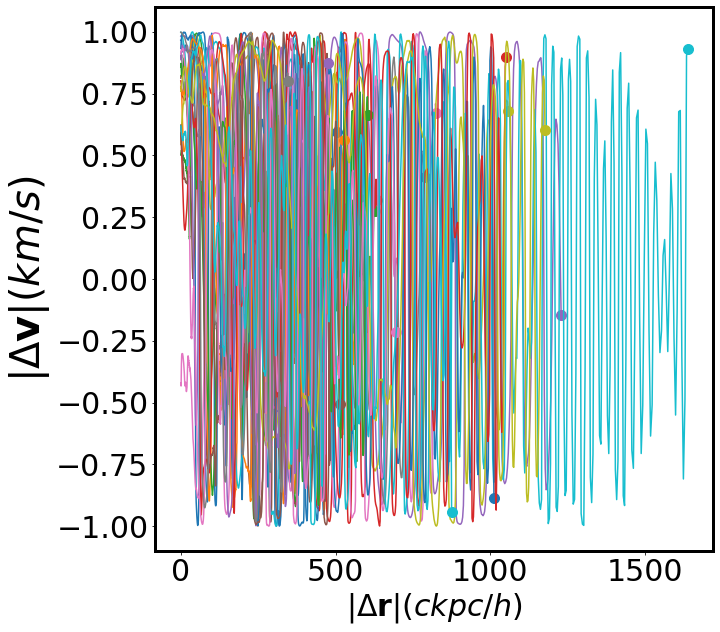

In [68]:

f,ax=plt.subplots(1,1,figsize=(10,10),sharex=True,sharey=True)

#ax.set_ylim(-50,50)
#ax[0].set_ylim(0.02,20)
#print(xpos_primary)

axx=ax
  
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_ratio1000_SFMFGM5_seed3.19_HDM5.00_strict_velocity/'
basePath=path_to_output+run+output
path_to_trajectories = basePath+'/merger_trajectories'

merger_properties,initial_trajectory_primary,initial_trajectory_secondary=numpy.load(basePath + '/merger_statistics.npy',allow_pickle=True)
merger_type=numpy.array(merger_properties['merger_type'])
merger_redshift = numpy.array(merger_properties['merger_redshift'])


#f,ax=plt.subplots(2,2,figsize=(20,8))
#print(xpos_primary)
axx=ax
for N in range(0,20):
    #print(N)
    
    d_rpos,d_vel,time_space,time_space_zero,d_rpos_dvel= do(N)
    #mask=d_rpos < 700
    axx.errorbar(time_space_zero,d_rpos_dvel/(d_rpos * d_vel),color='C%d'%N) 
    axx.errorbar(time_space_zero[0],(d_rpos_dvel/(d_rpos * d_vel))[0],marker='o',ms=10,color='C%d'%N)
    #axx.axhline(0.25,color='black',linestyle='dashed')      
    #axx.set_yscale('log')
    #axx.set_xscale('log')
    
    
#for i in range(0,4):
   # ax.tick_params(labelsize=30)
    
ax.set_xlabel(r'$|\Delta \mathbf{r}| (ckpc/h)$',fontsize=30)
ax.set_ylabel(r'$|\Delta \mathbf{v}| (km/s)$',fontsize=40)
    
    
#ax.set_xlabel('Time since halo merger (Myr)',fontsize=30)

#ax[0].text(500,0.03,'REPOSITIONING \n MERGE_HSML',fontsize=25)
ax.tick_params(labelsize=30)
for a in [ax]:
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 

plt.subplots_adjust(wspace=0,hspace=0.1)
    
#for N in range(0,20): 
#    d_rpos,d_vel,time_space,time_space_zero= do(N)
#    axx.errorbar([time_space_zero[0]],d_rpos[0],marker='o',ms=10)


plt.savefig('./Paper8_figures/phase_evolution_vel_DF.png',bbox_inches='tight')


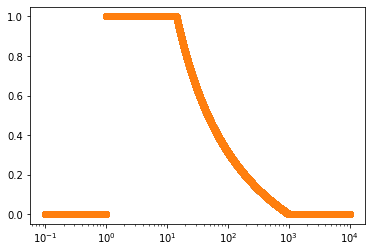

In [50]:
nu_space = numpy.logspace(-1,4,10000)

𝑔 = [min(1.0, max(0, (3./numpy.log10(nu)-1)/1.6)) for nu in nu_space]


plt.scatter(nu_space,g)


nu_space = numpy.logspace(-1,4,10000)

𝑔 = [min(1.0, max(0, (3./numpy.log10(nu)-1)/1.6)) for nu in nu_space]

plt.scatter(nu_space,g)

plt.xscale('log')

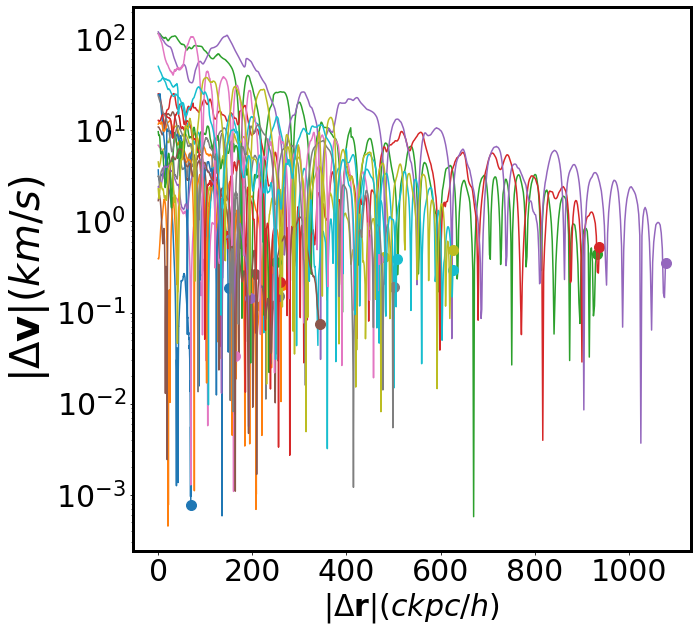

In [61]:

f,ax=plt.subplots(1,1,figsize=(10,10),sharex=True,sharey=True)

#ax[0].set_xlim(-100,1700)
#ax[0].set_ylim(0.02,20)
#print(xpos_primary)

axx=ax
  
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM5.00_strict_velocity/'
basePath=path_to_output+run+output
path_to_trajectories = basePath+'/merger_trajectories'

merger_properties,initial_trajectory_primary,initial_trajectory_secondary=numpy.load(basePath + '/merger_statistics.npy',allow_pickle=True)
merger_type=numpy.array(merger_properties['merger_type'])
merger_redshift = numpy.array(merger_properties['merger_redshift'])


#f,ax=plt.subplots(2,2,figsize=(20,8))
#print(xpos_primary)
axx=ax
for N in range(0,20):
    #print(N)
    
    d_rpos,d_vel,time_space,time_space_zero,d_rpos_dvel= do(N)
    #mask=d_rpos < 700
    axx.errorbar(time_space_zero,abs(d_rpos_dvel),color='C%d'%N) 
    axx.errorbar(time_space_zero[0],abs(d_rpos_dvel)[0],marker='o',ms=10,color='C%d'%N)
    #axx.axhline(0.25,color='black',linestyle='dashed')      
    axx.set_yscale('log')
    #axx.set_xscale('log')
    
    
#for i in range(0,4):
   # ax.tick_params(labelsize=30)
    
ax.set_xlabel(r'$|\Delta \mathbf{r}| (ckpc/h)$',fontsize=30)
ax.set_ylabel(r'$|\Delta \mathbf{v}| (km/s)$',fontsize=40)
    
    
#ax.set_xlabel('Time since halo merger (Myr)',fontsize=30)

#ax[0].text(500,0.03,'REPOSITIONING \n MERGE_HSML',fontsize=25)
ax.tick_params(labelsize=30)
for a in [ax]:
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 

plt.subplots_adjust(wspace=0,hspace=0.1)
    
#for N in range(0,20): 
#    d_rpos,d_vel,time_space,time_space_zero= do(N)
#    axx.errorbar([time_space_zero[0]],d_rpos[0],marker='o',ms=10)


plt.savefig('./Paper8_figures/phase_evolution_vel_DF.png',bbox_inches='tight')


In [71]:
def make_plot(labl='',col='blue',softening=1,style='solid',width=4):
    #hubble=0.6771
    velocities1_space=numpy.array([])
    GroupMass1_space=numpy.array([])
    distances1_Min_Pot_space=numpy.array([])
    distances1_Min_Pot_without_BH_space=numpy.array([])
    Nblocks=40

    folder=basePath+'/new_BH_distances_velocities_from_center_mpi_%d/'%desired_redshift
    files = os.listdir(folder)

    # Iterate over each file and load it using numpy.load
    for file_name in files:
        #file_name = 'new_BH_distances_from_center_mpi_%d/block_%d.npy'%(desired_redshift,block)
        distances1, distances1_Min_Pot, distances1_Min_Pot_without_BH, GroupBHMass1,GroupMass1,velocities1 = numpy.load(folder+file_name,allow_pickle=True)
        distances1_Min_Pot_space=numpy.append(distances1_Min_Pot_space,distances1_Min_Pot)
        distances1_Min_Pot_without_BH_space=numpy.append(distances1_Min_Pot_without_BH_space,distances1_Min_Pot_without_BH)
        #print(GroupMass1)
        GroupMass1_space=numpy.append(GroupMass1_space,GroupMass1)
        velocities1_space = numpy.append(velocities1_space,velocities1)

    centers,HMF,dHMF,norm,counts_sum = arepo_package.get_probability_density(numpy.log10(velocities1_space),Nbin,vmax,vmin,linear=1)

    ax.errorbar(distances1_Min_Pot_without_BH_space,velocities1_space,label=labl,color=col,linewidth=0,marker='o')



[0.04038426 0.51572344 0.51572344 ... 0.49712531 0.38982847 0.49732982]
[0.07964842 0.15050658 0.50228501 ... 0.49712531 0.43599889 0.49399418]
[0.49712531 0.50228501 0.49745973 ... 0.51116598 0.49712531 0.49712531]
[0.45846783 0.51572344 0.51116598 ... 0.49712531 0.50228501 0.49508345]


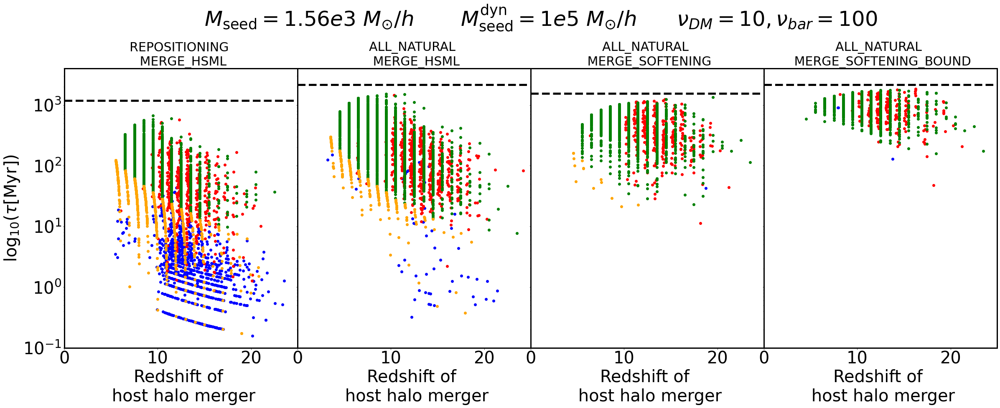

In [119]:
def make_plot(Nbins=20,cmap='Blues',col='Blue'):
    xbins = np.linspace(0, 25, Nbins)  # 20 bins between -4 and 4 for x
    ybins = np.linspace(-3, 4, Nbins)
    GroupMass,o=arepo_package.get_group_property(basePath,'GroupMass',0)
    max_time=T(o,12300)/1e6/hubble
    
    merger_properties,initial_trajectory_primary,initial_trajectory_secondary=numpy.load(basePath + '/merger_statistics.npy',allow_pickle=True)
    merger_type=numpy.array(merger_properties['merger_type'])
    merger_redshift = numpy.array(merger_properties['merger_redshift'])
    merger_time_scale_best = numpy.array(merger_properties['merger_time_scale_best'])
    merger_time_scale_err = numpy.array(merger_properties['merger_time_scale_err'])
    halo_merger_redshift_before = numpy.array(merger_properties['halo_merger_redshift_before'])
    halo_merger_redshift_after = numpy.array(merger_properties['halo_merger_redshift_after'])
    halo_merger_redshift_mid = (halo_merger_redshift_before+halo_merger_redshift_after)/2
    halo_merger_redshift_err = (halo_merger_redshift_before-halo_merger_redshift_after)/2
    mask0=merger_type==0
    mask1=merger_type==1
    mask2=merger_type==2
    mask3=merger_type==3
    
    print(halo_merger_redshift_err)
    
    #mask=merger_type==merger_type
    #hist = ax.hist2d(redshift_bh_merger[mask], numpy.log10(merger_time_scale[mask]+0.01), bins=[xbins,ybins],norm=mpl.colors.LogNorm(vmin=1,vmax=500), cmap=cmap)
    ax.errorbar(halo_merger_redshift_mid[mask0],merger_time_scale_best[mask0],xerr=halo_merger_redshift_mid[mask0]*100,yerr=merger_time_scale_err[mask0],linewidth=0,marker='o',color='blue')
    ax.errorbar(halo_merger_redshift_mid[mask1],merger_time_scale_best[mask1],xerr=halo_merger_redshift_mid[mask1],yerr=merger_time_scale_err[mask1],linewidth=0,marker='o',color='red')
    ax.errorbar(halo_merger_redshift_mid[mask2],merger_time_scale_best[mask2],xerr=halo_merger_redshift_mid[mask2],yerr=merger_time_scale_err[mask2],linewidth=0,marker='o',color='green')
    ax.errorbar(halo_merger_redshift_mid[mask3],merger_time_scale_best[mask3],xerr=halo_merger_redshift_mid[mask3],yerr=merger_time_scale_err[mask3],linewidth=0,marker='o',color='orange')

    
    ax.set_xlabel('Redshift of \n host halo merger',fontsize=40)
    ax.tick_params(labelsize=40)
    ax.set_ylim(0.1,4e3)
    ax.set_xlim(0,25)
    ax.set_yscale('log')
    #ax.axhline(13.7*1000,linestyle='dashed',color='grey',linewidth=5)
    ax.axhline(max_time,linestyle='dashed',color='black',linewidth=5)
    #cbar = f.colorbar(hist[3], ax=ax,orientation='horizontal')
    #cbar.ax.set_ylabel('Counts (log scale)',fontsize=40)
    #cbar.ax.tick_params(labelsize=40)
    #return hist


def put_mean(Nbins=20,col='black'):
    merger_time_scale,merger_type,redshift_bh_merger,redshift_galaxy_merger,event_index_in_merger_catalog,event_index_in_galaxy_merger_catalog=numpy.load(basePath+ '/finalized_merger_time_scales.npy')
    mask=merger_type!=2
    a,b,d=arepo_package.mean_plot2(redshift_bh_merger[mask],numpy.log10(merger_time_scale[mask]+0.01),False,False,0,25,Nbins)
    i=0
    for i in range(0,4):
        print(a,b)
        axx[i].errorbar(a,b,color=col,linewidth=7)
        i+=1



f,axx=plt.subplots(1,4,figsize=(40,12),sharey=True,sharex=True)

#ax.set_title('$M^{\mathrm{dyn}}_{\mathrm{seed}}=1e5 \ M_{\odot}/h$',fontsize=30)

ax=axx[0]
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_ratio1000_SFMFGM5_seed3.19_repositioning/'
basePath=path_to_output+run+output

make_plot(col='black')
#put_mean()

ax=axx[1]
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_ratio1000_SFMFGM5_seed3.19_HDM5.00/'
basePath=path_to_output+run+output
make_plot(cmap='Blues')
#put_mean(col='Blue')


ax=axx[2]
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_ratio1000_SFMFGM5_seed3.19_HDM5.00_strict/'
basePath=path_to_output+run+output
make_plot(cmap='Greens')
#put_mean(col='green')


ax=axx[3]
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_ratio1000_SFMFGM5_seed3.19_HDM5.00_strict_velocity/'
basePath=path_to_output+run+output
make_plot(cmap='Reds')
#put_mean(col='red')

# Add a colorbar


# Set axis labels and title

axx[0].set_ylabel(r'$\log_{10}(\tau[\mathrm{Myr}])$',fontsize=40)


plt.subplots_adjust(wspace=0)


# Increase font size of axis ticks
#ax.tick_params(axis='both', labelsize=14) [1]



for a in axx.flatten():
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 
    
axx[0].set_title('REPOSITIONING \n MERGE_HSML',fontsize=30)
axx[1].set_title('ALL_NATURAL \n MERGE_HSML',fontsize=30)
axx[2].set_title('ALL_NATURAL \n MERGE_SOFTENING',fontsize=30)
axx[3].set_title('ALL_NATURAL \n MERGE_SOFTENING_BOUND',fontsize=30)
    
    
    
tt='$M_{\mathrm{seed}}=1.56e3 \ M_{\odot}/h$       $M_{\mathrm{seed}}^{\mathrm{dyn}}=1e5 \ M_{\odot}/h$      '+r'$\nu_{DM}=10,\nu_{bar} = 100$'   
axx[0].text(15,20000,tt,fontsize=50) 

plt.subplots_adjust(wspace=0,hspace=-0.3,top=0.90)
plt.savefig('./Paper8_figures/merger_time_scales_noDF.png',bbox_inches='tight')











[0.04038426 0.51572344 0.51572344 ... 0.49712531 0.38982847 0.49732982]
[0.05174631 2.59322555 0.18021415 ... 0.48952641 0.49508345 0.50337795]
[0.53443768 0.41438922 0.49745973 ... 0.50228501 0.50228501 0.51116598]
[0.29882413 0.50793415 0.49712531 ... 0.48952641 0.50288077 0.47615488]


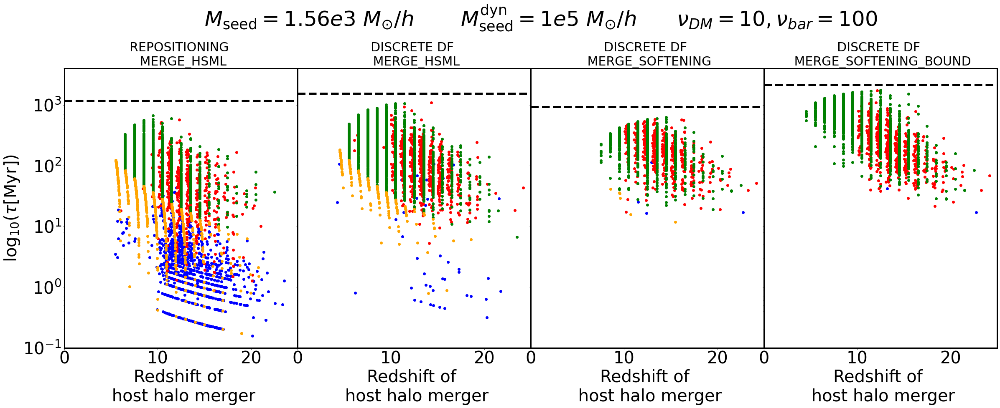

In [121]:

f,axx=plt.subplots(1,4,figsize=(40,12),sharey=True,sharex=True)

#ax.set_title('$M^{\mathrm{dyn}}_{\mathrm{seed}}=1e5 \ M_{\odot}/h$',fontsize=30)

ax=axx[0]
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_ratio1000_SFMFGM5_seed3.19_repositioning/'
basePath=path_to_output+run+output

make_plot(col='black')
#put_mean()

ax=axx[1]
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM5.00/'
basePath=path_to_output+run+output
make_plot(cmap='Blues')
#put_mean(col='Blue')


ax=axx[2]
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM5.00_strict/'
basePath=path_to_output+run+output
make_plot(cmap='Greens')
#put_mean(col='green')


ax=axx[3]
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM5.00_strict_velocity/'
basePath=path_to_output+run+output
make_plot(cmap='Reds')
#put_mean(col='red')

# Add a colorbar


# Set axis labels and title

axx[0].set_ylabel(r'$\log_{10}(\tau[\mathrm{Myr}])$',fontsize=40)
ax.set_title('2D Histogram with Logarithmic Normalization')

plt.subplots_adjust(wspace=0)


# Increase font size of axis ticks
#ax.tick_params(axis='both', labelsize=14) [1]



for a in axx.flatten():
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 
    
axx[0].set_title('REPOSITIONING \n MERGE_HSML',fontsize=30)
axx[1].set_title('DISCRETE DF \n MERGE_HSML',fontsize=30)
axx[2].set_title('DISCRETE DF \n MERGE_SOFTENING',fontsize=30)
axx[3].set_title('DISCRETE DF \n MERGE_SOFTENING_BOUND',fontsize=30)
    
tt='$M_{\mathrm{seed}}=1.56e3 \ M_{\odot}/h$       $M_{\mathrm{seed}}^{\mathrm{dyn}}=1e5 \ M_{\odot}/h$      '+r'$\nu_{DM}=10,\nu_{bar} = 100$'   
axx[0].text(15,20000,tt,fontsize=50) 
plt.subplots_adjust(wspace=0,hspace=-0.3,top=0.90)
plt.savefig('./Paper8_figures/merger_time_scales_DF.png',bbox_inches='tight')











In [143]:
def make_plot(Nbins=20,cmap='Blues',col='Blue',s=10,labl=''):
    xbins = np.linspace(0, 25, Nbins)  # 20 bins between -4 and 4 for x
    ybins = np.linspace(-3, 4, Nbins)
    GroupMass,o=arepo_package.get_group_property(basePath,'GroupMass',0)
    max_time=T(o,12300)/1e6/hubble
    
    merger_properties,initial_trajectory_primary,initial_trajectory_secondary=numpy.load(basePath + '/merger_statistics.npy',allow_pickle=True)
    merger_type=numpy.array(merger_properties['merger_type'])
    merger_redshift = numpy.array(merger_properties['merger_redshift'])
    merger_time_scale_best = numpy.array(merger_properties['merger_time_scale_best'])
    merger_time_scale_err = numpy.array(merger_properties['merger_time_scale_err'])
    halo_merger_redshift_before = numpy.array(merger_properties['halo_merger_redshift_before'])
    halo_merger_redshift_after = numpy.array(merger_properties['halo_merger_redshift_after'])
    halo_merger_redshift_mid = (halo_merger_redshift_before+halo_merger_redshift_after)/2
    halo_merger_redshift_err = (halo_merger_redshift_before-halo_merger_redshift_after)/2
    mask0=merger_type==0
    mask1=merger_type==1
    mask2=merger_type==2
    mask3=merger_type==3
    
    #print(halo_merger_redshift_err)
    
    #mask=merger_type==merger_type
    #hist = ax.hist2d(redshift_bh_merger[mask], numpy.log10(merger_time_scale[mask]+0.01), bins=[xbins,ybins],norm=mpl.colors.LogNorm(vmin=1,vmax=500), cmap=cmap)
    ax.errorbar(halo_merger_redshift_mid[mask0],merger_time_scale_best[mask0],xerr=halo_merger_redshift_mid[mask0]*100,yerr=merger_time_scale_err[mask0],linewidth=0,marker='o',color=col,ms=s)
    ax.errorbar(halo_merger_redshift_mid[mask1],merger_time_scale_best[mask1],xerr=halo_merger_redshift_mid[mask1],yerr=merger_time_scale_err[mask1],linewidth=0,marker='o',color=col,ms=s,label=labl)
    ax.errorbar(halo_merger_redshift_mid[mask2],merger_time_scale_best[mask2],xerr=halo_merger_redshift_mid[mask2],yerr=merger_time_scale_err[mask2],linewidth=0,marker='o',color=col,ms=s)
    ax.errorbar(halo_merger_redshift_mid[mask3],merger_time_scale_best[mask3],xerr=halo_merger_redshift_mid[mask3],yerr=merger_time_scale_err[mask3],linewidth=0,marker='o',color=col,ms=s)

    
    ax.set_xlabel('Redshift of \n host halo merger',fontsize=40)
    ax.tick_params(labelsize=40)
    ax.set_ylim(8,4e3)
    ax.set_xlim(0,25)
    ax.set_yscale('log')
    #ax.axhline(13.7*1000,linestyle='dashed',color='grey',linewidth=5)
    ax.axhline(max_time,linestyle='dashed',color=col,linewidth=5)
    #cbar = f.colorbar(hist[3], ax=ax,orientation='horizontal')
    #cbar.ax.set_ylabel('Counts (log scale)',fontsize=40)
    #cbar.ax.tick_params(labelsize=40)
    #return hist

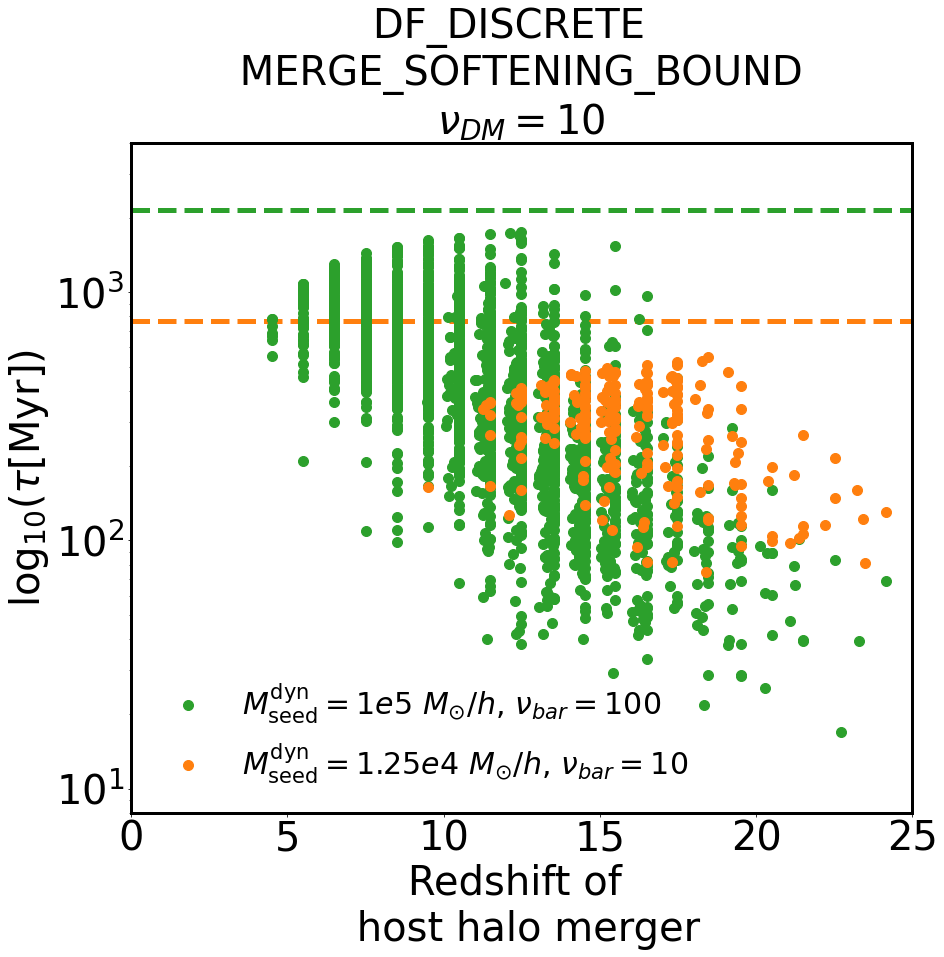

In [144]:

f,axx=plt.subplots(1,1,figsize=(14,12),sharey=True,sharex=True)

#ax.set_title('$M^{\mathrm{dyn}}_{\mathrm{seed}}=1e5 \ M_{\odot}/h$',fontsize=30)

ax=axx
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM5.00_strict_velocity/'
basePath=path_to_output+run+output
make_plot(col='C2',labl='$M_{\mathrm{seed}}^{\mathrm{dyn}}=1e5 \ M_{\odot}/h$,' + r' $\nu_{bar} = 100$' )


ax=axx
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM4.10_strict_velocity/'
basePath=path_to_output+run+output
make_plot(col='C1',labl='$M_{\mathrm{seed}}^{\mathrm{dyn}}=1.25e4 \ M_{\odot}/h$,' + r' $\nu_{bar} = 10$')
#put_mean(col='green')



#put_mean(col='red')

# Add a colorbar


# Set axis labels and title

axx.set_ylabel(r'$\log_{10}(\tau[\mathrm{Myr}])$',fontsize=40)
ax.set_title('2D Histogram with Logarithmic Normalization')

plt.subplots_adjust(wspace=0)


# Increase font size of axis ticks
#ax.tick_params(axis='both', labelsize=14) [1]



for a in [axx]:
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 
    
#axx[0].set_title('REPOSITIONING \n MERGE_HSML',fontsize=30)
#axx[1].set_title('DISCRETE DF \n MERGE_HSML',fontsize=30)
#axx[2].set_title('DISCRETE DF \n MERGE_SOFTENING',fontsize=30)
#axx[3].set_title('DISCRETE DF \n MERGE_SOFTENING_BOUND',fontsize=30)
tt='DF_DISCRETE  \n MERGE_SOFTENING_BOUND \n'+r'$\nu_{DM}=10$'   
   
ax.set_title(tt,fontsize=40) 

ax.legend(loc='lower left',fontsize=30,frameon=False)

plt.subplots_adjust(wspace=0,hspace=-0.3,top=0.90)
plt.savefig('./Paper8_figures/merger_time_scales_mass_dependence.png',bbox_inches='tight')











In [140]:
def make_plot(Nbins=20,cmap='Blues',col='Blue',s=10,labl=''):
    xbins = np.linspace(0, 25, Nbins)  # 20 bins between -4 and 4 for x
    ybins = np.linspace(-3, 4, Nbins)
    GroupMass,o=arepo_package.get_group_property(basePath,'GroupMass',0)
    max_time=T(o,12300)/1e6/hubble
    
    merger_properties,initial_trajectory_primary,initial_trajectory_secondary=numpy.load(basePath + '/merger_statistics.npy',allow_pickle=True)
    merger_type=numpy.array(merger_properties['merger_type'])
    merger_redshift = numpy.array(merger_properties['merger_redshift'])
    merger_time_scale_best = numpy.array(merger_properties['merger_time_scale_best'])
    merger_time_scale_err = numpy.array(merger_properties['merger_time_scale_err'])
    halo_merger_redshift_before = numpy.array(merger_properties['halo_merger_redshift_before'])
    halo_merger_redshift_after = numpy.array(merger_properties['halo_merger_redshift_after'])
    halo_merger_redshift_mid = (halo_merger_redshift_before+halo_merger_redshift_after)/2
    halo_merger_redshift_err = (halo_merger_redshift_before-halo_merger_redshift_after)/2
    
    boxsize=arepo_package.get_box_size(basePath)
    
    
    prop='initial_xpos'
    d_xpos= numpy.array([periodic_distance(boxsize,pos1,pos2) for pos1,pos2 in list(zip(initial_trajectory_primary[prop],initial_trajectory_secondary[prop]))])
    prop='initial_ypos'
    d_ypos= numpy.array([periodic_distance(boxsize,pos1,pos2) for pos1,pos2 in list(zip(initial_trajectory_primary[prop],initial_trajectory_secondary[prop]))])
    prop='initial_zpos'
    d_zpos= numpy.array([periodic_distance(boxsize,pos1,pos2) for pos1,pos2 in list(zip(initial_trajectory_primary[prop],initial_trajectory_secondary[prop]))])

    d_rpos = numpy.sqrt(d_xpos**2 + d_ypos**2 + d_zpos**2)  
    
    
    ax.errorbar(merger_redshift,d_rpos,xerr=halo_merger_redshift_mid,yerr=merger_time_scale_err,linewidth=0,marker='o',color=col,ms=s,alpha=0.8,label=labl)

    
    
    
    ax.set_xlabel('Redshift of \n host halo merger',fontsize=40)
    ax.set_ylabel('',fontsize=40)
    
    ax.tick_params(labelsize=40)
    #ax.set_ylim(8,4e3)
    ax.set_xlim(0,25)
    
    ax.set_yscale('log')
    
    
    ax.set_ylabel(r'$|\Delta \mathbf{r}| (ckpc/h)$ (initial)',fontsize=40)
    #ax.axhline(13.7*1000,linestyle='dashed',color='grey',linewidth=5)
    #ax.axhline(max_time,linestyle='dashed',color=col,linewidth=5)
    #cbar = f.colorbar(hist[3], ax=ax,orientation='horizontal')
    #cbar.ax.set_ylabel('Counts (log scale)',fontsize=40)
    #cbar.ax.tick_params(labelsize=40)
    #return hist
    


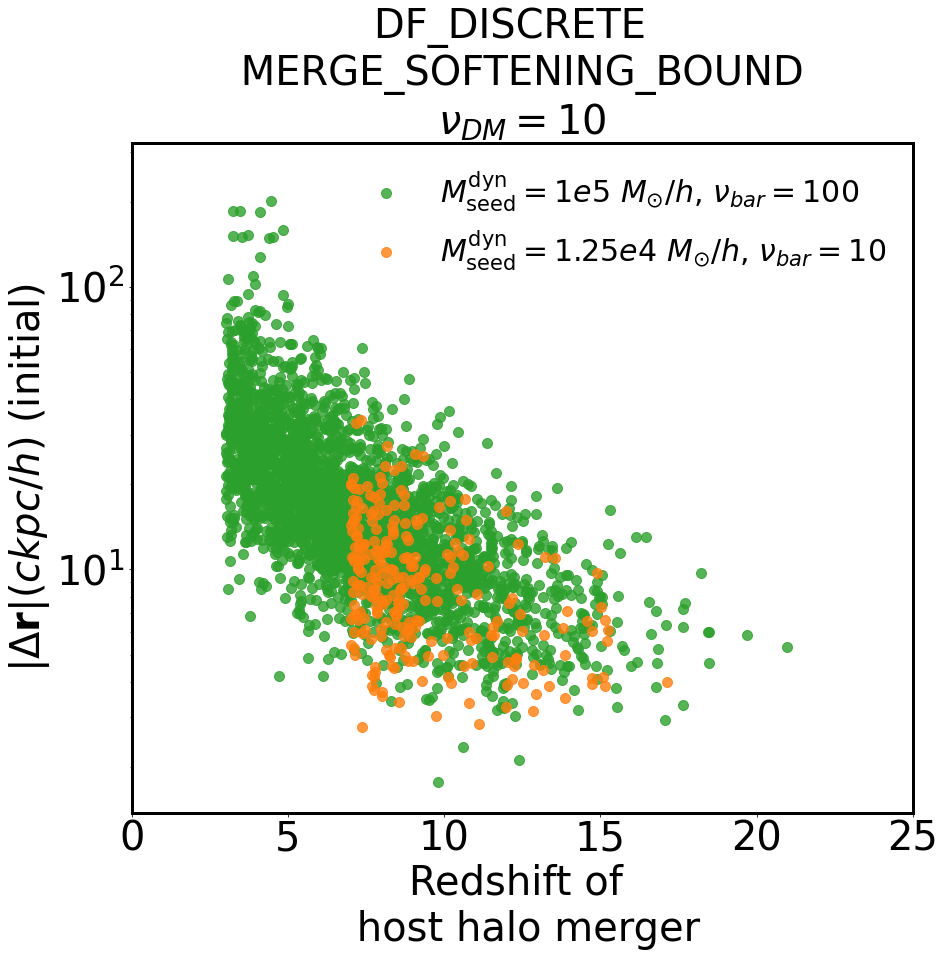

In [141]:

f,axx=plt.subplots(1,1,figsize=(14,12),sharey=True,sharex=True)

#ax.set_title('$M^{\mathrm{dyn}}_{\mathrm{seed}}=1e5 \ M_{\odot}/h$',fontsize=30)

ax=axx
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM5.00_strict_velocity/'
basePath=path_to_output+run+output
make_plot(col='C2',labl='$M_{\mathrm{seed}}^{\mathrm{dyn}}=1e5 \ M_{\odot}/h$,' + r' $\nu_{bar} = 100$' )


ax=axx
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM4.10_strict_velocity/'
basePath=path_to_output+run+output
make_plot(col='C1',labl='$M_{\mathrm{seed}}^{\mathrm{dyn}}=1.25e4 \ M_{\odot}/h$,' + r' $\nu_{bar} = 10$')

#axx[2].set_title('DISCRETE DF \n MERGE_SOFTENING',fontsize=30)
#axx[3].set_title('DISCRETE DF \n MERGE_SOFTENING_BOUND',fontsize=30)
tt='DF_DISCRETE  \n MERGE_SOFTENING_BOUND \n'+r'$\nu_{DM}=10$'   
   
ax.set_title(tt,fontsize=40) 

ax.legend(loc='upper right',fontsize=30,frameon=False)

plt.subplots_adjust(wspace=0,hspace=-0.3,top=0.90)
plt.savefig('./Paper8_figures/merger_time_scales_mass_dependence.png',bbox_inches='tight')

for a in [axx]:
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 
    
plt.savefig('./Paper8_figures/merger_time_scales_redshft_vs_initial_separation.png',bbox_inches='tight')





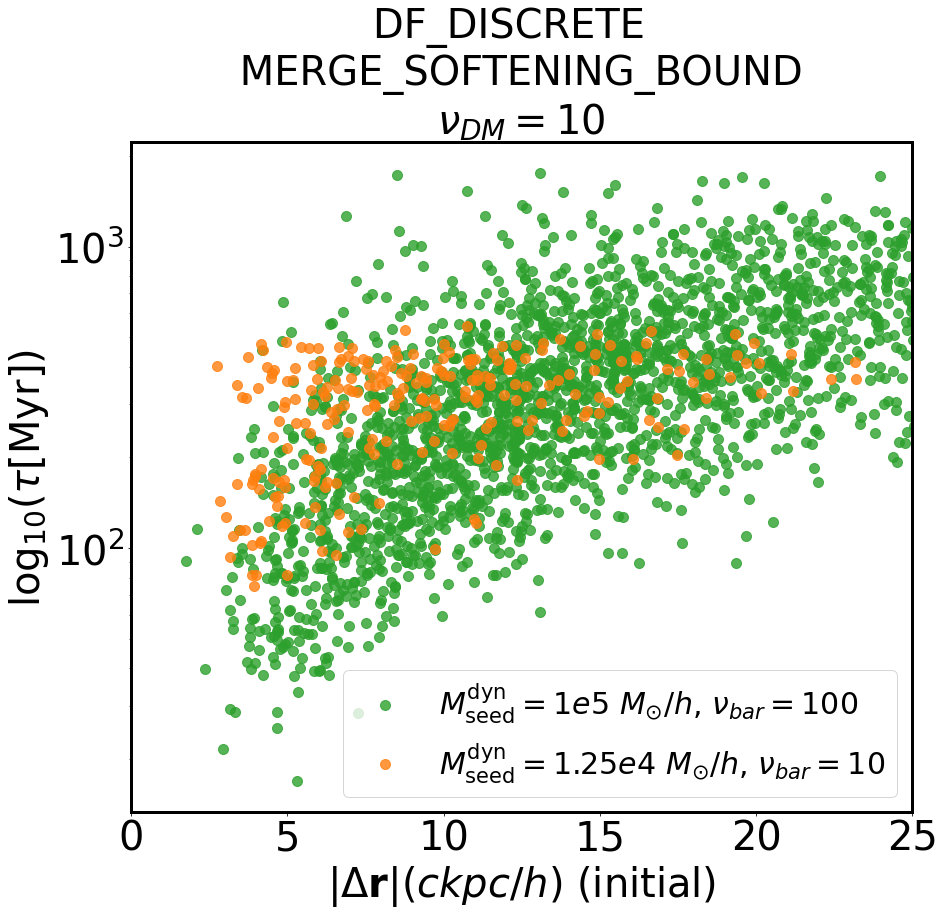

In [134]:
def make_plot(Nbins=20,cmap='Blues',col='Blue',s=10,labl=''):
    xbins = np.linspace(0, 25, Nbins)  # 20 bins between -4 and 4 for x
    ybins = np.linspace(-3, 4, Nbins)
    GroupMass,o=arepo_package.get_group_property(basePath,'GroupMass',0)
    max_time=T(o,12300)/1e6/hubble
    
    merger_properties,initial_trajectory_primary,initial_trajectory_secondary=numpy.load(basePath + '/merger_statistics.npy',allow_pickle=True)
    merger_type=numpy.array(merger_properties['merger_type'])
    merger_redshift = numpy.array(merger_properties['merger_redshift'])
    merger_time_scale_best = numpy.array(merger_properties['merger_time_scale_best'])
    merger_time_scale_err = numpy.array(merger_properties['merger_time_scale_err'])
    halo_merger_redshift_before = numpy.array(merger_properties['halo_merger_redshift_before'])
    halo_merger_redshift_after = numpy.array(merger_properties['halo_merger_redshift_after'])
    halo_merger_redshift_mid = (halo_merger_redshift_before+halo_merger_redshift_after)/2
    halo_merger_redshift_err = (halo_merger_redshift_before-halo_merger_redshift_after)/2
    
    boxsize=arepo_package.get_box_size(basePath)
    
    
    prop='initial_xpos'
    d_xpos= numpy.array([periodic_distance(boxsize,pos1,pos2) for pos1,pos2 in list(zip(initial_trajectory_primary[prop],initial_trajectory_secondary[prop]))])
    prop='initial_ypos'
    d_ypos= numpy.array([periodic_distance(boxsize,pos1,pos2) for pos1,pos2 in list(zip(initial_trajectory_primary[prop],initial_trajectory_secondary[prop]))])
    prop='initial_zpos'
    d_zpos= numpy.array([periodic_distance(boxsize,pos1,pos2) for pos1,pos2 in list(zip(initial_trajectory_primary[prop],initial_trajectory_secondary[prop]))])

    d_rpos = numpy.sqrt(d_xpos**2 + d_ypos**2 + d_zpos**2)  
    
    
    ax.errorbar(d_rpos,merger_time_scale_best,linewidth=0,marker='o',color=col,ms=s,alpha=0.8,label=labl)

    
    
    
    ax.set_xlabel('Redshift of \n host halo merger',fontsize=40)
    ax.set_ylabel('',fontsize=40)
    
    ax.tick_params(labelsize=40)
    #ax.set_ylim(8,4e3)
    ax.set_xlim(0,25)
    
    ax.set_yscale('log')
    
    
    ax.set_xlabel(r'$|\Delta \mathbf{r}| (ckpc/h)$ (initial)',fontsize=40)
    #ax.axhline(13.7*1000,linestyle='dashed',color='grey',linewidth=5)
    #ax.axhline(max_time,linestyle='dashed',color=col,linewidth=5)
    #cbar = f.colorbar(hist[3], ax=ax,orientation='horizontal')
    #cbar.ax.set_ylabel('Counts (log scale)',fontsize=40)
    #cbar.ax.tick_params(labelsize=40)
    #return hist



f,axx=plt.subplots(1,1,figsize=(14,12),sharey=True,sharex=True)

#ax.set_title('$M^{\mathrm{dyn}}_{\mathrm{seed}}=1e5 \ M_{\odot}/h$',fontsize=30)

ax=axx
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM5.00_strict_velocity/'
basePath=path_to_output+run+output
make_plot(col='C2',labl='$M_{\mathrm{seed}}^{\mathrm{dyn}}=1e5 \ M_{\odot}/h$,' + r' $\nu_{bar} = 100$' )


ax=axx
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM4.10_strict_velocity/'
basePath=path_to_output+run+output
make_plot(col='C1',labl='$M_{\mathrm{seed}}^{\mathrm{dyn}}=1.25e4 \ M_{\odot}/h$,' + r' $\nu_{bar} = 10$')

#axx[2].set_title('DISCRETE DF \n MERGE_SOFTENING',fontsize=30)
#axx[3].set_title('DISCRETE DF \n MERGE_SOFTENING_BOUND',fontsize=30)
tt='DF_DISCRETE  \n MERGE_SOFTENING_BOUND \n'+r'$\nu_{DM}=10$'   
   
ax.set_title(tt,fontsize=40) 

ax.legend(loc='lower right',fontsize=30)

plt.subplots_adjust(wspace=0,hspace=-0.3,top=0.90)
plt.savefig('./Paper8_figures/merger_time_scales_mass_dependence.png',bbox_inches='tight')


ax.set_ylabel(r'$\log_{10}(\tau[\mathrm{Myr}])$',fontsize=40)


for a in [axx]:
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 

    
plt.savefig('./Paper8_figures/merger_time_scales_initial_separation.png',bbox_inches='tight')



22 3.008131071630377
Total number of mergers 2744
[[ -85.14063727  -92.36533807  -23.0546722 ]
 [   5.24322217   -2.24118557    3.1362234 ]
 [1240.2731874  1000.09400912  197.98022244]
 ...
 [ 123.52280464  295.75124489 1031.84681286]
 [  21.54471805   15.99502493   -3.29138699]
 [  25.87521348    4.06421875  -22.04458334]]
18 7.005417045544533
Total number of mergers 260
[[ 4.04022618e-01  7.34913452e+00 -3.76272071e+00]
 [ 3.74142929e+02 -1.36015099e+01 -1.92738879e+01]
 [ 5.20946659e+01 -3.79750165e+00 -2.65110500e+01]
 [ 1.46411611e+01  1.80617885e+01 -2.38970062e+01]
 [ 3.25714189e-01  5.71175016e+00  2.20385952e+00]
 [-3.50010680e+01  2.22836366e+02  2.08555270e+01]
 [-6.79690027e+00 -8.70234113e-01  1.50706738e+01]
 [-1.72610223e+02  1.99817880e+01 -3.28283858e+02]
 [ 5.88639514e+00  3.38144853e+00 -3.17589181e+00]
 [-1.12006639e+02  1.41174753e+02  1.42713495e+01]
 [ 6.93020156e+01 -1.38434526e+02 -3.31337448e+01]
 [ 1.87207261e+01 -1.79008780e+01 -1.10792449e+01]
 [ 1.15341503

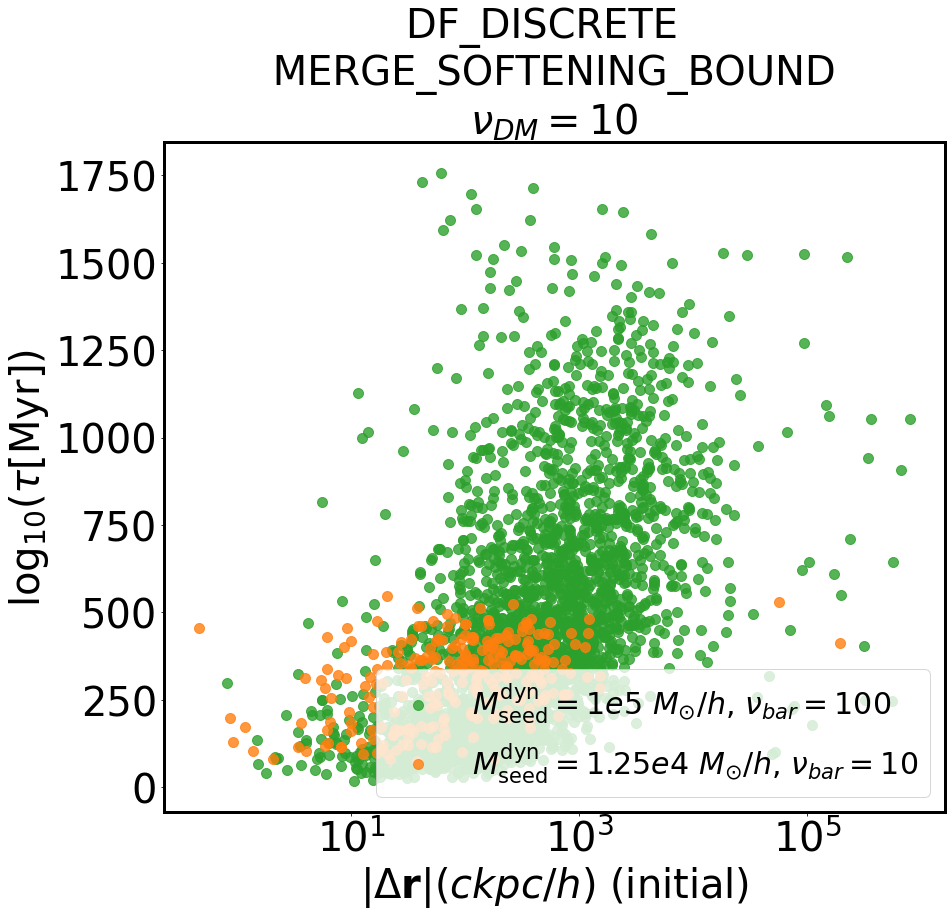

In [129]:
def make_plot(Nbins=20,cmap='Blues',col='Blue',s=10,labl=''):
    xbins = np.linspace(0, 25, Nbins)  # 20 bins between -4 and 4 for x
    ybins = np.linspace(-3, 4, Nbins)
    GroupMass,o=arepo_package.get_group_property(basePath,'GroupMass',0)
    max_time=T(o,12300)/1e6/hubble
    
    merger_properties,initial_trajectory_primary,initial_trajectory_secondary=numpy.load(basePath + '/merger_statistics.npy',allow_pickle=True)
    merger_type=numpy.array(merger_properties['merger_type'])
    merger_redshift = numpy.array(merger_properties['merger_redshift'])
    merger_time_scale_best = numpy.array(merger_properties['merger_time_scale_best'])
    merger_time_scale_err = numpy.array(merger_properties['merger_time_scale_err'])
    halo_merger_redshift_before = numpy.array(merger_properties['halo_merger_redshift_before'])
    halo_merger_redshift_after = numpy.array(merger_properties['halo_merger_redshift_after'])
    halo_merger_redshift_mid = (halo_merger_redshift_before+halo_merger_redshift_after)/2
    halo_merger_redshift_err = (halo_merger_redshift_before-halo_merger_redshift_after)/2
    
    upto_redshift=0
    scale_fac_complete_sorted,primary_mass_sorted,secondary_mass_sorted,primary_id_sorted,secondary_id_sorted,file_id_complete_sorted,N_empty=arepo_package.get_merger_events_from_snapshot(basePath,upto_redshift,HOSTS=0)
    
    boxsize=arepo_package.get_box_size(basePath)
    
    
    prop='initial_xpos'
    d_xpos= numpy.array([pos1 - pos2 for pos1,pos2 in list(zip(initial_trajectory_primary[prop],initial_trajectory_secondary[prop]))])
    prop='initial_ypos'
    d_ypos= numpy.array([pos1 - pos2 for pos1,pos2 in list(zip(initial_trajectory_primary[prop],initial_trajectory_secondary[prop]))])
    prop='initial_zpos'
    d_zpos= numpy.array([pos1 - pos2 for pos1,pos2 in list(zip(initial_trajectory_primary[prop],initial_trajectory_secondary[prop]))])

    dr_vec= numpy.transpose([d_xpos,d_ypos,d_zpos]) * kpch_to_m
    
    prop='initial_xvel'
    d_xvel= numpy.array([pos1 - pos2 for pos1,pos2 in list(zip(initial_trajectory_primary[prop],initial_trajectory_secondary[prop]))])
    prop='initial_yvel'
    d_yvel= numpy.array([pos1 - pos2 for pos1,pos2 in list(zip(initial_trajectory_primary[prop],initial_trajectory_secondary[prop]))])
    prop='initial_zvel'
    d_zvel= numpy.array([pos1 - pos2 for pos1,pos2 in list(zip(initial_trajectory_primary[prop],initial_trajectory_secondary[prop]))])

    
    d_vel= numpy.transpose([d_xvel,d_yvel,d_zvel]) / m_to_km 
    #print(d_xvel,d_zvel)
    d_rpos = numpy.sqrt(d_xpos**2 + d_ypos**2 + d_zpos**2) * kpch_to_m
    
    mu = Grav_const * (primary_mass_sorted+ secondary_mass_sorted) * 1e10 * Msunh_to_kg
    
    
    
    #print(d_rpos[0],d_vel[0])
    #numpy.cross(d_rpos[0],d_vel[0])
    
    h_vec = numpy.array([numpy.cross(r,v) for r,v in list(zip(dr_vec,d_vel))])
    
    
    term_1 = numpy.array([numpy.cross(v,h)/mm for v,h,mm in list(zip(d_vel,h_vec,mu))])
    term_2 =numpy.array([nn/dd for nn,dd in list(zip(dr_vec,d_rpos))])
    
    
    print(term_1)
    
    eccentrity_vec = term_1 - term_2
    
    eccentrity  = numpy.sqrt(numpy.array([numpy.dot(e,e) for e in eccentrity_vec])) 
    
    
    
    #print(eccentrity)
    
    
    #eccentricity =  
    
    
    
    ax.errorbar(eccentrity,merger_time_scale_best,linewidth=0,marker='o',color=col,ms=s,alpha=0.8,label=labl)

    
    
    
    ax.set_xlabel('Redshift of \n host halo merger',fontsize=40)
    ax.set_ylabel('',fontsize=40)
    
    ax.tick_params(labelsize=40)
    #ax.set_ylim(8,4e3)
    #ax.set_xlim(0,25)
    
    ax.set_xscale('log')
    
    
    ax.set_xlabel(r'$|\Delta \mathbf{r}| (ckpc/h)$ (initial)',fontsize=40)
    #ax.axhline(13.7*1000,linestyle='dashed',color='grey',linewidth=5)
    #ax.axhline(max_time,linestyle='dashed',color=col,linewidth=5)
    #cbar = f.colorbar(hist[3], ax=ax,orientation='horizontal')
    #cbar.ax.set_ylabel('Counts (log scale)',fontsize=40)
    #cbar.ax.tick_params(labelsize=40)
    #return hist

size=30
hubble=0.6771
kpch_to_m=3.086e+19/hubble
Msunh_to_kg = 2e30/hubble
Grav_const=6.6743e-11
m_to_km = 1e-3

f,axx=plt.subplots(1,1,figsize=(14,12),sharey=True,sharex=True)

#ax.set_title('$M^{\mathrm{dyn}}_{\mathrm{seed}}=1e5 \ M_{\odot}/h$',fontsize=30)

ax=axx
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM5.00_strict_velocity/'
basePath=path_to_output+run+output
make_plot(col='C2',labl='$M_{\mathrm{seed}}^{\mathrm{dyn}}=1e5 \ M_{\odot}/h$,' + r' $\nu_{bar} = 100$' )


ax=axx
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM4.10_strict_velocity/'
basePath=path_to_output+run+output
make_plot(col='C1',labl='$M_{\mathrm{seed}}^{\mathrm{dyn}}=1.25e4 \ M_{\odot}/h$,' + r' $\nu_{bar} = 10$')

#axx[2].set_title('DISCRETE DF \n MERGE_SOFTENING',fontsize=30)
#axx[3].set_title('DISCRETE DF \n MERGE_SOFTENING_BOUND',fontsize=30)
tt='DF_DISCRETE  \n MERGE_SOFTENING_BOUND \n'+r'$\nu_{DM}=10$'   
   
ax.set_title(tt,fontsize=40) 

ax.legend(loc='lower right',fontsize=30)

plt.subplots_adjust(wspace=0,hspace=-0.3,top=0.90)
plt.savefig('./Paper8_figures/merger_time_scales_mass_dependence.png',bbox_inches='tight')


ax.set_ylabel(r'$\log_{10}(\tau[\mathrm{Myr}])$',fontsize=40)


for a in [axx]:
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 




NameError: name 'get_merger_distributions' is not defined

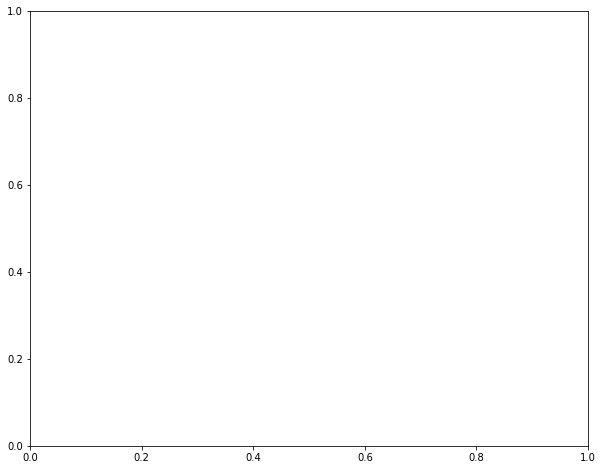

Help on function cross in module numpy:

cross(a, b, axisa=-1, axisb=-1, axisc=-1, axis=None)
    Return the cross product of two (arrays of) vectors.
    
    The cross product of `a` and `b` in :math:`R^3` is a vector perpendicular
    to both `a` and `b`.  If `a` and `b` are arrays of vectors, the vectors
    are defined by the last axis of `a` and `b` by default, and these axes
    can have dimensions 2 or 3.  Where the dimension of either `a` or `b` is
    2, the third component of the input vector is assumed to be zero and the
    cross product calculated accordingly.  In cases where both input vectors
    have dimension 2, the z-component of the cross product is returned.
    
    Parameters
    ----------
    a : array_like
        Components of the first vector(s).
    b : array_like
        Components of the second vector(s).
    axisa : int, optional
        Axis of `a` that defines the vector(s).  By default, the last axis.
    axisb : int, optional
        Axis of `b` that

In [2]:
import sys
sys.path.append('/home/aklantbhowmick/anaconda3/lib/python3.7/site-packages')
sys.path.append('/home/aklantbhowmick/anaconda3/lib/python3.7/site-packages/scalpy/')
sys.path.append('/home/aklantbhowmick/anaconda3/envs/nbodykit-env/lib/python3.6/site-packages/')
import mdot_to_Lbol
import arepo_package
import scipy.interpolate
import illustris_python

import scipy.integrate

radiative_efficiency=0.2
total_conv=mdot_to_Lbol.get_conversion_factor_arepo(radiative_efficiency)
import h5py

import warnings
warnings.filterwarnings('ignore')

%pylab inline

colors_res=['#83c995','orange','blue','black']


def show_seeding_histories2(basePath,col,labl='.',width=4,style='solid',nbins=40,cumulative=0,plot=1):
    #nbins=40
    scale_fac_complete2,BH_id_complete2,density_complete2,metallicity_complete2,SFR_complete2,FOFDMmass_complete2,indexmaxdens_complete2,file_id_complete2,FOFStarFormingGasMass_complete2,FOFStarFormingGasMetallicity_complete2,N_empty=arepo_package.get_seeding_events2(basePath)
    redshifts_fac=1./scale_fac_complete2-1
    return redshifts_fac


def show_seed_FOFmass(basePath,col,labl='.',width=4,style='solid',nbins=40,cumulative=0):
    #nbins=40
    scale_fac_complete2,BH_id_complete2,density_complete2,metallicity_complete2,SFR_complete2,FOFDMmass_complete2,indexmaxdens_complete2,file_id_complete2,FOFStarFormingGasMass_complete2,FOFStarFormingGasMetallicity_complete2,N_empty=arepo_package.get_seeding_events2(basePath)
    redshifts_fac=1./scale_fac_complete2-1

    seed_redshifts=1./scale_fac_complete2-1.
    mask=(seed_redshifts>redshift_cut)
    return FOFDMmass_complete2[mask]*1e10
 
    

def show_seed_SFGmass(basePath,col,labl='.',width=4,style='solid',nbins=40,cumulative=0):
    #nbins=40
    scale_fac_complete2,BH_id_complete2,density_complete2,metallicity_complete2,SFR_complete2,FOFDMmass_complete2,indexmaxdens_complete2,file_id_complete2,FOFStarFormingGasMass_complete2,FOFStarFormingGasMetallicity_complete2,N_empty=arepo_package.get_seeding_events2(basePath)
    redshifts_fac=1./scale_fac_complete2-1

    seed_redshifts=1./scale_fac_complete2-1.
    mask=(seed_redshifts>redshift_cut)
    return FOFStarFormingGasMass_complete2[mask]*1e10


def get_distribution(HM,Nbins,log_HM_min,log_HM_max,linear=0,cumulative=0,density=0):
    #print(HM)
    
    def extract(HM_min,HM_max):
        if (cumulative==1):
            mask=(HM>HM_min)
        else:
            mask=(HM>HM_min)&(HM<HM_max)
        return (HM_min+HM_max)/2,len(HM[mask])
    if (linear):
        HM_bin=numpy.linspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    else:
        HM_bin=numpy.logspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    out=[extract(HM_bin[i],HM_bin[i+1]) for i in range(0,len(HM_bin)-1)]
    #return out
    centers=numpy.array(list(zip(*out))[0])
    counts=numpy.array(list(zip(*out))[1])
    HMF=counts
    dHMF=numpy.sqrt(counts)
    norm=1.#sum(HMF)
    if (density==1):
        norm=numpy.diff(centers)
    return centers,HMF/norm,dHMF/norm

def show_seeding_halomass2(basePath,labl='.',width=4,style='solid',nbins=40,offset=0):
    #nbins=40
    scale_fac_complete2,BH_id_complete2,density_complete2,metallicity_complete2,SFR_complete2,FOFDMmass_complete2,indexmaxdens_complete2,file_id_complete2,FOFStarFormingGasMass_complete2,FOFStarFormingGasMetallicity_complete2,N_empty=arepo_package.get_seeding_events2(basePath)
    #scale_fac_complete,BH_id_complete,density_complete,metallicity_complete,SFR_complete,FOFDMmass_complete,indexmaxdens_complete,FOFTask_complete, file_id_complete,N_empty=arepo_package.get_seeding_events(basePath)
    #scale_fac_complete,BH_id_complete,density_complete,metallicity_complete,SFR_complete,FOFDMmas
    redshifts_fac=1./scale_fac_complete2-1
    print("No of seeds formed:", len(redshifts_fac[redshifts_fac>0]))
    #obj=ax
    seed_redshifts=1./scale_fac_complete2-1.
    mask=(seed_redshifts>redshift_cut)
    print(FOFDMmass_complete2[mask]) 
    return FOFDMmass_complete2




def get_distribution(HM,Nbins,log_HM_min,log_HM_max,linear=0):
    #print(HM)
    
    def extract(HM_min,HM_max):
        mask=(HM>HM_min)&(HM<HM_max)
        return (HM_min+HM_max)/2,len(HM[mask])
    if (linear):
        HM_bin=numpy.linspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    else:
        HM_bin=numpy.logspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    out=[extract(HM_bin[i],HM_bin[i+1]) for i in range(0,len(HM_bin)-1)]
    #return out
    centers=numpy.array(list(zip(*out))[0])
    counts=numpy.array(list(zip(*out))[1])
    HMF=counts
    dHMF=numpy.sqrt(counts)
    norm=1.#sum(HMF)
    return centers,HMF/norm,dHMF/norm


def get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=0,HDF5=0,path_to_hdf5='./'):
    if(HDF5):
        fobj=h5py.File(path_to_hdf5)
        scale_fac_complete_sorted=fobj.get('time')[:]
        primary_mass_sorted=fobj.get('mass_out')[:]
        secondary_mass_sorted=fobj.get('mass_in')[:]
    else:
        scale_fac_complete_sorted,primary_mass_sorted,secondary_mass_sorted,primary_id_sorted,secondary_id_sorted,file_id_complete_sorted,N_empty=arepo_package.get_merger_events_from_snapshot(basePath,upto_redshift,HOSTS=0)
    mass_ratio=secondary_mass_sorted/primary_mass_sorted
    #print(mass_ratio[mass_ratio>1.])
        #print(primary_mass_sorted,secondary_mass_sorted)
    merger_redshifts=1./scale_fac_complete_sorted-1.
    
    #print(merger_redshifts)
    
    #print("###",primary_mass_sorted)
    mask_primary=primary_mass_sorted>=mass_cut/1e10
    mask_secondary=secondary_mass_sorted>=mass_cut/1e10
    mask_total_mass=(primary_mass_sorted+secondary_mass_sorted)>=total_mass_cut/1e10
    mask_redshift=merger_redshifts>=redshift_cut
    mask_ratio_cut=mass_ratio>=mass_ratio_cut
    mask=((mask_primary&mask_secondary)&(mask_redshift&mask_ratio_cut))&mask_total_mass
    merger_redshifts=merger_redshifts[mask]
  
    #print("!!!",merger_redshifts)
    bins, dist, dist_err,norm,counts_sum=arepo_package.get_probability_density(merger_redshifts,nbins,min_value,max_value,linear=linear)
 
    dist*=counts_sum

    dist_err*=counts_sum
    dt=numpy.array([T(zz-norm/2,zz+norm/2) for zz in bins])
    

    dz=numpy.diff(bins)[0]
    #print("!!!",dist)    
    dz_dt=numpy.array([dz/T(zz-dz/2,zz+dz/2) for zz in bins])
    
    return bins,dist,dist_err,norm,dz_dt


def get_merger_distributions_hosts(basePath,nbins,min_value,max_value,mass_cut,linear=0,HDF5=0,path_to_hdf5='./'):
    if(HDF5):
        fobj=h5py.File(path_to_hdf5)
        scale_fac_complete_sorted=fobj.get('time')[:]
        primary_mass_sorted=fobj.get('mass_out')[:]
        secondary_mass_sorted=fobj.get('mass_in')[:]
    else:
        scale_fac_complete,BH_id_primary,BH_mass_primary,hosthalomass_primary,hosthalostellarmass_primary,hosthalogasmass_primary,hosthalodmmass_primary,BH_id_secondary,BH_mass_secondary,hosthalomass_secondary,hosthalostellarmass_secondary,hosthalogasmass_secondary,hosthalodmmass_secondary,file_id_complete=arepo_package.get_merger_events_hosts(basePath,HDF5=1)        #print(primary_mass_sorted,secondary_mass_sorted)
    mass_ratio=BH_id_secondary/BH_mass_primary
    mask_ratio_cut=mass_ratio>mass_ratio_cut
    merger_redshifts=1./scale_fac_complete-1.
    #print("###",BH_mass_primary)
    mask_primary=BH_mass_primary>mass_cut/1e10
    mask_secondary=BH_mass_secondary>mass_cut/1e10
    mask_total_mass=(BH_mass_primary+BH_mass_secondary)>total_mass_cut/1e10
    mask_redshift=merger_redshifts>redshift_cut
    mask=((mask_primary&mask_secondary)&(mask_redshift&mask_ratio_cut))&mask_total_mass
    
    maskhost1=hosthalomass_primary+hosthalomass_secondary>14.2e10/1e10*h
    maskhost2=hosthalomass_primary>7.1e10/1e10*h
    maskhost3=hosthalodmmass_primary>2e9/1e10*h
    maskhost4=hosthalodmmass_secondary>2e9/1e10*h
    maskhost5=hosthalostellarmass_primary>1e8/1e10*h   
    maskhost6=hosthalostellarmass_secondary>1e8/1e10*h
    
    if(apply_host_cuts==0):
        maskhost=mask
    else:
        maskhost=((((maskhost1&maskhost2)&maskhost3)&maskhost4)&maskhost5)&maskhost6
    
    
    merger_redshifts=merger_redshifts[mask&maskhost]
    
    #print("!!!",merger_redshifts)
    
    bins, dist, dist_err,norm,counts_sum=arepo_package.get_probability_density(merger_redshifts,nbins,min_value,max_value,linear=linear)
    
    dt=numpy.array([T(zz-norm/2,zz+norm/2) for zz in bins])
     
    
    dz=numpy.diff(bins)[0]
    #print("!!!",dist)
    dz_dt=numpy.array([dz/T(zz-dz/2,zz+dz/2) for zz in bins])
    
    return bins,dist,dist_err,norm,dz_dt

def get_merger_rate(basePath, nbins, min_value,max_value,ZOOM=0,HDF5=0,input_simulation_boxsize_in_Mpch=1.,path_to_hdf5='.',GasFractionCut=0.1,hosts=0):
    Mpc_to_kpc=1000
    if (hosts):
        bins,dist,dist_err,norm,dz_dt=get_merger_distributions_hosts(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=HDF5,path_to_hdf5=path_to_hdf5)
    else:
        bins,dist,dist_err,norm,dz_dt=get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=HDF5,path_to_hdf5=path_to_hdf5)
    volume_of_redshift_shell=numpy.array([4*3.14*DC(0,z_bin)**2*dx_dz(z_bin) for z_bin in bins])
    if ZOOM:
        if (HDF5):
            simulation_volume=input_simulation_boxsize_in_Mpch**3
        else:
            output_redshifts,high_res_volumes,total_volumes=numpy.load(basePath+'/zoom_volumes_high_res_fraction_cut_%.2f.npy'%(GasFractionCut),allow_pickle=True)
            #print(output_redshifts,high_res_volumes)
            mask=high_res_volumes>0 
            get_volume=scipy.interpolate.interp1d(output_redshifts[mask],high_res_volumes[mask],fill_value='extrapolate')
            simulation_volume=get_volume(bins)
            print("Simulation volumes are:", simulation_volume)
    else:
        if (HDF5):
            simulation_volume=input_simulation_boxsize_in_Mpch**3
        else:
            simulation_volume=(arepo_package.get_box_size(basePath)/Mpc_to_kpc)**3
            print("Simulation volumes are:", simulation_volume)
        
    
    merger_rate=dist*1.
    merger_rate_err=dist_err*1
    
    merger_rate*=dz_dt
    merger_rate_err*=dz_dt
    
    merger_rate/=simulation_volume
    merger_rate_err/=simulation_volume

    merger_rate*=volume_of_redshift_shell
    merger_rate_err*=volume_of_redshift_shell
    
    merger_rate/=(1+bins)
    merger_rate_err/=(1+bins)

    return bins, dist, dist_err, merger_rate, merger_rate_err 


def make_LF(basePath, desired_redshift,col,mstyle,lstyle,obj,labl='.',make_scatter=1,ZOOM=0,alph=1,lwidth=3,offset=0):

    DM1Pos,output_redshift=arepo_package.get_particle_property(basePath,'Coordinates',1,desired_redshift)
    COM=numpy.average(DM1Pos,axis=0)
    
    GroupBHMdot,output_redshift=arepo_package.get_particle_property(basePath,'BH_Mdot',5,desired_redshift)
    GroupBHMdot=GroupBHMdot*total_conv
    #print(output_redshift)

    GroupBHMass,output_redshift=arepo_package.get_particle_property(basePath,'BH_Mass',5,desired_redshift)
    GroupBHMass=GroupBHMass*1e10

    
    Coordinates,output_redshift=arepo_package.get_particle_property(basePath,'Coordinates',5,desired_redshift)
    dist=numpy.sqrt(numpy.sum((Coordinates-COM)**2,axis=1))
      
    #GroupBHMdot=numpy.array([convert_mdot_to_Lbol(mdot,mass,radiative_efficiency,1) for mdot,mass in zip(GroupBHMdot,GroupBHMass)])

    
    if (ZOOM==1):
        mask_pos=dist<max_dist
        mask=mask_pos
        GroupBHMdot=GroupBHMdot[mask]
        GroupBHMass=GroupBHMass[mask]
        mask2=GroupBHMass>10**logmasscutov

        N_space= numpy.array([len(GroupBHMdot[mask2&(GroupBHMdot>10**loglumcut)]) for loglumcut in loglumcut_space]) 
        #print(N_space)
        obj.errorbar(loglumcut_space[N_space>0]+offset,N_space[N_space>0],numpy.sqrt(N_space[N_space>0]),ms=20,linewidth=lwidth,color=col,alpha=alph,label=labl,linestyle=lstyle);           
    else:   
        mask1=GroupBHMdot>10**loglumcut
        mask2=GroupBHMass>10**logmasscutov

        N_space= numpy.array([len(GroupBHMdot[mask2&(GroupBHMdot>10**loglumcut)]) for loglumcut in loglumcut_space]) 
        obj.errorbar(loglumcut_space[N_space>0]+offset,N_space[N_space>0],numpy.sqrt(N_space[N_space>0]),ms=20,linewidth=lwidth,color=col,alpha=alph,label=labl,linestyle=lstyle);
  
    #mask=GroupBHMass>0
    #obj.errorbar(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),ms=10,linewidth=0,color=col,marker=mstyle,alpha=1);
 
      

    #mask=(GroupLen>100)&(GroupBHMass>0)
    #obj.errorbar(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),ms=10,linewidth=0,color=col,marker=mstyle,label=labl);

    #print("Output_redshift is:",output_redshift)
    
    #median_log_halo_mass,median_log_bh_mass,IQR=arepo_package.get_median_with_IQR(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),False,False,10,25)
    #obj.errorbar(median_log_halo_mass,median_log_bh_mass,yerr=IQR,ms=10,linewidth=3,color=col,linestyle=lstyle,label=labl);
    #obj.set_xlim(3.5,12)
    obj.set_ylim(1e-1,1e3)
    #obj.plot(obj.get_xlim(),obj.get_xlim())
    
    #obj.plot(obj.get_xlim(),obj.get_xlim())
    obj.set_yscale('log')
    obj.tick_params(labelsize=40)

def make_MF(basePath, desired_redshift,col,mstyle,lstyle,obj,labl='.',make_scatter=1,ZOOM=0,alph=1,lwidth=3):
    
    DM1Pos,output_redshift=arepo_package.get_particle_property(basePath,'Coordinates',1,desired_redshift)
    COM=numpy.average(DM1Pos,axis=0)
    
    GroupBHMass,output_redshift=arepo_package.get_particle_property(basePath,'BH_Mass',5,desired_redshift)
    GroupBHMass=GroupBHMass*1e10
    
    Coordinates,output_redshift=arepo_package.get_particle_property(basePath,'Coordinates',5,desired_redshift)
    dist=numpy.sqrt(numpy.sum((Coordinates-COM)**2,axis=1))


    if (ZOOM==1):
        
        mask_pos=dist<max_dist
        mask=mask_pos
       # GroupBHMdot=GroupBHMdot[mask]
        GroupBHMass=GroupBHMass[mask]
     
        N_space= numpy.array([len(GroupBHMass[GroupBHMass>10**logmasscut]) for logmasscut in logmasscut_space]) 
        print(N_space)
        obj.errorbar(logmasscut_space[N_space>0],N_space[N_space>0],numpy.sqrt(N_space[N_space>0]),ms=20,linewidth=lwidth,color=col,alpha=alph,label=labl);           
    else:    
        N_space= numpy.array([len(GroupBHMass[GroupBHMass>10**logmasscut]) for logmasscut in logmasscut_space]) 
        obj.errorbar(logmasscut_space[N_space>0],N_space[N_space>0],numpy.sqrt(N_space[N_space>0]),ms=20,linewidth=lwidth,color=col,alpha=alph,label=labl);
  
    #mask=GroupBHMass>0
    #obj.errorbar(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),ms=10,linewidth=0,color=col,marker=mstyle,alpha=1);
 
      

    #mask=(GroupLen>100)&(GroupBHMass>0)
    #obj.errorbar(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),ms=10,linewidth=0,color=col,marker=mstyle,label=labl);

    print("Output_redshift is:",output_redshift)
    
    #median_log_halo_mass,median_log_bh_mass,IQR=arepo_package.get_median_with_IQR(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),False,False,10,25)
    #obj.errorbar(median_log_halo_mass,median_log_bh_mass,yerr=IQR,ms=10,linewidth=3,color=col,linestyle=lstyle,label=labl);
    #obj.set_xlim(3.5,12)
    obj.set_ylim(1e-1,1e3)
    #obj.plot(obj.get_xlim(),obj.get_xlim())
    
    #obj.plot(obj.get_xlim(),obj.get_xlim())
    obj.set_yscale('log')
    return logmasscut_space,N_space,numpy.sqrt(N_space)


def make_MF_group(basePath, desired_redshift,col,mstyle,lstyle,obj,labl='.',make_scatter=1,ZOOM=0,alph=1,lwidth=3):
    
    GroupMassType,output_redshift=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift)
    GroupLenType,output_redshift=arepo_package.get_group_property(basePath,'GroupLenType',desired_redshift)
    
    GroupMass1=GroupMassType[:,1]
    GroupMass2=GroupMassType[:,2]
    
    LowResFraction=GroupMass2/(GroupMass1+GroupMass2)
    
    GroupLen=GroupLenType[:,4]
    GroupMass=GroupMassType[:,4]
    #print(GroupLen)
    GroupBHMass,output_redshift=arepo_package.get_group_property(basePath,'GroupBHMass',desired_redshift)
    GroupMass*=1e10
    GroupBHMass*=1e10

    if (ZOOM==1):
        mask=LowResFraction<0.1
        GroupBHMass=GroupBHMass[mask]    
        N_space= numpy.array([len(GroupBHMass[GroupBHMass>10**logmasscut]) for logmasscut in logmasscut_space]) 
        print(N_space)
        obj.errorbar(logmasscut_space[N_space>0],N_space[N_space>0],numpy.sqrt(N_space[N_space>0]),ms=20,linewidth=lwidth,color=col,alpha=alph,label=labl);           
    else:    
        N_space= numpy.array([len(GroupBHMass[GroupBHMass>10**logmasscut]) for logmasscut in logmasscut_space]) 
        obj.errorbar(logmasscut_space[N_space>0],N_space[N_space>0],numpy.sqrt(N_space[N_space>0]),ms=20,linewidth=lwidth,color=col,alpha=alph,label=labl);
  
    #mask=GroupBHMass>0
    #obj.errorbar(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),ms=10,linewidth=0,color=col,marker=mstyle,alpha=1);
 
      

    #mask=(GroupLen>100)&(GroupBHMass>0)
    #obj.errorbar(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),ms=10,linewidth=0,color=col,marker=mstyle,label=labl);

    print("Output_redshift is:",output_redshift)
    
    #median_log_halo_mass,median_log_bh_mass,IQR=arepo_package.get_median_with_IQR(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),False,False,10,25)
    #obj.errorbar(median_log_halo_mass,median_log_bh_mass,yerr=IQR,ms=10,linewidth=3,color=col,linestyle=lstyle,label=labl);
    #obj.set_xlim(3.5,12)
    obj.set_ylim(1e-1,1e3)
    #obj.plot(obj.get_xlim(),obj.get_xlim())
    
    #obj.plot(obj.get_xlim(),obj.get_xlim())
    obj.set_yscale('log')

    


def make_LF_group(basePath, desired_redshift,col,mstyle,lstyle,obj,labl='.',make_scatter=1,ZOOM=0,alph=1,lwidth=3):
    
    GroupMassType,output_redshift=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift)
    GroupLenType,output_redshift=arepo_package.get_group_property(basePath,'GroupLenType',desired_redshift)
    
    GroupMass1=GroupMassType[:,1]
    GroupMass2=GroupMassType[:,2]
    
    LowResFraction=GroupMass2/(GroupMass1+GroupMass2)
    
    GroupLen=GroupLenType[:,4]
    GroupMass=GroupMassType[:,4]
    #print(GroupLen)
    GroupBHMdot,output_redshift=arepo_package.get_group_property(basePath,'GroupBHMdot',desired_redshift)
    GroupBHMdot=GroupBHMdot*total_conv

    GroupBHMass,output_redshift=arepo_package.get_group_property(basePath,'GroupBHMass',desired_redshift)
    GroupBHMass=GroupBHMass*1e10
    
    if (ZOOM==1):
        mask=LowResFraction<0.1
        GroupBHMdot=GroupBHMdot[mask]
        GroupBHMass=GroupBHMass[mask]
    
        mask2=GroupBHMass>10**logmasscutov

        N_space= numpy.array([len(GroupBHMdot[mask2&(GroupBHMdot>10**loglumcut)]) for loglumcut in loglumcut_space]) 
        #print(N_space)
        obj.errorbar(loglumcut_space[N_space>0],N_space[N_space>0],numpy.sqrt(N_space[N_space>0]),ms=20,linewidth=lwidth,color=col,alpha=alph,label=labl);           
    else:   
        mask1=GroupBHMdot>10**loglumcut
        mask2=GroupBHMass>10**logmasscutov

        N_space= numpy.array([len(GroupBHMdot[mask2&(GroupBHMdot>10**loglumcut)]) for loglumcut in loglumcut_space]) 
        obj.errorbar(loglumcut_space[N_space>0],N_space[N_space>0],numpy.sqrt(N_space[N_space>0]),ms=20,linewidth=lwidth,color=col,alpha=alph,label=labl);
  
    #mask=GroupBHMass>0
    #obj.errorbar(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),ms=10,linewidth=0,color=col,marker=mstyle,alpha=1);
 
      

    #mask=(GroupLen>100)&(GroupBHMass>0)
    #obj.errorbar(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),ms=10,linewidth=0,color=col,marker=mstyle,label=labl);

    #print("Output_redshift is:",output_redshift)
    
    #median_log_halo_mass,median_log_bh_mass,IQR=arepo_package.get_median_with_IQR(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),False,False,10,25)
    #obj.errorbar(median_log_halo_mass,median_log_bh_mass,yerr=IQR,ms=10,linewidth=3,color=col,linestyle=lstyle,label=labl);
    #obj.set_xlim(3.5,12)
    obj.set_ylim(1e-1,1e3)
    #obj.plot(obj.get_xlim(),obj.get_xlim())
    
    #obj.plot(obj.get_xlim(),obj.get_xlim())
    obj.set_yscale('log')
    obj.tick_params(labelsize=40)

 
    

from scipy.integrate import quad
global c,h,omm,oml,omk
omk=0
oml=0.6911
omm=0.3089
c=3*10**5
h=0.6771


def DC(z0, z1):
    # Comoving distance in Mpc                                                                                          $
    def integrand(z):
        return 1.0/E(z)
    return c/(100.0)*quad(integrand,z0,z1)[0]

def dx_dz(z):
    # Comoving distance in Mpc                                                                                          $
    def integrand(z):
        return 1.0/E(z)
    return c/(100.0)*integrand(z)


def E(z):
        #normalized hubble parameter                                                                                    $
    return np.sqrt(omm*(1.0+z)**3 + oml + omk*(1.0+z)**2)

def DL(z):
    #Luminosity distance in Mpcs                                                                                        $
    return (1.0+z)*DC(0,z)

def DM(z):
        #Distance Modulus                                                                                               $
        return 5*np.log10((DL(z)*1e6)/10.0)

def mtoM(m,z):
    return m - DM(z) - K(z)

def Mtom(M, z):
    return M + DM(z) + K(z)

def LtoM(L):
    M = -2.5 * np.log10(L*1e-7)+34.1
    return M

def MtoL(M):
    return 10**((-1/2.5*(M-34.1)))*1e7

def K(z):
    #K correction, assuming same filter size in emitted and observed frame                                              $
    return 2.5*np.log10(1.0/(1+z))

def T(z0,z1):
    sectoyrs=3.171e-08
    Mpctokm=3.0857E+19
    def integrand(z):
        return 1.0/E(z)/(1+z)
    return 1./(100.0)*quad(integrand,z0,z1)[0]*Mpctokm*sectoyrs






Populating the interactive namespace from numpy and matplotlib


18 7.005417045544533
Total number of mergers 3560
18 7.005417045544533
Total number of mergers 2474
18 7.005417045544533
Total number of mergers 738
18 7.005417045544533
Total number of mergers 90
18 7.005417045544533
Total number of mergers 3560
18 7.005417045544533
Total number of mergers 2474
18 7.005417045544533
Total number of mergers 1481
18 7.005417045544533
Total number of mergers 1241


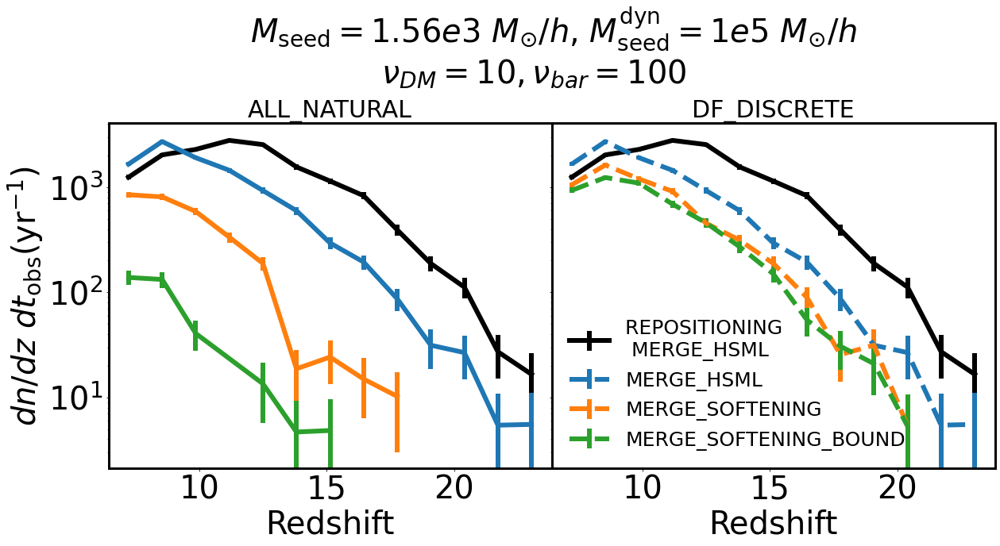

In [17]:

f,axx=plt.subplots(1,2,figsize=(20,8),sharey=True,sharex=True)

redshift_cut=0
mass_cut=0
mass_ratio_cut=0
total_mass_cut=0
apply_host_cuts=0
HDF5=1
ZOOM=0

nbins=20
min_value=0
max_value=25

upto_redshift=7

def do(labl='',width=8,HDF5=0,path_to_hdf5='',box_length=1,mark=''):
    #HDF5=0

    #path_to_output='/ufrc/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    #run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax10_haloindex4_redshift5.00_logbhseedmass5.00_NSC/' # name of the simulation runs
    #basePath=path_to_output+run+'AREPO/output_upto_3/'

    nbins=20
    min_value=0
    max_value=25
    bins,dist,dist_err,norm,dz_dt=get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=HDF5,path_to_hdf5=path_to_hdf5)
    volume_of_redshift_shell=numpy.array([4*3.14*DC(0,z_bin)**2*dx_dz(z_bin) for z_bin in bins])

    if (HDF5):
        simulation_volume=box_length**3
    else:
        simulation_volume=(arepo_package.get_box_size(basePath)/1000)**3


    merger_rate=dist*1.
    merger_rate_err=dist_err*1.

    merger_rate*=dz_dt
    merger_rate_err*=dz_dt

    merger_rate/=simulation_volume
    merger_rate_err/=simulation_volume

    merger_rate*=volume_of_redshift_shell
    merger_rate_err*=volume_of_redshift_shell

    merger_rate/=(1+bins)
    merger_rate_err/=(1+bins)

    #ax[4].errorbar(bins[mask],merger_rate[mask],merger_rate_err[mask],label='$Z<10^{-4}Z_{\odot}$ (levelmax=9)',linewidth=3)
    ax.set_yscale('log')

    ax.tick_params(labelsize=40)

    ax.set_xlabel('Redshift',fontsize=40)

    merger_rate2=dist*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    merger_rate_err2=dist_err*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    mask=(dist>0)&(merger_rate2>0)
    ax.errorbar(bins[mask],merger_rate2[mask],merger_rate_err2[mask],label=labl,linewidth=width,color=col,linestyle=style,marker=mark,ms=7)
    ax.set_yscale('log')


    #data=numpy.loadtxt('./digitized_data/Laura_proposal_illustris_merger_rates.txt')
    #ax[4].errorbar(data[:,0],data[:,1])



 

mass_cut=1.56e3

style='solid'








ax=axx[0]


col='black'





style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_repositioning/' 
basePath=path_to_output+run+output
do(width=6,labl='REPOSITIONING \n MERGE_HSML')



col='C0'
style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_HDM5.00/' 
basePath=path_to_output+run+output
do(width=6,labl='MERGE_HSML')




col='C1'
style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_HDM5.00_strict/' 
basePath=path_to_output+run+output
do(width=6,labl='MERGE_SOFTENING')





col='C2'
style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_HDM5.00_strict_velocity/' 
basePath=path_to_output+run+output
do(width=6,labl='MERGE_SOFTENING_BOUND')


axx[0].set_title('ALL_NATURAL',fontsize=30)
#do(width=6,labl='')


ax=axx[1]


col='black'

style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_repositioning/' 
basePath=path_to_output+run+output
do(width=6,labl='REPOSITIONING \n MERGE_HSML')



col='C0'
style='dashed'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_HDM5.00/' 
basePath=path_to_output+run+output
do(width=6,labl='MERGE_HSML')



col='C1'
style='dashed'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM5.00_strict/' 
basePath=path_to_output+run+output
do(width=6,labl='MERGE_SOFTENING')





col='C2'
style='dashed'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM5.00_strict_velocity/' 
basePath=path_to_output+run+output
do(width=6,labl='MERGE_SOFTENING_BOUND')


axx[0].set_title('ALL_NATURAL',fontsize=30)

axx[1].set_title('DF_DISCRETE',fontsize=30)
#do(width=6,labl='')

plt.subplots_adjust(wspace=0,hspace=0)


for a in axx.flatten():
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 










#ax.set_ylim(1,4e)

#ax.set_xlim(6,30)





ax.legend(loc='lower left',fontsize=25,frameon=False)




axx[0].set_ylabel('$dn/dz \ dt_{\mathrm{obs}} (\mathrm{yr}^{-1})$',fontsize=40)

tt='$M_{\mathrm{seed}}=1.56e3 \ M_{\odot}/h$, $M_{\mathrm{seed}}^{\mathrm{dyn}}=1e5 \ M_{\odot}/h$ \n'+r'             $\nu_{DM}=10,\nu_{bar} = 100$'   
axx[0].text(12,10000,tt,fontsize=40) 



plt.savefig('./Paper8_figures/merger_rates_gas_based_models.png',bbox_inches='tight')




18 7.005417045544533
Total number of mergers 3560
18 7.005417045544533
Total number of mergers 1241
18 7.005417045544533
Total number of mergers 313


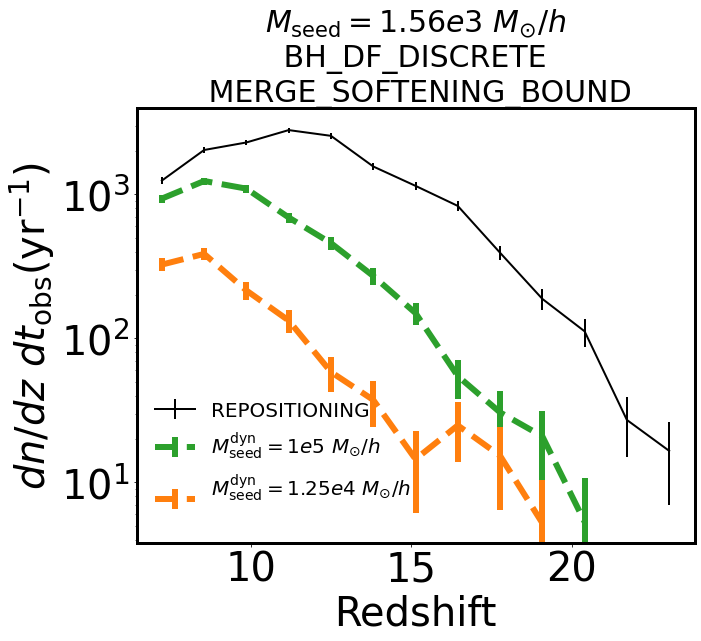

In [38]:

f,axx=plt.subplots(1,1,figsize=(10,8),sharey=True,sharex=True)


 

mass_cut=1.56e3

style='solid'

ax=axx

col='black'
style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_repositioning/' 
basePath=path_to_output+run+output
do(width=2,labl='REPOSITIONING')



tt='$M_{\mathrm{seed}}^{\mathrm{dyn}}=1e5 \ M_{\odot}/h$'
col='C2'
style='dashed'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM5.00_strict_velocity/' 
basePath=path_to_output+run+output
do(width=6,labl=tt)



tt='$M_{\mathrm{seed}}^{\mathrm{dyn}}=1.25e4 \ M_{\odot}/h$ \n'
col='C1'
style='dashed'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n1024/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM4.10_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
do(width=6,labl=tt)


#do(width=6,labl='')

plt.subplots_adjust(wspace=0,hspace=0)


for a in [axx]:
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 










#ax.set_ylim(1,4e)

#ax.set_xlim(6,30)





ax.legend(loc='lower left',fontsize=20,frameon=False)




axx.set_ylabel('$dn/dz \ dt_{\mathrm{obs}} (\mathrm{yr}^{-1})$',fontsize=40)

tt='$M_{\mathrm{seed}}=1.56e3 \ M_{\odot}/h$\n BH_DF_DISCRETE \n MERGE_SOFTENING_BOUND'   
ax.set_title(tt,fontsize=30)

#axx.text(12,10000,tt,fontsize=40) 






plt.savefig('./Paper8_figures/merger_rates_gas_based_dyn_mass.png',bbox_inches='tight')




17 8.012172948865935
Total number of mergers 2232
18 7.005417045544533
Total number of mergers 356
18 7.005417045544533
Total number of mergers 473


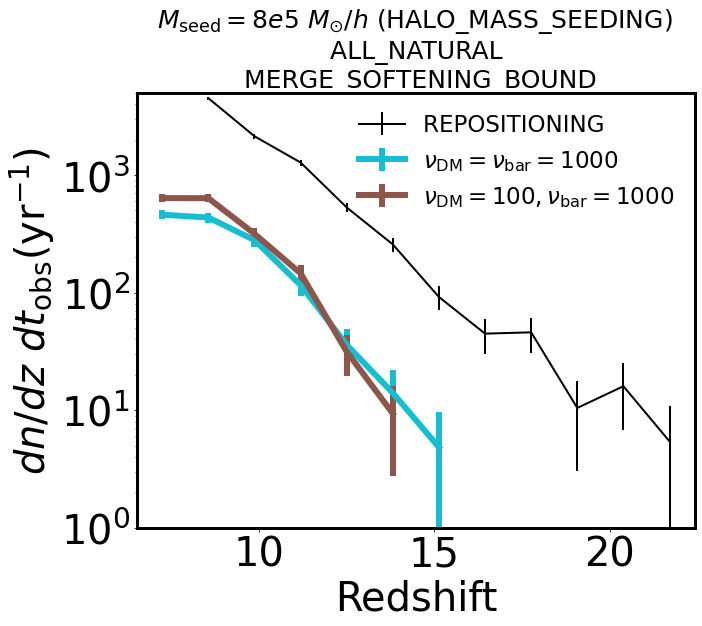

In [85]:

f,axx=plt.subplots(1,1,figsize=(10,8),sharey=True,sharex=True)

redshift_cut=0
mass_cut=0
mass_ratio_cut=0
total_mass_cut=0
apply_host_cuts=0
HDF5=1
ZOOM=0

nbins=20
min_value=0
max_value=25

upto_redshift=7

def do(labl='',width=8,HDF5=0,path_to_hdf5='',box_length=1,mark=''):
    #HDF5=0

    #path_to_output='/ufrc/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    #run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax10_haloindex4_redshift5.00_logbhseedmass5.00_NSC/' # name of the simulation runs
    #basePath=path_to_output+run+'AREPO/output_upto_3/'

    nbins=20
    min_value=0
    max_value=25
    bins,dist,dist_err,norm,dz_dt=get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=HDF5,path_to_hdf5=path_to_hdf5)
    volume_of_redshift_shell=numpy.array([4*3.14*DC(0,z_bin)**2*dx_dz(z_bin) for z_bin in bins])

    if (HDF5):
        simulation_volume=box_length**3
    else:
        simulation_volume=(arepo_package.get_box_size(basePath)/1000)**3


    merger_rate=dist*1.
    merger_rate_err=dist_err*1.

    merger_rate*=dz_dt
    merger_rate_err*=dz_dt

    merger_rate/=simulation_volume
    merger_rate_err/=simulation_volume

    merger_rate*=volume_of_redshift_shell
    merger_rate_err*=volume_of_redshift_shell

    merger_rate/=(1+bins)
    merger_rate_err/=(1+bins)

    #ax[4].errorbar(bins[mask],merger_rate[mask],merger_rate_err[mask],label='$Z<10^{-4}Z_{\odot}$ (levelmax=9)',linewidth=3)
    ax.set_yscale('log')

    ax.tick_params(labelsize=40)

    ax.set_xlabel('Redshift',fontsize=40)

    merger_rate2=dist*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    merger_rate_err2=dist_err*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    mask=(dist>0)&(merger_rate2>0)
    ax.errorbar(bins[mask],merger_rate2[mask],merger_rate_err2[mask],label=labl,linewidth=width,color=col,linestyle=style,marker=mark,ms=7)
    ax.set_yscale('log')


    #data=numpy.loadtxt('./digitized_data/Laura_proposal_illustris_merger_rates.txt')
    #ax[4].errorbar(data[:,0],data[:,1])



 

mass_cut=1.56e3

style='solid'








ax=axx


col='black'





style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.90_repositioning/' 
basePath=path_to_output+run+output
do(width=2,labl='REPOSITIONING ')



col='C9'
style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n1024/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.90_strict_velocity_gas_res/'
basePath=path_to_output+run+output
do(width=6,labl=r'$\nu_{\mathrm{DM}} = \nu_{\mathrm{bar}} = 1000$')



col='C5'
style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.90_strict_velocity/'
basePath=path_to_output+run+output
do(width=6,labl=r'$\nu_{\mathrm{DM}} = 100, \nu_{\mathrm{bar}} = 1000$')







plt.subplots_adjust(wspace=0,hspace=0)


for a in [axx]:
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 




tt='$M_{\mathrm{seed}}=8e5 \ M_{\odot}/h$ (HALO_MASS_SEEDING) \n ALL_NATURAL \n MERGE_SOFTENING_BOUND'
ax.set_title(tt,fontsize=25)






#ax.set_ylim(1,4e)

#ax.set_xlim(6,30)


ax.set_ylim(1,5000)


ax.legend(loc='upper right',fontsize=23,frameon=False)




axx.set_ylabel('$dn/dz \ dt_{\mathrm{obs}} (\mathrm{yr}^{-1})$',fontsize=40)

plt.savefig('./Paper8_figures/merger_rates_fof_DM_gas_seed5.90.png',bbox_inches='tight')




17 8.012172948865935
Total number of mergers 2232
18 7.005417045544533
Total number of mergers 92
18 7.005417045544533
Total number of mergers 35


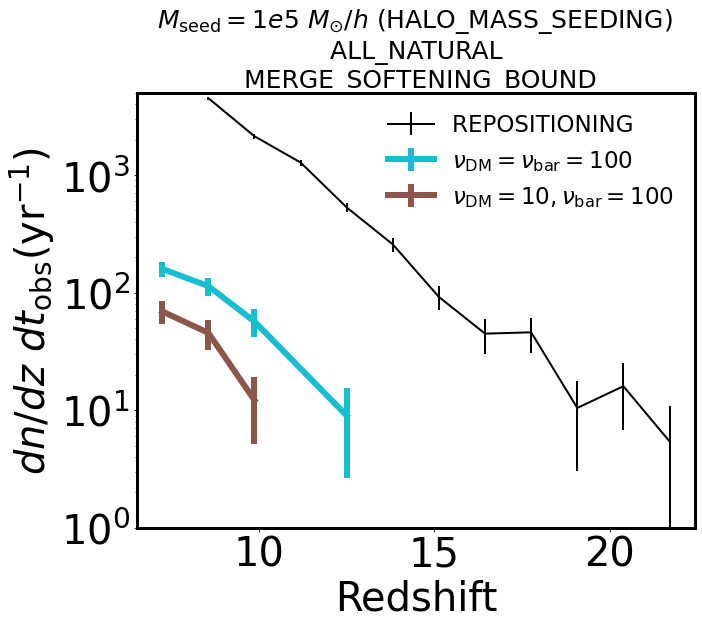

In [84]:

f,axx=plt.subplots(1,1,figsize=(10,8),sharey=True,sharex=True)

redshift_cut=0
mass_cut=0
mass_ratio_cut=0
total_mass_cut=0
apply_host_cuts=0
HDF5=1
ZOOM=0

nbins=20
min_value=0
max_value=25

upto_redshift=7

def do(labl='',width=8,HDF5=0,path_to_hdf5='',box_length=1,mark=''):
    #HDF5=0

    #path_to_output='/ufrc/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    #run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax10_haloindex4_redshift5.00_logbhseedmass5.00_NSC/' # name of the simulation runs
    #basePath=path_to_output+run+'AREPO/output_upto_3/'

    nbins=20
    min_value=0
    max_value=25
    bins,dist,dist_err,norm,dz_dt=get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=HDF5,path_to_hdf5=path_to_hdf5)
    volume_of_redshift_shell=numpy.array([4*3.14*DC(0,z_bin)**2*dx_dz(z_bin) for z_bin in bins])

    if (HDF5):
        simulation_volume=box_length**3
    else:
        simulation_volume=(arepo_package.get_box_size(basePath)/1000)**3


    merger_rate=dist*1.
    merger_rate_err=dist_err*1.

    merger_rate*=dz_dt
    merger_rate_err*=dz_dt

    merger_rate/=simulation_volume
    merger_rate_err/=simulation_volume

    merger_rate*=volume_of_redshift_shell
    merger_rate_err*=volume_of_redshift_shell

    merger_rate/=(1+bins)
    merger_rate_err/=(1+bins)

    #ax[4].errorbar(bins[mask],merger_rate[mask],merger_rate_err[mask],label='$Z<10^{-4}Z_{\odot}$ (levelmax=9)',linewidth=3)
    ax.set_yscale('log')

    ax.tick_params(labelsize=40)

    ax.set_xlabel('Redshift',fontsize=40)

    merger_rate2=dist*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    merger_rate_err2=dist_err*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    mask=(dist>0)&(merger_rate2>0)
    ax.errorbar(bins[mask],merger_rate2[mask],merger_rate_err2[mask],label=labl,linewidth=width,color=col,linestyle=style,marker=mark,ms=7)
    ax.set_yscale('log')


    #data=numpy.loadtxt('./digitized_data/Laura_proposal_illustris_merger_rates.txt')
    #ax[4].errorbar(data[:,0],data[:,1])



 

mass_cut=1.56e3

style='solid'








ax=axx


col='black'





style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.90_repositioning/' 
basePath=path_to_output+run+output
do(width=2,labl='REPOSITIONING ')



col='C9'
style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n1024/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.00_strict_velocity_gas_res/'
basePath=path_to_output+run+output
do(width=6,labl=r'$\nu_{\mathrm{DM}} = \nu_{\mathrm{bar}} = 100$')



col='C5'
style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.00_strict_velocity/'
basePath=path_to_output+run+output
do(width=6,labl=r'$\nu_{\mathrm{DM}} = 10, \nu_{\mathrm{bar}} = 100$')







plt.subplots_adjust(wspace=0,hspace=0)


for a in [axx]:
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 




tt='$M_{\mathrm{seed}}=1e5 \ M_{\odot}/h$ (HALO_MASS_SEEDING) \n ALL_NATURAL \n MERGE_SOFTENING_BOUND'
ax.set_title(tt,fontsize=25)






#ax.set_ylim(1,4e)

#ax.set_xlim(6,30)


ax.set_ylim(1,5000)


ax.legend(loc='upper right',fontsize=23,frameon=False)




axx.set_ylabel('$dn/dz \ dt_{\mathrm{obs}} (\mathrm{yr}^{-1})$',fontsize=40)

#plt.savefig('./Paper8_figures/merger_rates_gas_DM_gas.png',bbox_inches='tight')


plt.savefig('./Paper8_figures/merger_rates_fof_DM_gas_seed5.00.png',bbox_inches='tight')




18 7.005417045544533
Total number of mergers 3560
18 7.005417045544533
Total number of mergers 313
18 7.005417045544533
Total number of mergers 260


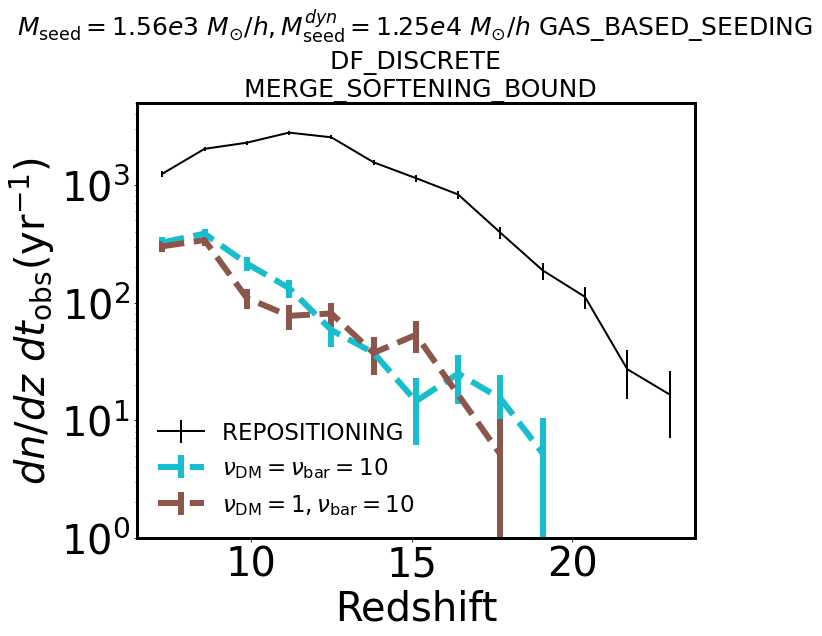

In [83]:

f,axx=plt.subplots(1,1,figsize=(10,8),sharey=True,sharex=True)

redshift_cut=0
mass_cut=0
mass_ratio_cut=0
total_mass_cut=0
apply_host_cuts=0
HDF5=1
ZOOM=0

nbins=20
min_value=0
max_value=25

upto_redshift=7

def do(labl='',width=8,HDF5=0,path_to_hdf5='',box_length=1,mark=''):
    #HDF5=0

    #path_to_output='/ufrc/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    #run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax10_haloindex4_redshift5.00_logbhseedmass5.00_NSC/' # name of the simulation runs
    #basePath=path_to_output+run+'AREPO/output_upto_3/'

    nbins=20
    min_value=0
    max_value=25
    bins,dist,dist_err,norm,dz_dt=get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=HDF5,path_to_hdf5=path_to_hdf5)
    volume_of_redshift_shell=numpy.array([4*3.14*DC(0,z_bin)**2*dx_dz(z_bin) for z_bin in bins])

    if (HDF5):
        simulation_volume=box_length**3
    else:
        simulation_volume=(arepo_package.get_box_size(basePath)/1000)**3


    merger_rate=dist*1.
    merger_rate_err=dist_err*1.

    merger_rate*=dz_dt
    merger_rate_err*=dz_dt

    merger_rate/=simulation_volume
    merger_rate_err/=simulation_volume

    merger_rate*=volume_of_redshift_shell
    merger_rate_err*=volume_of_redshift_shell

    merger_rate/=(1+bins)
    merger_rate_err/=(1+bins)

    #ax[4].errorbar(bins[mask],merger_rate[mask],merger_rate_err[mask],label='$Z<10^{-4}Z_{\odot}$ (levelmax=9)',linewidth=3)
    ax.set_yscale('log')

    ax.tick_params(labelsize=40)

    ax.set_xlabel('Redshift',fontsize=40)

    merger_rate2=dist*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    merger_rate_err2=dist_err*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    mask=(dist>0)&(merger_rate2>0)
    ax.errorbar(bins[mask],merger_rate2[mask],merger_rate_err2[mask],label=labl,linewidth=width,color=col,linestyle=style,marker=mark,ms=7)
    ax.set_yscale('log')


    #data=numpy.loadtxt('./digitized_data/Laura_proposal_illustris_merger_rates.txt')
    #ax[4].errorbar(data[:,0],data[:,1])



 

mass_cut=1.56e3

style='solid'








ax=axx


col='black'





style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_repositioning/' 
basePath=path_to_output+run+output
do(width=2,labl='REPOSITIONING ')



col='C9'
style='dashed'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n1024/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM4.10_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
do(width=6,labl=r'$\nu_{\mathrm{DM}} = \nu_{\mathrm{bar}} = 10$')



col='C5'
style='dashed'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM4.10_strict_velocity/' 
basePath=path_to_output+run+output
do(width=6,labl=r'$\nu_{\mathrm{DM}} = 1, \nu_{\mathrm{bar}} = 10$')







plt.subplots_adjust(wspace=0,hspace=0)


for a in [axx]:
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 

ax.set_ylim(1,5000)








#ax.set_ylim(1,4e)

#ax.set_xlim(6,30)


tt='$M_{\mathrm{seed}}=1.56e3 \ M_{\odot}/h , M^{dyn}_{\mathrm{seed}} = 1.25e4 \ M_{\odot}/h$ GAS_BASED_SEEDING \n DF_DISCRETE \n MERGE_SOFTENING_BOUND'
ax.set_title(tt,fontsize=25)


ax.legend(loc='lower left',fontsize=23,frameon=False)




axx.set_ylabel('$dn/dz \ dt_{\mathrm{obs}} (\mathrm{yr}^{-1})$',fontsize=40)

plt.savefig('./Paper8_figures/merger_rates_gas_DM_gas.png',bbox_inches='tight')




22 3.008131071630377
Total number of mergers 56


Text(0, 0.5, '$dn/dz \\ dt_{\\mathrm{obs}} (\\mathrm{yr}^{-1})$')

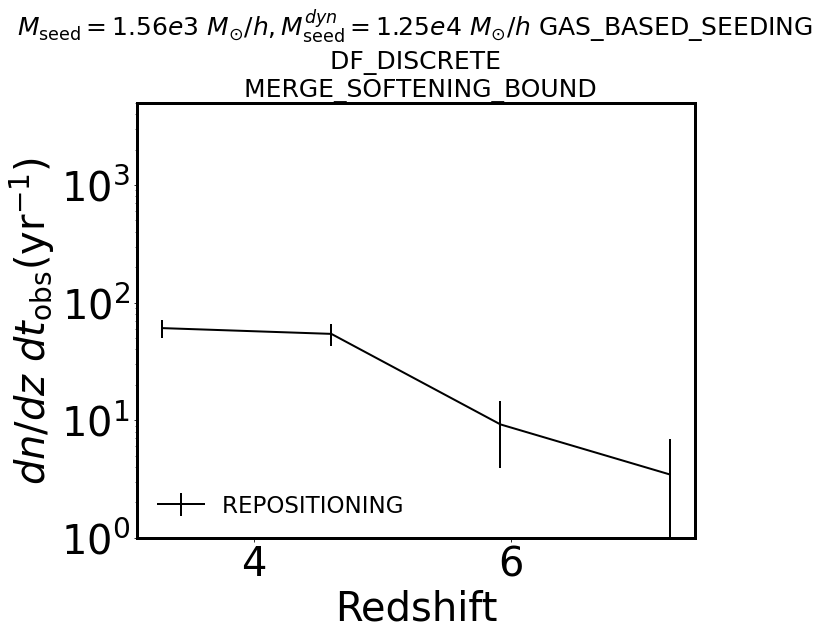

In [5]:

f,axx=plt.subplots(1,1,figsize=(10,8),sharey=True,sharex=True)

redshift_cut=0
mass_cut=0
mass_ratio_cut=0
total_mass_cut=0
apply_host_cuts=0
HDF5=1
ZOOM=0

nbins=20
min_value=0
max_value=25

upto_redshift=0

def do(labl='',width=8,HDF5=0,path_to_hdf5='',box_length=1,mark=''):
    #HDF5=0

    #path_to_output='/ufrc/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    #run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax10_haloindex4_redshift5.00_logbhseedmass5.00_NSC/' # name of the simulation runs
    #basePath=path_to_output+run+'AREPO/output_upto_3/'

    nbins=20
    min_value=0
    max_value=25
    bins,dist,dist_err,norm,dz_dt=get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=HDF5,path_to_hdf5=path_to_hdf5)
    volume_of_redshift_shell=numpy.array([4*3.14*DC(0,z_bin)**2*dx_dz(z_bin) for z_bin in bins])

    if (HDF5):
        simulation_volume=box_length**3
    else:
        simulation_volume=(arepo_package.get_box_size(basePath)/1000)**3


    merger_rate=dist*1.
    merger_rate_err=dist_err*1.

    merger_rate*=dz_dt
    merger_rate_err*=dz_dt

    merger_rate/=simulation_volume
    merger_rate_err/=simulation_volume

    merger_rate*=volume_of_redshift_shell
    merger_rate_err*=volume_of_redshift_shell

    merger_rate/=(1+bins)
    merger_rate_err/=(1+bins)

    #ax[4].errorbar(bins[mask],merger_rate[mask],merger_rate_err[mask],label='$Z<10^{-4}Z_{\odot}$ (levelmax=9)',linewidth=3)
    ax.set_yscale('log')

    ax.tick_params(labelsize=40)

    ax.set_xlabel('Redshift',fontsize=40)

    merger_rate2=dist*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    merger_rate_err2=dist_err*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    mask=(dist>0)&(merger_rate2>0)
    ax.errorbar(bins[mask],merger_rate2[mask],merger_rate_err2[mask],label=labl,linewidth=width,color=col,linestyle=style,marker=mark,ms=7)
    ax.set_yscale('log')


    #data=numpy.loadtxt('./digitized_data/Laura_proposal_illustris_merger_rates.txt')
    #ax[4].errorbar(data[:,0],data[:,1])



 

mass_cut=1.56e3

style='solid'








ax=axx


col='black'





style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n256/AREPO/' # name of the simulation runs
output='/output_FOF_8_5.00_discreteDF_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
do(width=2,labl='REPOSITIONING ')






plt.subplots_adjust(wspace=0,hspace=0)


for a in [axx]:
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 

ax.set_ylim(1,5000)








#ax.set_ylim(1,4e)

#ax.set_xlim(6,30)


tt='$M_{\mathrm{seed}}=1.56e3 \ M_{\odot}/h , M^{dyn}_{\mathrm{seed}} = 1.25e4 \ M_{\odot}/h$ GAS_BASED_SEEDING \n DF_DISCRETE \n MERGE_SOFTENING_BOUND'
ax.set_title(tt,fontsize=25)


ax.legend(loc='lower left',fontsize=23,frameon=False)




axx.set_ylabel('$dn/dz \ dt_{\mathrm{obs}} (\mathrm{yr}^{-1})$',fontsize=40)

#plt.savefig('./Paper8_figures/merger_rates_gas_DM_gas.png',bbox_inches='tight')




In [207]:
def make_plot(Nbins=20,cmap='Blues',col='Blue',s=10,labl=''):
    xbins = np.linspace(0, 25, Nbins)  # 20 bins between -4 and 4 for x
    ybins = np.linspace(-3, 4, Nbins)
    GroupMass,o=arepo_package.get_group_property(basePath,'GroupMass',0)
    max_time=T(o,12300)/1e6/hubble
    
    merger_properties,initial_trajectory_primary,initial_trajectory_secondary=numpy.load(basePath + '/merger_statistics.npy',allow_pickle=True)
    merger_type=numpy.array(merger_properties['merger_type'])
    merger_redshift = numpy.array(merger_properties['merger_redshift'])
    merger_time_scale_best = numpy.array(merger_properties['merger_time_scale_best'])
    merger_time_scale_err = numpy.array(merger_properties['merger_time_scale_err'])
    halo_merger_redshift_before = numpy.array(merger_properties['halo_merger_redshift_before'])
    halo_merger_redshift_after = numpy.array(merger_properties['halo_merger_redshift_after'])
    halo_merger_redshift_mid = (halo_merger_redshift_before+halo_merger_redshift_after)/2
    halo_merger_redshift_err = (halo_merger_redshift_before-halo_merger_redshift_after)/2
    mask0=merger_type==0
    mask1=merger_type==1
    mask2=merger_type==2
    mask3=merger_type==3
    
    #print(halo_merger_redshift_err)
    
    #mask=merger_type==merger_type
    #hist = ax.hist2d(redshift_bh_merger[mask], numpy.log10(merger_time_scale[mask]+0.01), bins=[xbins,ybins],norm=mpl.colors.LogNorm(vmin=1,vmax=500), cmap=cmap)
    ax.errorbar(halo_merger_redshift_mid[mask0],merger_time_scale_best[mask0],xerr=halo_merger_redshift_mid[mask0]*100,yerr=merger_time_scale_err[mask0],linewidth=0,marker='o',color=col,ms=s)
    ax.errorbar(halo_merger_redshift_mid[mask1],merger_time_scale_best[mask1],xerr=halo_merger_redshift_mid[mask1],yerr=merger_time_scale_err[mask1],linewidth=0,marker='o',color=col,ms=s,label=labl)
    ax.errorbar(halo_merger_redshift_mid[mask2],merger_time_scale_best[mask2],xerr=halo_merger_redshift_mid[mask2],yerr=merger_time_scale_err[mask2],linewidth=0,marker='o',color=col,ms=s)
    ax.errorbar(halo_merger_redshift_mid[mask3],merger_time_scale_best[mask3],xerr=halo_merger_redshift_mid[mask3],yerr=merger_time_scale_err[mask3],linewidth=0,marker='o',color=col,ms=s)

    
    ax.set_xlabel('Redshift of \n halo merger',fontsize=40)
    ax.tick_params(labelsize=40)
    ax.set_ylim(20,4e4)
    ax.set_xlim(0,25)
    ax.set_yscale('log')
    #ax.axhline(13.7*1000,linestyle='dashed',color='grey',linewidth=5)
    ax.axhline(max_time,linestyle='dashed',color=col,linewidth=5)
    #cbar = f.colorbar(hist[3], ax=ax,orientation='horizontal')
    #cbar.ax.set_ylabel('Counts (log scale)',fontsize=40)
    #cbar.ax.tick_params(labelsize=40)
    #return hist

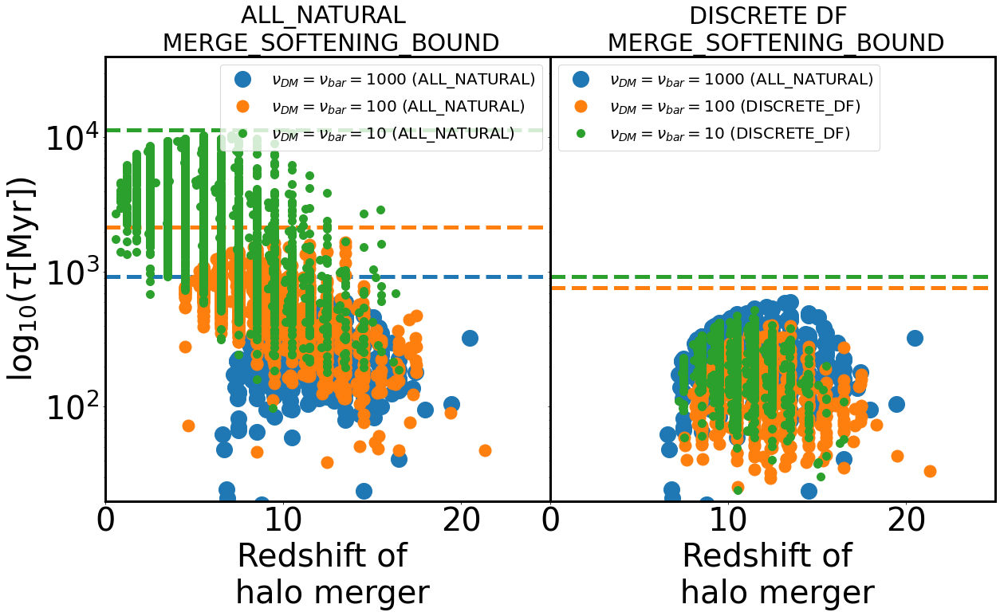

In [214]:

f,axx=plt.subplots(1,2,figsize=(20,10),sharey=True,sharex=True)

#ax.set_title('$M^{\mathrm{dyn}}_{\mathrm{seed}}=1e5 \ M_{\odot}/h$',fontsize=30)

ax=axx[0]
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_FOF_7_5.90_strict_velocity_gas_res/'
basePath=path_to_output+run+output
make_plot(col='C0',s=20,labl=r'$\nu_{DM}=\nu_{bar}= 1000$ (ALL_NATURAL)')

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_FOF_7_5.90_strict_velocity_gas_res/'
basePath=path_to_output+run+output
make_plot(col='C1',s=15,labl=r'$\nu_{DM}=\nu_{bar}= 100$ (ALL_NATURAL)')

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n256//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_FOF_7_5.90_strict_velocity_gas_res/'
basePath=path_to_output+run+output
make_plot(col='C2',labl=r'$\nu_{DM}=\nu_{bar}= 10$ (ALL_NATURAL)')


ax=axx[1]

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_FOF_7_5.90_strict_velocity_gas_res/'
basePath=path_to_output+run+output
make_plot(col='C0',s=20,labl=r'$\nu_{DM}=\nu_{bar}= 1000$ (ALL_NATURAL)')

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_FOF_7_5.90_discreteDF_strict_velocity_gas_res/'
basePath=path_to_output+run+output
make_plot(col='C1',s=15,labl=r'$\nu_{DM}=\nu_{bar}= 100$ (DISCRETE_DF)')

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n256//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_FOF_7_5.90_discreteDF_strict_velocity_gas_res/'
basePath=path_to_output+run+output
make_plot(col='C2',labl=r'$\nu_{DM}=\nu_{bar}= 10$ (DISCRETE_DF)')


#put_mean(col='green')



#put_mean(col='red')

# Add a colorbar


# Set axis labels and title

axx[0].set_ylabel(r'$\log_{10}(\tau[\mathrm{Myr}])$',fontsize=40)
ax.set_title('2D Histogram with Logarithmic Normalization')

plt.subplots_adjust(wspace=0)


# Increase font size of axis ticks
#ax.tick_params(axis='both', labelsize=14) [1]



for a in axx.flatten():
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 
    
axx[0].set_title('ALL_NATURAL \n MERGE_SOFTENING_BOUND',fontsize=30)
axx[1].set_title('DISCRETE DF \n MERGE_SOFTENING_BOUND',fontsize=30)
#axx[2].set_title('DISCRETE DF \n MERGE_SOFTENING',fontsize=30)
#axx[3].set_title('DISCRETE DF \n MERGE_SOFTENING_BOUND',fontsize=30)

axx[0].legend(loc='upper right',fontsize=20)
    
axx[1].legend(loc='upper left',fontsize=20)
    
    
#axx[0].set_ylim(10,1e5)
    
plt.subplots_adjust(wspace=0,hspace=-0.3,top=0.90)
plt.savefig('./Paper8_figures/merger_time_scales_seed5.90.png',bbox_inches='tight')











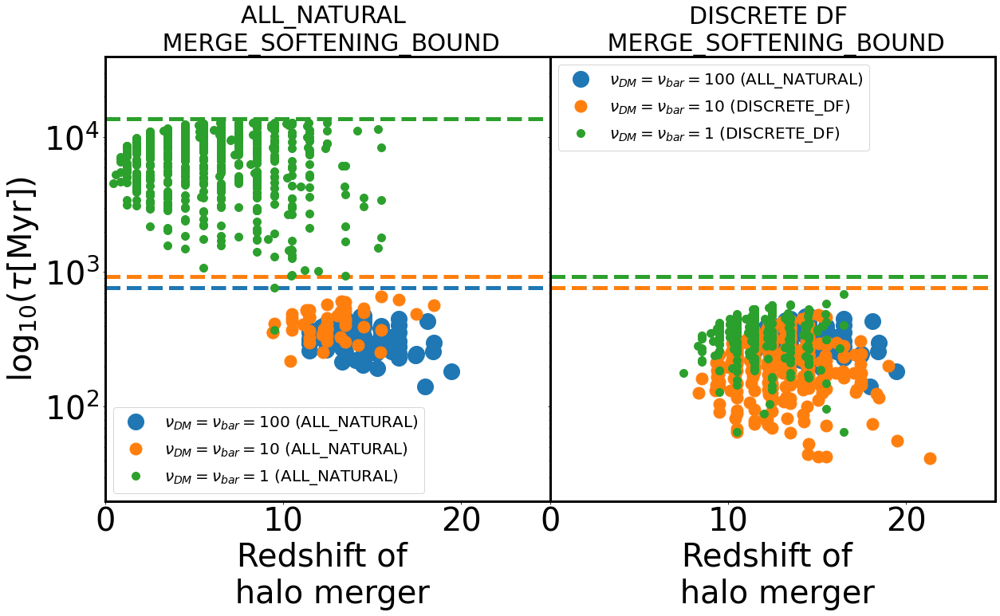

In [211]:

f,axx=plt.subplots(1,2,figsize=(20,10),sharey=True,sharex=True)

#ax.set_title('$M^{\mathrm{dyn}}_{\mathrm{seed}}=1e5 \ M_{\odot}/h$',fontsize=30)

ax=axx[0]
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_FOF_7_5.00_strict_velocity_gas_res/'
basePath=path_to_output+run+output
make_plot(col='C0',s=20,labl=r'$\nu_{DM}=\nu_{bar}= 100$ (ALL_NATURAL)')

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_FOF_7_5.00_strict_velocity_gas_res/'
basePath=path_to_output+run+output
make_plot(col='C1',s=15,labl=r'$\nu_{DM}=\nu_{bar}= 10$ (ALL_NATURAL)')

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n256//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_FOF_7_5.00_strict_velocity_gas_res/'
basePath=path_to_output+run+output
make_plot(col='C2',labl=r'$\nu_{DM}=\nu_{bar}= 1$ (ALL_NATURAL)')


ax=axx[1]

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n1024//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_FOF_7_5.00_strict_velocity_gas_res/'
basePath=path_to_output+run+output
make_plot(col='C0',s=20,labl=r'$\nu_{DM}=\nu_{bar}= 100$ (ALL_NATURAL)')

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n512//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_FOF_7_5.00_discreteDF_strict_velocity_gas_res/'
basePath=path_to_output+run+output
make_plot(col='C1',s=15,labl=r'$\nu_{DM}=\nu_{bar}= 10$ (DISCRETE_DF)')

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS//L3p125n256//' # this is the folder containing the simulation run
run='/AREPO/' # name of the simulation runs
output='output_FOF_7_5.00_discreteDF_strict_velocity_gas_res/'
basePath=path_to_output+run+output
make_plot(col='C2',labl=r'$\nu_{DM}=\nu_{bar}= 1$ (DISCRETE_DF)')


#put_mean(col='green')



#put_mean(col='red')

# Add a colorbar


# Set axis labels and title

axx[0].set_ylabel(r'$\log_{10}(\tau[\mathrm{Myr}])$',fontsize=40)
ax.set_title('2D Histogram with Logarithmic Normalization')

plt.subplots_adjust(wspace=0)


# Increase font size of axis ticks
#ax.tick_params(axis='both', labelsize=14) [1]



for a in axx.flatten():
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 
    
axx[0].set_title('ALL_NATURAL \n MERGE_SOFTENING_BOUND',fontsize=30)
axx[1].set_title('DISCRETE DF \n MERGE_SOFTENING_BOUND',fontsize=30)
#axx[2].set_title('DISCRETE DF \n MERGE_SOFTENING',fontsize=30)
#axx[3].set_title('DISCRETE DF \n MERGE_SOFTENING_BOUND',fontsize=30)

axx[0].legend(loc='lower left',fontsize=20)
    
axx[1].legend(loc='upper left',fontsize=20)
    
    
#axx[0].set_ylim(10,1e5)
    
plt.subplots_adjust(wspace=0,hspace=-0.3,top=0.90)
plt.savefig('./Paper8_figures/merger_time_scales_seed5.00.png',bbox_inches='tight')











In [28]:
def make_plot(labl='',col='blue',softening=1,style='solid',width=4):
    #hubble=0.6771
    velocities1_space=numpy.array([])
    velocities1_DM_only_space=numpy.array([])
    GroupMass1_space=numpy.array([])
    distances1_Min_Pot_space=numpy.array([])
    distances1_Min_Pot_without_BH_space=numpy.array([])
    Nblocks=40

    folder=basePath+'/new_BH_distances_velocities_from_center_mpi_%d/'%desired_redshift
    files = os.listdir(folder)

    # Iterate over each file and load it using numpy.load
    for file_name in files:
        #file_name = 'new_BH_distances_from_center_mpi_%d/block_%d.npy'%(desired_redshift,block)
        distances1, distances1_Min_Pot, distances1_Min_Pot_without_BH, GroupBHMass1,GroupMass1,velocities1, velocities1_DM_only = numpy.load(folder+file_name,allow_pickle=True)
        distances1_Min_Pot_space=numpy.append(distances1_Min_Pot_space,distances1_Min_Pot)
        distances1_Min_Pot_without_BH_space=numpy.append(distances1_Min_Pot_without_BH_space,distances1_Min_Pot_without_BH)
        #print(GroupMass1)
        GroupMass1_space=numpy.append(GroupMass1_space,GroupMass1)
        velocities1_space = numpy.append(velocities1_space,velocities1)
        velocities1_DM_only_space = numpy.append(velocities1_DM_only_space,velocities1_DM_only)
        #GroupMass1_space=numpy.append(GroupMass1_space,GroupMass1)
        #print(len(distances1_Min_Pot_space),len(GroupMass1_space))
    print(mass_cut)
    mask=GroupMass1_space>mass_cut/1e10
    #print(len(velocities1_space),len(GroupMass1_space))
    centers,HMF,dHMF,norm,counts_sum = arepo_package.get_probability_density(numpy.log10(velocities1_space[mask]),Nbin,vmax,vmin,linear=1)

    ax[0].errorbar(centers,HMF*counts_sum,dHMF*counts_sum,label=labl,color=col,linewidth=width,linestyle=style)
 
    centers,HMF,dHMF,norm,counts_sum = arepo_package.get_probability_density(numpy.log10(velocities1_DM_only_space[mask]),Nbin,vmax,vmin,linear=1)
    ax[1].errorbar(centers,HMF*counts_sum,dHMF*counts_sum,label=labl,color=col,linewidth=width,linestyle=style)



0
0
0


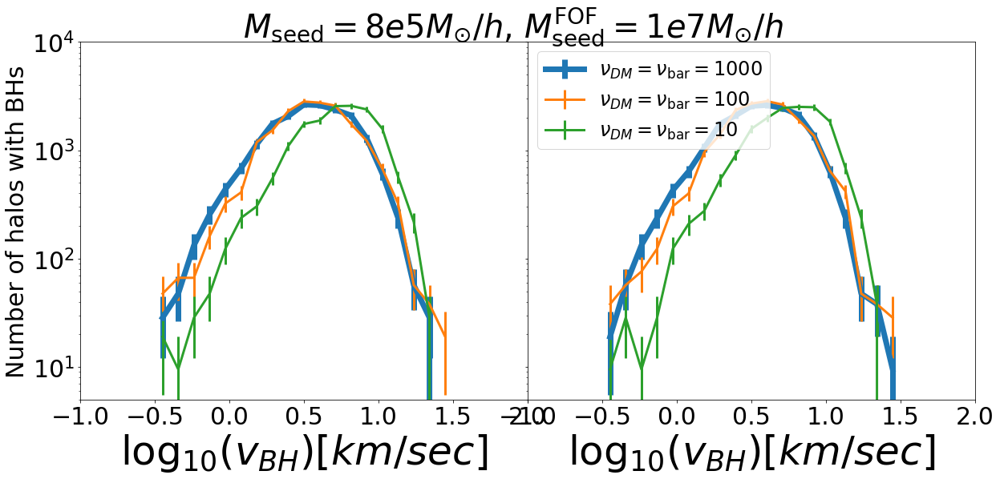

In [30]:



f,ax=plt.subplots(1,2,figsize=(20,8),sharex=True,sharey=True)
Nbin,vmax,vmin=20,-0.5,1.5

mass_cut=0
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n1024/AREPO/' 
output='/output_FOF_7_5.90_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
desired_redshift=11

make_plot(labl=r'$\nu_{DM}=\nu_{\mathrm{bar}}=1000$',col='C0',softening=0.125,width=7)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' 
output='/output_FOF_7_5.90_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
#desired_redshift=11

make_plot(labl=r'$\nu_{DM}=\nu_{\mathrm{bar}}=100$',col='C1',softening=0.5,width=3)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n256/AREPO/' 
output='/output_FOF_7_5.90_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
#desired_redshift=11

make_plot(labl=r'$\nu_{DM}=\nu_{\mathrm{bar}}=10$',col='C2',softening=0.5,width=3)



f.suptitle('$M_{\mathrm{seed}}=8e5 M_{\odot}/h$, $M^{\mathrm{FOF}}_{\mathrm{seed}}=1e7 M_{\odot}/h$',fontsize=40)

ax[0].set_xlim(-1.,2.)
ax[1].set_yscale('log')


ax[0].set_ylim(5,10000)
    #ax.set_xscale('log')

ax[0].set_ylabel('Number of halos with BHs',fontsize=30)



ax[0].set_xlabel('$\log_{10}(v_{BH})[km/sec]$',fontsize=50)
ax[1].set_xlabel('$\log_{10}(v_{BH})[km/sec]$',fontsize=50)

ax[0].tick_params(labelsize=30)
ax[1].tick_params(labelsize=30)

ax[1].legend(loc='upper left',fontsize=24)




plt.subplots_adjust(wspace=0,hspace=-0.3,top=0.90)


30000000.0
30000000.0
30000000.0


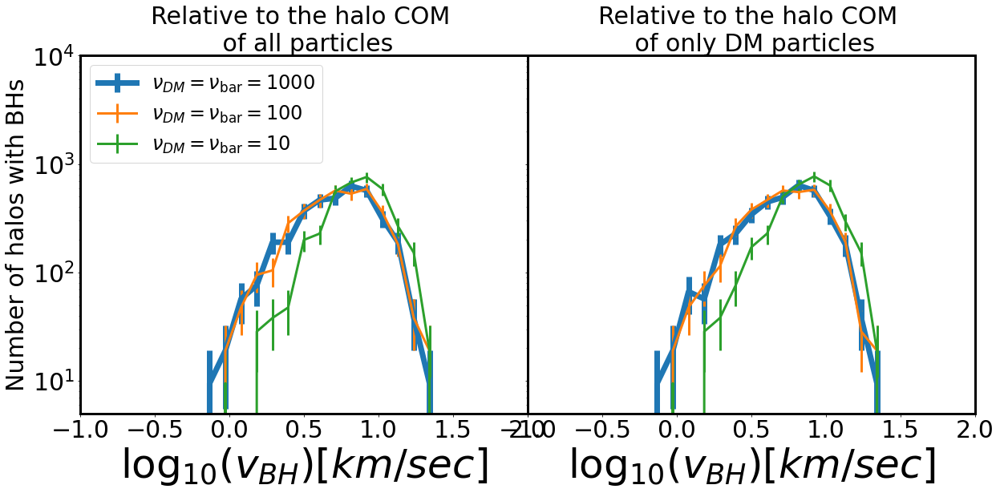

In [33]:



f,ax=plt.subplots(1,2,figsize=(20,8),sharex=True,sharey=True)
Nbin,vmax,vmin=20,-0.5,1.5

mass_cut = 3e7
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n1024/AREPO/' 
output='/output_FOF_7_5.90_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
desired_redshift=11

make_plot(labl=r'$\nu_{DM}=\nu_{\mathrm{bar}}=1000$',col='C0',softening=0.125,width=7)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' 
output='/output_FOF_7_5.90_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
#desired_redshift=11

make_plot(labl=r'$\nu_{DM}=\nu_{\mathrm{bar}}=100$',col='C1',softening=0.25,width=3)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n256/AREPO/' 
output='/output_FOF_7_5.90_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
#desired_redshift=11

make_plot(labl=r'$\nu_{DM}=\nu_{\mathrm{bar}}=10$',col='C2',softening=0.5,width=3)



#f.suptitle('$M_{\mathrm{seed}}=8e5 M_{\odot}/h$, $M^{\mathrm{FOF}}_{\mathrm{seed}}=1e7 M_{\odot}/h$',fontsize=40)

ax[0].set_xlim(-1.,2.)
ax[1].set_yscale('log')


ax[0].set_ylim(5,10000)
    #ax.set_xscale('log')

ax[0].set_ylabel('Number of halos with BHs',fontsize=30)



ax[0].set_xlabel('$\log_{10}(v_{BH})[km/sec]$',fontsize=50)
ax[1].set_xlabel('$\log_{10}(v_{BH})[km/sec]$',fontsize=50)

ax[0].tick_params(labelsize=30)
ax[1].tick_params(labelsize=30)

ax[0].legend(loc='upper left',fontsize=24)


ax[0].set_title('Relative to the halo COM \n of all particles',fontsize=30)

ax[1].set_title('Relative to the halo COM \n of only DM particles',fontsize=30)


for a in ax.flatten():
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 
    
    
plt.subplots_adjust(wspace=0,hspace=-0.3,top=0.90)
plt.savefig('./Paper8_figures/FOF_seed_velocity_distributions_noDF_seed5.90.png',bbox_inches='tight')




plt.subplots_adjust(wspace=0,hspace=-0.3,top=0.90)


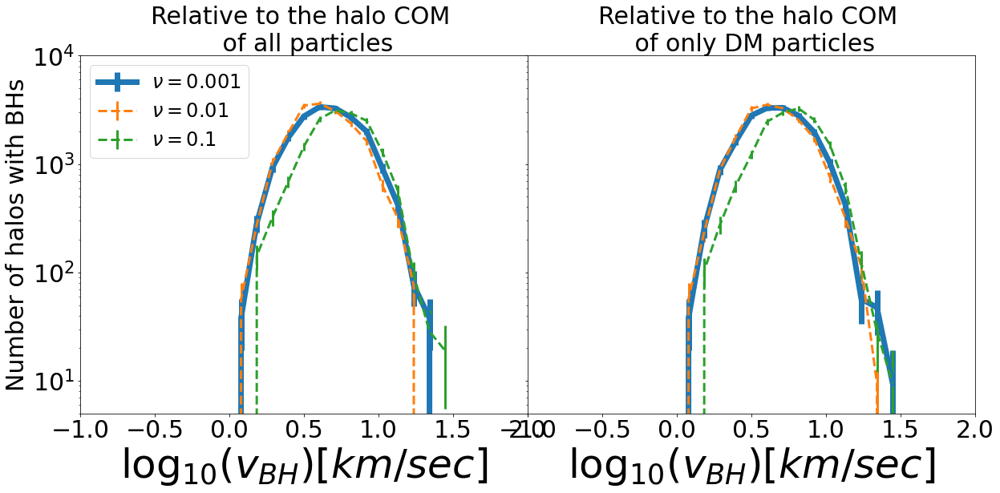

In [33]:



f,ax=plt.subplots(1,2,figsize=(20,8),sharex=True,sharey=True)
Nbin,vmax,vmin=20,-0.5,1.5


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n1024/AREPO/' 
output='/output_FOF_7_5.90_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
desired_redshift=11
make_plot(labl=r'$\nu=0.001$',col='C0',softening=0.125,width=7)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' 
output='/output_FOF_7_5.90_discreteDF_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
make_plot(labl=r'$\nu=0.01$',col='C1',softening=0.5,width=3,style='dashed')


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n256/AREPO/' 
output='/output_FOF_7_5.90_discreteDF_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
#desired_redshift=11

make_plot(labl=r'$\nu=0.1$',col='C2',softening=0.5,width=3,style='dashed')



#f.suptitle('$M_{\mathrm{seed}}=8e5 M_{\odot}/h$, $M^{\mathrm{FOF}}_{\mathrm{seed}}=1e7 M_{\odot}/h$',fontsize=40)

ax[0].set_xlim(-1.,2.)
ax[1].set_yscale('log')


ax[0].set_ylim(5,10000)
    #ax.set_xscale('log')

ax[0].set_ylabel('Number of halos with BHs',fontsize=30)


ax[0].set_title('Relative to the halo COM \n of all particles',fontsize=30)

ax[1].set_title('Relative to the halo COM \n of only DM particles',fontsize=30)

ax[0].set_xlabel('$\log_{10}(v_{BH})[km/sec]$',fontsize=50)
ax[1].set_xlabel('$\log_{10}(v_{BH})[km/sec]$',fontsize=50)

ax[0].tick_params(labelsize=30)
ax[1].tick_params(labelsize=30)

ax[0].legend(loc='upper left',fontsize=24)




plt.subplots_adjust(wspace=0,hspace=-0.3,top=0.90)


10000000.0
10000000.0
10000000.0


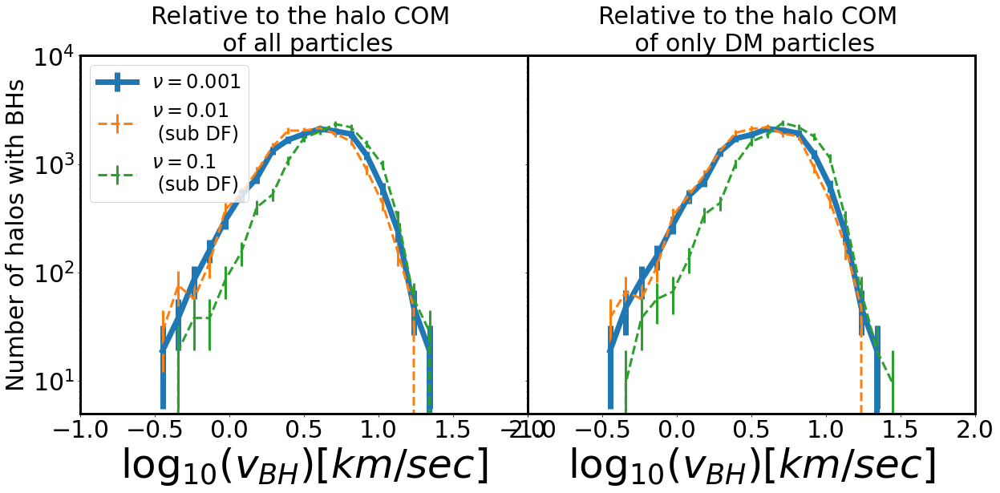

In [35]:



f,ax=plt.subplots(1,2,figsize=(20,8),sharex=True,sharey=True)
Nbin,vmax,vmin=20,-0.5,1.5

mass_cut=1e7
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n1024/AREPO/' 
output='/output_FOF_7_5.90_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
desired_redshift=11
make_plot(labl=r'$\nu=0.001$',col='C0',softening=0.125,width=7)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' 
output='/output_FOF_7_5.90_discreteDF_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
make_plot(labl=r'$\nu=0.01$' + '\n (sub DF)',col='C1',softening=0.5,width=3,style='dashed')


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n256/AREPO/' 
output='/output_FOF_7_5.90_discreteDF_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
#desired_redshift=11

make_plot(labl=r'$\nu=0.1$' + '\n (sub DF)',col='C2',softening=0.5,width=3,style='dashed')



#f.suptitle('$M_{\mathrm{seed}}=8e5 M_{\odot}/h$, $M^{\mathrm{FOF}}_{\mathrm{seed}}=1e7 M_{\odot}/h$',fontsize=40)

ax[0].set_xlim(-1.,2.)
ax[1].set_yscale('log')


ax[0].set_ylim(5,10000)
    #ax.set_xscale('log')

ax[0].set_ylabel('Number of halos with BHs',fontsize=30)


ax[0].set_title('Relative to the halo COM \n of all particles',fontsize=30)

ax[1].set_title('Relative to the halo COM \n of only DM particles',fontsize=30)

ax[0].set_xlabel('$\log_{10}(v_{BH})[km/sec]$',fontsize=50)
ax[1].set_xlabel('$\log_{10}(v_{BH})[km/sec]$',fontsize=50)

ax[0].tick_params(labelsize=30)
ax[1].tick_params(labelsize=30)

ax[0].legend(loc='upper left',fontsize=24)




plt.subplots_adjust(wspace=0,hspace=-0.3,top=0.90)

for a in ax.flatten():
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 
    
    
#plt.subplots_adjust(wspace=0,hspace=-0.3,top=0.90)
plt.subplots_adjust(wspace=0,hspace=-0.3,top=0.90)
plt.savefig('./Paper8_figures/FOF_seed_velocity_distributions_DF_seed5.90.png',bbox_inches='tight')



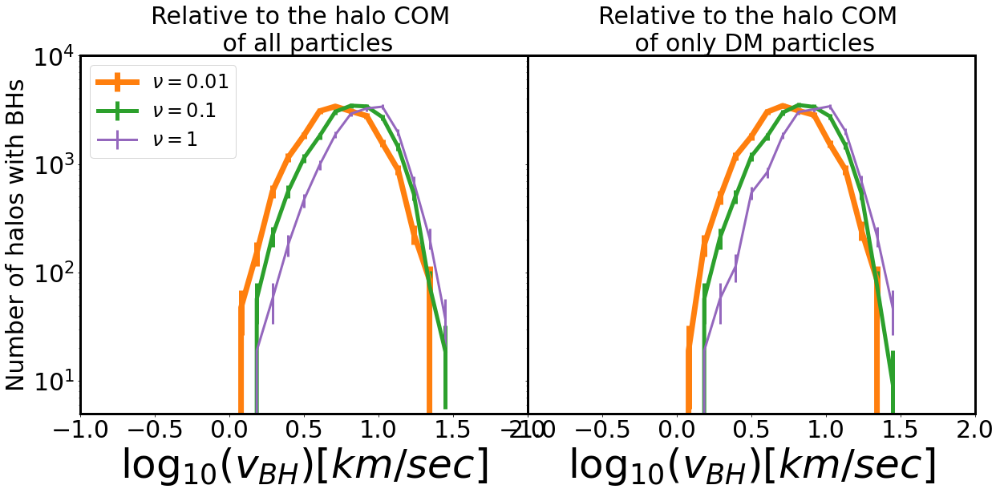

In [37]:



f,ax=plt.subplots(1,2,figsize=(20,8),sharex=True,sharey=True)
Nbin,vmax,vmin=20,-0.5,1.5


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n1024/AREPO/' 
output='/output_FOF_7_5.00_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
desired_redshift=11

make_plot(labl=r'$\nu=0.01$',col='C1',softening=0.125,width=7)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' 
output='/output_FOF_7_5.00_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
#desired_redshift=11

make_plot(labl=r'$\nu=0.1$',col='C2',softening=0.5,width=5)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n256/AREPO/' 
output='/output_FOF_7_5.00_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
#desired_redshift=11

make_plot(labl=r'$\nu=1$',col='C4',softening=0.5,width=3)



#f.suptitle('$M_{\mathrm{seed}}=1e5 M_{\odot}/h$, $M^{\mathrm{FOF}}_{\mathrm{seed}}=1e7 M_{\odot}/h$',fontsize=40)

ax[0].set_xlim(-1.,2.)
ax[1].set_yscale('log')


ax[0].set_ylim(5,10000)
    #ax.set_xscale('log')

ax[0].set_ylabel('Number of halos with BHs',fontsize=30)



ax[0].set_xlabel('$\log_{10}(v_{BH})[km/sec]$',fontsize=50)
ax[1].set_xlabel('$\log_{10}(v_{BH})[km/sec]$',fontsize=50)

ax[0].tick_params(labelsize=30)
ax[1].tick_params(labelsize=30)

ax[0].legend(loc='upper left',fontsize=24)

ax[0].set_title('Relative to the halo COM \n of all particles',fontsize=30)

ax[1].set_title('Relative to the halo COM \n of only DM particles',fontsize=30)


for a in ax.flatten():
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 
    
    
plt.subplots_adjust(wspace=0,hspace=-0.3,top=0.90)
plt.savefig('./Paper8_figures/FOF_seed_velocity_distributions_noDF.png',bbox_inches='tight')





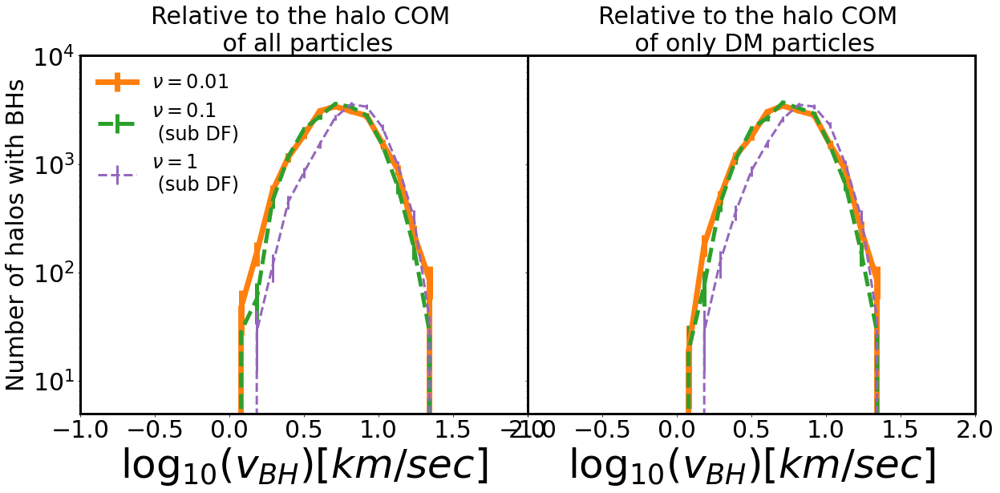

In [38]:



f,ax=plt.subplots(1,2,figsize=(20,8),sharex=True,sharey=True)
Nbin,vmax,vmin=20,-0.5,1.5


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n1024/AREPO/' 
output='/output_FOF_7_5.00_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
desired_redshift=11
make_plot(labl=r'$\nu=0.01$ ',col='C1',softening=0.125,width=7)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' 
output='/output_FOF_7_5.00_discreteDF_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
make_plot(labl=r'$\nu=0.1$'+'\n (sub DF)',col='C2',softening=0.5,width=5,style='dashed')


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n256/AREPO/' 
output='/output_FOF_7_5.00_discreteDF_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
#desired_redshift=11

make_plot(labl=r'$\nu=1$'+' \n (sub DF)',col='C4',softening=0.5,width=3,style='dashed')



#f.suptitle('$M_{\mathrm{seed}}=1e5 M_{\odot}/h$, $M^{\mathrm{FOF}}_{\mathrm{seed}}=1e7 M_{\odot}/h$',fontsize=40)

ax[0].set_xlim(-1.,2.)
ax[1].set_yscale('log')


ax[0].set_ylim(5,10000)
    #ax.set_xscale('log')

ax[0].set_ylabel('Number of halos with BHs',fontsize=30)



ax[0].set_xlabel('$\log_{10}(v_{BH})[km/sec]$',fontsize=50)
ax[1].set_xlabel('$\log_{10}(v_{BH})[km/sec]$',fontsize=50)

ax[0].tick_params(labelsize=30)
ax[1].tick_params(labelsize=30)

ax[0].legend(loc='upper left',fontsize=24,frameon=False)


ax[0].set_title('Relative to the halo COM \n of all particles',fontsize=30)

ax[1].set_title('Relative to the halo COM \n of only DM particles',fontsize=30)


for a in ax.flatten():
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 
    
    
plt.subplots_adjust(wspace=0,hspace=-0.3,top=0.90)
plt.savefig('./Paper8_figures/FOF_seed_velocity_distributions_DF.png',bbox_inches='tight')




#plt.subplots_adjust(wspace=0,hspace=-0.3,top=0.90)


In [51]:

def make_plot(labl='',col='blue',softening=1,style='solid',width=4):
    #hubble=0.6771
    GroupMass1_space=numpy.array([])
    distances1_Min_Pot_space=numpy.array([])
    distances1_Min_Pot_without_BH_space=numpy.array([])
    Nblocks=40

    folder=basePath+'/new_BH_distances_from_center_mpi_%d/'%desired_redshift
    files = os.listdir(folder)

    # Iterate over each file and load it using numpy.load
    for file_name in files:
        #file_name = 'new_BH_distances_from_center_mpi_%d/block_%d.npy'%(desired_redshift,block)
        distances1, distances1_Min_Pot, distances1_Min_Pot_without_BH, GroupBHMass1,GroupMass1 = numpy.load(folder+file_name,allow_pickle=True)
        distances1_Min_Pot_space=numpy.append(distances1_Min_Pot_space,distances1_Min_Pot)
        distances1_Min_Pot_without_BH_space=numpy.append(distances1_Min_Pot_without_BH_space,distances1_Min_Pot_without_BH)
        #print(GroupMass1)
        GroupMass1_space=numpy.append(GroupMass1_space,GroupMass1)

    centers,HMF,dHMF,norm,counts_sum = arepo_package.get_probability_density(numpy.log10(distances1_Min_Pot_without_BH_space),Nbin,vmax,vmin,linear=1)

    ax[1,0].errorbar(centers,HMF*counts_sum,dHMF*counts_sum,label=labl,color=col,linewidth=width,linestyle=style)
    ax[1,1].errorbar(centers-numpy.log10(softening),HMF*counts_sum,dHMF*counts_sum,label='$\epsilon_g=%.3f$ kpc/h'%(softening),color=col,linewidth=width,linestyle=style)

    centers,HMF,dHMF,norm,counts_sum = arepo_package.get_probability_density(numpy.log10(distances1_Min_Pot_space),Nbin,vmax,vmin,linear=1)

    ax[0,0].errorbar(centers,HMF*counts_sum,dHMF*counts_sum,label=labl,color=col,linewidth=width,linestyle=style)
    ax[0,1].errorbar(centers-numpy.log10(softening),HMF*counts_sum,dHMF*counts_sum,label='$\epsilon_g=%.3f$ kpc/h'%(softening),color=col,linewidth=width,linestyle=style)


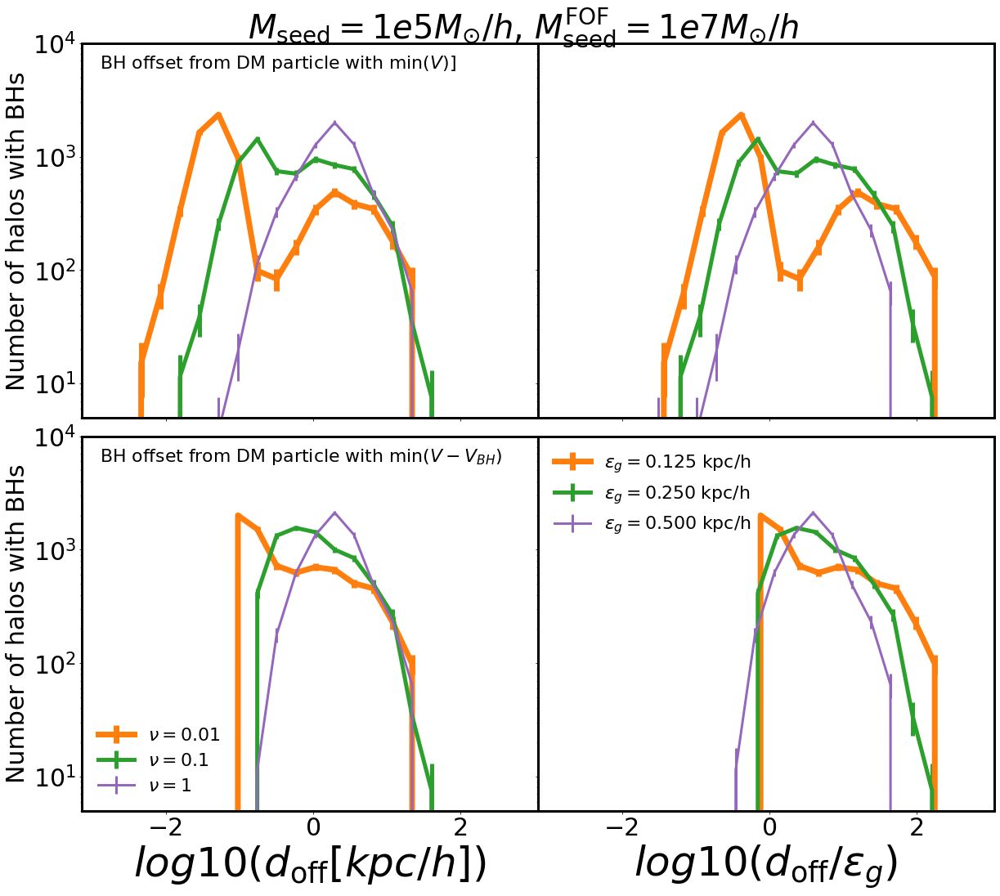

In [52]:



f,ax=plt.subplots(2,2,figsize=(20,16),sharex=True,sharey=True)
Nbin,vmax,vmin=20,-3,2


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n1024/AREPO/' 
output='/output_FOF_7_5.00_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
desired_redshift=11

make_plot(labl=r'$\nu=0.01$',col='C1',softening=0.125,width=7)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' 
output='/output_FOF_7_5.00_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
desired_redshift=11

make_plot(labl=r'$\nu=0.1$',col='C2',softening=0.25,width=5)

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' 
output='/output_FOF_7_5.00_discreteDF_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
desired_redshift=11

#make_plot(labl=r'$\nu=0.1$',col='C1',softening=0.25,style='dashed')



path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n256/AREPO/' 
output='/output_FOF_7_5.00_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
desired_redshift=11

make_plot(labl=r'$\nu=1$',col='C4',softening=0.5,width=3)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' 
output='/output_FOF_7_5.00_discreteDF_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
desired_redshift=11

#make_plot(labl='',col='C1',softening=0.25,style='dashed')


f.suptitle('$M_{\mathrm{seed}}=1e5 M_{\odot}/h$, $M^{\mathrm{FOF}}_{\mathrm{seed}}=1e7 M_{\odot}/h$',fontsize=40)

#ax.set_xlim(-10,1.2)
ax[0,0].set_yscale('log')
ax[0,1].set_yscale('log')
ax[1,0].set_yscale('log')
ax[1,1].set_yscale('log')

ax[0,0].set_ylim(5,10000)
    #ax.set_xscale('log')

ax[0,0].set_ylabel('Number of halos with BHs',fontsize=30)
ax[1,0].set_ylabel('Number of halos with BHs',fontsize=30)


ax[1,0].set_xlabel('$log10(d_{\mathrm{off}}[kpc/h])$',fontsize=50)
ax[1,1].set_xlabel('$log10(d_{\mathrm{off}}/\epsilon_{g})$',fontsize=50)

ax[1,0].set_xlabel('$log10(d_{\mathrm{off}}[kpc/h])$',fontsize=50)
ax[1,1].set_xlabel('$log10(d_{\mathrm{off}}/\epsilon_{g})$',fontsize=50)

ax[0,0].tick_params(labelsize=30)
ax[0,1].tick_params(labelsize=30)
ax[1,0].tick_params(labelsize=30)
ax[1,1].tick_params(labelsize=30)

ax[0,0].text(-2.9,6000,'BH offset from DM particle with $\mathrm{min}(V)]$',fontsize=22)
ax[1,0].text(-2.9,6000,'BH offset from DM particle with $\mathrm{min}(V-V_{BH})$',fontsize=22)

ax[1,0].legend(loc='lower left',fontsize=22,frameon=False)
ax[1,1].legend(loc='upper left',fontsize=22,frameon=False)
plt.subplots_adjust(wspace=0,hspace=0.2)

plt.subplots_adjust(wspace=0,hspace=0.05,top=0.94)


for a in ax.flatten():
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 
plt.savefig('./Paper8_figures/FOF_seed_spatial_distributions_noDF.png',bbox_inches='tight')


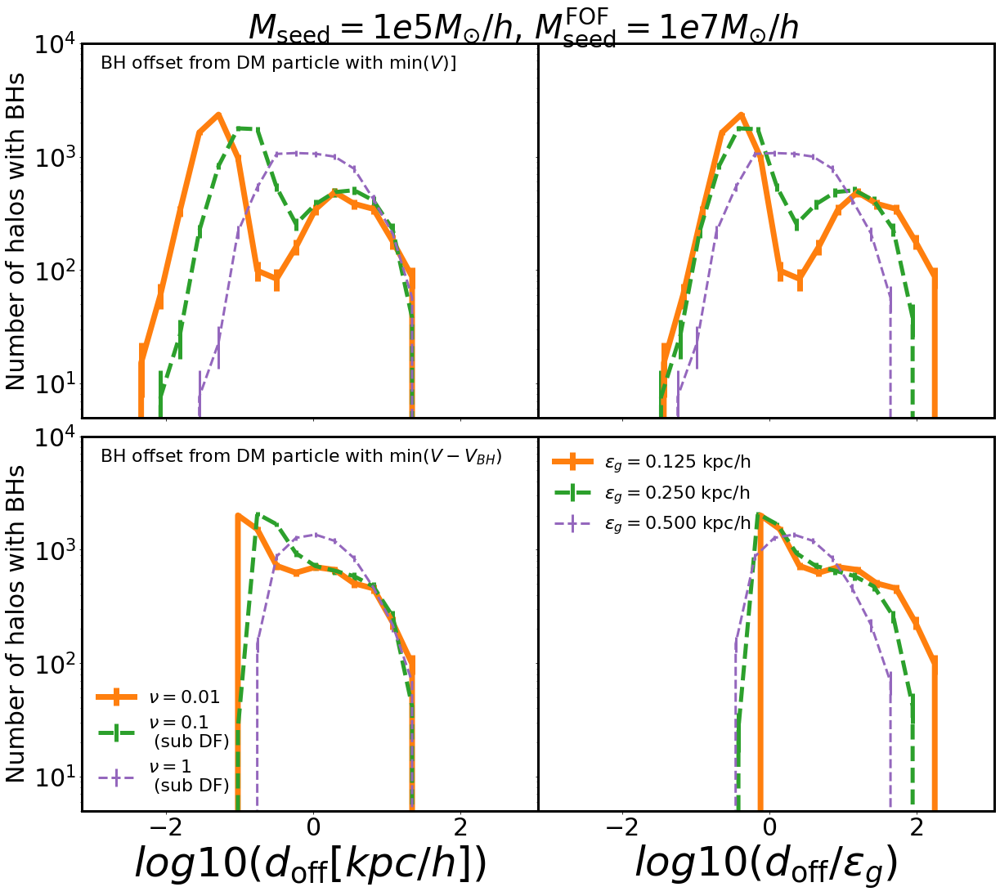

In [53]:

f,ax=plt.subplots(2,2,figsize=(20,16),sharex=True,sharey=True)
Nbin,vmax,vmin=20,-3,2

f.suptitle('$M_{\mathrm{seed}}=1e5 M_{\odot}/h$, $M^{\mathrm{FOF}}_{\mathrm{seed}}=1e7 M_{\odot}/h$',fontsize=40)

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n1024/AREPO/' 
output='/output_FOF_7_5.00_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
desired_redshift=11

make_plot(labl=r'$\nu=0.01$',col='C1',softening=0.125,width=7)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' 
output='/output_FOF_7_5.00_discreteDF_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
desired_redshift=11

make_plot(labl=r'$\nu=0.1$' + '\n (sub DF)',col='C2',softening=0.25,style='dashed',width=5)



path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n256/AREPO/' 
output='/output_FOF_7_5.00_discreteDF_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
desired_redshift=11

make_plot(labl=r'$\nu=1$' + '\n (sub DF)',col='C4',softening=0.5,style='dashed',width=3)


#f.suptitle('$M_{\mathrm{seed}}=1e5 M_{\odot}/h$',fontsize=40)


#ax[0,0].set_title('$M_{\mathrm{seed}}=1e5 M_{\odot}/h$ Potential includes contribution from BHs',fontsize=30)


#ax[1,0].set_title('$M_{\mathrm{seed}}=1e5 M_{\odot}/h$ Potential excludes contribution from BHs',fontsize=30)



#ax.set_xlim(-10,1.2)
ax[0,0].set_yscale('log')
ax[0,1].set_yscale('log')
ax[1,0].set_yscale('log')
ax[1,1].set_yscale('log')


    #ax.set_xscale('log')

ax[0,0].set_ylabel('Number of halos with BHs',fontsize=30)
ax[1,0].set_ylabel('Number of halos with BHs',fontsize=30)


ax[1,0].set_xlabel('$log10(d_{\mathrm{off}}[kpc/h])$',fontsize=50)
ax[1,1].set_xlabel('$log10(d_{\mathrm{off}}/\epsilon_{g})$',fontsize=50)




ax[1,0].set_xlabel('$log10(d_{\mathrm{off}}[kpc/h])$',fontsize=50)
ax[1,1].set_xlabel('$log10(d_{\mathrm{off}}/\epsilon_{g})$',fontsize=50)

ax[0,0].text(-2.9,6000,'BH offset from DM particle with $\mathrm{min}(V)]$',fontsize=22)
ax[1,0].text(-2.9,6000,'BH offset from DM particle with $\mathrm{min}(V-V_{BH})$',fontsize=22)

ax[0,0].set_ylim(5,10000)
ax[0,0].tick_params(labelsize=30)
ax[0,1].tick_params(labelsize=30)
ax[1,0].tick_params(labelsize=30)
ax[1,1].tick_params(labelsize=30)

ax[1,0].legend(loc='lower left',fontsize=22,frameon=False)
ax[1,1].legend(loc='upper left',fontsize=22,frameon=False)
plt.subplots_adjust(wspace=0,hspace=0.05)

plt.subplots_adjust(wspace=0,hspace=0.05,top=0.94)

for a in ax.flatten():
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 
plt.savefig('./Paper8_figures/FOF_seed_spatial_distributions_DF.png',bbox_inches='tight')



In [71]:

def make_plot(labl='',col='blue',softening=1,style='solid',width=4):
    #hubble=0.6771
    GroupMass1_space=numpy.array([])
    distances1_Min_Pot_space=numpy.array([])
    distances1_Min_Pot_without_BH_space=numpy.array([])
    Nblocks=40

    folder=basePath+'/new_BH_distances_from_center_mpi_%d/'%desired_redshift
    files = os.listdir(folder)

    # Iterate over each file and load it using numpy.load
    for file_name in files:
        #file_name = 'new_BH_distances_from_center_mpi_%d/block_%d.npy'%(desired_redshift,block)
        distances1, distances1_Min_Pot, distances1_Min_Pot_without_BH, GroupBHMass1,GroupMass1 = numpy.load(folder+file_name,allow_pickle=True)
        distances1_Min_Pot_space=numpy.append(distances1_Min_Pot_space,distances1_Min_Pot)
        distances1_Min_Pot_without_BH_space=numpy.append(distances1_Min_Pot_without_BH_space,distances1_Min_Pot_without_BH)
        #print(GroupMass1)
        GroupMass1_space=numpy.append(GroupMass1_space,GroupMass1)

        
    mask=GroupMass1_space>0/1e10
    centers,HMF,dHMF,norm,counts_sum = arepo_package.get_probability_density(numpy.log10(distances1_Min_Pot_without_BH_space[mask]),Nbin,vmax,vmin,linear=1)

    ax[1,0].errorbar(centers,HMF*counts_sum,dHMF*counts_sum,label=labl,color=col,linewidth=width,linestyle=style)
    ax[1,1].errorbar(centers-numpy.log10(softening),HMF*counts_sum,dHMF*counts_sum,label='$\epsilon_g=%.3f$ kpc/h'%(softening),color=col,linewidth=width,linestyle=style)

    centers,HMF,dHMF,norm,counts_sum = arepo_package.get_probability_density(numpy.log10(distances1_Min_Pot_space[mask]),Nbin,vmax,vmin,linear=1)

    ax[0,0].errorbar(centers,HMF*counts_sum,dHMF*counts_sum,label=labl,color=col,linewidth=width,linestyle=style)
    ax[0,1].errorbar(centers-numpy.log10(softening),HMF*counts_sum,dHMF*counts_sum,label='$\epsilon_g=%.3f$ kpc/h'%(softening),color=col,linewidth=width,linestyle=style)



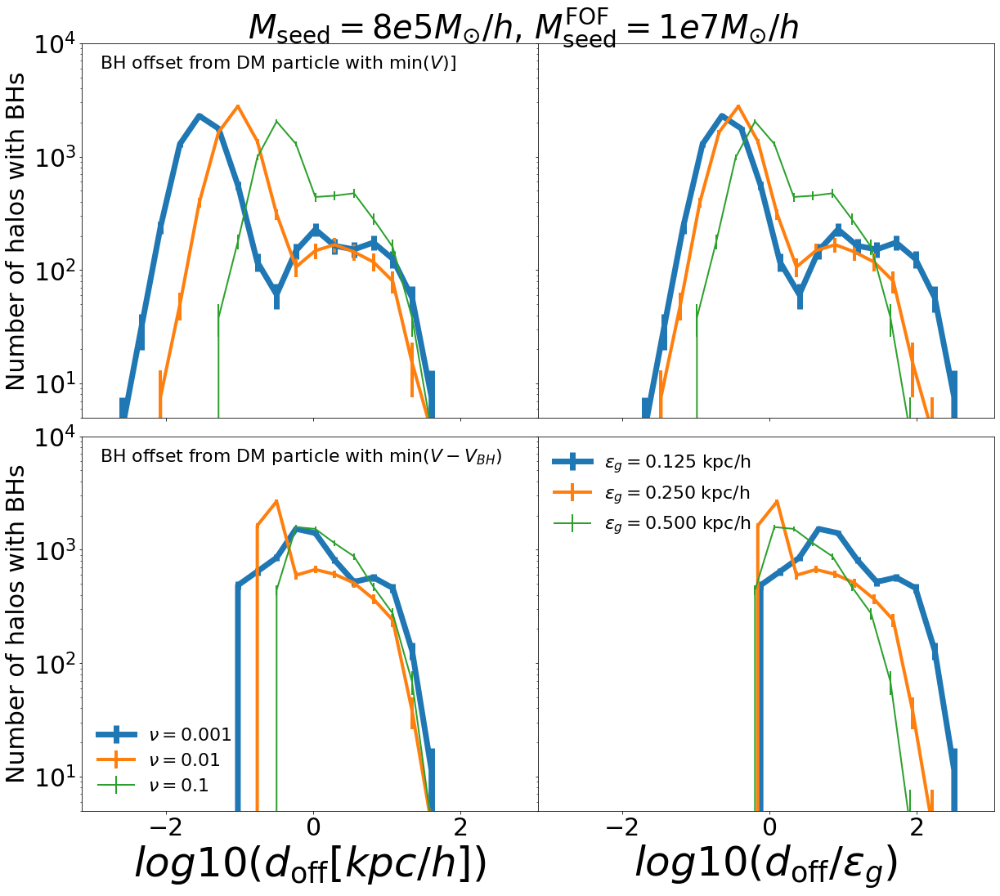

In [72]:

f,ax=plt.subplots(2,2,figsize=(20,16),sharex=True,sharey=True)
Nbin,vmax,vmin=20,-3,2

f.suptitle('$M_{\mathrm{seed}}=8e5 M_{\odot}/h$, $M^{\mathrm{FOF}}_{\mathrm{seed}}=1e7 M_{\odot}/h$',fontsize=40)

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n1024/AREPO/' 
output='/output_FOF_7_5.90_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
desired_redshift=11

make_plot(labl=r'$\nu=0.001$',col='C0',softening=0.125,width=7)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' 
output='/output_FOF_7_5.90_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
desired_redshift=11

make_plot(labl=r'$\nu=0.01$',col='C1',softening=0.25,width=4)

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' 
output='/output_FOF_7_5.90_discreteDF_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
desired_redshift=11

#make_plot(labl=r'$\nu=0.1$',col='C1',softening=0.25,style='dashed')



path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n256/AREPO/' 
output='/output_FOF_7_5.90_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
desired_redshift=11

make_plot(labl=r'$\nu=0.1$',col='C2',softening=0.5,width=2)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' 
output='/output_FOF_7_5.90_discreteDF_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
desired_redshift=11

#make_plot(labl='',col='C1',softening=0.25,style='dashed')


#f.suptitle('$M_{\mathrm{seed}}=8e5 M_{\odot}/h$',fontsize=40)

#ax.set_xlim(-10,1.2)
ax[0,0].set_yscale('log')
ax[0,1].set_yscale('log')
ax[1,0].set_yscale('log')
ax[1,1].set_yscale('log')

ax[0,0].set_ylim(5,10000)
    #ax.set_xscale('log')

ax[0,0].set_ylabel('Number of halos with BHs',fontsize=30)
ax[1,0].set_ylabel('Number of halos with BHs',fontsize=30)


ax[1,0].set_xlabel('$log10(d_{\mathrm{off}}[kpc/h])$',fontsize=50)
ax[1,1].set_xlabel('$log10(d_{\mathrm{off}}/\epsilon_{g})$',fontsize=50)

ax[1,0].set_xlabel('$log10(d_{\mathrm{off}}[kpc/h])$',fontsize=50)
ax[1,1].set_xlabel('$log10(d_{\mathrm{off}}/\epsilon_{g})$',fontsize=50)

ax[0,0].tick_params(labelsize=30)
ax[0,1].tick_params(labelsize=30)
ax[1,0].tick_params(labelsize=30)
ax[1,1].tick_params(labelsize=30)

ax[0,0].text(-2.9,6000,'BH offset from DM particle with $\mathrm{min}(V)]$',fontsize=22)
ax[1,0].text(-2.9,6000,'BH offset from DM particle with $\mathrm{min}(V-V_{BH})$',fontsize=22)

ax[1,0].legend(loc='lower left',fontsize=22,frameon=False)
ax[1,1].legend(loc='upper left',fontsize=22,frameon=False)
plt.subplots_adjust(wspace=0,hspace=0.2)

plt.subplots_adjust(wspace=0,hspace=0.05,top=0.94)


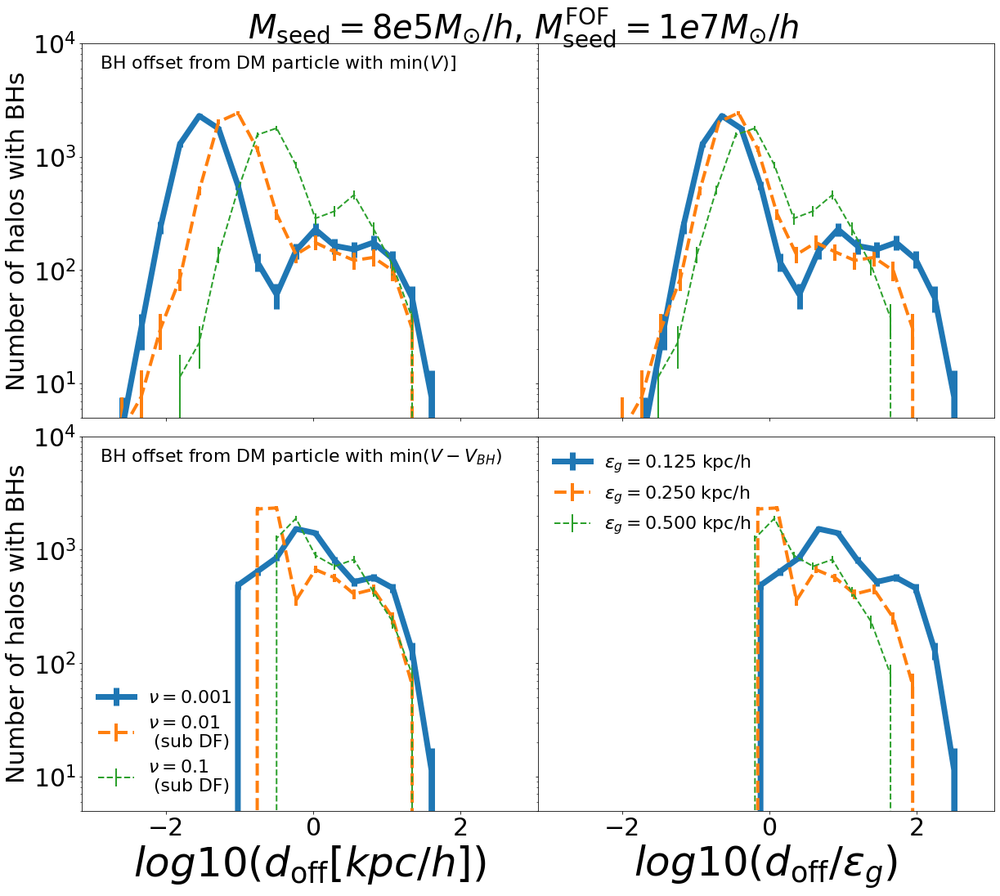

In [73]:


f,ax=plt.subplots(2,2,figsize=(20,16),sharex=True,sharey=True)
Nbin,vmax,vmin=20,-3,2


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n1024/AREPO/' 
output='/output_FOF_7_5.90_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
desired_redshift=11

make_plot(labl=r'$\nu=0.001$',col='C0',softening=0.125,width=7)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' 
output='/output_FOF_7_5.90_discreteDF_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
desired_redshift=11

make_plot(labl=r'$\nu=0.01$' + '\n (sub DF)',col='C1',softening=0.25,style='dashed',width=4)




path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n256/AREPO/' 
output='/output_FOF_7_5.90_discreteDF_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
desired_redshift=11

make_plot(labl=r'$\nu=0.1$' + '\n (sub DF)',col='C2',softening=0.5,style='dashed',width=2)


f.suptitle('$M_{\mathrm{seed}}=8e5 M_{\odot}/h$, $M^{\mathrm{FOF}}_{\mathrm{seed}}=1e7 M_{\odot}/h$',fontsize=40)



#ax[0,0].set_title('$M_{\mathrm{seed}}=1e5 M_{\odot}/h$ Potential includes contribution from BHs',fontsize=30)


#ax[1,0].set_title('$M_{\mathrm{seed}}=1e5 M_{\odot}/h$ Potential excludes contribution from BHs',fontsize=30)



#ax.set_xlim(-10,1.2)
ax[0,0].set_yscale('log')
ax[0,1].set_yscale('log')
ax[1,0].set_yscale('log')
ax[1,1].set_yscale('log')


    #ax.set_xscale('log')

ax[0,0].set_ylabel('Number of halos with BHs',fontsize=30)
ax[1,0].set_ylabel('Number of halos with BHs',fontsize=30)


ax[1,0].set_xlabel('$log10(d_{\mathrm{off}}[kpc/h])$',fontsize=50)
ax[1,1].set_xlabel('$log10(d_{\mathrm{off}}/\epsilon_{g})$',fontsize=50)




ax[1,0].set_xlabel('$log10(d_{\mathrm{off}}[kpc/h])$',fontsize=50)
ax[1,1].set_xlabel('$log10(d_{\mathrm{off}}/\epsilon_{g})$',fontsize=50)

ax[0,0].text(-2.9,6000,'BH offset from DM particle with $\mathrm{min}(V)]$',fontsize=22)
ax[1,0].text(-2.9,6000,'BH offset from DM particle with $\mathrm{min}(V-V_{BH})$',fontsize=22)

ax[0,0].set_ylim(5,10000)
ax[0,0].tick_params(labelsize=30)
ax[0,1].tick_params(labelsize=30)
ax[1,0].tick_params(labelsize=30)
ax[1,1].tick_params(labelsize=30)

ax[1,0].legend(loc='lower left',fontsize=22,frameon=False)
ax[1,1].legend(loc='upper left',fontsize=22,frameon=False)
plt.subplots_adjust(wspace=0,hspace=0.05)

plt.subplots_adjust(wspace=0,hspace=0.05,top=0.94)



In [55]:

def make_plot(labl='',col='blue',softening=1,style='solid',width=4):
    #hubble=0.6771
    GroupMass1_space=numpy.array([])
    distances1_Min_Pot_space=numpy.array([])
    distances1_Min_Pot_without_BH_space=numpy.array([])
    Nblocks=40

    folder=basePath+'/new_BH_distances_from_center_mpi_%d/'%desired_redshift
    files = os.listdir(folder)

    # Iterate over each file and load it using numpy.load
    for file_name in files:
        #file_name = 'new_BH_distances_from_center_mpi_%d/block_%d.npy'%(desired_redshift,block)
        distances1, distances1_Min_Pot, distances1_Min_Pot_without_BH, GroupBHMass1,GroupMass1 = numpy.load(folder+file_name,allow_pickle=True)
        distances1_Min_Pot_space=numpy.append(distances1_Min_Pot_space,distances1_Min_Pot)
        distances1_Min_Pot_without_BH_space=numpy.append(distances1_Min_Pot_without_BH_space,distances1_Min_Pot_without_BH)
        #print(GroupMass1)
        GroupMass1_space=numpy.append(GroupMass1_space,GroupMass1)

        
    mask=GroupMass1_space>5e7/1e10
    centers,HMF,dHMF,norm,counts_sum = arepo_package.get_probability_density(numpy.log10(distances1_Min_Pot_without_BH_space[mask]),Nbin,vmax,vmin,linear=1)

    ax[1,0].errorbar(centers,HMF*counts_sum,dHMF*counts_sum,label=labl,color=col,linewidth=width,linestyle=style)
    ax[1,1].errorbar(centers-numpy.log10(softening),HMF*counts_sum,dHMF*counts_sum,label='$\epsilon_g=%.3f$ kpc/h'%(softening),color=col,linewidth=width,linestyle=style)

    centers,HMF,dHMF,norm,counts_sum = arepo_package.get_probability_density(numpy.log10(distances1_Min_Pot_space[mask]),Nbin,vmax,vmin,linear=1)

    ax[0,0].errorbar(centers,HMF*counts_sum,dHMF*counts_sum,label=labl,color=col,linewidth=width,linestyle=style)
    ax[0,1].errorbar(centers-numpy.log10(softening),HMF*counts_sum,dHMF*counts_sum,label='$\epsilon_g=%.3f$ kpc/h'%(softening),color=col,linewidth=width,linestyle=style)



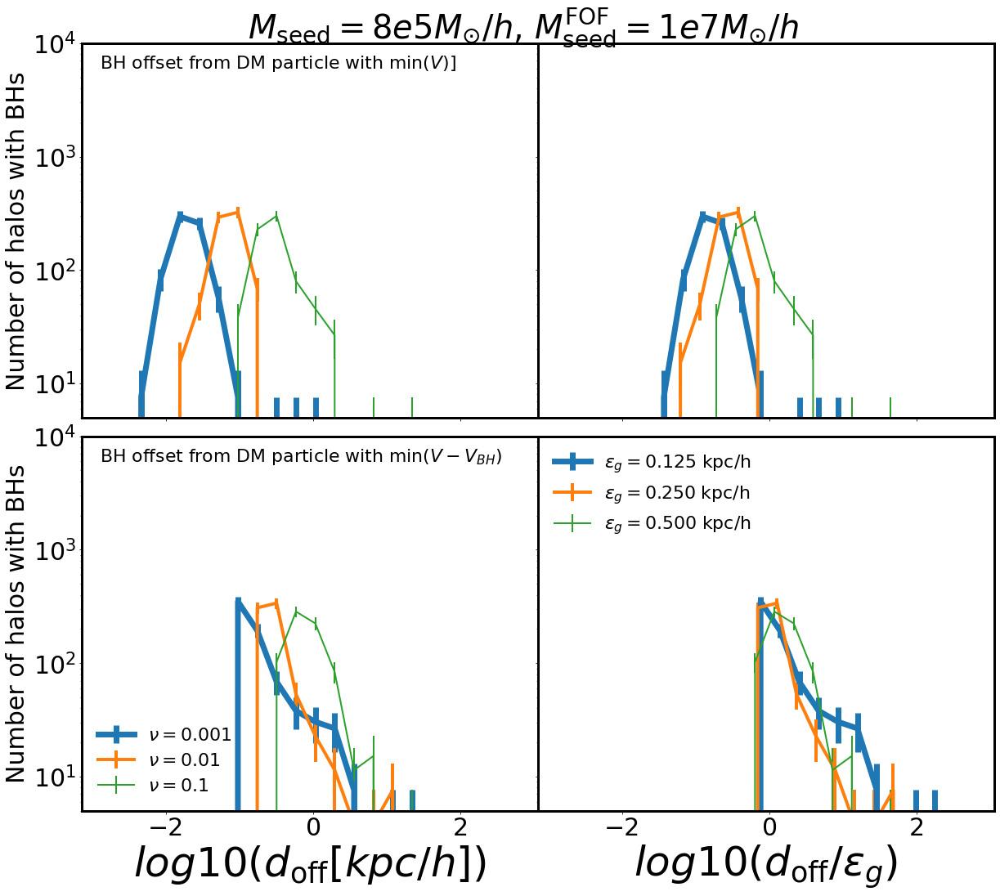

In [60]:

f,ax=plt.subplots(2,2,figsize=(20,16),sharex=True,sharey=True)
Nbin,vmax,vmin=20,-3,2

f.suptitle('$M_{\mathrm{seed}}=8e5 M_{\odot}/h$, $M^{\mathrm{FOF}}_{\mathrm{seed}}=1e7 M_{\odot}/h$',fontsize=40)

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n1024/AREPO/' 
output='/output_FOF_7_5.90_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
desired_redshift=11

make_plot(labl=r'$\nu=0.001$',col='C0',softening=0.125,width=7)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' 
output='/output_FOF_7_5.90_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
desired_redshift=11

make_plot(labl=r'$\nu=0.01$',col='C1',softening=0.25,width=4)

path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' 
output='/output_FOF_7_5.90_discreteDF_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
desired_redshift=11

#make_plot(labl=r'$\nu=0.1$',col='C1',softening=0.25,style='dashed')



path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n256/AREPO/' 
output='/output_FOF_7_5.90_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
desired_redshift=11

make_plot(labl=r'$\nu=0.1$',col='C2',softening=0.5,width=2)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' 
output='/output_FOF_7_5.90_discreteDF_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
desired_redshift=11

#make_plot(labl='',col='C1',softening=0.25,style='dashed')


#f.suptitle('$M_{\mathrm{seed}}=8e5 M_{\odot}/h$',fontsize=40)

#ax.set_xlim(-10,1.2)
ax[0,0].set_yscale('log')
ax[0,1].set_yscale('log')
ax[1,0].set_yscale('log')
ax[1,1].set_yscale('log')

ax[0,0].set_ylim(5,10000)
    #ax.set_xscale('log')

ax[0,0].set_ylabel('Number of halos with BHs',fontsize=30)
ax[1,0].set_ylabel('Number of halos with BHs',fontsize=30)


ax[1,0].set_xlabel('$log10(d_{\mathrm{off}}[kpc/h])$',fontsize=50)
ax[1,1].set_xlabel('$log10(d_{\mathrm{off}}/\epsilon_{g})$',fontsize=50)

ax[1,0].set_xlabel('$log10(d_{\mathrm{off}}[kpc/h])$',fontsize=50)
ax[1,1].set_xlabel('$log10(d_{\mathrm{off}}/\epsilon_{g})$',fontsize=50)

ax[0,0].tick_params(labelsize=30)
ax[0,1].tick_params(labelsize=30)
ax[1,0].tick_params(labelsize=30)
ax[1,1].tick_params(labelsize=30)

ax[0,0].text(-2.9,6000,'BH offset from DM particle with $\mathrm{min}(V)]$',fontsize=22)
ax[1,0].text(-2.9,6000,'BH offset from DM particle with $\mathrm{min}(V-V_{BH})$',fontsize=22)

ax[1,0].legend(loc='lower left',fontsize=22,frameon=False)
ax[1,1].legend(loc='upper left',fontsize=22,frameon=False)
plt.subplots_adjust(wspace=0,hspace=0.2)

plt.subplots_adjust(wspace=0,hspace=0.05,top=0.94)


for a in ax.flatten():
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 
plt.savefig('./Paper8_figures/FOF_seed_spatial_distributions_noDF_seed5.90.png',bbox_inches='tight')


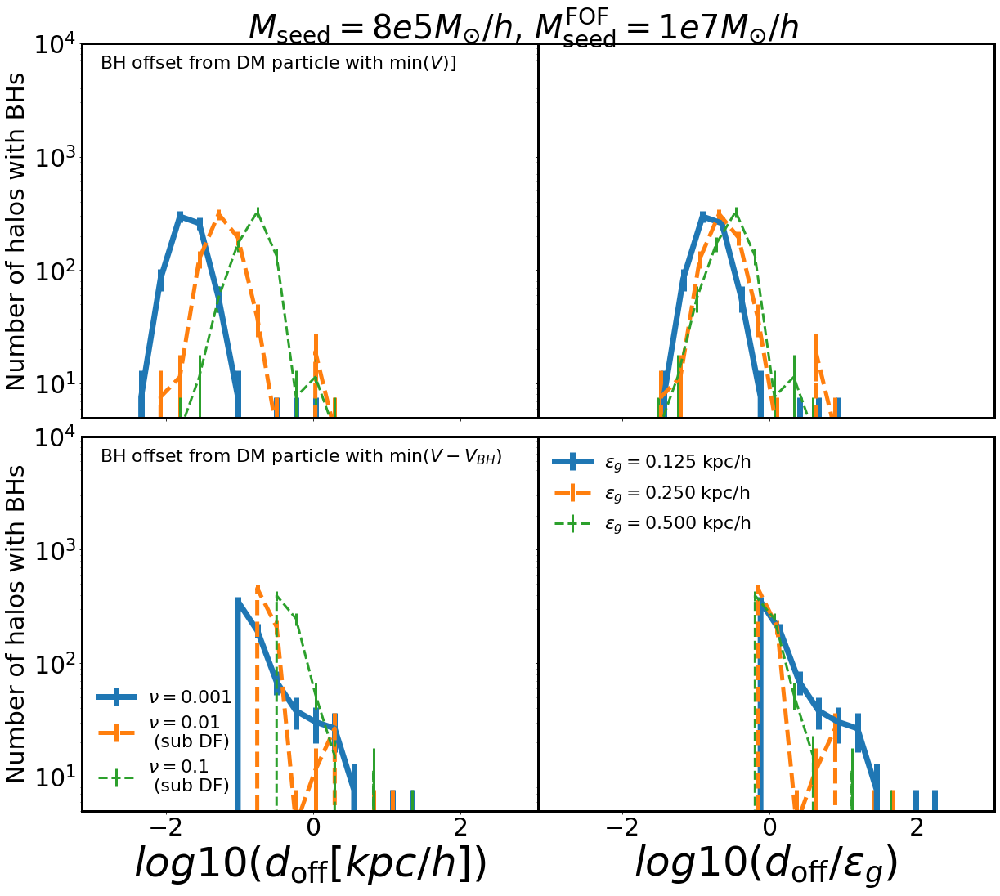

In [59]:


f,ax=plt.subplots(2,2,figsize=(20,16),sharex=True,sharey=True)
Nbin,vmax,vmin=20,-3,2


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n1024/AREPO/' 
output='/output_FOF_7_5.90_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
desired_redshift=11

make_plot(labl=r'$\nu=0.001$',col='C0',softening=0.125,width=7)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' 
output='/output_FOF_7_5.90_discreteDF_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
desired_redshift=11

make_plot(labl=r'$\nu=0.01$' + '\n (sub DF)',col='C1',softening=0.25,style='dashed',width=5)




path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n256/AREPO/' 
output='/output_FOF_7_5.90_discreteDF_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
desired_redshift=11

make_plot(labl=r'$\nu=0.1$' + '\n (sub DF)',col='C2',softening=0.5,style='dashed',width=3)


f.suptitle('$M_{\mathrm{seed}}=8e5 M_{\odot}/h$, $M^{\mathrm{FOF}}_{\mathrm{seed}}=1e7 M_{\odot}/h$',fontsize=40)



#ax[0,0].set_title('$M_{\mathrm{seed}}=1e5 M_{\odot}/h$ Potential includes contribution from BHs',fontsize=30)


#ax[1,0].set_title('$M_{\mathrm{seed}}=1e5 M_{\odot}/h$ Potential excludes contribution from BHs',fontsize=30)



#ax.set_xlim(-10,1.2)
ax[0,0].set_yscale('log')
ax[0,1].set_yscale('log')
ax[1,0].set_yscale('log')
ax[1,1].set_yscale('log')


    #ax.set_xscale('log')

ax[0,0].set_ylabel('Number of halos with BHs',fontsize=30)
ax[1,0].set_ylabel('Number of halos with BHs',fontsize=30)


ax[1,0].set_xlabel('$log10(d_{\mathrm{off}}[kpc/h])$',fontsize=50)
ax[1,1].set_xlabel('$log10(d_{\mathrm{off}}/\epsilon_{g})$',fontsize=50)




ax[1,0].set_xlabel('$log10(d_{\mathrm{off}}[kpc/h])$',fontsize=50)
ax[1,1].set_xlabel('$log10(d_{\mathrm{off}}/\epsilon_{g})$',fontsize=50)

ax[0,0].text(-2.9,6000,'BH offset from DM particle with $\mathrm{min}(V)]$',fontsize=22)
ax[1,0].text(-2.9,6000,'BH offset from DM particle with $\mathrm{min}(V-V_{BH})$',fontsize=22)

ax[0,0].set_ylim(5,10000)
ax[0,0].tick_params(labelsize=30)
ax[0,1].tick_params(labelsize=30)
ax[1,0].tick_params(labelsize=30)
ax[1,1].tick_params(labelsize=30)

ax[1,0].legend(loc='lower left',fontsize=22,frameon=False)
ax[1,1].legend(loc='upper left',fontsize=22,frameon=False)
plt.subplots_adjust(wspace=0,hspace=0.05)

plt.subplots_adjust(wspace=0,hspace=0.05,top=0.94)



for a in ax.flatten():
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 
plt.savefig('./Paper8_figures/FOF_seed_spatial_distributions_DF_seed5.90.png',bbox_inches='tight')


Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
[3.93486597e-07 1.24431387e-05 3.93486597e-04 1.24431387e-02
 3.93486597e-01 1.24431387e+01 3.93486597e+02 1.24431387e+04]
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
[1.08406175e-07 3.42810424e-06 1.08406175e-04 3.42810424e-03
 1.08406175e-01 3.42810424e+00 1.08406175e+02 3.42810424e+03]
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14
[3.03358931e-08 9.59305170e-07 3.03358931e-05 9.5

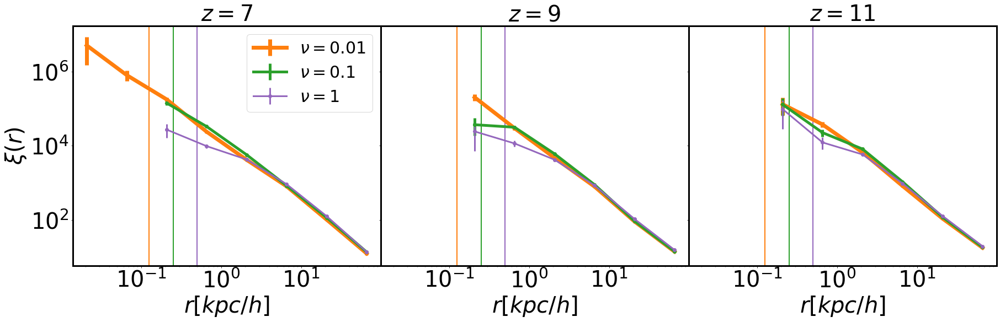

In [29]:

label_fontsize=40

def make_plot(style='solid',labl='',width=7,softening=1):
    
    i=0
    for redshift in [7,9,11]:
        ax=axx[i]

        ax.set_title('$z=%d$'%redshift,fontsize=40)

        Coordinates,o=arepo_package.get_particle_property(basePath,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>=mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist,arepo_package.get_box_size(basePath), WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        ax.errorbar(r[mmask]*1000/softening,xi[mmask],dxi[mmask],color=col,linewidth=width,linestyle=style,marker='o',label=labl)


        #ax.set_ylim(1e2,1e6)

        ax.tick_params(labelsize=label_fontsize)
        ax.set_yscale('log')
        ax.set_xscale('log')
        ax.set_xlabel('$r[kpc/h]$',fontsize=label_fontsize)
    
        i+=1

        
        
        
f,axx=plt.subplots(1,3,figsize=(30,8),sharex=True,sharey=True)


h=0.6771


mass_cut=0/1e10
lum_cut=0

dist_bins, max_dist,min_dist = 8, 1e-5, 0.1


col='C1'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n1024/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.00_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
make_plot(labl=r'$\nu=0.01$',width=7)



col='C2'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.00_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
make_plot(labl=r'$\nu=0.1$',width=5)


col='C4'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n256/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.00_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
make_plot(labl=r'$\nu=1$',style='solid',width=3)


axx[0].legend(loc='upper right',fontsize=30)






#axx.set_title(r'$M_{bh}>1.25\times10^{4}M_{\odot}/h$',fontsize=label_fontsize)




axx[0].set_ylabel(r'$\xi(r)$',fontsize=label_fontsize)

for i in range(0,3):
    axx[i].axvline(0.125,color='C1',linewidth=2)
    axx[i].axvline(0.25,color='C2',linewidth=2)
    axx[i].axvline(0.5,color='C4',linewidth=2)

plt.subplots_adjust(wspace=0,hspace=0)


for a in axx.flatten():
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 
plt.savefig('./Paper8_figures/BH_clustering_seed5.00_noDF.png',bbox_inches='tight')


#plt.savefig('./Paper5_figures/subhalo_based_models4_Msfmp5_Mh3000_seed5.00.png',bbox_inches='tight')

#plt.savefig('./Paper6_figures/small_scale_clustering.png',bbox_inches='tight')
        

Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
[3.93486597e-07 1.24431387e-05 3.93486597e-04 1.24431387e-02
 3.93486597e-01 1.24431387e+01 3.93486597e+02 1.24431387e+04]
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
[1.08406175e-07 3.42810424e-06 1.08406175e-04 3.42810424e-03
 1.08406175e-01 3.42810424e+00 1.08406175e+02 3.42810424e+03]
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14
[3.03358931e-08 9.59305170e-07 3.03358931e-05 9.5

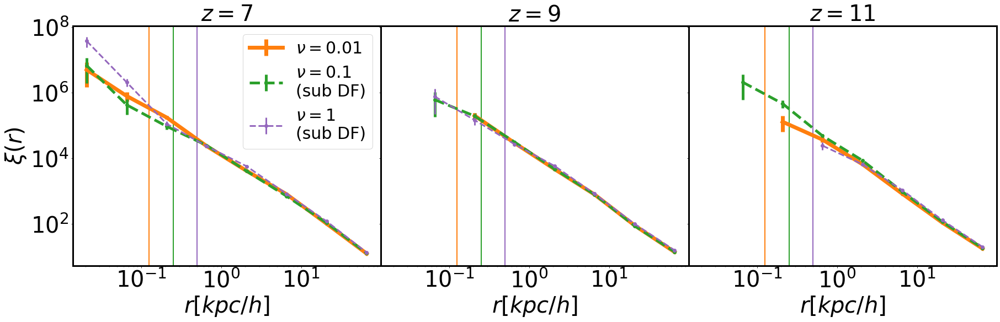

In [30]:

label_fontsize=40


        
f,axx=plt.subplots(1,3,figsize=(30,8),sharex=True,sharey=True)


h=0.6771


mass_cut=0/1e10
lum_cut=0

dist_bins, max_dist,min_dist = 8, 1e-5, 0.1


col='C1'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n1024/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.00_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
make_plot(labl=r'$\nu=0.01$',width=7)



col='C2'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.00_discreteDF_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
make_plot(labl=r'$\nu=0.1$' + '\n(sub DF)',style='dashed',width=5)


col='C4'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n256/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.00_discreteDF_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
make_plot(labl=r'$\nu=1$' + '\n(sub DF)',style='dashed',width=3)






#axx.set_title(r'$M_{bh}>1.25\times10^{4}M_{\odot}/h$',fontsize=label_fontsize)




axx[0].set_ylabel(r'$\xi(r)$',fontsize=label_fontsize)

for i in range(0,3):
    axx[i].axvline(0.125,color='C1',linewidth=2)
    axx[i].axvline(0.25,color='C2',linewidth=2)
    axx[i].axvline(0.5,color='C4',linewidth=2)

plt.subplots_adjust(wspace=0,hspace=0)


axx[0].legend(loc='upper right',fontsize=30)
for a in axx.flatten():
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 
plt.savefig('./Paper8_figures/BH_clustering_seed5.00_DF.png',bbox_inches='tight')


#plt.savefig('./Paper5_figures/subhalo_based_models4_Msfmp5_Mh3000_seed5.00.png',bbox_inches='tight')

#plt.savefig('./Paper6_figures/small_scale_clustering.png',bbox_inches='tight')
        

Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
[3.69385068e-07 1.16809815e-05 3.69385068e-04 1.16809815e-02
 3.69385068e-01 1.16809815e+01 3.69385068e+02 1.16809815e+04]
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
[1.01724376e-07 3.21680723e-06 1.01724376e-04 3.21680723e-03
 1.01724376e-01 3.21680723e+00 1.01724376e+02 3.21680723e+03]
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14
[2.81412777e-08 8.89905336e-07 2.81412777e-05 8.8

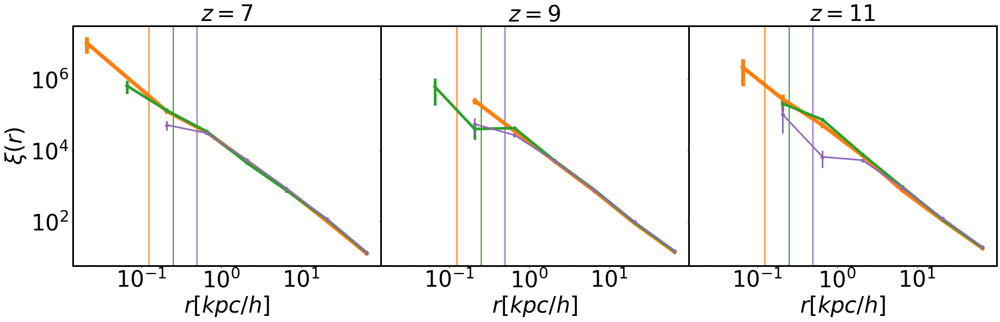

In [31]:

label_fontsize=40


        
f,axx=plt.subplots(1,3,figsize=(30,8),sharex=True,sharey=True)


h=0.6771


mass_cut=0/1e10
lum_cut=0

dist_bins, max_dist,min_dist = 8, 1e-5, 0.1


col='C1'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n1024/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.90_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
make_plot(labl=r'$\nu=0.01$',width=7)



col='C2'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.90_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
make_plot(labl=r'$\nu=0.1$',width=5)


col='C4'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n256/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.90_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
make_plot(labl=r'$\nu=1$',width=3)






#axx.set_title(r'$M_{bh}>1.25\times10^{4}M_{\odot}/h$',fontsize=label_fontsize)




axx[0].set_ylabel(r'$\xi(r)$',fontsize=label_fontsize)

for i in range(0,3):
    axx[i].axvline(0.125,color='C1',linewidth=2)
    axx[i].axvline(0.25,color='C2',linewidth=2)
    axx[i].axvline(0.5,color='C4',linewidth=2)

plt.subplots_adjust(wspace=0,hspace=0)


for a in axx.flatten():
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 
plt.savefig('./Paper8_figures/BH_clustering_seed5.90_noDF.png',bbox_inches='tight')


#plt.savefig('./Paper5_figures/subhalo_based_models4_Msfmp5_Mh3000_seed5.00.png',bbox_inches='tight')

#plt.savefig('./Paper6_figures/small_scale_clustering.png',bbox_inches='tight')
        

Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
[3.69385068e-07 1.16809815e-05 3.69385068e-04 1.16809815e-02
 3.69385068e-01 1.16809815e+01 3.69385068e+02 1.16809815e+04]
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
Desired redshift:  9
Output redshift:  9.00233985416247
Output snapshot:  16
[1.01724376e-07 3.21680723e-06 1.01724376e-04 3.21680723e-03
 1.01724376e-01 3.21680723e+00 1.01724376e+02 3.21680723e+03]
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14
Desired redshift:  11
Output redshift:  10.975643294137885
Output snapshot:  14
[2.81412777e-08 8.89905336e-07 2.81412777e-05 8.8

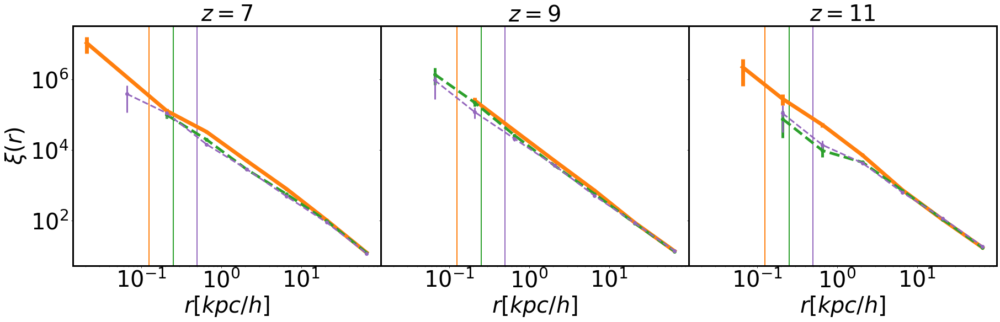

In [32]:

label_fontsize=40


        
f,axx=plt.subplots(1,3,figsize=(30,8),sharex=True,sharey=True)


h=0.6771


mass_cut=0/1e10
lum_cut=0

dist_bins, max_dist,min_dist = 8, 1e-5, 0.1


col='C1'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n1024/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.90_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
make_plot(labl=r'$\nu=0.001$',width=7)



col='C2'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.90_discreteDF_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
make_plot(labl=r'$\nu=0.01$',width=5,style='dashed')


col='C4'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n256/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.90_discreteDF_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
make_plot(labl=r'$\nu=0.1$',width=3,style='dashed')






#axx.set_title(r'$M_{bh}>1.25\times10^{4}M_{\odot}/h$',fontsize=label_fontsize)




axx[0].set_ylabel(r'$\xi(r)$',fontsize=label_fontsize)

for i in range(0,3):
    axx[i].axvline(0.125,color='C1',linewidth=2)
    axx[i].axvline(0.25,color='C2',linewidth=2)
    axx[i].axvline(0.5,color='C4',linewidth=2)

plt.subplots_adjust(wspace=0,hspace=0)


for a in axx.flatten():
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 
plt.savefig('./Paper8_figures/BH_clustering_seed5.90_DF.png',bbox_inches='tight')


#plt.savefig('./Paper5_figures/subhalo_based_models4_Msfmp5_Mh3000_seed5.00.png',bbox_inches='tight')

#plt.savefig('./Paper6_figures/small_scale_clustering.png',bbox_inches='tight')
        

In [55]:
import sys
sys.path.append('/home/aklantbhowmick/anaconda3/lib/python3.7/site-packages')
sys.path.append('/home/aklantbhowmick/anaconda3/lib/python3.7/site-packages/scalpy/')
sys.path.append('/home/aklantbhowmick/anaconda3/envs/nbodykit-env/lib/python3.6/site-packages/')
import mdot_to_Lbol
import arepo_package
import scipy.interpolate
import illustris_python

import scipy.integrate

radiative_efficiency=0.2
total_conv=mdot_to_Lbol.get_conversion_factor_arepo(radiative_efficiency)
import h5py

import warnings
warnings.filterwarnings('ignore')

%pylab inline

colors_res=['#83c995','orange','blue','black']


def show_seeding_histories2(basePath,col,labl='.',width=4,style='solid',nbins=40,cumulative=0,plot=1):
    #nbins=40
    scale_fac_complete2,BH_id_complete2,density_complete2,metallicity_complete2,SFR_complete2,FOFDMmass_complete2,indexmaxdens_complete2,file_id_complete2,FOFStarFormingGasMass_complete2,FOFStarFormingGasMetallicity_complete2,N_empty=arepo_package.get_seeding_events2(basePath)
    redshifts_fac=1./scale_fac_complete2-1
    return redshifts_fac


def show_seed_FOFmass(basePath,col,labl='.',width=4,style='solid',nbins=40,cumulative=0):
    #nbins=40
    scale_fac_complete2,BH_id_complete2,density_complete2,metallicity_complete2,SFR_complete2,FOFDMmass_complete2,indexmaxdens_complete2,file_id_complete2,FOFStarFormingGasMass_complete2,FOFStarFormingGasMetallicity_complete2,N_empty=arepo_package.get_seeding_events2(basePath)
    redshifts_fac=1./scale_fac_complete2-1

    seed_redshifts=1./scale_fac_complete2-1.
    mask=(seed_redshifts>redshift_cut)
    return FOFDMmass_complete2[mask]*1e10
 
    

def show_seed_SFGmass(basePath,col,labl='.',width=4,style='solid',nbins=40,cumulative=0):
    #nbins=40
    scale_fac_complete2,BH_id_complete2,density_complete2,metallicity_complete2,SFR_complete2,FOFDMmass_complete2,indexmaxdens_complete2,file_id_complete2,FOFStarFormingGasMass_complete2,FOFStarFormingGasMetallicity_complete2,N_empty=arepo_package.get_seeding_events2(basePath)
    redshifts_fac=1./scale_fac_complete2-1

    seed_redshifts=1./scale_fac_complete2-1.
    mask=(seed_redshifts>redshift_cut)
    return FOFStarFormingGasMass_complete2[mask]*1e10


def get_distribution(HM,Nbins,log_HM_min,log_HM_max,linear=0,cumulative=0,density=0):
    #print(HM)
    
    def extract(HM_min,HM_max):
        if (cumulative==1):
            mask=(HM>HM_min)
        else:
            mask=(HM>HM_min)&(HM<HM_max)
        return (HM_min+HM_max)/2,len(HM[mask])
    if (linear):
        HM_bin=numpy.linspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    else:
        HM_bin=numpy.logspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    out=[extract(HM_bin[i],HM_bin[i+1]) for i in range(0,len(HM_bin)-1)]
    #return out
    centers=numpy.array(list(zip(*out))[0])
    counts=numpy.array(list(zip(*out))[1])
    HMF=counts
    dHMF=numpy.sqrt(counts)
    norm=1.#sum(HMF)
    if (density==1):
        norm=numpy.diff(centers)
    return centers,HMF/norm,dHMF/norm

def show_seeding_halomass2(basePath,labl='.',width=4,style='solid',nbins=40,offset=0):
    #nbins=40
    scale_fac_complete2,BH_id_complete2,density_complete2,metallicity_complete2,SFR_complete2,FOFDMmass_complete2,indexmaxdens_complete2,file_id_complete2,FOFStarFormingGasMass_complete2,FOFStarFormingGasMetallicity_complete2,N_empty=arepo_package.get_seeding_events2(basePath)
    #scale_fac_complete,BH_id_complete,density_complete,metallicity_complete,SFR_complete,FOFDMmass_complete,indexmaxdens_complete,FOFTask_complete, file_id_complete,N_empty=arepo_package.get_seeding_events(basePath)
    #scale_fac_complete,BH_id_complete,density_complete,metallicity_complete,SFR_complete,FOFDMmas
    redshifts_fac=1./scale_fac_complete2-1
    print("No of seeds formed:", len(redshifts_fac[redshifts_fac>0]))
    #obj=ax
    seed_redshifts=1./scale_fac_complete2-1.
    mask=(seed_redshifts>redshift_cut)
    print(FOFDMmass_complete2[mask]) 
    return FOFDMmass_complete2




def get_distribution(HM,Nbins,log_HM_min,log_HM_max,linear=0):
    #print(HM)
    
    def extract(HM_min,HM_max):
        mask=(HM>HM_min)&(HM<HM_max)
        return (HM_min+HM_max)/2,len(HM[mask])
    if (linear):
        HM_bin=numpy.linspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    else:
        HM_bin=numpy.logspace(log_HM_min,log_HM_max,Nbins,endpoint=True)
    out=[extract(HM_bin[i],HM_bin[i+1]) for i in range(0,len(HM_bin)-1)]
    #return out
    centers=numpy.array(list(zip(*out))[0])
    counts=numpy.array(list(zip(*out))[1])
    HMF=counts
    dHMF=numpy.sqrt(counts)
    norm=1.#sum(HMF)
    return centers,HMF/norm,dHMF/norm


def get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=0,HDF5=0,path_to_hdf5='./'):
    if(HDF5):
        fobj=h5py.File(path_to_hdf5)
        scale_fac_complete_sorted=fobj.get('time')[:]
        primary_mass_sorted=fobj.get('mass_out')[:]
        secondary_mass_sorted=fobj.get('mass_in')[:]
    else:
        scale_fac_complete_sorted,primary_mass_sorted,secondary_mass_sorted,primary_id_sorted,secondary_id_sorted,file_id_complete_sorted,N_empty=arepo_package.get_merger_events_from_snapshot(basePath,upto_redshift,HOSTS=0)
    mass_ratio=secondary_mass_sorted/primary_mass_sorted
    #print(mass_ratio[mass_ratio>1.])
        #print(primary_mass_sorted,secondary_mass_sorted)
    merger_redshifts=1./scale_fac_complete_sorted-1.
    
    #print(merger_redshifts)
    
    #print("###",primary_mass_sorted)
    mask_primary=primary_mass_sorted>=mass_cut/1e10
    mask_secondary=secondary_mass_sorted>=mass_cut/1e10
    mask_total_mass=(primary_mass_sorted+secondary_mass_sorted)>=total_mass_cut/1e10
    mask_redshift=merger_redshifts>=redshift_cut
    mask_ratio_cut=mass_ratio>=mass_ratio_cut
    mask=((mask_primary&mask_secondary)&(mask_redshift&mask_ratio_cut))&mask_total_mass
    merger_redshifts=merger_redshifts[mask]
  
    #print("!!!",merger_redshifts)
    bins, dist, dist_err,norm,counts_sum=arepo_package.get_probability_density(merger_redshifts,nbins,min_value,max_value,linear=linear)
 
    dist*=counts_sum

    dist_err*=counts_sum
    dt=numpy.array([T(zz-norm/2,zz+norm/2) for zz in bins])
    

    dz=numpy.diff(bins)[0]
    #print("!!!",dist)    
    dz_dt=numpy.array([dz/T(zz-dz/2,zz+dz/2) for zz in bins])
    
    return bins,dist,dist_err,norm,dz_dt


def get_merger_distributions_hosts(basePath,nbins,min_value,max_value,mass_cut,linear=0,HDF5=0,path_to_hdf5='./'):
    if(HDF5):
        fobj=h5py.File(path_to_hdf5)
        scale_fac_complete_sorted=fobj.get('time')[:]
        primary_mass_sorted=fobj.get('mass_out')[:]
        secondary_mass_sorted=fobj.get('mass_in')[:]
    else:
        scale_fac_complete,BH_id_primary,BH_mass_primary,hosthalomass_primary,hosthalostellarmass_primary,hosthalogasmass_primary,hosthalodmmass_primary,BH_id_secondary,BH_mass_secondary,hosthalomass_secondary,hosthalostellarmass_secondary,hosthalogasmass_secondary,hosthalodmmass_secondary,file_id_complete=arepo_package.get_merger_events_hosts(basePath,HDF5=1)        #print(primary_mass_sorted,secondary_mass_sorted)
    mass_ratio=BH_id_secondary/BH_mass_primary
    mask_ratio_cut=mass_ratio>mass_ratio_cut
    merger_redshifts=1./scale_fac_complete-1.
    #print("###",BH_mass_primary)
    mask_primary=BH_mass_primary>mass_cut/1e10
    mask_secondary=BH_mass_secondary>mass_cut/1e10
    mask_total_mass=(BH_mass_primary+BH_mass_secondary)>total_mass_cut/1e10
    mask_redshift=merger_redshifts>redshift_cut
    mask=((mask_primary&mask_secondary)&(mask_redshift&mask_ratio_cut))&mask_total_mass
    
    maskhost1=hosthalomass_primary+hosthalomass_secondary>14.2e10/1e10*h
    maskhost2=hosthalomass_primary>7.1e10/1e10*h
    maskhost3=hosthalodmmass_primary>2e9/1e10*h
    maskhost4=hosthalodmmass_secondary>2e9/1e10*h
    maskhost5=hosthalostellarmass_primary>1e8/1e10*h   
    maskhost6=hosthalostellarmass_secondary>1e8/1e10*h
    
    if(apply_host_cuts==0):
        maskhost=mask
    else:
        maskhost=((((maskhost1&maskhost2)&maskhost3)&maskhost4)&maskhost5)&maskhost6
    
    
    merger_redshifts=merger_redshifts[mask&maskhost]
    
    #print("!!!",merger_redshifts)
    
    bins, dist, dist_err,norm,counts_sum=arepo_package.get_probability_density(merger_redshifts,nbins,min_value,max_value,linear=linear)
    
    dt=numpy.array([T(zz-norm/2,zz+norm/2) for zz in bins])
     
    
    dz=numpy.diff(bins)[0]
    #print("!!!",dist)
    dz_dt=numpy.array([dz/T(zz-dz/2,zz+dz/2) for zz in bins])
    
    return bins,dist,dist_err,norm,dz_dt

def get_merger_rate(basePath, nbins, min_value,max_value,ZOOM=0,HDF5=0,input_simulation_boxsize_in_Mpch=1.,path_to_hdf5='.',GasFractionCut=0.1,hosts=0):
    Mpc_to_kpc=1000
    if (hosts):
        bins,dist,dist_err,norm,dz_dt=get_merger_distributions_hosts(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=HDF5,path_to_hdf5=path_to_hdf5)
    else:
        bins,dist,dist_err,norm,dz_dt=get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=HDF5,path_to_hdf5=path_to_hdf5)
    volume_of_redshift_shell=numpy.array([4*3.14*DC(0,z_bin)**2*dx_dz(z_bin) for z_bin in bins])
    if ZOOM:
        if (HDF5):
            simulation_volume=input_simulation_boxsize_in_Mpch**3
        else:
            output_redshifts,high_res_volumes,total_volumes=numpy.load(basePath+'/zoom_volumes_high_res_fraction_cut_%.2f.npy'%(GasFractionCut),allow_pickle=True)
            #print(output_redshifts,high_res_volumes)
            mask=high_res_volumes>0 
            get_volume=scipy.interpolate.interp1d(output_redshifts[mask],high_res_volumes[mask],fill_value='extrapolate')
            simulation_volume=get_volume(bins)
            print("Simulation volumes are:", simulation_volume)
    else:
        if (HDF5):
            simulation_volume=input_simulation_boxsize_in_Mpch**3
        else:
            simulation_volume=(arepo_package.get_box_size(basePath)/Mpc_to_kpc)**3
            print("Simulation volumes are:", simulation_volume)
        
    
    merger_rate=dist*1.
    merger_rate_err=dist_err*1
    
    merger_rate*=dz_dt
    merger_rate_err*=dz_dt
    
    merger_rate/=simulation_volume
    merger_rate_err/=simulation_volume

    merger_rate*=volume_of_redshift_shell
    merger_rate_err*=volume_of_redshift_shell
    
    merger_rate/=(1+bins)
    merger_rate_err/=(1+bins)

    return bins, dist, dist_err, merger_rate, merger_rate_err 


def make_LF(basePath, desired_redshift,col,mstyle,lstyle,obj,labl='.',make_scatter=1,ZOOM=0,alph=1,lwidth=3,offset=0):

    DM1Pos,output_redshift=arepo_package.get_particle_property(basePath,'Coordinates',1,desired_redshift)
    COM=numpy.average(DM1Pos,axis=0)
    
    GroupBHMdot,output_redshift=arepo_package.get_particle_property(basePath,'BH_Mdot',5,desired_redshift)
    GroupBHMdot=GroupBHMdot*total_conv
    #print(output_redshift)

    GroupBHMass,output_redshift=arepo_package.get_particle_property(basePath,'BH_Mass',5,desired_redshift)
    GroupBHMass=GroupBHMass*1e10

    
    Coordinates,output_redshift=arepo_package.get_particle_property(basePath,'Coordinates',5,desired_redshift)
    dist=numpy.sqrt(numpy.sum((Coordinates-COM)**2,axis=1))
      
    #GroupBHMdot=numpy.array([convert_mdot_to_Lbol(mdot,mass,radiative_efficiency,1) for mdot,mass in zip(GroupBHMdot,GroupBHMass)])

    
    if (ZOOM==1):
        mask_pos=dist<max_dist
        mask=mask_pos
        GroupBHMdot=GroupBHMdot[mask]
        GroupBHMass=GroupBHMass[mask]
        mask2=GroupBHMass>10**logmasscutov

        N_space= numpy.array([len(GroupBHMdot[mask2&(GroupBHMdot>10**loglumcut)]) for loglumcut in loglumcut_space]) 
        #print(N_space)
        obj.errorbar(loglumcut_space[N_space>0]+offset,N_space[N_space>0],numpy.sqrt(N_space[N_space>0]),ms=20,linewidth=lwidth,color=col,alpha=alph,label=labl,linestyle=lstyle);           
    else:   
        mask1=GroupBHMdot>10**loglumcut
        mask2=GroupBHMass>10**logmasscutov

        N_space= numpy.array([len(GroupBHMdot[mask2&(GroupBHMdot>10**loglumcut)]) for loglumcut in loglumcut_space]) 
        obj.errorbar(loglumcut_space[N_space>0]+offset,N_space[N_space>0],numpy.sqrt(N_space[N_space>0]),ms=20,linewidth=lwidth,color=col,alpha=alph,label=labl,linestyle=lstyle);
  
    #mask=GroupBHMass>0
    #obj.errorbar(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),ms=10,linewidth=0,color=col,marker=mstyle,alpha=1);
 
      

    #mask=(GroupLen>100)&(GroupBHMass>0)
    #obj.errorbar(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),ms=10,linewidth=0,color=col,marker=mstyle,label=labl);

    #print("Output_redshift is:",output_redshift)
    
    #median_log_halo_mass,median_log_bh_mass,IQR=arepo_package.get_median_with_IQR(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),False,False,10,25)
    #obj.errorbar(median_log_halo_mass,median_log_bh_mass,yerr=IQR,ms=10,linewidth=3,color=col,linestyle=lstyle,label=labl);
    #obj.set_xlim(3.5,12)
    obj.set_ylim(1e-1,1e3)
    #obj.plot(obj.get_xlim(),obj.get_xlim())
    
    #obj.plot(obj.get_xlim(),obj.get_xlim())
    obj.set_yscale('log')
    obj.tick_params(labelsize=40)

def make_MF(basePath, desired_redshift,col,mstyle,lstyle,obj,labl='.',make_scatter=1,ZOOM=0,alph=1,lwidth=3):
    
    DM1Pos,output_redshift=arepo_package.get_particle_property(basePath,'Coordinates',1,desired_redshift)
    COM=numpy.average(DM1Pos,axis=0)
    
    GroupBHMass,output_redshift=arepo_package.get_particle_property(basePath,'BH_Mass',5,desired_redshift)
    GroupBHMass=GroupBHMass*1e10
    
    Coordinates,output_redshift=arepo_package.get_particle_property(basePath,'Coordinates',5,desired_redshift)
    dist=numpy.sqrt(numpy.sum((Coordinates-COM)**2,axis=1))


    if (ZOOM==1):
        
        mask_pos=dist<max_dist
        mask=mask_pos
       # GroupBHMdot=GroupBHMdot[mask]
        GroupBHMass=GroupBHMass[mask]
     
        N_space= numpy.array([len(GroupBHMass[GroupBHMass>10**logmasscut]) for logmasscut in logmasscut_space]) 
        print(N_space)
        obj.errorbar(logmasscut_space[N_space>0],N_space[N_space>0],numpy.sqrt(N_space[N_space>0]),ms=20,linewidth=lwidth,color=col,alpha=alph,label=labl);           
    else:    
        N_space= numpy.array([len(GroupBHMass[GroupBHMass>10**logmasscut]) for logmasscut in logmasscut_space]) 
        obj.errorbar(logmasscut_space[N_space>0],N_space[N_space>0],numpy.sqrt(N_space[N_space>0]),ms=20,linewidth=lwidth,color=col,alpha=alph,label=labl);
  
    #mask=GroupBHMass>0
    #obj.errorbar(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),ms=10,linewidth=0,color=col,marker=mstyle,alpha=1);
 
      

    #mask=(GroupLen>100)&(GroupBHMass>0)
    #obj.errorbar(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),ms=10,linewidth=0,color=col,marker=mstyle,label=labl);

    print("Output_redshift is:",output_redshift)
    
    #median_log_halo_mass,median_log_bh_mass,IQR=arepo_package.get_median_with_IQR(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),False,False,10,25)
    #obj.errorbar(median_log_halo_mass,median_log_bh_mass,yerr=IQR,ms=10,linewidth=3,color=col,linestyle=lstyle,label=labl);
    #obj.set_xlim(3.5,12)
    obj.set_ylim(1e-1,1e3)
    #obj.plot(obj.get_xlim(),obj.get_xlim())
    
    #obj.plot(obj.get_xlim(),obj.get_xlim())
    obj.set_yscale('log')
    return logmasscut_space,N_space,numpy.sqrt(N_space)


def make_MF_group(basePath, desired_redshift,col,mstyle,lstyle,obj,labl='.',make_scatter=1,ZOOM=0,alph=1,lwidth=3):
    
    GroupMassType,output_redshift=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift)
    GroupLenType,output_redshift=arepo_package.get_group_property(basePath,'GroupLenType',desired_redshift)
    
    GroupMass1=GroupMassType[:,1]
    GroupMass2=GroupMassType[:,2]
    
    LowResFraction=GroupMass2/(GroupMass1+GroupMass2)
    
    GroupLen=GroupLenType[:,4]
    GroupMass=GroupMassType[:,4]
    #print(GroupLen)
    GroupBHMass,output_redshift=arepo_package.get_group_property(basePath,'GroupBHMass',desired_redshift)
    GroupMass*=1e10
    GroupBHMass*=1e10

    if (ZOOM==1):
        mask=LowResFraction<0.1
        GroupBHMass=GroupBHMass[mask]    
        N_space= numpy.array([len(GroupBHMass[GroupBHMass>10**logmasscut]) for logmasscut in logmasscut_space]) 
        print(N_space)
        obj.errorbar(logmasscut_space[N_space>0],N_space[N_space>0],numpy.sqrt(N_space[N_space>0]),ms=20,linewidth=lwidth,color=col,alpha=alph,label=labl);           
    else:    
        N_space= numpy.array([len(GroupBHMass[GroupBHMass>10**logmasscut]) for logmasscut in logmasscut_space]) 
        obj.errorbar(logmasscut_space[N_space>0],N_space[N_space>0],numpy.sqrt(N_space[N_space>0]),ms=20,linewidth=lwidth,color=col,alpha=alph,label=labl);
  
    #mask=GroupBHMass>0
    #obj.errorbar(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),ms=10,linewidth=0,color=col,marker=mstyle,alpha=1);
 
      

    #mask=(GroupLen>100)&(GroupBHMass>0)
    #obj.errorbar(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),ms=10,linewidth=0,color=col,marker=mstyle,label=labl);

    print("Output_redshift is:",output_redshift)
    
    #median_log_halo_mass,median_log_bh_mass,IQR=arepo_package.get_median_with_IQR(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),False,False,10,25)
    #obj.errorbar(median_log_halo_mass,median_log_bh_mass,yerr=IQR,ms=10,linewidth=3,color=col,linestyle=lstyle,label=labl);
    #obj.set_xlim(3.5,12)
    obj.set_ylim(1e-1,1e3)
    #obj.plot(obj.get_xlim(),obj.get_xlim())
    
    #obj.plot(obj.get_xlim(),obj.get_xlim())
    obj.set_yscale('log')

    


def make_LF_group(basePath, desired_redshift,col,mstyle,lstyle,obj,labl='.',make_scatter=1,ZOOM=0,alph=1,lwidth=3):
    
    GroupMassType,output_redshift=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift)
    GroupLenType,output_redshift=arepo_package.get_group_property(basePath,'GroupLenType',desired_redshift)
    
    GroupMass1=GroupMassType[:,1]
    GroupMass2=GroupMassType[:,2]
    
    LowResFraction=GroupMass2/(GroupMass1+GroupMass2)
    
    GroupLen=GroupLenType[:,4]
    GroupMass=GroupMassType[:,4]
    #print(GroupLen)
    GroupBHMdot,output_redshift=arepo_package.get_group_property(basePath,'GroupBHMdot',desired_redshift)
    GroupBHMdot=GroupBHMdot*total_conv

    GroupBHMass,output_redshift=arepo_package.get_group_property(basePath,'GroupBHMass',desired_redshift)
    GroupBHMass=GroupBHMass*1e10
    
    if (ZOOM==1):
        mask=LowResFraction<0.1
        GroupBHMdot=GroupBHMdot[mask]
        GroupBHMass=GroupBHMass[mask]
    
        mask2=GroupBHMass>10**logmasscutov

        N_space= numpy.array([len(GroupBHMdot[mask2&(GroupBHMdot>10**loglumcut)]) for loglumcut in loglumcut_space]) 
        #print(N_space)
        obj.errorbar(loglumcut_space[N_space>0],N_space[N_space>0],numpy.sqrt(N_space[N_space>0]),ms=20,linewidth=lwidth,color=col,alpha=alph,label=labl);           
    else:   
        mask1=GroupBHMdot>10**loglumcut
        mask2=GroupBHMass>10**logmasscutov

        N_space= numpy.array([len(GroupBHMdot[mask2&(GroupBHMdot>10**loglumcut)]) for loglumcut in loglumcut_space]) 
        obj.errorbar(loglumcut_space[N_space>0],N_space[N_space>0],numpy.sqrt(N_space[N_space>0]),ms=20,linewidth=lwidth,color=col,alpha=alph,label=labl);
  
    #mask=GroupBHMass>0
    #obj.errorbar(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),ms=10,linewidth=0,color=col,marker=mstyle,alpha=1);
 
      

    #mask=(GroupLen>100)&(GroupBHMass>0)
    #obj.errorbar(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),ms=10,linewidth=0,color=col,marker=mstyle,label=labl);

    #print("Output_redshift is:",output_redshift)
    
    #median_log_halo_mass,median_log_bh_mass,IQR=arepo_package.get_median_with_IQR(numpy.log10(GroupMass[mask]),numpy.log10(GroupBHMass[mask]),False,False,10,25)
    #obj.errorbar(median_log_halo_mass,median_log_bh_mass,yerr=IQR,ms=10,linewidth=3,color=col,linestyle=lstyle,label=labl);
    #obj.set_xlim(3.5,12)
    obj.set_ylim(1e-1,1e3)
    #obj.plot(obj.get_xlim(),obj.get_xlim())
    
    #obj.plot(obj.get_xlim(),obj.get_xlim())
    obj.set_yscale('log')
    obj.tick_params(labelsize=40)

 
    

from scipy.integrate import quad
global c,h,omm,oml,omk
omk=0
oml=0.6911
omm=0.3089
c=3*10**5
h=0.6771


def DC(z0, z1):
    # Comoving distance in Mpc                                                                                          $
    def integrand(z):
        return 1.0/E(z)
    return c/(100.0)*quad(integrand,z0,z1)[0]

def dx_dz(z):
    # Comoving distance in Mpc                                                                                          $
    def integrand(z):
        return 1.0/E(z)
    return c/(100.0)*integrand(z)


def E(z):
        #normalized hubble parameter                                                                                    $
    return np.sqrt(omm*(1.0+z)**3 + oml + omk*(1.0+z)**2)

def DL(z):
    #Luminosity distance in Mpcs                                                                                        $
    return (1.0+z)*DC(0,z)

def DM(z):
        #Distance Modulus                                                                                               $
        return 5*np.log10((DL(z)*1e6)/10.0)

def mtoM(m,z):
    return m - DM(z) - K(z)

def Mtom(M, z):
    return M + DM(z) + K(z)

def LtoM(L):
    M = -2.5 * np.log10(L*1e-7)+34.1
    return M

def MtoL(M):
    return 10**((-1/2.5*(M-34.1)))*1e7

def K(z):
    #K correction, assuming same filter size in emitted and observed frame                                              $
    return 2.5*np.log10(1.0/(1+z))

def T(z0,z1):
    sectoyrs=3.171e-08
    Mpctokm=3.0857E+19
    def integrand(z):
        return 1.0/E(z)/(1+z)
    return 1./(100.0)*quad(integrand,z0,z1)[0]*Mpctokm*sectoyrs






Populating the interactive namespace from numpy and matplotlib


18 7.005417045544533
Total number of mergers 92
18 7.005417045544533
Total number of mergers 379
19 6.0107573988449
Total number of mergers 612
19 6.0107573988449
Total number of mergers 260


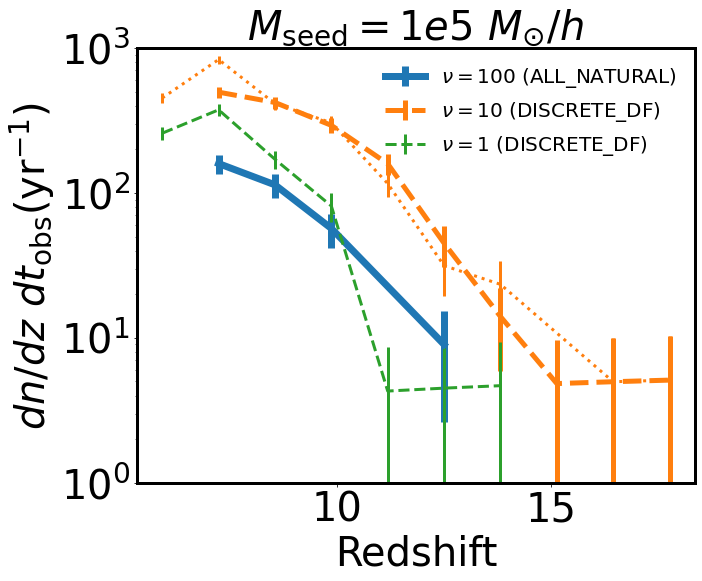

In [230]:

f,axx=plt.subplots(1,1,figsize=(10,8),sharey=True,sharex=True)

redshift_cut=0
mass_cut=0
mass_ratio_cut=0
total_mass_cut=0
apply_host_cuts=0
HDF5=1
ZOOM=0

nbins=20
min_value=0
max_value=25

upto_redshift=0

def do(labl='',width=8,HDF5=0,path_to_hdf5='',box_length=1,mark=''):
    #HDF5=0

    #path_to_output='/ufrc/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    #run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax10_haloindex4_redshift5.00_logbhseedmass5.00_NSC/' # name of the simulation runs
    #basePath=path_to_output+run+'AREPO/output_upto_3/'

    nbins=20
    min_value=0
    max_value=25
    bins,dist,dist_err,norm,dz_dt=get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=HDF5,path_to_hdf5=path_to_hdf5)
    volume_of_redshift_shell=numpy.array([4*3.14*DC(0,z_bin)**2*dx_dz(z_bin) for z_bin in bins])

    if (HDF5):
        simulation_volume=box_length**3
    else:
        simulation_volume=(arepo_package.get_box_size(basePath)/1000)**3


    merger_rate=dist*1.
    merger_rate_err=dist_err*1.

    merger_rate*=dz_dt
    merger_rate_err*=dz_dt

    merger_rate/=simulation_volume
    merger_rate_err/=simulation_volume

    merger_rate*=volume_of_redshift_shell
    merger_rate_err*=volume_of_redshift_shell

    merger_rate/=(1+bins)
    merger_rate_err/=(1+bins)

    #ax[4].errorbar(bins[mask],merger_rate[mask],merger_rate_err[mask],label='$Z<10^{-4}Z_{\odot}$ (levelmax=9)',linewidth=3)
    ax.set_yscale('log')

    ax.tick_params(labelsize=40)

    ax.set_xlabel('Redshift',fontsize=40)

    merger_rate2=dist*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    merger_rate_err2=dist_err*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    mask=(dist>0)&(merger_rate2>0)
    ax.errorbar(bins[mask],merger_rate2[mask],merger_rate_err2[mask],label=labl,linewidth=width,color=col,linestyle=style,marker=mark,ms=7)
    ax.set_yscale('log')


    #data=numpy.loadtxt('./digitized_data/Laura_proposal_illustris_merger_rates.txt')
    #ax[4].errorbar(data[:,0],data[:,1])



 

mass_cut=1.56e3

style='solid'








ax=axx


col='C0'
style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n1024/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.00_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
do(width=7,labl=r'$\nu=100$ (ALL_NATURAL)')


col='C1'
style='dashed'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.00_discreteDF_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
do(width=5,labl=r'$\nu=10$ (DISCRETE_DF)')


col='C1'
style='dotted'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.00_discreteDF_strict_velocity_gas_res_mergesep1/' 
basePath=path_to_output+run+output
do(width=3,labl='')



col='C2'
style='dashed'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n256/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.00_discreteDF_strict_velocity_gas_res/'
basePath=path_to_output+run+output
do(width=3,labl=r'$\nu=1$ (DISCRETE_DF)')

axx.set_title('$M_{\mathrm{seed}}=1e5~M_{\odot}/h$',fontsize=40)





#do(width=6,labl='')

axx.set_ylim(1,1e3)




axx.legend(loc='upper right',fontsize=20,frameon=False)





axx.set_ylabel('$dn/dz \ dt_{\mathrm{obs}} (\mathrm{yr}^{-1})$',fontsize=40)

for a in [axx]:
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 
    
    
plt.savefig('./Paper8_figures/merger_rates_seed5.00_DF.png',bbox_inches='tight')


18 7.005417045544533
Total number of mergers 92
19 6.0107573988449
Total number of mergers 52
19 6.0107573988449
Total number of mergers 1


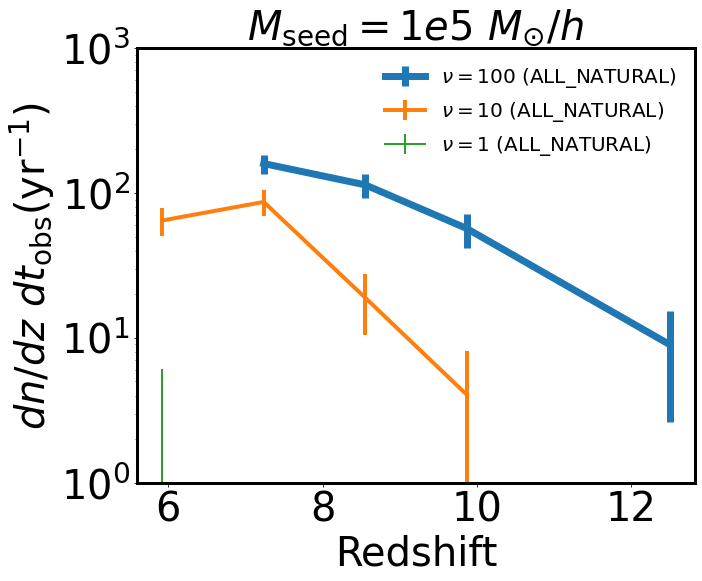

In [225]:

f,axx=plt.subplots(1,1,figsize=(10,8),sharey=True,sharex=True)

redshift_cut=0
mass_cut=0
mass_ratio_cut=0
total_mass_cut=0
apply_host_cuts=0
HDF5=1
ZOOM=0

nbins=20
min_value=0
max_value=25

upto_redshift=6

def do(labl='',width=8,HDF5=0,path_to_hdf5='',box_length=1,mark=''):
    #HDF5=0

    #path_to_output='/ufrc/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    #run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax10_haloindex4_redshift5.00_logbhseedmass5.00_NSC/' # name of the simulation runs
    #basePath=path_to_output+run+'AREPO/output_upto_3/'

    nbins=20
    min_value=0
    max_value=25
    bins,dist,dist_err,norm,dz_dt=get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=HDF5,path_to_hdf5=path_to_hdf5)
    volume_of_redshift_shell=numpy.array([4*3.14*DC(0,z_bin)**2*dx_dz(z_bin) for z_bin in bins])

    if (HDF5):
        simulation_volume=box_length**3
    else:
        simulation_volume=(arepo_package.get_box_size(basePath)/1000)**3


    merger_rate=dist*1.
    merger_rate_err=dist_err*1.

    merger_rate*=dz_dt
    merger_rate_err*=dz_dt

    merger_rate/=simulation_volume
    merger_rate_err/=simulation_volume

    merger_rate*=volume_of_redshift_shell
    merger_rate_err*=volume_of_redshift_shell

    merger_rate/=(1+bins)
    merger_rate_err/=(1+bins)

    #ax[4].errorbar(bins[mask],merger_rate[mask],merger_rate_err[mask],label='$Z<10^{-4}Z_{\odot}$ (levelmax=9)',linewidth=3)
    ax.set_yscale('log')

    ax.tick_params(labelsize=40)

    ax.set_xlabel('Redshift',fontsize=40)

    merger_rate2=dist*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    merger_rate_err2=dist_err*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    mask=(dist>0)&(merger_rate2>0)
    ax.errorbar(bins[mask],merger_rate2[mask],merger_rate_err2[mask],label=labl,linewidth=width,color=col,linestyle=style,marker=mark,ms=7)
    ax.set_yscale('log')


    #data=numpy.loadtxt('./digitized_data/Laura_proposal_illustris_merger_rates.txt')
    #ax[4].errorbar(data[:,0],data[:,1])



 

mass_cut=1.56e3

style='solid'








mass_cut=1.56e3

style='solid'








ax=axx


col='C0'
style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n1024/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.00_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
do(width=7,labl=r'$\nu = 100$ (ALL_NATURAL)')


col='C1'
style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.00_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
do(width=4,labl=r'$\nu = 10$ (ALL_NATURAL)')



col='C2'
style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n256/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.00_strict_velocity_gas_res/'
basePath=path_to_output+run+output
do(width=2,labl=r'$\nu = 1$ (ALL_NATURAL)')





#do(width=6,labl='')

axx.legend(loc='upper right',fontsize=20,frameon=False)
axx.set_ylim(1,1e3)

axx.set_title(r'$M_{\mathrm{seed}}=1e5~M_{\odot}/h$',fontsize=40)

axx.set_ylabel('$dn/dz \ dt_{\mathrm{obs}} (\mathrm{yr}^{-1})$',fontsize=40)

for a in [axx]:
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 
    
plt.savefig('./Paper8_figures/merger_rates_seed5.00_no_DF.png',bbox_inches='tight')


In [241]:
mass_cut = 1e7
mass_cut2 = 1e8

redshift_space=numpy.arange(7,25)
no_space=[]
no_space2=[]
for desired_redshift in redshift_space:
    print(desired_redshift)
    GroupMass,o = arepo_package.get_group_property(basePath,'GroupMass',desired_redshift)
    no_space.append(len(GroupMass[GroupMass>mass_cut/1e10]))
    no_space2.append(len(GroupMass[GroupMass>mass_cut2/1e10]))
    



7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24


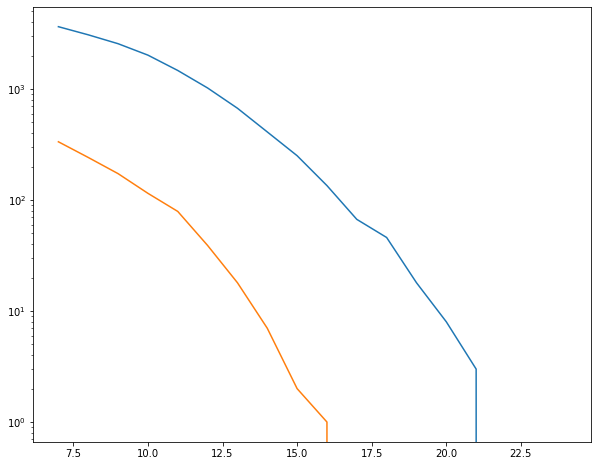

In [242]:
f,ax=plt.subplots(1,1,figsize=(10,8))
ax.errorbar(redshift_space,no_space)
ax.errorbar(redshift_space,no_space2)

ax.set_yscale('log')

19 6.0107573988449
Total number of mergers 603
18 7.005417045544533
Total number of mergers 922
19 6.0107573988449
Total number of mergers 909


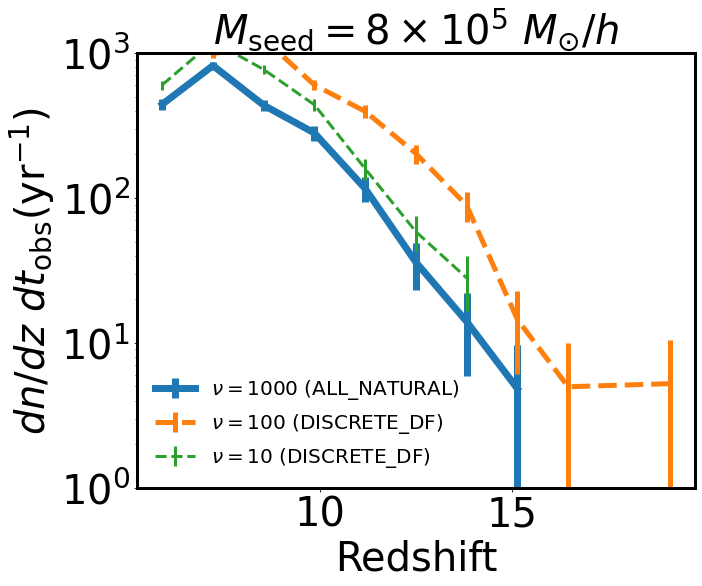

In [226]:

f,axx=plt.subplots(1,1,figsize=(10,8),sharey=True,sharex=True)

redshift_cut=0
mass_cut=0
mass_ratio_cut=0
total_mass_cut=0
apply_host_cuts=0
HDF5=1
ZOOM=0

nbins=20
min_value=0
max_value=25

upto_redshift=0

def do(labl='',width=8,HDF5=0,path_to_hdf5='',box_length=1,mark=''):
    #HDF5=0

    #path_to_output='/ufrc/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    #run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax10_haloindex4_redshift5.00_logbhseedmass5.00_NSC/' # name of the simulation runs
    #basePath=path_to_output+run+'AREPO/output_upto_3/'

    nbins=20
    min_value=0
    max_value=25
    bins,dist,dist_err,norm,dz_dt=get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=HDF5,path_to_hdf5=path_to_hdf5)
    volume_of_redshift_shell=numpy.array([4*3.14*DC(0,z_bin)**2*dx_dz(z_bin) for z_bin in bins])

    if (HDF5):
        simulation_volume=box_length**3
    else:
        simulation_volume=(arepo_package.get_box_size(basePath)/1000)**3


    merger_rate=dist*1.
    merger_rate_err=dist_err*1.

    merger_rate*=dz_dt
    merger_rate_err*=dz_dt

    merger_rate/=simulation_volume
    merger_rate_err/=simulation_volume

    merger_rate*=volume_of_redshift_shell
    merger_rate_err*=volume_of_redshift_shell

    merger_rate/=(1+bins)
    merger_rate_err/=(1+bins)

    #ax[4].errorbar(bins[mask],merger_rate[mask],merger_rate_err[mask],label='$Z<10^{-4}Z_{\odot}$ (levelmax=9)',linewidth=3)
    ax.set_yscale('log')

    ax.tick_params(labelsize=40)

    ax.set_xlabel('Redshift',fontsize=40)

    merger_rate2=dist*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    merger_rate_err2=dist_err*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    mask=(dist>0)&(merger_rate2>0)
    ax.errorbar(bins[mask],merger_rate2[mask],merger_rate_err2[mask],label=labl,linewidth=width,color=col,linestyle=style,marker=mark,ms=7)
    ax.set_yscale('log')


    #data=numpy.loadtxt('./digitized_data/Laura_proposal_illustris_merger_rates.txt')
    #ax[4].errorbar(data[:,0],data[:,1])



 

mass_cut=1.56e3

style='solid'








ax=axx


col='C0'
style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n1024/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.90_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
do(width=7,labl=r'$\nu=1000$ (ALL_NATURAL)')


col='C1'
style='dashed'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.90_discreteDF_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
do(width=5,labl=r'$\nu=100$ (DISCRETE_DF)')



col='C2'
style='dashed'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n256/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.90_discreteDF_strict_velocity_gas_res/'
basePath=path_to_output+run+output
do(width=3,labl=r'$\nu=10$ (DISCRETE_DF)')





#do(width=6,labl='')

axx.set_ylim(1,1e3)




axx.legend(loc='lower left',fontsize=20,frameon=False)





axx.set_ylabel('$dn/dz \ dt_{\mathrm{obs}} (\mathrm{yr}^{-1})$',fontsize=40)

for a in [axx]:
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 
    
axx.set_title(r'$M_{\mathrm{seed}}=8\times10^5~M_{\odot}/h$',fontsize=40)
    
    
plt.savefig('./Paper8_figures/merger_rates_seed5.90_DF.png',bbox_inches='tight')



18 7.005417045544533
Total number of mergers 356
18 7.005417045544533
Total number of mergers 317
18 7.005417045544533
Total number of mergers 67


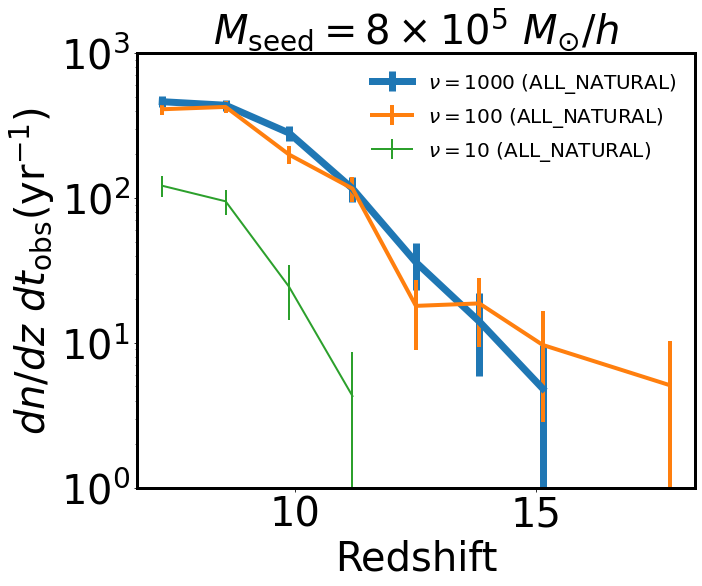

In [228]:

f,axx=plt.subplots(1,1,figsize=(10,8),sharey=True,sharex=True)

redshift_cut=0
mass_cut=0
mass_ratio_cut=0
total_mass_cut=0
apply_host_cuts=0
HDF5=1
ZOOM=0

nbins=20
min_value=0
max_value=25

upto_redshift=7

def do(labl='',width=8,HDF5=0,path_to_hdf5='',box_length=1,mark=''):
    #HDF5=0

    #path_to_output='/ufrc/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    #run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax10_haloindex4_redshift5.00_logbhseedmass5.00_NSC/' # name of the simulation runs
    #basePath=path_to_output+run+'AREPO/output_upto_3/'

    nbins=20
    min_value=0
    max_value=25
    bins,dist,dist_err,norm,dz_dt=get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=HDF5,path_to_hdf5=path_to_hdf5)
    volume_of_redshift_shell=numpy.array([4*3.14*DC(0,z_bin)**2*dx_dz(z_bin) for z_bin in bins])

    if (HDF5):
        simulation_volume=box_length**3
    else:
        simulation_volume=(arepo_package.get_box_size(basePath)/1000)**3


    merger_rate=dist*1.
    merger_rate_err=dist_err*1.

    merger_rate*=dz_dt
    merger_rate_err*=dz_dt

    merger_rate/=simulation_volume
    merger_rate_err/=simulation_volume

    merger_rate*=volume_of_redshift_shell
    merger_rate_err*=volume_of_redshift_shell

    merger_rate/=(1+bins)
    merger_rate_err/=(1+bins)

    #ax[4].errorbar(bins[mask],merger_rate[mask],merger_rate_err[mask],label='$Z<10^{-4}Z_{\odot}$ (levelmax=9)',linewidth=3)
    ax.set_yscale('log')

    ax.tick_params(labelsize=40)

    ax.set_xlabel('Redshift',fontsize=40)

    merger_rate2=dist*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    merger_rate_err2=dist_err*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    mask=(dist>0)&(merger_rate2>0)
    ax.errorbar(bins[mask],merger_rate2[mask],merger_rate_err2[mask],label=labl,linewidth=width,color=col,linestyle=style,marker=mark,ms=7)
    ax.set_yscale('log')


    #data=numpy.loadtxt('./digitized_data/Laura_proposal_illustris_merger_rates.txt')
    #ax[4].errorbar(data[:,0],data[:,1])



 

mass_cut=1.56e3

style='solid'








ax=axx

ax.set_title('$M_{\mathrm{seed}}=1e5 M_{\odot}/h$, $M^{\mathrm{FOF}}_{\mathrm{seed}}=1e7 M_{\odot}/h$',fontsize=25)


col='C0'
style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n1024/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.90_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
do(width=7,labl=r'$\nu = 1000$ (ALL_NATURAL)')


col='C1'
style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.90_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
do(width=4,labl=r'$\nu = 100$ (ALL_NATURAL)')



col='C2'
style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n256/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.90_strict_velocity_gas_res/'
basePath=path_to_output+run+output
do(width=2,labl=r'$\nu = 10$ (ALL_NATURAL)')





#do(width=6,labl='')

axx.legend(loc='upper right',fontsize=20,frameon=False)
axx.set_ylim(1,1e3)






for a in [axx]:
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 


axx.set_title(r'$M_{\mathrm{seed}}=8\times10^5~M_{\odot}/h$',fontsize=40)

axx.set_ylabel('$dn/dz \ dt_{\mathrm{obs}} (\mathrm{yr}^{-1})$',fontsize=40)

plt.savefig('./Paper8_figures/merger_rates_seed5.90_no_DF.png',bbox_inches='tight')



18 7.005417045544533
Total number of mergers 3560
18 7.005417045544533
Total number of mergers 2474
18 7.005417045544533
Total number of mergers 738
18 7.005417045544533
Total number of mergers 90
18 7.005417045544533
Total number of mergers 3560
18 7.005417045544533
Total number of mergers 2474
18 7.005417045544533
Total number of mergers 1481
18 7.005417045544533
Total number of mergers 1241


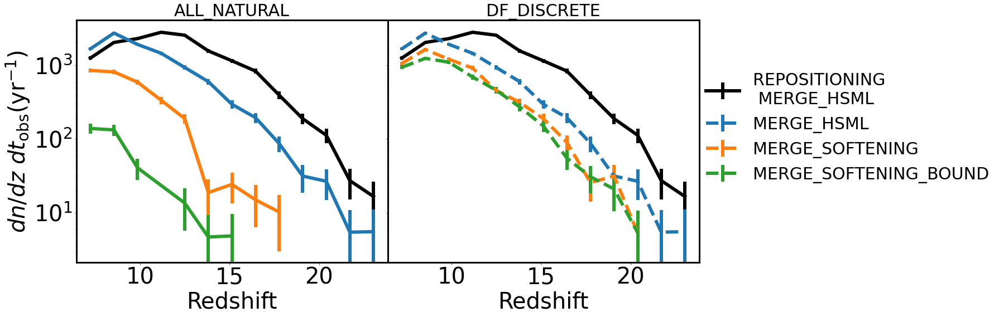

In [122]:

f,axx=plt.subplots(1,2,figsize=(20,8),sharey=True,sharex=True)

redshift_cut=0
mass_cut=0
mass_ratio_cut=0
total_mass_cut=0
apply_host_cuts=0
HDF5=1
ZOOM=0

nbins=20
min_value=0
max_value=25

upto_redshift=7

def do(labl='',width=8,HDF5=0,path_to_hdf5='',box_length=1,mark=''):
    #HDF5=0

    #path_to_output='/ufrc/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    #run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax10_haloindex4_redshift5.00_logbhseedmass5.00_NSC/' # name of the simulation runs
    #basePath=path_to_output+run+'AREPO/output_upto_3/'

    nbins=20
    min_value=0
    max_value=25
    bins,dist,dist_err,norm,dz_dt=get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=HDF5,path_to_hdf5=path_to_hdf5)
    volume_of_redshift_shell=numpy.array([4*3.14*DC(0,z_bin)**2*dx_dz(z_bin) for z_bin in bins])

    if (HDF5):
        simulation_volume=box_length**3
    else:
        simulation_volume=(arepo_package.get_box_size(basePath)/1000)**3


    merger_rate=dist*1.
    merger_rate_err=dist_err*1.

    merger_rate*=dz_dt
    merger_rate_err*=dz_dt

    merger_rate/=simulation_volume
    merger_rate_err/=simulation_volume

    merger_rate*=volume_of_redshift_shell
    merger_rate_err*=volume_of_redshift_shell

    merger_rate/=(1+bins)
    merger_rate_err/=(1+bins)

    #ax[4].errorbar(bins[mask],merger_rate[mask],merger_rate_err[mask],label='$Z<10^{-4}Z_{\odot}$ (levelmax=9)',linewidth=3)
    ax.set_yscale('log')

    ax.tick_params(labelsize=40)

    ax.set_xlabel('Redshift',fontsize=40)

    merger_rate2=dist*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    merger_rate_err2=dist_err*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    mask=(dist>0)&(merger_rate2>0)
    ax.errorbar(bins[mask],merger_rate2[mask],merger_rate_err2[mask],label=labl,linewidth=width,color=col,linestyle=style,marker=mark,ms=7)
    ax.set_yscale('log')


    #data=numpy.loadtxt('./digitized_data/Laura_proposal_illustris_merger_rates.txt')
    #ax[4].errorbar(data[:,0],data[:,1])



 

mass_cut=1.56e3

style='solid'








ax=axx[0]


col='black'





style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_repositioning/' 
basePath=path_to_output+run+output
do(width=6,labl='REPOSITIONING \n MERGE_HSML')



col='C0'
style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_HDM5.00/' 
basePath=path_to_output+run+output
do(width=6,labl='MERGE_HSML')




col='C1'
style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_HDM5.00_strict/' 
basePath=path_to_output+run+output
do(width=6,labl='MERGE_SOFTENING')





col='C2'
style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_HDM5.00_strict_velocity/' 
basePath=path_to_output+run+output
do(width=6,labl='MERGE_SOFTENING_BOUND')


axx[0].set_title('ALL_NATURAL',fontsize=30)
#do(width=6,labl='')


ax=axx[1]


col='black'

style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_repositioning/' 
basePath=path_to_output+run+output
do(width=6,labl='REPOSITIONING \n MERGE_HSML')



col='C0'
style='dashed'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_HDM5.00/' 
basePath=path_to_output+run+output
do(width=6,labl='MERGE_HSML')



col='C1'
style='dashed'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM5.00_strict/' 
basePath=path_to_output+run+output
do(width=6,labl='MERGE_SOFTENING')





col='C2'
style='dashed'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM5.00_strict_velocity/' 
basePath=path_to_output+run+output
do(width=6,labl='MERGE_SOFTENING_BOUND')


axx[0].set_title('ALL_NATURAL',fontsize=30)

axx[1].set_title('DF_DISCRETE',fontsize=30)
#do(width=6,labl='')

plt.subplots_adjust(wspace=0,hspace=0)


for a in axx.flatten():
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 










#ax.set_ylim(1,4e)

#ax.set_xlim(6,30)





ax.legend(loc=(1,0.3),fontsize=30,frameon=False)




axx[0].set_ylabel('$dn/dz \ dt_{\mathrm{obs}} (\mathrm{yr}^{-1})$',fontsize=40)

plt.savefig('./Paper8_figures/merger_rates_gas_based_models.png',bbox_inches='tight')




18 7.005417045544533
Total number of mergers 7417
18 7.005417045544533
Total number of mergers 282
18 7.005417045544533
Total number of mergers 35
18 7.005417045544533
Total number of mergers 7417
16 9.00233985416247
Total number of mergers 472
18 7.005417045544533
Total number of mergers 531
18 7.005417045544533
Total number of mergers 396


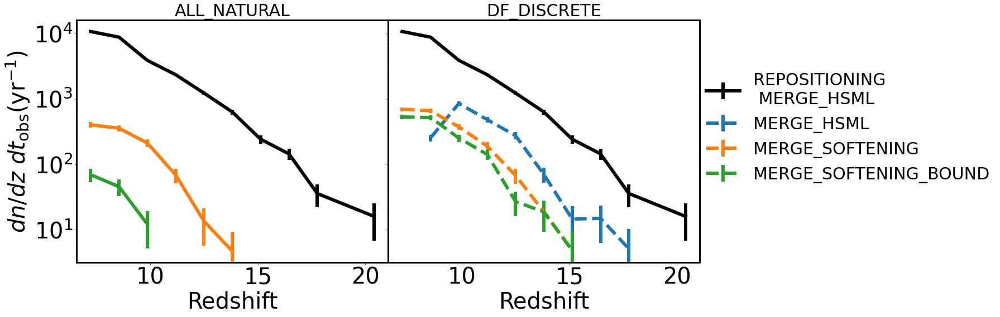

In [121]:

f,axx=plt.subplots(1,2,figsize=(20,8),sharey=True,sharex=True)

redshift_cut=0
mass_cut=0
mass_ratio_cut=0
total_mass_cut=0
apply_host_cuts=0
HDF5=1
ZOOM=0

nbins=20
min_value=0
max_value=25

upto_redshift=7

def do(labl='',width=8,HDF5=0,path_to_hdf5='',box_length=1,mark=''):
    #HDF5=0

    #path_to_output='/ufrc/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    #run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax10_haloindex4_redshift5.00_logbhseedmass5.00_NSC/' # name of the simulation runs
    #basePath=path_to_output+run+'AREPO/output_upto_3/'

    nbins=20
    min_value=0
    max_value=25
    bins,dist,dist_err,norm,dz_dt=get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=HDF5,path_to_hdf5=path_to_hdf5)
    volume_of_redshift_shell=numpy.array([4*3.14*DC(0,z_bin)**2*dx_dz(z_bin) for z_bin in bins])

    if (HDF5):
        simulation_volume=box_length**3
    else:
        simulation_volume=(arepo_package.get_box_size(basePath)/1000)**3


    merger_rate=dist*1.
    merger_rate_err=dist_err*1.

    merger_rate*=dz_dt
    merger_rate_err*=dz_dt

    merger_rate/=simulation_volume
    merger_rate_err/=simulation_volume

    merger_rate*=volume_of_redshift_shell
    merger_rate_err*=volume_of_redshift_shell

    merger_rate/=(1+bins)
    merger_rate_err/=(1+bins)

    #ax[4].errorbar(bins[mask],merger_rate[mask],merger_rate_err[mask],label='$Z<10^{-4}Z_{\odot}$ (levelmax=9)',linewidth=3)
    ax.set_yscale('log')

    ax.tick_params(labelsize=40)

    ax.set_xlabel('Redshift',fontsize=40)

    merger_rate2=dist*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    merger_rate_err2=dist_err*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    mask=(dist>0)&(merger_rate2>0)
    ax.errorbar(bins[mask],merger_rate2[mask],merger_rate_err2[mask],label=labl,linewidth=width,color=col,linestyle=style,marker=mark,ms=7)
    ax.set_yscale('log')


    #data=numpy.loadtxt('./digitized_data/Laura_proposal_illustris_merger_rates.txt')
    #ax[4].errorbar(data[:,0],data[:,1])



 

mass_cut=1.56e3

style='solid'








ax=axx[0]


col='black'





style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.00_repositioning_strict/' 
basePath=path_to_output+run+output
do(width=6,labl='REPOSITIONING \n MERGE_HSML')



col='C0'
style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.00/' 
basePath=path_to_output+run+output
#do(width=6,labl='MERGE_HSML')




col='C1'
style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.00_strict/' 
basePath=path_to_output+run+output
do(width=6,labl='MERGE_SOFTENING')



col='C2'
style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.00_strict_velocity/' 
basePath=path_to_output+run+output
do(width=6,labl='MERGE_SOFTENING_BOUND')







axx[0].set_title('ALL_NATURAL',fontsize=30)
#do(width=6,labl='')


ax=axx[1]


col='black'

style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.00_repositioning_strict/' 
basePath=path_to_output+run+output
do(width=6,labl='REPOSITIONING \n MERGE_HSML')



col='C0'
style='dashed'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.00_discreteDF/' 
basePath=path_to_output+run+output
do(width=6,labl='MERGE_HSML')



col='C1'
style='dashed'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.00_discreteDF_strict/' 
basePath=path_to_output+run+output
do(width=6,labl='MERGE_SOFTENING')





col='C2'
style='dashed'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.00_discreteDF_strict_velocity/' 
basePath=path_to_output+run+output
do(width=6,labl='MERGE_SOFTENING_BOUND')


axx[0].set_title('ALL_NATURAL',fontsize=30)

axx[1].set_title('DF_DISCRETE',fontsize=30)
#do(width=6,labl='')

plt.subplots_adjust(wspace=0,hspace=0)


for a in axx.flatten():
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 










#ax.set_ylim(1,4e)

#ax.set_xlim(6,30)





ax.legend(loc=(1,0.3),fontsize=30,frameon=False)




axx[0].set_ylabel('$dn/dz \ dt_{\mathrm{obs}} (\mathrm{yr}^{-1})$',fontsize=40)

plt.savefig('./Paper8_figures/merger_rates_fof_based_models.png',bbox_inches='tight')




18 7.005417045544533
Total number of mergers 7417
18 7.005417045544533
Total number of mergers 396
18 7.005417045544533
Total number of mergers 48


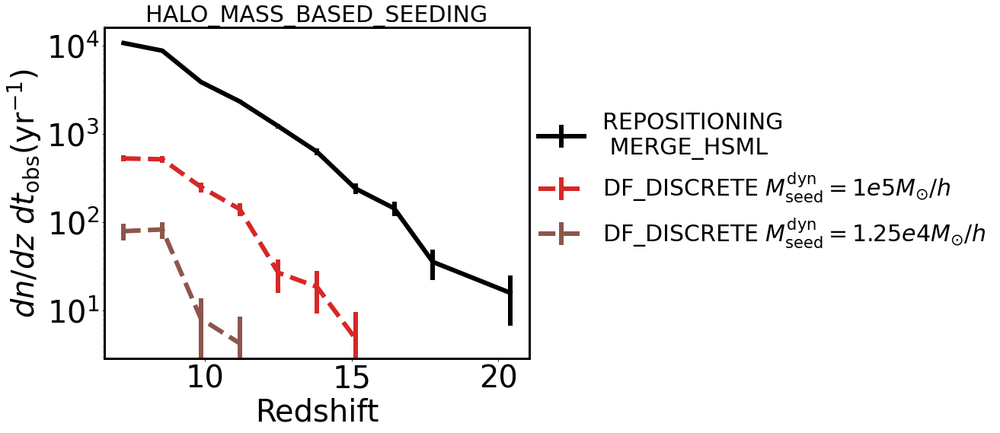

In [127]:

f,axx=plt.subplots(1,1,figsize=(10,8),sharey=True,sharex=True)

redshift_cut=0
mass_cut=0
mass_ratio_cut=0
total_mass_cut=0
apply_host_cuts=0
HDF5=1
ZOOM=0

nbins=20
min_value=0
max_value=25

upto_redshift=7

def do(labl='',width=8,HDF5=0,path_to_hdf5='',box_length=1,mark=''):
    #HDF5=0

    #path_to_output='/ufrc/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    #run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax10_haloindex4_redshift5.00_logbhseedmass5.00_NSC/' # name of the simulation runs
    #basePath=path_to_output+run+'AREPO/output_upto_3/'

    nbins=20
    min_value=0
    max_value=25
    bins,dist,dist_err,norm,dz_dt=get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=HDF5,path_to_hdf5=path_to_hdf5)
    volume_of_redshift_shell=numpy.array([4*3.14*DC(0,z_bin)**2*dx_dz(z_bin) for z_bin in bins])

    if (HDF5):
        simulation_volume=box_length**3
    else:
        simulation_volume=(arepo_package.get_box_size(basePath)/1000)**3


    merger_rate=dist*1.
    merger_rate_err=dist_err*1.

    merger_rate*=dz_dt
    merger_rate_err*=dz_dt

    merger_rate/=simulation_volume
    merger_rate_err/=simulation_volume

    merger_rate*=volume_of_redshift_shell
    merger_rate_err*=volume_of_redshift_shell

    merger_rate/=(1+bins)
    merger_rate_err/=(1+bins)

    #ax[4].errorbar(bins[mask],merger_rate[mask],merger_rate_err[mask],label='$Z<10^{-4}Z_{\odot}$ (levelmax=9)',linewidth=3)
    ax.set_yscale('log')

    ax.tick_params(labelsize=40)

    ax.set_xlabel('Redshift',fontsize=40)

    merger_rate2=dist*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    merger_rate_err2=dist_err*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    mask=(dist>0)&(merger_rate2>0)
    ax.errorbar(bins[mask],merger_rate2[mask],merger_rate_err2[mask],label=labl,linewidth=width,color=col,linestyle=style,marker=mark,ms=7)
    ax.set_yscale('log')


    #data=numpy.loadtxt('./digitized_data/Laura_proposal_illustris_merger_rates.txt')
    #ax[4].errorbar(data[:,0],data[:,1])



 

mass_cut=1.56e3

style='solid'








ax=axx


col='black'





style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.00_repositioning_strict/'
basePath=path_to_output+run+output
do(width=6,labl='REPOSITIONING \n MERGE_HSML')



col='C3'
style='dashed'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.00_discreteDF_strict_velocity/'
basePath=path_to_output+run+output
do(width=6,labl='DF_DISCRETE $M_{\mathrm{seed}}^{\mathrm{dyn}}=1e5 M_{\odot}/h$')



col='C5'
style='dashed'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_FOF_7_4.10_discreteDF_strict_velocity/'
basePath=path_to_output+run+output
do(width=6,labl='DF_DISCRETE $M_{\mathrm{seed}}^{\mathrm{dyn}}=1.25e4 M_{\odot}/h$')







plt.subplots_adjust(wspace=0,hspace=0)


for a in [axx]:
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 






axx.set_title('HALO_MASS_BASED_SEEDING',fontsize=30)



#ax.set_ylim(1,4e)

#ax.set_xlim(6,30)





ax.legend(loc=(1,0.3),fontsize=30,frameon=False)




axx.set_ylabel('$dn/dz \ dt_{\mathrm{obs}} (\mathrm{yr}^{-1})$',fontsize=40)

plt.savefig('./Paper8_figures/merger_rates_fof_dyn_mass.png',bbox_inches='tight')




18 7.005417045544533
Total number of mergers 3560
18 7.005417045544533
Total number of mergers 1241
18 7.005417045544533
Total number of mergers 260


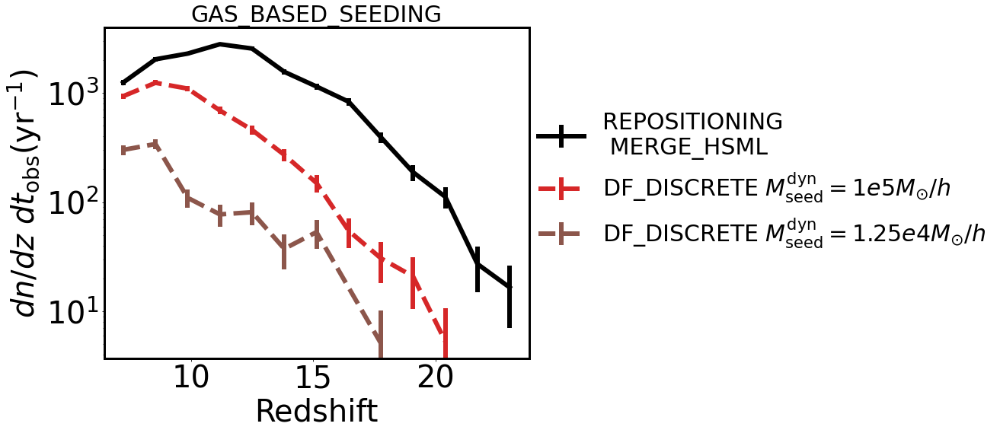

In [128]:

f,axx=plt.subplots(1,1,figsize=(10,8),sharey=True,sharex=True)

redshift_cut=0
mass_cut=0
mass_ratio_cut=0
total_mass_cut=0
apply_host_cuts=0
HDF5=1
ZOOM=0

nbins=20
min_value=0
max_value=25

upto_redshift=7

def do(labl='',width=8,HDF5=0,path_to_hdf5='',box_length=1,mark=''):
    #HDF5=0

    #path_to_output='/ufrc/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    #run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax10_haloindex4_redshift5.00_logbhseedmass5.00_NSC/' # name of the simulation runs
    #basePath=path_to_output+run+'AREPO/output_upto_3/'

    nbins=20
    min_value=0
    max_value=25
    bins,dist,dist_err,norm,dz_dt=get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=HDF5,path_to_hdf5=path_to_hdf5)
    volume_of_redshift_shell=numpy.array([4*3.14*DC(0,z_bin)**2*dx_dz(z_bin) for z_bin in bins])

    if (HDF5):
        simulation_volume=box_length**3
    else:
        simulation_volume=(arepo_package.get_box_size(basePath)/1000)**3


    merger_rate=dist*1.
    merger_rate_err=dist_err*1.

    merger_rate*=dz_dt
    merger_rate_err*=dz_dt

    merger_rate/=simulation_volume
    merger_rate_err/=simulation_volume

    merger_rate*=volume_of_redshift_shell
    merger_rate_err*=volume_of_redshift_shell

    merger_rate/=(1+bins)
    merger_rate_err/=(1+bins)

    #ax[4].errorbar(bins[mask],merger_rate[mask],merger_rate_err[mask],label='$Z<10^{-4}Z_{\odot}$ (levelmax=9)',linewidth=3)
    ax.set_yscale('log')

    ax.tick_params(labelsize=40)

    ax.set_xlabel('Redshift',fontsize=40)

    merger_rate2=dist*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    merger_rate_err2=dist_err*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    mask=(dist>0)&(merger_rate2>0)
    ax.errorbar(bins[mask],merger_rate2[mask],merger_rate_err2[mask],label=labl,linewidth=width,color=col,linestyle=style,marker=mark,ms=7)
    ax.set_yscale('log')


    #data=numpy.loadtxt('./digitized_data/Laura_proposal_illustris_merger_rates.txt')
    #ax[4].errorbar(data[:,0],data[:,1])



 

mass_cut=1.56e3

style='solid'








ax=axx


col='black'


axx.set_title('GAS_BASED_SEEDING',fontsize=30)


style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_repositioning/' 
basePath=path_to_output+run+output
do(width=6,labl='REPOSITIONING \n MERGE_HSML')



col='C3'
style='dashed'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM5.00_strict_velocity/' 
basePath=path_to_output+run+output
do(width=6,labl='DF_DISCRETE $M_{\mathrm{seed}}^{\mathrm{dyn}}=1e5 M_{\odot}/h$')



col='C5'
style='dashed'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM4.10_strict_velocity/' 
basePath=path_to_output+run+output
do(width=6,labl='DF_DISCRETE $M_{\mathrm{seed}}^{\mathrm{dyn}}=1.25e4 M_{\odot}/h$')







plt.subplots_adjust(wspace=0,hspace=0)


for a in [axx]:
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 










#ax.set_ylim(1,4e)

#ax.set_xlim(6,30)





ax.legend(loc=(1,0.3),fontsize=30,frameon=False)




axx.set_ylabel('$dn/dz \ dt_{\mathrm{obs}} (\mathrm{yr}^{-1})$',fontsize=40)

plt.savefig('./Paper8_figures/merger_rates_gas_dyn_mass.png',bbox_inches='tight')




17 8.012172948865935
Total number of mergers 2232
18 7.005417045544533
Total number of mergers 356
18 7.005417045544533
Total number of mergers 473


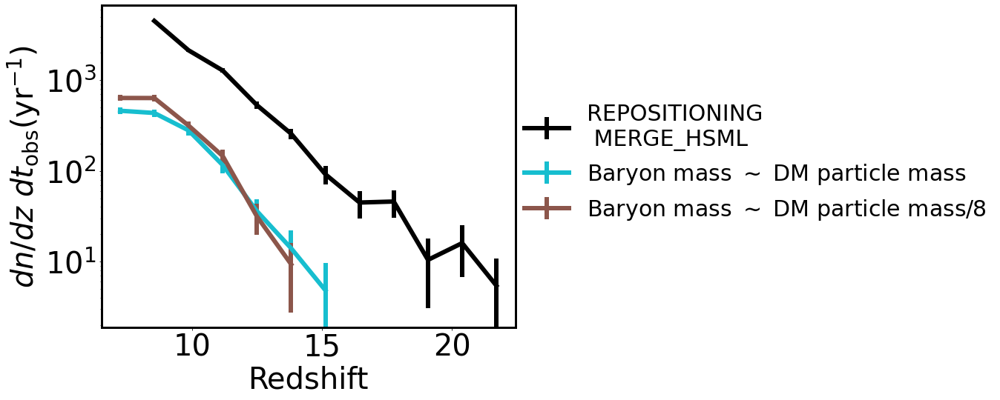

In [137]:

f,axx=plt.subplots(1,1,figsize=(10,8),sharey=True,sharex=True)

redshift_cut=0
mass_cut=0
mass_ratio_cut=0
total_mass_cut=0
apply_host_cuts=0
HDF5=1
ZOOM=0

nbins=20
min_value=0
max_value=25

upto_redshift=7

def do(labl='',width=8,HDF5=0,path_to_hdf5='',box_length=1,mark=''):
    #HDF5=0

    #path_to_output='/ufrc/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    #run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax10_haloindex4_redshift5.00_logbhseedmass5.00_NSC/' # name of the simulation runs
    #basePath=path_to_output+run+'AREPO/output_upto_3/'

    nbins=20
    min_value=0
    max_value=25
    bins,dist,dist_err,norm,dz_dt=get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=HDF5,path_to_hdf5=path_to_hdf5)
    volume_of_redshift_shell=numpy.array([4*3.14*DC(0,z_bin)**2*dx_dz(z_bin) for z_bin in bins])

    if (HDF5):
        simulation_volume=box_length**3
    else:
        simulation_volume=(arepo_package.get_box_size(basePath)/1000)**3


    merger_rate=dist*1.
    merger_rate_err=dist_err*1.

    merger_rate*=dz_dt
    merger_rate_err*=dz_dt

    merger_rate/=simulation_volume
    merger_rate_err/=simulation_volume

    merger_rate*=volume_of_redshift_shell
    merger_rate_err*=volume_of_redshift_shell

    merger_rate/=(1+bins)
    merger_rate_err/=(1+bins)

    #ax[4].errorbar(bins[mask],merger_rate[mask],merger_rate_err[mask],label='$Z<10^{-4}Z_{\odot}$ (levelmax=9)',linewidth=3)
    ax.set_yscale('log')

    ax.tick_params(labelsize=40)

    ax.set_xlabel('Redshift',fontsize=40)

    merger_rate2=dist*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    merger_rate_err2=dist_err*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    mask=(dist>0)&(merger_rate2>0)
    ax.errorbar(bins[mask],merger_rate2[mask],merger_rate_err2[mask],label=labl,linewidth=width,color=col,linestyle=style,marker=mark,ms=7)
    ax.set_yscale('log')


    #data=numpy.loadtxt('./digitized_data/Laura_proposal_illustris_merger_rates.txt')
    #ax[4].errorbar(data[:,0],data[:,1])



 

mass_cut=1.56e3

style='solid'








ax=axx


col='black'





style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.90_repositioning/' 
basePath=path_to_output+run+output
do(width=6,labl='REPOSITIONING \n MERGE_HSML')



col='C9'
style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n1024/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.90_strict_velocity_gas_res/'
basePath=path_to_output+run+output
do(width=6,labl='Baryon mass $\sim$ DM particle mass')



col='C5'
style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.90_strict_velocity/'
basePath=path_to_output+run+output
do(width=6,labl='Baryon mass $\sim$ DM particle mass/8')







plt.subplots_adjust(wspace=0,hspace=0)


for a in [axx]:
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 










#ax.set_ylim(1,4e)

#ax.set_xlim(6,30)





ax.legend(loc=(1,0.3),fontsize=30,frameon=False)




axx.set_ylabel('$dn/dz \ dt_{\mathrm{obs}} (\mathrm{yr}^{-1})$',fontsize=40)

plt.savefig('./Paper8_figures/merger_rates_fof_DM_gas.png',bbox_inches='tight')




18 7.005417045544533
Total number of mergers 3560
18 7.005417045544533
Total number of mergers 313
18 7.005417045544533
Total number of mergers 260


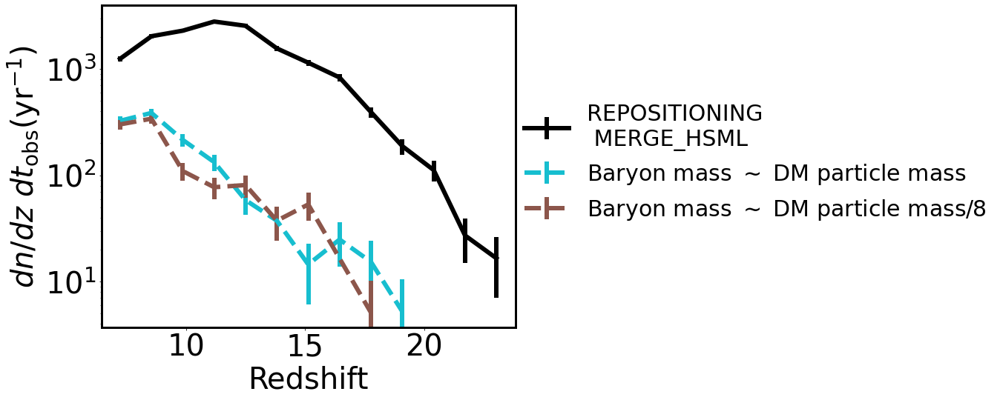

In [135]:

f,axx=plt.subplots(1,1,figsize=(10,8),sharey=True,sharex=True)

redshift_cut=0
mass_cut=0
mass_ratio_cut=0
total_mass_cut=0
apply_host_cuts=0
HDF5=1
ZOOM=0

nbins=20
min_value=0
max_value=25

upto_redshift=7

def do(labl='',width=8,HDF5=0,path_to_hdf5='',box_length=1,mark=''):
    #HDF5=0

    #path_to_output='/ufrc/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    #run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax10_haloindex4_redshift5.00_logbhseedmass5.00_NSC/' # name of the simulation runs
    #basePath=path_to_output+run+'AREPO/output_upto_3/'

    nbins=20
    min_value=0
    max_value=25
    bins,dist,dist_err,norm,dz_dt=get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=HDF5,path_to_hdf5=path_to_hdf5)
    volume_of_redshift_shell=numpy.array([4*3.14*DC(0,z_bin)**2*dx_dz(z_bin) for z_bin in bins])

    if (HDF5):
        simulation_volume=box_length**3
    else:
        simulation_volume=(arepo_package.get_box_size(basePath)/1000)**3


    merger_rate=dist*1.
    merger_rate_err=dist_err*1.

    merger_rate*=dz_dt
    merger_rate_err*=dz_dt

    merger_rate/=simulation_volume
    merger_rate_err/=simulation_volume

    merger_rate*=volume_of_redshift_shell
    merger_rate_err*=volume_of_redshift_shell

    merger_rate/=(1+bins)
    merger_rate_err/=(1+bins)

    #ax[4].errorbar(bins[mask],merger_rate[mask],merger_rate_err[mask],label='$Z<10^{-4}Z_{\odot}$ (levelmax=9)',linewidth=3)
    ax.set_yscale('log')

    ax.tick_params(labelsize=40)

    ax.set_xlabel('Redshift',fontsize=40)

    merger_rate2=dist*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    merger_rate_err2=dist_err*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    mask=(dist>0)&(merger_rate2>0)
    ax.errorbar(bins[mask],merger_rate2[mask],merger_rate_err2[mask],label=labl,linewidth=width,color=col,linestyle=style,marker=mark,ms=7)
    ax.set_yscale('log')


    #data=numpy.loadtxt('./digitized_data/Laura_proposal_illustris_merger_rates.txt')
    #ax[4].errorbar(data[:,0],data[:,1])



 

mass_cut=1.56e3

style='solid'








ax=axx


col='black'





style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_repositioning/' 
basePath=path_to_output+run+output
do(width=6,labl='REPOSITIONING \n MERGE_HSML')



col='C9'
style='dashed'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n1024/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_HDM4.10_discreteDF_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
do(width=6,labl='Baryon mass $\sim$ DM particle mass')



col='C5'
style='dashed'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM4.10_strict_velocity/' 
basePath=path_to_output+run+output
do(width=6,labl='Baryon mass $\sim$ DM particle mass/8')







plt.subplots_adjust(wspace=0,hspace=0)


for a in [axx]:
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 










#ax.set_ylim(1,4e)

#ax.set_xlim(6,30)





ax.legend(loc=(1,0.3),fontsize=30,frameon=False)




axx.set_ylabel('$dn/dz \ dt_{\mathrm{obs}} (\mathrm{yr}^{-1})$',fontsize=40)

plt.savefig('./Paper8_figures/merger_rates_gas_DM_gas.png',bbox_inches='tight')




18 7.005417045544533
Total number of mergers 3560
18 7.005417045544533
Total number of mergers 1241
17 8.012172948865935
Total number of mergers 2232
18 7.005417045544533
Total number of mergers 396


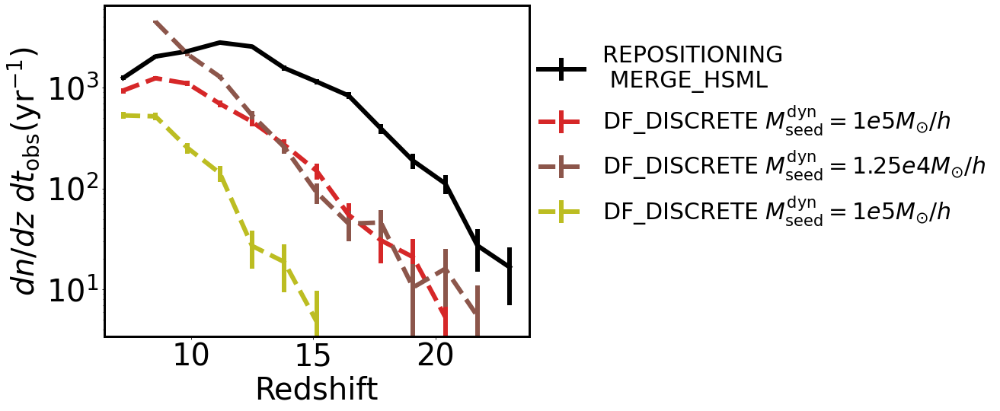

In [109]:

f,axx=plt.subplots(1,1,figsize=(10,8),sharey=True,sharex=True)

redshift_cut=0
mass_cut=0
mass_ratio_cut=0
total_mass_cut=0
apply_host_cuts=0
HDF5=1
ZOOM=0

nbins=20
min_value=0
max_value=25

upto_redshift=7

def do(labl='',width=8,HDF5=0,path_to_hdf5='',box_length=1,mark=''):
    #HDF5=0

    #path_to_output='/ufrc/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    #run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax10_haloindex4_redshift5.00_logbhseedmass5.00_NSC/' # name of the simulation runs
    #basePath=path_to_output+run+'AREPO/output_upto_3/'

    nbins=20
    min_value=0
    max_value=25
    bins,dist,dist_err,norm,dz_dt=get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=HDF5,path_to_hdf5=path_to_hdf5)
    volume_of_redshift_shell=numpy.array([4*3.14*DC(0,z_bin)**2*dx_dz(z_bin) for z_bin in bins])

    if (HDF5):
        simulation_volume=box_length**3
    else:
        simulation_volume=(arepo_package.get_box_size(basePath)/1000)**3


    merger_rate=dist*1.
    merger_rate_err=dist_err*1.

    merger_rate*=dz_dt
    merger_rate_err*=dz_dt

    merger_rate/=simulation_volume
    merger_rate_err/=simulation_volume

    merger_rate*=volume_of_redshift_shell
    merger_rate_err*=volume_of_redshift_shell

    merger_rate/=(1+bins)
    merger_rate_err/=(1+bins)

    #ax[4].errorbar(bins[mask],merger_rate[mask],merger_rate_err[mask],label='$Z<10^{-4}Z_{\odot}$ (levelmax=9)',linewidth=3)
    ax.set_yscale('log')

    ax.tick_params(labelsize=40)

    ax.set_xlabel('Redshift',fontsize=40)

    merger_rate2=dist*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    merger_rate_err2=dist_err*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    mask=(dist>0)&(merger_rate2>0)
    ax.errorbar(bins[mask],merger_rate2[mask],merger_rate_err2[mask],label=labl,linewidth=width,color=col,linestyle=style,marker=mark,ms=7)
    ax.set_yscale('log')


    #data=numpy.loadtxt('./digitized_data/Laura_proposal_illustris_merger_rates.txt')
    #ax[4].errorbar(data[:,0],data[:,1])



 

mass_cut=1.56e3

style='solid'








ax=axx


col='black'





style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_repositioning/' 
basePath=path_to_output+run+output
do(width=6,labl='REPOSITIONING \n MERGE_HSML')



col='C3'
style='dashed'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM5.00_strict_velocity/' 
basePath=path_to_output+run+output
do(width=6,labl='DF_DISCRETE $M_{\mathrm{seed}}^{\mathrm{dyn}}=1e5 M_{\odot}/h$')



col='C5'
style='dashed'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.90_repositioning/' 
basePath=path_to_output+run+output
do(width=6,labl='DF_DISCRETE $M_{\mathrm{seed}}^{\mathrm{dyn}}=1.25e4 M_{\odot}/h$')

col='C8'
style='dashed'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.00_discreteDF_strict_velocity/' 
basePath=path_to_output+run+output
do(width=6,labl='DF_DISCRETE $M_{\mathrm{seed}}^{\mathrm{dyn}}=1e5 M_{\odot}/h$')






plt.subplots_adjust(wspace=0,hspace=0)


for a in [axx]:
    a.spines['top'].set_linewidth(3)    # Top axis
    a.spines['bottom'].set_linewidth(3) # Bottom axis
    a.spines['left'].set_linewidth(3)   # Left axis
    a.spines['right'].set_linewidth(3) 










#ax.set_ylim(1,4e)

#ax.set_xlim(6,30)





ax.legend(loc=(1,0.3),fontsize=30,frameon=False)




axx.set_ylabel('$dn/dz \ dt_{\mathrm{obs}} (\mathrm{yr}^{-1})$',fontsize=40)

plt.savefig('./Paper8_figures/merger_rates_gas_dyn_mass.png',bbox_inches='tight')




In [3]:
from cosmology import *
from scipy.integrate import quad


def find_unique_indices(arr):
    """
    Find the indices of unique elements in a NumPy array.

    Args:
        arr (numpy.ndarray): The input NumPy array.

    Returns:
        numpy.ndarray: A 2D NumPy array where each row contains the index of a unique element in the input array.
    """
    unique_elements, inverse_indices = np.unique(arr, return_inverse=True)
    unique_indices = []

    for unique_element in unique_elements:
        index = np.where(inverse_indices == np.argwhere(unique_elements == unique_element)[0])[0][0]
        unique_indices.append([index])

    return np.array(unique_indices)[:,0]


def make_plot(ax,labl='',col='C0',size=10,width=4,style='solid'):
    print("-------")
    found_a_merger_space,redshift_tuple,event_index_in_merger_catalog,event_index_in_galaxy_merger_catalog=numpy.load(treePath + "/BH_merging_time_scales.npy",allow_pickle=True)
    inverse_indices = find_unique_indices(event_index_in_merger_catalog)
    
    galaxy_mergers,snap_space,galaxy_mergers_multiplicity,galaxy_stellar_mass,galaxy_total_mass,galaxy_bh_mass=numpy.load(treePath + '/list_of_galaxy_mergers.npy',allow_pickle=True)

    redshift_galaxy_merger = numpy.transpose(redshift_tuple)[1]
    redshift_bh_merger = numpy.transpose(redshift_tuple)[0]
    merger_time_scale=[]
    for z1,z2 in list(zip(redshift_bh_merger,redshift_galaxy_merger)):
        merger_time_scale.append(T(z1,z2)/hubble/1e6)
    merger_time_scale=numpy.array(merger_time_scale)
    
    centers,HMF,dHMF,norm,counts_sum = arepo_package.get_probability_density(numpy.log10(merger_time_scale[inverse_indices]),Nbin,vmax,vmin,linear=1)

    ax.errorbar(centers,HMF*counts_sum,dHMF*counts_sum,marker='',linewidth=4,ms=size,alpha=1,label=labl,color=col,linestyle=style)

    ax.tick_params(labelsize=30)
    
    ax.axvline(numpy.log10(13.7*1000),linewidth=3, linestyle='dashed',color='black')
    upto_redshift=0
    scale_fac_complete_sorted,primary_mass_sorted,secondary_mass_sorted,primary_id_sorted,secondary_id_sorted,file_id_complete_sorted,N_empty=arepo_package.get_merger_events_from_snapshot(basePath,upto_redshift,HOSTS=0)
    redshift_complete_sorted = 1./scale_fac_complete_sorted - 1
    
    #ax.axhline(len(scale_fac_complete_sorted[redshift_complete_sorted>7]),linewidth=3, linestyle='dashed',color=col)
    
    temp=redshift_bh_merger[inverse_indices]
    
    #ax.axhline(len(temp[temp>7]),linewidth=3, linestyle='solid',color=col)

    print("Total number of z > 7 mergers",len(scale_fac_complete_sorted[redshift_complete_sorted>7]))
    print("Number of z > 7 for which we found corresponding subhalo mergers",len(temp[temp>7]))
    print("-------")   
    #ax.axhline(len(event_index_in_merger_catalog),linewidth=3, linestyle='solid',color=col)
    #print(event_index_in_merger_catalog)
    ax.set_yscale('log')







-------
19 6.0107573988449
Total number of mergers 603
Total number of z > 7 mergers 358
Number of z > 7 for which we found corresponding subhalo mergers 214
-------
-------
22 3.008131071630377
Total number of mergers 1887
Total number of z > 7 mergers 317
Number of z > 7 for which we found corresponding subhalo mergers 205
-------
-------
30 0.19728418237600986
Total number of mergers 2545
Total number of z > 7 mergers 67
Number of z > 7 for which we found corresponding subhalo mergers 54
-------


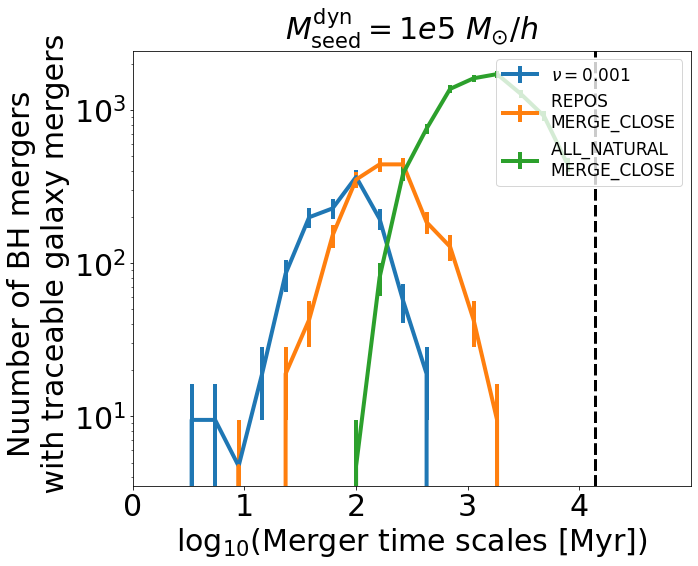

In [7]:
f,axx=plt.subplots(1,1,figsize=(10,8),sharey=True,sharex=True)


Nbin,vmax,vmin=20, 0,4
axx.set_title('$M^{\mathrm{dyn}}_{\mathrm{seed}}=1e5 \ M_{\odot}/h$',fontsize=30)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n1024/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.90_strict_velocity_gas_res/' 
basePath=path_to_output+run+output

treePath=basePath+'/postprocessing/tree_info_redshiftcut0.0/'
full_tree=numpy.load(treePath+'/full_tree.npy')
snapshot_list=numpy.load(treePath+'/snapshot_list.npy')
full_tree_transpose=numpy.transpose(full_tree)
make_plot(axx,labl=r'$\nu=0.001$',col='C0',size=20)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.90_strict_velocity_gas_res/' 
basePath=path_to_output+run+output

treePath=basePath+'/postprocessing/tree_info_redshiftcut0.0/'
full_tree=numpy.load(treePath+'/full_tree.npy')
snapshot_list=numpy.load(treePath+'/snapshot_list.npy')
full_tree_transpose=numpy.transpose(full_tree)
make_plot(axx,labl='REPOS \nMERGE_CLOSE',col='C1',size=20)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n256/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.90_strict_velocity_gas_res/' 
basePath=path_to_output+run+output

treePath=basePath+'/postprocessing/tree_info_redshiftcut0.0/'
full_tree=numpy.load(treePath+'/full_tree.npy')
snapshot_list=numpy.load(treePath+'/snapshot_list.npy')
full_tree_transpose=numpy.transpose(full_tree)
make_plot(axx,labl='ALL_NATURAL \nMERGE_CLOSE',col='C2',size=20)




axx.set_xlim(0,5)

axx.set_xlabel('$\log_{10}$(Merger time scales [Myr])',fontsize=30)
axx.set_ylabel('Nuumber of BH mergers \n with traceable galaxy mergers',fontsize=30)

axx.set_xticks([0,1,2,3,4])
#axx[1,0].set_xlabel('Redshift snapshot \n of host galaxy merger',fontsize=30)
#axx.set_ylabel('',fontsize=30)

axx.legend(loc='upper right',fontsize=17)


plt.subplots_adjust(hspace=0,wspace=0)





-------
18 7.005417045544533
Total number of mergers 92
Total number of z > 7 mergers 92
Number of z > 7 for which we found corresponding subhalo mergers 60
-------
-------
19 6.0107573988449
Total number of mergers 52
Total number of z > 7 mergers 23
Number of z > 7 for which we found corresponding subhalo mergers 18
-------
-------
32 2.220446049250313e-16
Total number of mergers 623
Total number of z > 7 mergers 0
Number of z > 7 for which we found corresponding subhalo mergers 0
-------


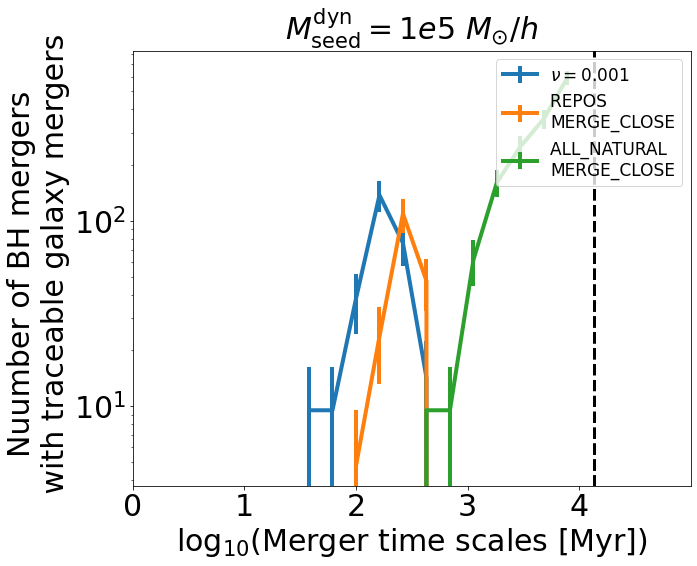

In [8]:
f,axx=plt.subplots(1,1,figsize=(10,8),sharey=True,sharex=True)


Nbin,vmax,vmin=20, 0,4
axx.set_title('$M^{\mathrm{dyn}}_{\mathrm{seed}}=1e5 \ M_{\odot}/h$',fontsize=30)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n1024/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.00_strict_velocity_gas_res/' 
basePath=path_to_output+run+output

treePath=basePath+'/postprocessing/tree_info_redshiftcut0.0/'
full_tree=numpy.load(treePath+'/full_tree.npy')
snapshot_list=numpy.load(treePath+'/snapshot_list.npy')
full_tree_transpose=numpy.transpose(full_tree)
make_plot(axx,labl=r'$\nu=0.001$',col='C0',size=20)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.00_strict_velocity_gas_res/' 
basePath=path_to_output+run+output

treePath=basePath+'/postprocessing/tree_info_redshiftcut0.0/'
full_tree=numpy.load(treePath+'/full_tree.npy')
snapshot_list=numpy.load(treePath+'/snapshot_list.npy')
full_tree_transpose=numpy.transpose(full_tree)
make_plot(axx,labl='REPOS \nMERGE_CLOSE',col='C1',size=20)


path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n256/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.00_strict_velocity_gas_res/' 
basePath=path_to_output+run+output

treePath=basePath+'/postprocessing/tree_info_redshiftcut0.0/'
full_tree=numpy.load(treePath+'/full_tree.npy')
snapshot_list=numpy.load(treePath+'/snapshot_list.npy')
full_tree_transpose=numpy.transpose(full_tree)
make_plot(axx,labl='ALL_NATURAL \nMERGE_CLOSE',col='C2',size=20)




axx.set_xlim(0,5)

axx.set_xlabel('$\log_{10}$(Merger time scales [Myr])',fontsize=30)
axx.set_ylabel('Nuumber of BH mergers \n with traceable galaxy mergers',fontsize=30)

axx.set_xticks([0,1,2,3,4])
#axx[1,0].set_xlabel('Redshift snapshot \n of host galaxy merger',fontsize=30)
#axx.set_ylabel('',fontsize=30)

axx.legend(loc='upper right',fontsize=17)


plt.subplots_adjust(hspace=0,wspace=0)





19 6.0107573988449
Total number of mergers 603
18 7.005417045544533
Total number of mergers 922
19 6.0107573988449
Total number of mergers 909


Text(0, 0.5, '$dn/dz \\ dt_{\\mathrm{obs}} (\\mathrm{yr}^{-1})$')

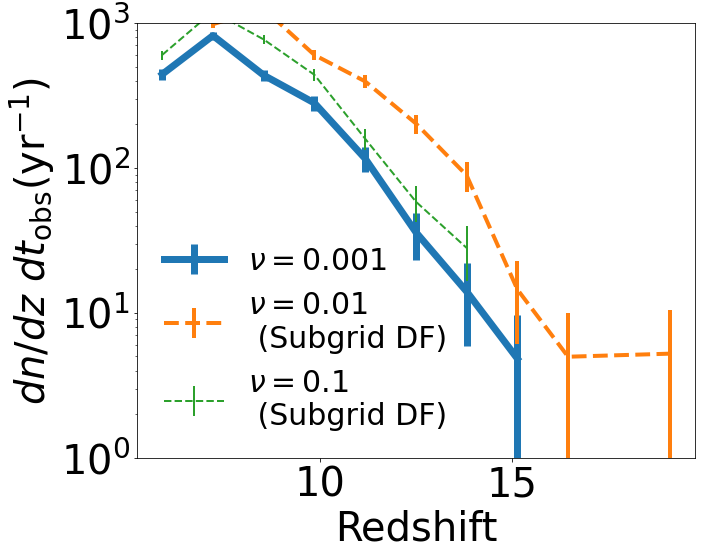

In [4]:

f,axx=plt.subplots(1,1,figsize=(10,8),sharey=True,sharex=True)

redshift_cut=0
mass_cut=0
mass_ratio_cut=0
total_mass_cut=0
apply_host_cuts=0
HDF5=1
ZOOM=0

nbins=20
min_value=0
max_value=25

upto_redshift=0

def do(labl='',width=8,HDF5=0,path_to_hdf5='',box_length=1,mark=''):
    #HDF5=0

    #path_to_output='/ufrc/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    #run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax10_haloindex4_redshift5.00_logbhseedmass5.00_NSC/' # name of the simulation runs
    #basePath=path_to_output+run+'AREPO/output_upto_3/'

    nbins=20
    min_value=0
    max_value=25
    bins,dist,dist_err,norm,dz_dt=get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=HDF5,path_to_hdf5=path_to_hdf5)
    volume_of_redshift_shell=numpy.array([4*3.14*DC(0,z_bin)**2*dx_dz(z_bin) for z_bin in bins])

    if (HDF5):
        simulation_volume=box_length**3
    else:
        simulation_volume=(arepo_package.get_box_size(basePath)/1000)**3


    merger_rate=dist*1.
    merger_rate_err=dist_err*1.

    merger_rate*=dz_dt
    merger_rate_err*=dz_dt

    merger_rate/=simulation_volume
    merger_rate_err/=simulation_volume

    merger_rate*=volume_of_redshift_shell
    merger_rate_err*=volume_of_redshift_shell

    merger_rate/=(1+bins)
    merger_rate_err/=(1+bins)

    #ax[4].errorbar(bins[mask],merger_rate[mask],merger_rate_err[mask],label='$Z<10^{-4}Z_{\odot}$ (levelmax=9)',linewidth=3)
    ax.set_yscale('log')

    ax.tick_params(labelsize=40)

    ax.set_xlabel('Redshift',fontsize=40)

    merger_rate2=dist*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    merger_rate_err2=dist_err*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    mask=(dist>0)&(merger_rate2>0)
    ax.errorbar(bins[mask],merger_rate2[mask],merger_rate_err2[mask],label=labl,linewidth=width,color=col,linestyle=style,marker=mark,ms=7)
    ax.set_yscale('log')


    #data=numpy.loadtxt('./digitized_data/Laura_proposal_illustris_merger_rates.txt')
    #ax[4].errorbar(data[:,0],data[:,1])



 

mass_cut=1.56e3

style='solid'








ax=axx


col='C0'
style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n1024/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.90_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
do(width=7,labl=r'$\nu=0.001$')


col='C1'
style='dashed'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.90_discreteDF_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
do(width=4,labl=r'$\nu=0.01$'+ '\n (Subgrid DF)')



col='C2'
style='dashed'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n256/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.90_discreteDF_strict_velocity_gas_res/'
basePath=path_to_output+run+output
do(width=2,labl=r'$\nu=0.1$'+ '\n (Subgrid DF)')





#do(width=6,labl='')

axx.set_ylim(1,1e3)




axx.legend(loc='lower left',fontsize=30,frameon=False)





axx.set_ylabel('$dn/dz \ dt_{\mathrm{obs}} (\mathrm{yr}^{-1})$',fontsize=40)




18 7.005417045544533
Total number of mergers 92
19 6.0107573988449
Total number of mergers 52
32 2.220446049250313e-16
Total number of mergers 623


Text(0, 0.5, '$dn/dz \\ dt_{\\mathrm{obs}} (\\mathrm{yr}^{-1})$')

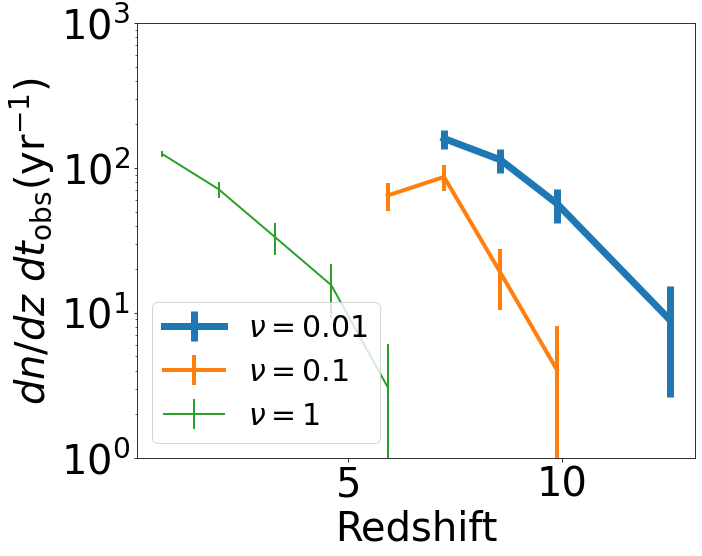

In [6]:

f,axx=plt.subplots(1,1,figsize=(10,8),sharey=True,sharex=True)

redshift_cut=0
mass_cut=0
mass_ratio_cut=0
total_mass_cut=0
apply_host_cuts=0
HDF5=1
ZOOM=0

nbins=20
min_value=0
max_value=25

upto_redshift=0

def do(labl='',width=8,HDF5=0,path_to_hdf5='',box_length=1,mark=''):
    #HDF5=0

    #path_to_output='/ufrc/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    #run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax10_haloindex4_redshift5.00_logbhseedmass5.00_NSC/' # name of the simulation runs
    #basePath=path_to_output+run+'AREPO/output_upto_3/'

    nbins=20
    min_value=0
    max_value=25
    bins,dist,dist_err,norm,dz_dt=get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=HDF5,path_to_hdf5=path_to_hdf5)
    volume_of_redshift_shell=numpy.array([4*3.14*DC(0,z_bin)**2*dx_dz(z_bin) for z_bin in bins])

    if (HDF5):
        simulation_volume=box_length**3
    else:
        simulation_volume=(arepo_package.get_box_size(basePath)/1000)**3


    merger_rate=dist*1.
    merger_rate_err=dist_err*1.

    merger_rate*=dz_dt
    merger_rate_err*=dz_dt

    merger_rate/=simulation_volume
    merger_rate_err/=simulation_volume

    merger_rate*=volume_of_redshift_shell
    merger_rate_err*=volume_of_redshift_shell

    merger_rate/=(1+bins)
    merger_rate_err/=(1+bins)

    #ax[4].errorbar(bins[mask],merger_rate[mask],merger_rate_err[mask],label='$Z<10^{-4}Z_{\odot}$ (levelmax=9)',linewidth=3)
    ax.set_yscale('log')

    ax.tick_params(labelsize=40)

    ax.set_xlabel('Redshift',fontsize=40)

    merger_rate2=dist*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    merger_rate_err2=dist_err*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    mask=(dist>0)&(merger_rate2>0)
    ax.errorbar(bins[mask],merger_rate2[mask],merger_rate_err2[mask],label=labl,linewidth=width,color=col,linestyle=style,marker=mark,ms=7)
    ax.set_yscale('log')


    #data=numpy.loadtxt('./digitized_data/Laura_proposal_illustris_merger_rates.txt')
    #ax[4].errorbar(data[:,0],data[:,1])



 

mass_cut=1.56e3

style='solid'








mass_cut=1.56e3

style='solid'








ax=axx


col='C0'
style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n1024/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.00_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
do(width=7,labl=r'$\nu = 0.01$')


col='C1'
style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.00_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
do(width=4,labl=r'$\nu = 0.1$')



col='C2'
style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n256/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.00_strict_velocity_gas_res/'
basePath=path_to_output+run+output
do(width=2,labl=r'$\nu = 1$')





#do(width=6,labl='')

axx.legend(loc='lower left',fontsize=30)
axx.set_ylim(1,1e3)










axx.set_ylabel('$dn/dz \ dt_{\mathrm{obs}} (\mathrm{yr}^{-1})$',fontsize=40)




18 7.005417045544533
Total number of mergers 92
18 7.005417045544533
Total number of mergers 379
19 6.0107573988449
Total number of mergers 612
19 6.0107573988449
Total number of mergers 260


Text(0, 0.5, '$dn/dz \\ dt_{\\mathrm{obs}} (\\mathrm{yr}^{-1})$')

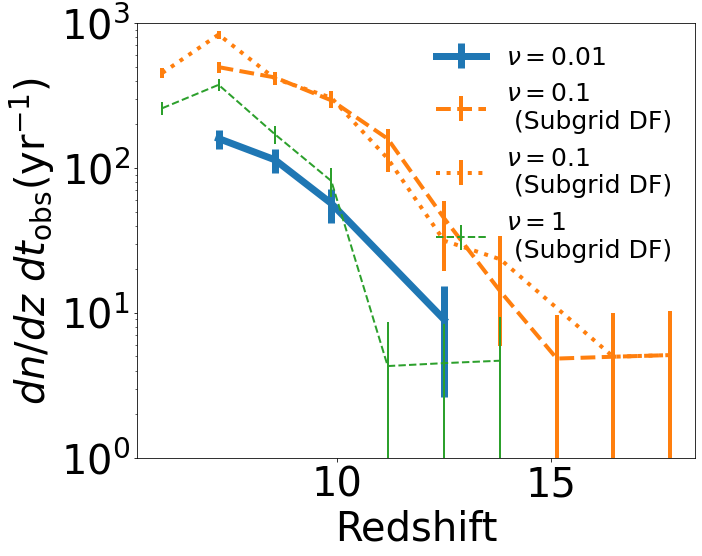

In [37]:

f,axx=plt.subplots(1,1,figsize=(10,8),sharey=True,sharex=True)

redshift_cut=0
mass_cut=0
mass_ratio_cut=0
total_mass_cut=0
apply_host_cuts=0
HDF5=1
ZOOM=0

nbins=20
min_value=0
max_value=25

upto_redshift=0

def do(labl='',width=8,HDF5=0,path_to_hdf5='',box_length=1,mark=''):
    #HDF5=0

    #path_to_output='/ufrc/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    #run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax10_haloindex4_redshift5.00_logbhseedmass5.00_NSC/' # name of the simulation runs
    #basePath=path_to_output+run+'AREPO/output_upto_3/'

    nbins=20
    min_value=0
    max_value=25
    bins,dist,dist_err,norm,dz_dt=get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=HDF5,path_to_hdf5=path_to_hdf5)
    volume_of_redshift_shell=numpy.array([4*3.14*DC(0,z_bin)**2*dx_dz(z_bin) for z_bin in bins])

    if (HDF5):
        simulation_volume=box_length**3
    else:
        simulation_volume=(arepo_package.get_box_size(basePath)/1000)**3


    merger_rate=dist*1.
    merger_rate_err=dist_err*1.

    merger_rate*=dz_dt
    merger_rate_err*=dz_dt

    merger_rate/=simulation_volume
    merger_rate_err/=simulation_volume

    merger_rate*=volume_of_redshift_shell
    merger_rate_err*=volume_of_redshift_shell

    merger_rate/=(1+bins)
    merger_rate_err/=(1+bins)

    #ax[4].errorbar(bins[mask],merger_rate[mask],merger_rate_err[mask],label='$Z<10^{-4}Z_{\odot}$ (levelmax=9)',linewidth=3)
    ax.set_yscale('log')

    ax.tick_params(labelsize=40)

    ax.set_xlabel('Redshift',fontsize=40)

    merger_rate2=dist*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    merger_rate_err2=dist_err*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    mask=(dist>0)&(merger_rate2>0)
    ax.errorbar(bins[mask],merger_rate2[mask],merger_rate_err2[mask],label=labl,linewidth=width,color=col,linestyle=style,marker=mark,ms=7)
    ax.set_yscale('log')


    #data=numpy.loadtxt('./digitized_data/Laura_proposal_illustris_merger_rates.txt')
    #ax[4].errorbar(data[:,0],data[:,1])



 

mass_cut=1.56e3

style='solid'








ax=axx


col='C0'
style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n1024/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.00_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
do(width=7,labl=r'$\nu=0.01$')


col='C1'
style='dashed'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.00_discreteDF_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
do(width=4,labl=r'$\nu=0.1$'+ '\n (Subgrid DF)')


col='C1'
style='dotted'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.00_discreteDF_strict_velocity_gas_res_mergesep1/' 
basePath=path_to_output+run+output
do(width=4,labl=r'$\nu=0.1$'+ '\n (Subgrid DF)')



col='C2'
style='dashed'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n256/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.00_discreteDF_strict_velocity_gas_res/'
basePath=path_to_output+run+output
do(width=2,labl=r'$\nu=1$'+ '\n (Subgrid DF)')





#do(width=6,labl='')

axx.set_ylim(1,1e3)




axx.legend(loc='upper right',fontsize=25,frameon=False)





axx.set_ylabel('$dn/dz \ dt_{\mathrm{obs}} (\mathrm{yr}^{-1})$',fontsize=40)




18 7.005417045544533
Total number of mergers 3560
18 7.005417045544533
Total number of mergers 2474
18 7.005417045544533
Total number of mergers 2541
18 7.005417045544533
Total number of mergers 738
18 7.005417045544533
Total number of mergers 1481
18 7.005417045544533
Total number of mergers 1241


Text(0, 0.5, '$dn/dz \\ dt_{\\mathrm{obs}} (\\mathrm{yr}^{-1})$')

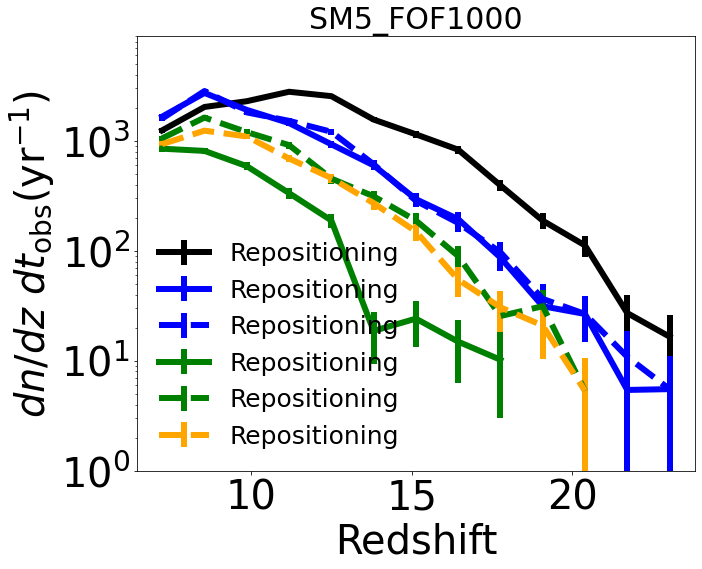

In [56]:

f,axx=plt.subplots(1,1,figsize=(10,8),sharey=True,sharex=True)

redshift_cut=0
mass_cut=0
mass_ratio_cut=0
total_mass_cut=0
apply_host_cuts=0
HDF5=1
ZOOM=0

nbins=20
min_value=0
max_value=25

upto_redshift=7

def do(labl='',width=8,HDF5=0,path_to_hdf5='',box_length=1,mark=''):
    #HDF5=0

    #path_to_output='/ufrc/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    #run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax10_haloindex4_redshift5.00_logbhseedmass5.00_NSC/' # name of the simulation runs
    #basePath=path_to_output+run+'AREPO/output_upto_3/'

    nbins=20
    min_value=0
    max_value=25
    bins,dist,dist_err,norm,dz_dt=get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=HDF5,path_to_hdf5=path_to_hdf5)
    volume_of_redshift_shell=numpy.array([4*3.14*DC(0,z_bin)**2*dx_dz(z_bin) for z_bin in bins])

    if (HDF5):
        simulation_volume=box_length**3
    else:
        simulation_volume=(arepo_package.get_box_size(basePath)/1000)**3


    merger_rate=dist*1.
    merger_rate_err=dist_err*1.

    merger_rate*=dz_dt
    merger_rate_err*=dz_dt

    merger_rate/=simulation_volume
    merger_rate_err/=simulation_volume

    merger_rate*=volume_of_redshift_shell
    merger_rate_err*=volume_of_redshift_shell

    merger_rate/=(1+bins)
    merger_rate_err/=(1+bins)

    #ax[4].errorbar(bins[mask],merger_rate[mask],merger_rate_err[mask],label='$Z<10^{-4}Z_{\odot}$ (levelmax=9)',linewidth=3)
    ax.set_yscale('log')

    ax.tick_params(labelsize=40)

    ax.set_xlabel('Redshift',fontsize=40)

    merger_rate2=dist*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    merger_rate_err2=dist_err*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    mask=(dist>0)&(merger_rate2>0)
    ax.errorbar(bins[mask],merger_rate2[mask],merger_rate_err2[mask],label=labl,linewidth=width,color=col,linestyle=style,marker=mark,ms=7)
    ax.set_yscale('log')


    #data=numpy.loadtxt('./digitized_data/Laura_proposal_illustris_merger_rates.txt')
    #ax[4].errorbar(data[:,0],data[:,1])



 

mass_cut=1.56e3

style='solid'








ax=axx


col='black'





style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_repositioning/' 
basePath=path_to_output+run+output
do(width=6,labl='Repositioning')



col='blue'
style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_HDM5.00/' 
basePath=path_to_output+run+output
do(width=6,labl='Repositioning')


col='blue'
style='dashed'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM5.00/' 
basePath=path_to_output+run+output
do(width=6,labl='Repositioning')


col='green'
style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_HDM5.00_strict/' 
basePath=path_to_output+run+output
do(width=6,labl='Repositioning')


col='green'
style='dashed'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM5.00_strict/' 
basePath=path_to_output+run+output
do(width=6,labl='Repositioning')





col='orange'
style='dashed'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_discreteDF_HDM5.00_strict_velocity/' 
basePath=path_to_output+run+output
do(width=6,labl='Repositioning')















axx.set_title('SM5_FOF1000',fontsize=30)
#do(width=6,labl='')

axx.set_ylim(1,9e3)





axx.legend(loc='lower left',fontsize=25,frameon=False)




axx.set_ylabel('$dn/dz \ dt_{\mathrm{obs}} (\mathrm{yr}^{-1})$',fontsize=40)




NameError: name 'get_merger_distributions' is not defined

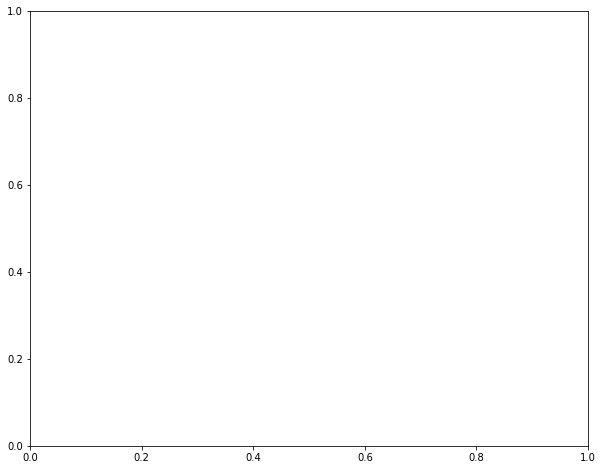

In [54]:

f,axx=plt.subplots(1,1,figsize=(10,8),sharey=True,sharex=True)

redshift_cut=0
mass_cut=0
mass_ratio_cut=0
total_mass_cut=0
apply_host_cuts=0
HDF5=1
ZOOM=0

nbins=20
min_value=0
max_value=25

upto_redshift=7

def do(labl='',width=8,HDF5=0,path_to_hdf5='',box_length=1,mark=''):
    #HDF5=0

    #path_to_output='/ufrc/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    #run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax10_haloindex4_redshift5.00_logbhseedmass5.00_NSC/' # name of the simulation runs
    #basePath=path_to_output+run+'AREPO/output_upto_3/'

    nbins=20
    min_value=0
    max_value=25
    bins,dist,dist_err,norm,dz_dt=get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=HDF5,path_to_hdf5=path_to_hdf5)
    volume_of_redshift_shell=numpy.array([4*3.14*DC(0,z_bin)**2*dx_dz(z_bin) for z_bin in bins])

    if (HDF5):
        simulation_volume=box_length**3
    else:
        simulation_volume=(arepo_package.get_box_size(basePath)/1000)**3


    merger_rate=dist*1.
    merger_rate_err=dist_err*1.

    merger_rate*=dz_dt
    merger_rate_err*=dz_dt

    merger_rate/=simulation_volume
    merger_rate_err/=simulation_volume

    merger_rate*=volume_of_redshift_shell
    merger_rate_err*=volume_of_redshift_shell

    merger_rate/=(1+bins)
    merger_rate_err/=(1+bins)

    #ax[4].errorbar(bins[mask],merger_rate[mask],merger_rate_err[mask],label='$Z<10^{-4}Z_{\odot}$ (levelmax=9)',linewidth=3)
    ax.set_yscale('log')

    ax.tick_params(labelsize=40)

    ax.set_xlabel('Redshift',fontsize=40)

    merger_rate2=dist*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    merger_rate_err2=dist_err*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    mask=(dist>0)&(merger_rate2>0)
    ax.errorbar(bins[mask],merger_rate2[mask],merger_rate_err2[mask],label=labl,linewidth=width,color=col,linestyle=style,marker=mark,ms=7)
    ax.set_yscale('log')


    #data=numpy.loadtxt('./digitized_data/Laura_proposal_illustris_merger_rates.txt')
    #ax[4].errorbar(data[:,0],data[:,1])



 

mass_cut=1.56e3

style='solid'








ax=axx


col='black'





style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_bFOF/' 
basePath=path_to_output+run+output
do(width=6,labl='Repositioning')



col='green'
style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_bFOF_discreteDF/' 
basePath=path_to_output+run+output
do(width=6,labl='Repositioning')


col='pink'
style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_bFOF_discreteDF_HDM4.10/' 
basePath=path_to_output+run+output
do(width=6,labl='Repositioning')




col='blue'
style='solid'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n1024/AREPO/' # name of the simulation runs
output='/output_ratio1000_SFMFGM5_seed3.19_HDM4.10_discreteDF_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
do(width=6,labl=r'Discrete_DF ($\nu=0.1$)')



axx.set_title('SM5_FOF1000',fontsize=30)
#do(width=6,labl='')

axx.set_ylim(1,9e3)





axx.legend(loc='lower left',fontsize=25,frameon=False)




axx.set_ylabel('$dn/dz \ dt_{\mathrm{obs}} (\mathrm{yr}^{-1})$',fontsize=40)




Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
[3.45554235e-08 3.05482832e-07 2.70058217e-06 2.38741536e-05
 2.11056423e-04 1.86581749e-03 1.64945225e-02 1.45817731e-01
 1.28908313e+00 1.13959756e+01]
Desired redshift:  10
Output redshift:  9.996590466186332
Output snapshot:  15
Desired redshift:  10
Output redshift:  9.996590466186332
Output snapshot:  15
Desired redshift:  10
Output redshift:  9.996590466186332
Output snapshot:  15
[5.25324767e-09 4.64406687e-08 4.10552832e-07 3.62944016e-06
 3.20856047e-05 2.83648712e-04 2.50756041e-03 2.21677693e-02
 1.95971348e-01 1.73245981e+00]
Desired redshift:  13
Output redshift:  13.002545271070936
Output snapshot:  12
Desired redshift:  13
Output redshift:  13.002545271070936
Output snapshot:  12
Desired redshift:  13
Output redshift:  13.002545271070936
Ou

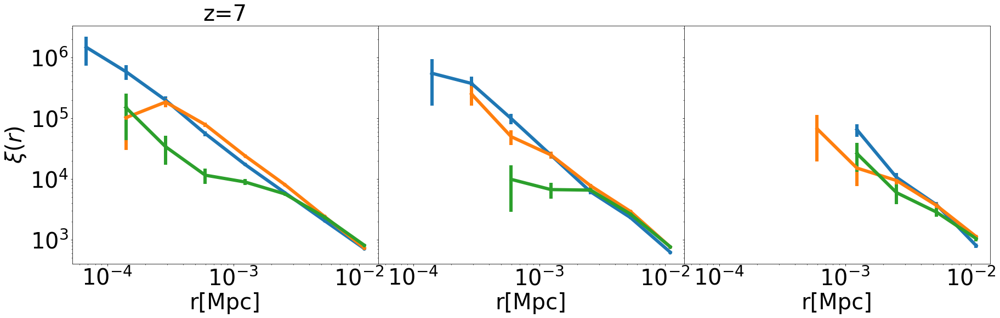

Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
Desired redshift:  7
Output redshift:  7.005417045544533
Output snapshot:  18
[3.45554235e-08 3.05482832e-07 2.70058217e-06 2.38741536e-05
 2.11056423e-04 1.86581749e-03 1.64945225e-02 1.45817731e-01
 1.28908313e+00 1.13959756e+01]
Desired redshift:  10
Output redshift:  9.996590466186332
Output snapshot:  15
Desired redshift:  10
Output redshift:  9.996590466186332
Output snapshot:  15
Desired redshift:  10
Output redshift:  9.996590466186332
Output snapshot:  15
[5.25324767e-09 4.64406687e-08 4.10552832e-07 3.62944016e-06
 3.20856047e-05 2.83648712e-04 2.50756041e-03 2.21677693e-02
 1.95971348e-01 1.73245981e+00]
Desired redshift:  13
Output redshift:  13.002545271070936
Output snapshot:  12
Desired redshift:  13
Output redshift:  13.002545271070936
Output snapshot:  12
Desired redshift:  13
Output redshift:  13.002545271070936
Ou

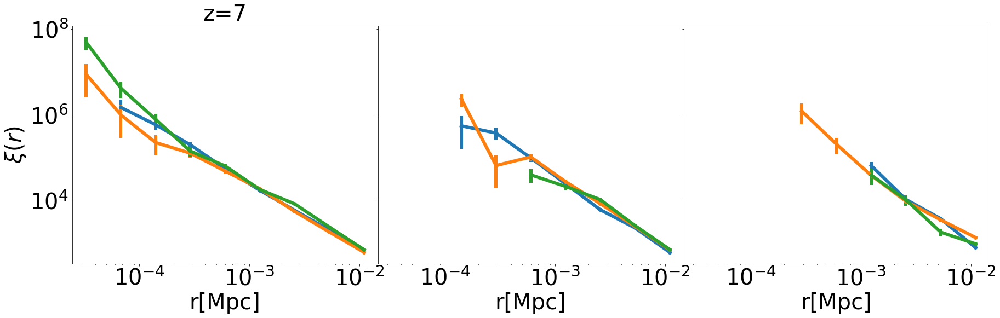

In [27]:

label_fontsize=40

def make_plot(style='solid',labl=''):
    
    i=0
    for redshift in [7,10,13]:
        ax=axx[i]



        Coordinates,o=arepo_package.get_particle_property(basePath,'Coordinates',5,redshift)
        BH_Mdot,o=arepo_package.get_particle_property(basePath,'BH_Mdot',5,redshift)
        BH_Mass,o=arepo_package.get_particle_property(basePath,'BH_Mass',5,redshift)
        BH_lum= BH_Mdot*total_conv
        Coordinates/=1e3
        mask=(BH_lum>=lum_cut) & (BH_Mass>=mass_cut)

        r, DD,RR=arepo_package.correlate_info(Coordinates[mask], dist_bins, max_dist,min_dist,arepo_package.get_box_size(basePath), WRAP=1)
        xi=DD/RR-1
        dxi=numpy.sqrt(DD)/RR-1
        mmask=xi>0
        print(RR)
        ax.errorbar(r[mmask]/h,xi[mmask],dxi[mmask],color=col,linewidth=6,linestyle=style,marker='o',label=labl)


        #ax.set_ylim(1e2,1e6)

        ax.tick_params(labelsize=label_fontsize)
        ax.set_yscale('log')
        ax.set_xscale('log')
        ax.set_xlabel('r[Mpc]',fontsize=label_fontsize)
        i+=1

        
        
f,axx=plt.subplots(1,3,figsize=(30,8),sharex=True,sharey=True)


h=0.6771


mass_cut=0/1e10
lum_cut=0

dist_bins, max_dist,min_dist = 10, 7e-6, 0.01


col='C0'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n1024/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.00_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
make_plot(labl=r'$\nu=0.01$')



col='C1'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n512/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.00_discreteDF_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
make_plot(labl=r'$\nu=0.1$')


col='C2'
path_to_output='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_UNIFORM_RUNS///' # this is the folder containing the simulation run
run='/L3p125n256/AREPO/' # name of the simulation runs
output='/output_FOF_7_5.00_discreteDF_strict_velocity_gas_res/' 
basePath=path_to_output+run+output
make_plot(labl=r'$\nu=0.1$',style='solid')




#axx.set_title(r'$M_{bh}>1.25\times10^{4}M_{\odot}/h$',fontsize=label_fontsize)

axx[0].set_title('z=7',fontsize=40)


axx[0].set_ylabel(r'$\xi(r)$',fontsize=label_fontsize)



plt.subplots_adjust(wspace=0,hspace=0)

#plt.savefig('./Paper5_figures/subhalo_based_models4_Msfmp5_Mh3000_seed5.00.png',bbox_inches='tight')

#plt.savefig('./Paper6_figures/small_scale_clustering.png',bbox_inches='tight')
        

19 6.0097596149373445
Total number of mergers 2724
17 8.017333353397985
Total number of mergers 119


Text(0, 0.5, '$dn/dz \\ dt_{\\mathrm{obs}} (\\mathrm{yr}^{-1})$')

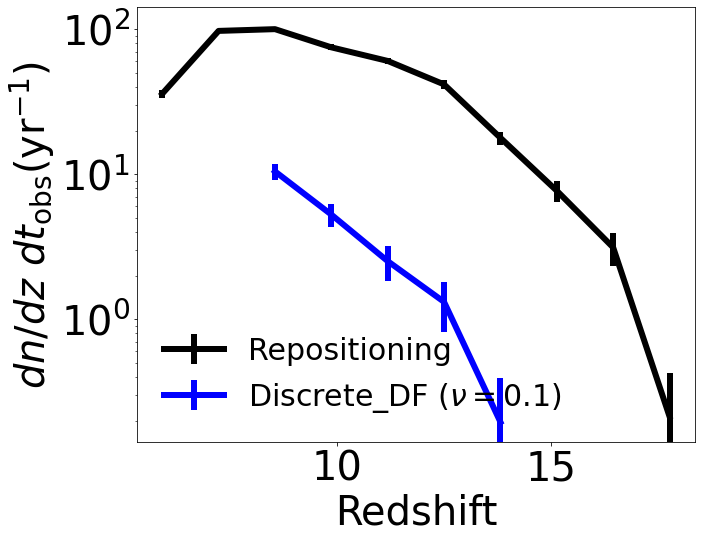

In [84]:

f,axx=plt.subplots(1,1,figsize=(10,8),sharey=True,sharex=True)

redshift_cut=0
mass_cut=0
mass_ratio_cut=0
total_mass_cut=0
apply_host_cuts=0
HDF5=1
ZOOM=0

nbins=20
min_value=0
max_value=25

upto_redshift=6

def do(labl='',width=8,HDF5=0,path_to_hdf5='',box_length=1,mark=''):
    #HDF5=0

    #path_to_output='/ufrc/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_ZOOM_RUNS4/' # this is the folder containing the simulation run
    #run='/density_and_metallicity_based_criterion_zoom_levelmin7_levelmax10_haloindex4_redshift5.00_logbhseedmass5.00_NSC/' # name of the simulation runs
    #basePath=path_to_output+run+'AREPO/output_upto_3/'

    nbins=20
    min_value=0
    max_value=25
    bins,dist,dist_err,norm,dz_dt=get_merger_distributions(basePath,nbins,min_value,max_value,mass_cut,linear=1,HDF5=HDF5,path_to_hdf5=path_to_hdf5)
    volume_of_redshift_shell=numpy.array([4*3.14*DC(0,z_bin)**2*dx_dz(z_bin) for z_bin in bins])

    if (HDF5):
        simulation_volume=box_length**3
    else:
        simulation_volume=(arepo_package.get_box_size(basePath)/1000)**3


    merger_rate=dist*1.
    merger_rate_err=dist_err*1.

    merger_rate*=dz_dt
    merger_rate_err*=dz_dt

    merger_rate/=simulation_volume
    merger_rate_err/=simulation_volume

    merger_rate*=volume_of_redshift_shell
    merger_rate_err*=volume_of_redshift_shell

    merger_rate/=(1+bins)
    merger_rate_err/=(1+bins)

    #ax[4].errorbar(bins[mask],merger_rate[mask],merger_rate_err[mask],label='$Z<10^{-4}Z_{\odot}$ (levelmax=9)',linewidth=3)
    ax.set_yscale('log')

    ax.tick_params(labelsize=40)

    ax.set_xlabel('Redshift',fontsize=40)

    merger_rate2=dist*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    merger_rate_err2=dist_err*dz_dt/(1+bins)*volume_of_redshift_shell/simulation_volume
    mask=(dist>0)&(merger_rate2>0)
    ax.errorbar(bins[mask],merger_rate2[mask],merger_rate_err2[mask],label=labl,linewidth=width,color=col,linestyle=style,marker=mark,ms=7)
    ax.set_yscale('log')


    #data=numpy.loadtxt('./digitized_data/Laura_proposal_illustris_merger_rates.txt')
    #ax[4].errorbar(data[:,0],data[:,1])



 

mass_cut=1.56e3

style='solid'








ax=axx


col='black'





style='solid'

run='IC-L9-Ng360_RG1.0_sigma5.0_xd5.8_e15.0/SFMFGM5_FOF3000_seed5.00_2'
basePath='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_CONSTRAINED_RUNS/L9N360_z99/AREPO/output_%s/'%run    

do(width=6,labl='Repositioning')


col='blue'
style='solid'
run='IC-L9-Ng360_RG1.0_sigma5.0_xd5.8_e15.0/SFMFGM5_FOF3000_seed5.00_discreteDF'
basePath='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_CONSTRAINED_RUNS/L9N360_z99/AREPO/output_%s/'%run    

do(width=6,labl=r'Discrete_DF ($\nu=0.1$)')





#do(width=6,labl='')

#axx.set_ylim(1,9e3)





axx.legend(loc='lower left',fontsize=30,frameon=False)




axx.set_ylabel('$dn/dz \ dt_{\mathrm{obs}} (\mathrm{yr}^{-1})$',fontsize=40)




In [11]:
Nbins=25
log_mass_min=8
log_mass_max=14
i=0
redshift_space=numpy.array([6,7,8,9,10,11,12,13,14,15,16,17,18,19,20])

logseedmass=5.00

run='IC-L9-Ng360_RG1.0_sigma5.0_xd5.8_e15.0/SFMFGM5_FOF10_seed5.00_discreteDF'


GroupMass_space=[]
GroupSMMass_space=[]
GroupGasMass_space=[]
GroupDMMass_space=[]
GroupBHMass_space=[]
Group5Mass_space=[]
GroupSFR_space=[]
BlackholeDensity_space=[]
BlackholeMass_space=[]
SoundSpeed_space=[]
BH_Mdot_space=[]

BH_Progs_space=[]


for desired_redshift in redshift_space:
    #ax[i].set_title('$z=%.1f$'%desired_redshift,fontsize=30)

    object_type='group'
    #basePath='/blue/lblecha/aklantbhowmick/code_development/AREPO/output_test4_new/'
    category='total'
    #centers,HMF,dHMF,output_redshift=arepo_package.get_mass_function(category,object_type,desired_redshift,basePath,Nbins,log_mass_min,log_mass_max,list_all=False)
    #print(dHMF)
    #ax[0].errorbar(centers,HMF,dHMF,color=col,label='z=%.1f (Aklant)'%output_redshift)

    
    #object_type='s'
    


    #desired_redshift=2
    
    #basePath='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_CONSTRAINED_RUNS/L9N360_z99/AREPO/output_%s/'%run    
    basePath='/orange/lblecha/aklantbhowmick/GAS_BASED_SEED_MODEL_CONSTRAINED_RUNS/L9N360_z99/AREPO/output_%s/'%run    


    #basePath='/blue/lblecha/aklantbhowmick/CURRENT_RUNS/GAS_GAS_BASED_SEED_MODEL_CONSTRAINED_RUNS/L9N360_z99/AREPO/output_%s/'%run    
   
    
    GroupMass,o=arepo_package.get_group_property(basePath,'GroupMass',desired_redshift)
    GroupMassType,o=arepo_package.get_group_property(basePath,'GroupMassType',desired_redshift)
    GroupBHMass,o=arepo_package.get_group_property(basePath,'GroupBHMass',desired_redshift)
    GroupSFR,o=arepo_package.get_group_property(basePath,'GroupSFR',desired_redshift)

    GroupDMMass=GroupMassType[:,1]
    Group5Mass=GroupMassType[:,5]
    GroupSMMass=GroupMassType[:,4]
    GroupGasMass=GroupMassType[:,0]
    
    GroupSMMass_space.append(GroupSMMass[0])
    GroupGasMass_space.append(GroupGasMass[0])
    GroupDMMass_space.append(GroupDMMass[0])   
    GroupBHMass_space.append(GroupBHMass[0])
    GroupSFR_space.append(GroupSFR[0])
    Group5Mass_space.append(Group5Mass[0])
    try:
        BlackholeDensity,o=arepo_package.get_particle_property_within_groups(basePath,'BH_Density',5,desired_redshift,0)
        BlackholeMass,o=arepo_package.get_particle_property_within_groups(basePath,'BH_Mass',5,desired_redshift,0)
        GAMMA=5./3
        GAMMA_MINUS1=GAMMA-1
        BH_U,o=arepo_package.get_particle_property_within_groups(basePath,'BH_U',5,desired_redshift,0) 
        BH_Mdot,o=arepo_package.get_particle_property_within_groups(basePath,'BH_Mdot',5,desired_redshift,0) 
        BH_Progs,o=arepo_package.get_particle_property_within_groups(basePath,'BH_Progs',5,desired_redshift,0) 

        print(BlackholeDensity)
        print(o)






        #if ('count' not in BlackholeDensity):
        extract_max=BlackholeMass==numpy.amax(BlackholeMass)
        BlackholeMass_space.append(BlackholeMass[extract_max][0])
        BH_Progs_space.append(BH_Progs[extract_max][0])
        BlackholeDensity_space.append(BlackholeDensity[extract_max][0])
        BH_Mdot_space.append(BH_Mdot[extract_max][0]*1e10/0.978/1e9)
        SoundSpeed_space.append(numpy.sqrt(GAMMA * GAMMA_MINUS1 * BH_U[extract_max][0]))
    except:
        BlackholeMass_space.append(0.)
        BlackholeDensity_space.append(0.)   
        SoundSpeed_space.append(0.)
        BH_Mdot_space.append(0.)
        BH_Progs_space.append(0.)
GroupGasMass_space=numpy.array(GroupGasMass_space)
GroupSMMass_space=numpy.array(GroupSMMass_space)
GroupDMMass_space=numpy.array(GroupDMMass_space)
GroupBHMass_space=numpy.array(GroupBHMass_space)
Group5Mass_space=numpy.array(Group5Mass_space)
GroupSFR_space=numpy.array(GroupSFR_space)
SoundSpeed_space=numpy.array(SoundSpeed_space)
print(BlackholeDensity_space)
BlackholeMass_space=numpy.array(BlackholeMass_space)
BlackholeDensity_space=numpy.array(BlackholeDensity_space)
BH_Mdot_space=numpy.array(BH_Mdot_space)
BH_Progs_space=numpy.array(BH_Progs_space)

numpy.save('../arepo_code_development/matter_density/%s.npy'%run,[redshift_space,GroupDMMass_space,GroupGasMass_space,GroupSMMass_space,GroupBHMass_space,Group5Mass_space,GroupSFR_space,BlackholeMass_space,BlackholeDensity_space,SoundSpeed_space,BH_Mdot_space,BH_Progs_space])

  






[3.3551818e-03 1.5805437e-01 1.9800809e-01 ... 2.8128502e-08 8.5275694e-08
 5.8431333e-08]
6.0097596149373445
[1.59511017e-03 1.49337975e-02 1.48818991e-03 ... 1.61187756e-07
 3.61563849e-07 2.69564680e-07]
6.986265609715332
[1.0348043e-02 2.8977687e-03 3.5839912e-05 ... 3.0043084e-06 4.9654989e-07
 1.9166922e-07]
8.017333353397985
[8.7520137e-04 6.4383761e-04 2.2486788e-04 ... 1.2213951e-07 7.6256515e-07
 2.2512869e-07]
9.000000000000002
[2.72216730e-05 3.94886592e-06 6.36052300e-06 7.16161521e-05
 8.87502301e-06 4.84061820e-06 8.25604184e-06 1.78435821e-05
 5.67771895e-05 2.04178490e-04 1.45911963e-06 4.94104870e-06
 2.27568944e-05 1.85241106e-06 5.47838738e-07 7.69813710e-07
 8.71268130e-05 4.59877668e-07 1.03874720e-06 4.17936189e-06
 1.59274555e-06 5.46596937e-07 4.90300408e-07 1.15564872e-05
 2.01510124e-06 3.44794813e-07 1.48611946e-06 3.52385626e-07
 5.39926759e-07 3.78240856e-07 1.95498942e-05 6.12206861e-07
 1.12092357e-06 4.83474139e-07 7.66604728e-07 1.17638353e-06
 6.12150

[7.14792714e-06 1.23270149e-06 4.62663502e-06 7.43545854e-07
 7.78163610e-07 1.70647780e-07 1.77543347e-06 7.74668251e-07
 1.99793590e-07 3.20079948e-07 2.28720864e-07 9.91657600e-08
 8.08547966e-08 6.98556050e-07 2.72146679e-07 1.72556256e-07
 3.45559215e-07 1.18442010e-07 8.44245776e-08 1.94809968e-06
 4.18176597e-07 1.50548232e-07 1.57969225e-07 2.73671571e-06
 1.02658731e-07 8.59002540e-08 8.23231574e-07 4.80980020e-08
 1.49296170e-07 1.20414995e-07 1.42557974e-06 2.40632687e-07
 9.79885726e-07 1.47504238e-07 2.20873659e-07 2.24200662e-07
 1.97661677e-07 1.38884175e-07 4.02895296e-07 5.09095685e-07
 6.05141508e-07 8.91042120e-08 8.60918817e-07 1.49428814e-07
 2.38161221e-07 4.87834370e-07 6.65863240e-08 2.90605499e-07
 3.85457554e-07 5.65004893e-06 2.70407583e-07 1.84279457e-07
 3.28245108e-07 4.07387660e-07 3.42767237e-07 5.81829624e-08
 1.23942044e-07 6.91156004e-08 4.52254589e-08 1.88671024e-07
 5.71197809e-08 1.91492347e-07 2.20408637e-07 9.64352580e-07
 6.72877363e-08 3.927401

[2.59502685e-05 1.76346712e-05 1.45693048e-05 2.43299496e-06
 7.10159065e-06 2.42677561e-06 9.45694865e-06 2.84117596e-05
 1.02820388e-06 8.97450093e-07 3.67568958e-07 8.39080371e-07
 6.53716540e-07 7.54461894e-07 3.29094405e-07 1.36515200e-06
 2.02611375e-07 2.27909766e-07 1.27770775e-07 1.69560587e-06
 9.02842658e-07 8.69384920e-08 1.61202593e-07 1.21391383e-06
 5.31313333e-07 3.64087583e-07 1.31031570e-07 2.61203553e-07
 2.25204303e-06 1.80563902e-07 1.78097025e-07 9.48072554e-08
 6.93927518e-07 7.52554215e-08 3.22136799e-07 8.83120208e-08
 4.23921080e-07 5.99150724e-07 2.57906123e-07 1.51662519e-07
 7.71907267e-08 5.87073963e-08 3.92769522e-07 1.01604577e-07
 5.44006184e-07 1.02924946e-06 1.25639602e-07 6.36081097e-07
 5.42918485e-07 7.08013488e-08 1.28272674e-07 2.46799260e-07
 7.25088611e-08 1.79003166e-07 5.69893075e-07 8.13785022e-08
 3.28931804e-07 2.38436741e-07 4.21384456e-08 5.59336172e-07
 2.11457646e-07 8.18278465e-07 2.15319133e-07 8.08757136e-07
 8.22552053e-08 6.302822

[1.0780445e-06 1.7110295e-07 2.2853628e-07 3.3813691e-07 2.0231711e-07
 7.8603811e-08 1.1981665e-07 9.4188138e-08 3.3165425e-06 9.7002896e-08
 4.3194387e-07 2.2566981e-07 9.9577370e-08 2.1093147e-07 7.0069014e-08
 7.9461024e-08 2.3015612e-06 1.3308423e-06 4.9427325e-07 3.7182494e-07
 2.6943485e-07 1.0233113e-07 4.4342887e-06 3.1913780e-07 4.1551798e-06
 4.0527502e-07 3.5419203e-06 4.9532987e-06 4.9384212e-06 3.1415741e-06
 9.0638615e-08 7.7389004e-06 4.0943513e-07 4.6709025e-07 8.8379193e-07
 2.2739680e-06 4.3239632e-07 2.7670532e-07 3.1711582e-07 2.8513006e-07
 1.6124116e-07 5.0881681e-07 8.8700801e-08 1.1409399e-07 4.2225113e-07
 1.0321663e-06 1.8476588e-07 1.0040312e-07 9.7346145e-08 2.1273857e-07
 1.9941406e-07 3.1681571e-07 5.9183073e-08 1.6971229e-07 2.4408703e-07
 2.9140033e-08 4.2628591e-07 1.5675538e-07 6.4733413e-08 1.4004038e-07
 4.6997350e-08]
15.035338235804868
[2.5938059e-06 2.8633553e-07 7.0678118e-07 1.0353962e-07 1.3481652e-07
 3.6713569e-08 2.8599612e-08 4.2421207e-06

1.1685655857435003e+47
1.1685655857435003e+47


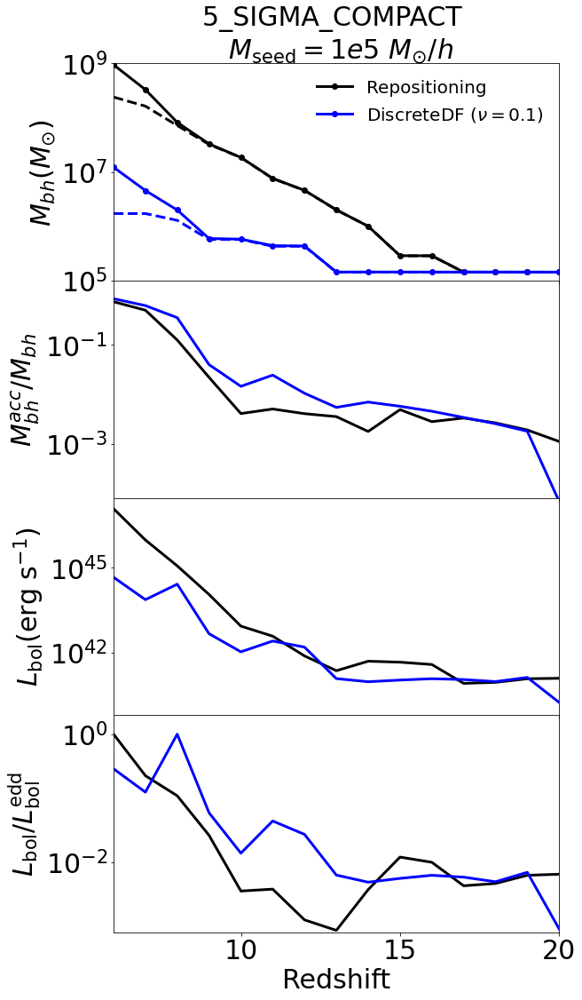

In [13]:
#from kdcount import correlate




f,axx=plt.subplots(4,1,figsize=(9,18),sharex=True)
p_type=4
desired_redshift_of_selected_halo=7
index_of_selected_halo=0
min_edge,max_edge,Nbins=-1,3,20

#arepo_package.get_particle_property(BH)
i=0
runs=['IC-L9-Ng360_RG1.0_sigma5.0_xd5.8_e15.0/SFMFGM5_FOF3000_seed5.00_2','IC-L9-Ng360_RG1.0_sigma5.0_xd5.8_e15.0/SFMFGM5_FOF3000_seed5.00_discreteDF']
#cols=['blue','red','green','cyan']
labls=['Repositioning',r'DiscreteDF ($\nu=0.1$)','dd']

logseedmass=5.00

cols=['black','blue','green']

widths=[3,4,2]

for run,col,labl,width in zip(runs,cols,labls,widths):
    radiative_efficiency=0.2
    total_conv=mdot_to_Lbol.get_conversion_factor_arepo(radiative_efficiency)
    redshift_space,GroupDMMass_space,GroupGasMass_space,GroupSMMass_space,GroupBHMass_space,Group5Mass_space,GroupSFR_space,BlackholeMass_space,BlackholeDensity_space,SoundSpeed_space,BH_Mdot_space,BH_Progs_space=numpy.load('../arepo_code_development/matter_density/%s.npy'%run,allow_pickle=True)
    print(total_conv)


    hubble=0.7
    sectoyrs=3.171e-08
    kpchtom=3.0857e19/hubble
    Grav_constant=6.67e-11
    kpctoMpc=0.001
    kmtom=1000
    Mass_of_sun=2e30
    cs_unit_conv=1000
    conversion_factor=(4*3.14*Grav_constant**2*(Mass_of_sun/hubble)**3/cs_unit_conv**3/kpchtom**3)/Mass_of_sun/sectoyrs * (1+redshift_space)**3


    BlackholeMass_space*=1e10

    axx[0].errorbar(redshift_space,BlackholeMass_space/hubble,label=labl,linewidth=3,color=col,marker='o')

    BlackholeSeedMass=BH_Progs_space*10**logseedmass
    
    axx[0].errorbar(redshift_space,BlackholeSeedMass/hubble,linewidth=3,color=col,linestyle='dashed')

    AccretionFraction=(BlackholeMass_space-BlackholeSeedMass)/BlackholeMass_space
    axx[1].errorbar(redshift_space,AccretionFraction,linewidth=3,color=col,linestyle='solid')

    
    Lbol_space=BH_Mdot_space*total_conv/(1e10/0.978/1e9)
    axx[2].errorbar(redshift_space,Lbol_space,label='AREPO',linewidth=3,color=col)
    Edd_space=Lbol_space/BlackholeMass_space/1.26e38*0.6771
    axx[3].errorbar(redshift_space,Edd_space,label='AREPO',linewidth=3,color=col)

    
    #axx[3,1].errorbar(redshift_space,SoundSpeed_space,label='AREPO',linewidth=3,color=col)
    #axx[4,1].errorbar(redshift_space,BlackholeMass_space**2 * BlackholeDensity_space * 1e30/ SoundSpeed_space**3 * conversion_factor,linewidth=3,color=col,linestyle='dotted')
    #M_edd=BlackholeMass_space*1.26e38/total_conv*(1e10/0.978/1e9)*1e10
    #axx[4,1].errorbar(redshift_space,M_edd*1.2,linewidth=3,linestyle='dashed',color=col)


    #axx[5,1].errorbar(redshift_space,BlackholeMass_space**2 * BlackholeDensity_space * 1e30/ SoundSpeed_space**3 * conversion_factor*100,label='AREPO',linewidth=3)

    #axx[5,1].errorbar(redshift_space,M_edd,label='AREPO',linewidth=3)
    #axx[4,1].errorbar(redshift_space,BH_Mdot_space,linewidth=3,color=col)
    #axx[5,1].errorbar(redshift_space,BH_Mdot_space,label='AREPO',linewidth=3,color=col)

    #axx[0].axvline(7,linestyle='dashed')
    #axx[1].axvline(7,linestyle='dashed')
    #axx[2].axvline(7,linestyle='dashed')
    #axx[3].axvline(7,linestyle='dashed')
    
    axx[0].set_ylim(1e5,1e9)
    

    
    axx[1].set_ylim(8e-5,2.0)

    axx[2].set_ylim(6e39,3e47)
    
    axx[3].set_ylim(8e-4,2)




axx[0].set_yscale('log')
axx[1].set_yscale('log')
axx[2].set_yscale('log')
axx[3].set_yscale('log')


for i in range(0,4):
    axx[i].tick_params(labelsize=30)
    axx[i].set_xlim(6,20)
    #axx[1].tick_params(labelsize=30)
axx[0].set_ylabel('$M_{bh}(M_{\odot})$',fontsize=30)
axx[1].set_ylabel('$M_{bh}^{acc}/M_{bh}$',fontsize=30)
#axx[2].set_ylabel('$M_{*}(M_{\odot}/h)$',fontsize=30)

axx[2].set_ylabel('$L_{\mathrm{bol}}(\mathrm{erg \ s^{-1}})$',fontsize=30)
axx[3].set_ylabel('$L_{\mathrm{bol}}/L_{\mathrm{bol}}^{\mathrm{edd}}$',fontsize=30)


axx[0].set_title('5_SIGMA_COMPACT \n $M_{\mathrm{seed}}=1e5 \ M_{\odot}/h$',fontsize=30)
axx[0].legend(loc='upper right',fontsize=20,frameon=False)

axx[3].set_xlabel('Redshift',fontsize=30)

plt.subplots_adjust(hspace=0,wspace=0.5)

#plt.savefig('./Paper4_figures/TNG_seed_model.png',bbox_inches='tight')


    

plt.savefig('./Paper4_figures/varyingmsfmp.png',bbox_inches='tight')


    

1.1685655857435003e+47
1.1685655857435003e+47


/apps/jupyterhub/1.0.0/lib/python3.7/site-packages/ipykernel_launcher.py:50: RuntimeWarning: invalid value encountered in true_divide
/apps/jupyterhub/1.0.0/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


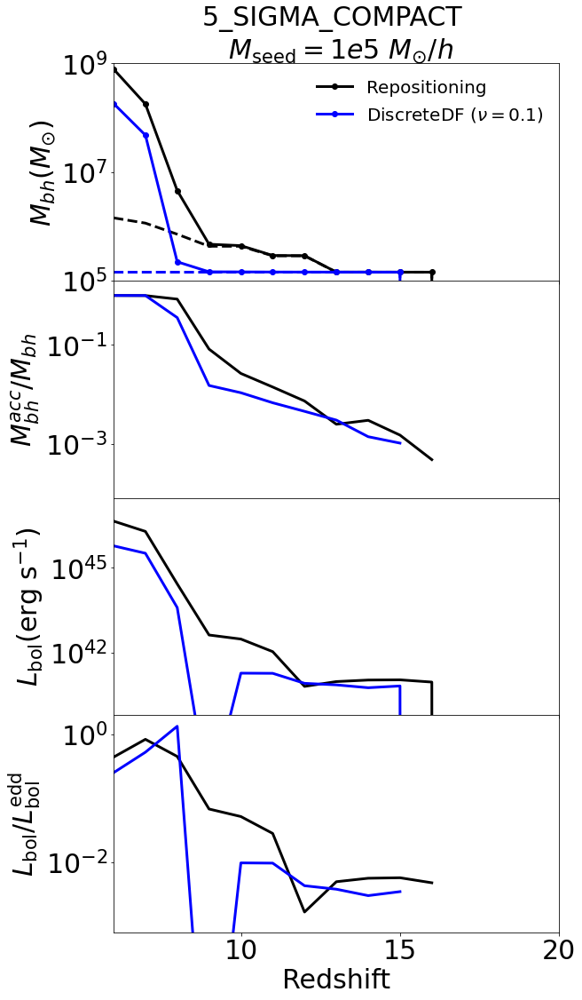

In [4]:
#from kdcount import correlate




f,axx=plt.subplots(4,1,figsize=(9,18),sharex=True)
p_type=4
desired_redshift_of_selected_halo=7
index_of_selected_halo=0
min_edge,max_edge,Nbins=-1,3,20

#arepo_package.get_particle_property(BH)
i=0
runs=['IC-L9-Ng360_RG1.0_sigma5.0_xd5.8_e15.0/SFMFGM1000_FOF3000_seed5.00_eddlim10','IC-L9-Ng360_RG1.0_sigma5.0_xd5.8_e15.0/SFMFGM1000_FOF3000_seed5.00_eddlim10_discreteDF']
#cols=['blue','red','green','cyan']
labls=['Repositioning',r'DiscreteDF ($\nu=0.1$)']

logseedmass=5.00

cols=['black','blue']

widths=[3,4,2]

for run,col,labl,width in zip(runs,cols,labls,widths):
    radiative_efficiency=0.2
    total_conv=mdot_to_Lbol.get_conversion_factor_arepo(radiative_efficiency)
    redshift_space,GroupDMMass_space,GroupGasMass_space,GroupSMMass_space,GroupBHMass_space,Group5Mass_space,GroupSFR_space,BlackholeMass_space,BlackholeDensity_space,SoundSpeed_space,BH_Mdot_space,BH_Progs_space=numpy.load('../arepo_code_development/matter_density/%s.npy'%run,allow_pickle=True)
    print(total_conv)


    hubble=0.7
    sectoyrs=3.171e-08
    kpchtom=3.0857e19/hubble
    Grav_constant=6.67e-11
    kpctoMpc=0.001
    kmtom=1000
    Mass_of_sun=2e30
    cs_unit_conv=1000
    conversion_factor=(4*3.14*Grav_constant**2*(Mass_of_sun/hubble)**3/cs_unit_conv**3/kpchtom**3)/Mass_of_sun/sectoyrs * (1+redshift_space)**3


    BlackholeMass_space*=1e10

    axx[0].errorbar(redshift_space,BlackholeMass_space/hubble,label=labl,linewidth=3,color=col,marker='o')

    BlackholeSeedMass=BH_Progs_space*10**logseedmass
    
    axx[0].errorbar(redshift_space,BlackholeSeedMass/hubble,linewidth=3,color=col,linestyle='dashed')

    AccretionFraction=(BlackholeMass_space-BlackholeSeedMass)/BlackholeMass_space
    axx[1].errorbar(redshift_space,AccretionFraction,linewidth=3,color=col,linestyle='solid')

    
    Lbol_space=BH_Mdot_space*total_conv/(1e10/0.978/1e9)
    axx[2].errorbar(redshift_space,Lbol_space,label='AREPO',linewidth=3,color=col)
    Edd_space=Lbol_space/BlackholeMass_space/1.26e38*0.6771
    axx[3].errorbar(redshift_space,Edd_space,label='AREPO',linewidth=3,color=col)

    
    #axx[3,1].errorbar(redshift_space,SoundSpeed_space,label='AREPO',linewidth=3,color=col)
    #axx[4,1].errorbar(redshift_space,BlackholeMass_space**2 * BlackholeDensity_space * 1e30/ SoundSpeed_space**3 * conversion_factor,linewidth=3,color=col,linestyle='dotted')
    #M_edd=BlackholeMass_space*1.26e38/total_conv*(1e10/0.978/1e9)*1e10
    #axx[4,1].errorbar(redshift_space,M_edd*1.2,linewidth=3,linestyle='dashed',color=col)


    #axx[5,1].errorbar(redshift_space,BlackholeMass_space**2 * BlackholeDensity_space * 1e30/ SoundSpeed_space**3 * conversion_factor*100,label='AREPO',linewidth=3)

    #axx[5,1].errorbar(redshift_space,M_edd,label='AREPO',linewidth=3)
    #axx[4,1].errorbar(redshift_space,BH_Mdot_space,linewidth=3,color=col)
    #axx[5,1].errorbar(redshift_space,BH_Mdot_space,label='AREPO',linewidth=3,color=col)

    #axx[0].axvline(7,linestyle='dashed')
    #axx[1].axvline(7,linestyle='dashed')
    #axx[2].axvline(7,linestyle='dashed')
    #axx[3].axvline(7,linestyle='dashed')
    
    axx[0].set_ylim(1e5,1e9)
    

    
    axx[1].set_ylim(8e-5,2.0)

    axx[2].set_ylim(6e39,3e47)
    
    axx[3].set_ylim(8e-4,2)




axx[0].set_yscale('log')
axx[1].set_yscale('log')
axx[2].set_yscale('log')
axx[3].set_yscale('log')


for i in range(0,4):
    axx[i].tick_params(labelsize=30)
    axx[i].set_xlim(6,20)
    #axx[1].tick_params(labelsize=30)
axx[0].set_ylabel('$M_{bh}(M_{\odot})$',fontsize=30)
axx[1].set_ylabel('$M_{bh}^{acc}/M_{bh}$',fontsize=30)
#axx[2].set_ylabel('$M_{*}(M_{\odot}/h)$',fontsize=30)

axx[2].set_ylabel('$L_{\mathrm{bol}}(\mathrm{erg \ s^{-1}})$',fontsize=30)
axx[3].set_ylabel('$L_{\mathrm{bol}}/L_{\mathrm{bol}}^{\mathrm{edd}}$',fontsize=30)


axx[0].set_title('5_SIGMA_COMPACT \n $M_{\mathrm{seed}}=1e5 \ M_{\odot}/h$',fontsize=30)
axx[0].legend(loc='upper right',fontsize=20,frameon=False)

axx[3].set_xlabel('Redshift',fontsize=30)

plt.subplots_adjust(hspace=0,wspace=0.5)

#plt.savefig('./Paper4_figures/TNG_seed_model.png',bbox_inches='tight')


    

plt.savefig('./Paper4_figures/varyingmsfmp.png',bbox_inches='tight')


    

1.1685655857435003e+47
1.1685655857435003e+47


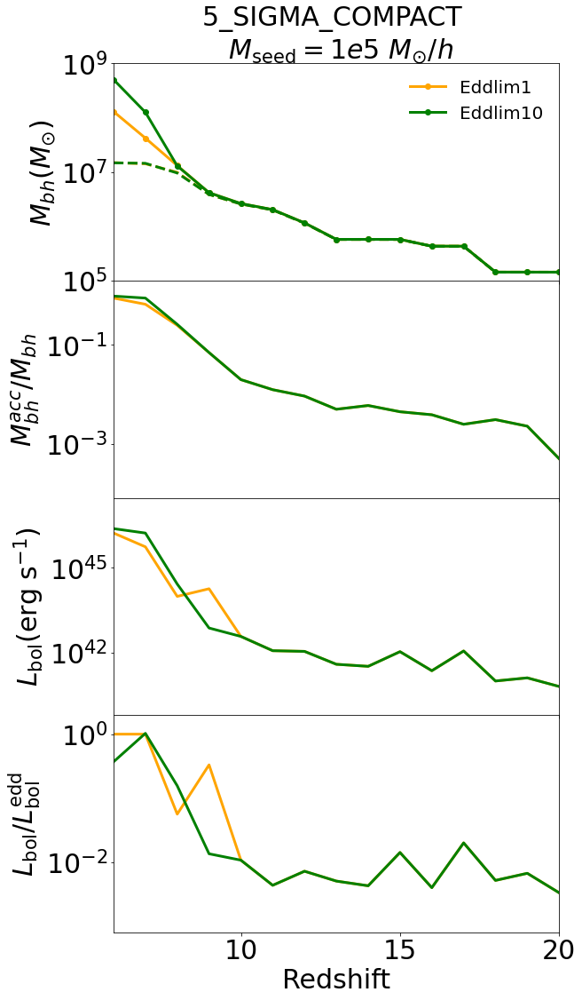

In [14]:
#from kdcount import correlate




f,axx=plt.subplots(4,1,figsize=(9,18),sharex=True)
p_type=4
desired_redshift_of_selected_halo=7
index_of_selected_halo=0
min_edge,max_edge,Nbins=-1,3,20

#arepo_package.get_particle_property(BH)
i=0
runs=['IC-L9-Ng360_RG1.0_sigma5.0_xd5.8_e15.0/SFMFGM5_FOF10_seed5.00_discreteDF','IC-L9-Ng360_RG1.0_sigma5.0_xd5.8_e15.0/SFMFGM5_FOF10_seed5.00_eddlim10_discreteDF']
#cols=['blue','red','green','cyan']
labls=['Eddlim1',r'Eddlim10']

logseedmass=5.00

cols=['orange','green']

widths=[3,4,2]

for run,col,labl,width in zip(runs,cols,labls,widths):
    radiative_efficiency=0.2
    total_conv=mdot_to_Lbol.get_conversion_factor_arepo(radiative_efficiency)
    redshift_space,GroupDMMass_space,GroupGasMass_space,GroupSMMass_space,GroupBHMass_space,Group5Mass_space,GroupSFR_space,BlackholeMass_space,BlackholeDensity_space,SoundSpeed_space,BH_Mdot_space,BH_Progs_space=numpy.load('../arepo_code_development/matter_density/%s.npy'%run,allow_pickle=True)
    print(total_conv)


    hubble=0.7
    sectoyrs=3.171e-08
    kpchtom=3.0857e19/hubble
    Grav_constant=6.67e-11
    kpctoMpc=0.001
    kmtom=1000
    Mass_of_sun=2e30
    cs_unit_conv=1000
    conversion_factor=(4*3.14*Grav_constant**2*(Mass_of_sun/hubble)**3/cs_unit_conv**3/kpchtom**3)/Mass_of_sun/sectoyrs * (1+redshift_space)**3


    BlackholeMass_space*=1e10

    axx[0].errorbar(redshift_space,BlackholeMass_space/hubble,label=labl,linewidth=3,color=col,marker='o')

    BlackholeSeedMass=BH_Progs_space*10**logseedmass
    
    axx[0].errorbar(redshift_space,BlackholeSeedMass/hubble,linewidth=3,color=col,linestyle='dashed')

    AccretionFraction=(BlackholeMass_space-BlackholeSeedMass)/BlackholeMass_space
    axx[1].errorbar(redshift_space,AccretionFraction,linewidth=3,color=col,linestyle='solid')

    
    Lbol_space=BH_Mdot_space*total_conv/(1e10/0.978/1e9)
    axx[2].errorbar(redshift_space,Lbol_space,label='AREPO',linewidth=3,color=col)
    Edd_space=Lbol_space/BlackholeMass_space/1.26e38*0.6771
    axx[3].errorbar(redshift_space,Edd_space,label='AREPO',linewidth=3,color=col)

    
    #axx[3,1].errorbar(redshift_space,SoundSpeed_space,label='AREPO',linewidth=3,color=col)
    #axx[4,1].errorbar(redshift_space,BlackholeMass_space**2 * BlackholeDensity_space * 1e30/ SoundSpeed_space**3 * conversion_factor,linewidth=3,color=col,linestyle='dotted')
    #M_edd=BlackholeMass_space*1.26e38/total_conv*(1e10/0.978/1e9)*1e10
    #axx[4,1].errorbar(redshift_space,M_edd*1.2,linewidth=3,linestyle='dashed',color=col)


    #axx[5,1].errorbar(redshift_space,BlackholeMass_space**2 * BlackholeDensity_space * 1e30/ SoundSpeed_space**3 * conversion_factor*100,label='AREPO',linewidth=3)

    #axx[5,1].errorbar(redshift_space,M_edd,label='AREPO',linewidth=3)
    #axx[4,1].errorbar(redshift_space,BH_Mdot_space,linewidth=3,color=col)
    #axx[5,1].errorbar(redshift_space,BH_Mdot_space,label='AREPO',linewidth=3,color=col)

    #axx[0].axvline(7,linestyle='dashed')
    #axx[1].axvline(7,linestyle='dashed')
    #axx[2].axvline(7,linestyle='dashed')
    #axx[3].axvline(7,linestyle='dashed')
    
    axx[0].set_ylim(1e5,1e9)
    

    
    axx[1].set_ylim(8e-5,2.0)

    axx[2].set_ylim(6e39,3e47)
    
    axx[3].set_ylim(8e-4,2)




axx[0].set_yscale('log')
axx[1].set_yscale('log')
axx[2].set_yscale('log')
axx[3].set_yscale('log')


for i in range(0,4):
    axx[i].tick_params(labelsize=30)
    axx[i].set_xlim(6,20)
    #axx[1].tick_params(labelsize=30)
axx[0].set_ylabel('$M_{bh}(M_{\odot})$',fontsize=30)
axx[1].set_ylabel('$M_{bh}^{acc}/M_{bh}$',fontsize=30)
#axx[2].set_ylabel('$M_{*}(M_{\odot}/h)$',fontsize=30)

axx[2].set_ylabel('$L_{\mathrm{bol}}(\mathrm{erg \ s^{-1}})$',fontsize=30)
axx[3].set_ylabel('$L_{\mathrm{bol}}/L_{\mathrm{bol}}^{\mathrm{edd}}$',fontsize=30)


axx[0].set_title('5_SIGMA_COMPACT \n $M_{\mathrm{seed}}=1e5 \ M_{\odot}/h$',fontsize=30)
axx[0].legend(loc='upper right',fontsize=20,frameon=False)

axx[3].set_xlabel('Redshift',fontsize=30)

plt.subplots_adjust(hspace=0,wspace=0.5)

#plt.savefig('./Paper4_figures/TNG_seed_model.png',bbox_inches='tight')


    

plt.savefig('./Paper4_figures/varyingmsfmp.png',bbox_inches='tight')


    